In [8]:
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import os
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import r2_score
import random
from google.colab import drive

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score
from tensorflow.keras.models import Sequential
#from tensorflow.keras.layers import MLP, Dense, Input
from tensorflow.keras.optimizers import Adam
import math

#from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input, Flatten
from tensorflow.keras.layers import LSTM
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint

# ============================================================
#  ✅ DEVICE
# ============================================================
device = "/gpu:0" if tf.config.list_physical_devices('GPU') else "/cpu:0"
print(f"✅ Using device: {device}")

# ============== MÉTRICAS ============================
def eqmn1(y_true, y_pred):
    return np.mean((y_pred - y_true)**2) / (np.var(y_true) + 1e-12)

def eqmn2(y_true, y_pred):
    y_persist = np.roll(y_true, 1)
    y_persist[0] = y_true[0]
    mse_model = np.mean((y_pred - y_true)**2)
    mse_pers  = np.mean((y_persist - y_true)**2) + 1e-12
    return mse_model / mse_pers


def calcular_eqmn1_eqmn2(y_real, y_pred):
    mse_modelo = np.mean((y_pred - y_real)**2)

    media_real = np.mean(y_real)
    var_real = np.mean((y_real - media_real)**2)
    eqmn1 = mse_modelo / var_real

    y_persistente = np.roll(y_real, 1)
    y_persistente[0] = y_real[0]  # corrige a primeira posição
    mse_persistente = np.mean((y_persistente - y_real)**2)
    eqmn2 = mse_modelo / mse_persistente

    return eqmn1, eqmn2

# Monta o Google Drive
drive.mount('/content/drive')
FILE_PATH_1 = '/content/drive/MyDrive/Colab Notebooks/MESTRADO/DORADO/20251001073515-used-2026.csv'
df = pd.read_csv(FILE_PATH_1)
df.head()


✅ Using device: /cpu:0
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,object type,object,indicator,value,time
0,Storage Pool,StoragePool001,Used capacity(MB),3.072367e+08,2024-09-14 00:00:00
1,Storage Pool,StoragePool001,Used capacity(MB),3.045763e+08,2024-09-15 00:00:00
2,Storage Pool,StoragePool001,Used capacity(MB),3.041931e+08,2024-09-16 00:00:00
3,Storage Pool,StoragePool001,Used capacity(MB),3.063394e+08,2024-09-17 00:00:00
4,Storage Pool,StoragePool001,Used capacity(MB),3.096994e+08,2024-09-18 00:00:00


In [9]:
# Converte a coluna 'time' para datetime
#df['time'] = pd.to_datetime(df['time'], errors='coerce')

# Converte valores para numérico
#df['value'] = pd.to_numeric(df['value'], errors='coerce')

# Filtra apenas o indicador desejado
#serie = df[df['indicator'] == 'Used capacity(MB)'].copy()
#serie = serie.sort_values('time')

# Converte MB -> GB decimal
#serie['value_GB'] = serie['value'] / 1000

# Mantém 80% inicial da série
#cutoff = int(len(serie) * 0.8)
#cutoff2 = int(len(serie) * 0.3)
#serie = serie.iloc[:cutoff]
#serie = serie.iloc[cutoff2:]


'''
# Plota
plt.figure(figsize=(14,6))
plt.plot(serie['time'], serie['value_GB'], label='Used Capacity (GB)')
plt.title('Used Capacity ao longo do tempo')
plt.xlabel('Data')
plt.ylabel('Capacidade (GB)')
plt.grid(True)
plt.legend()
plt.show()
'''

"\n# Plota\nplt.figure(figsize=(14,6))\nplt.plot(serie['time'], serie['value_GB'], label='Used Capacity (GB)')\nplt.title('Used Capacity ao longo do tempo')\nplt.xlabel('Data')\nplt.ylabel('Capacidade (GB)')\nplt.grid(True)\nplt.legend()\nplt.show()\n"

In [10]:
# ============================================================
#  ✅ CONFIG
# ============================================================
#FILE_PATH_1 = "Used-data-2025-10-15-21_11_53.csv"
#FILE_PATH_2 = "Used-data-2025-11-07-17_39_45.csv"
#FILE_PATH_3 = "Used-data-2026-01-07-09_59_59.csv"

TARGET_COLUMN = "value"
BEST_WINDOW_MLP = 24
BEST_WINDOW_LSTM = 24
BEST_WINDOW_GRU = 24
BEST_WINDOW_PINN = 24
BEST_WINDOW_TFKAN = 24
EPOCHS_MLP = 200
EPOCHS_LSTM = 200
EPOCHS_GRU = 200
EPOCHS_PINN = 200
EPOCHS_TFKAN = 200
BATCH_SIZE_MLP = 64
BATCH_SIZE_LSTM = 64
BATCH_SIZE_GRU = 64
BATCH_SIZE_PINN = 64
BATCH_SIZE_TFKAN = 64
FORECAST_DAYS = 360

RELOAD = 1
SAVE = 0

BASE_PATH = "/content/drive/MyDrive/Colab Notebooks/MESTRADO/1-TESE/360/12-jun-2026"

df = df.sort_values("time").reset_index(drop=True)

# Try to detect if there is a time column
if "time" in df.columns:
    df["time"] = pd.to_datetime(df["time"], errors="coerce")
    df = df.dropna(subset=["time"])
    interval = df["time"].diff().median()
    print(f"⏱️ Detected sampling interval: {interval}")
else:
    interval = pd.Timedelta(hours=1)  # fallback assumption
    print("⚠️ No 'Time' column detected — assuming hourly data.")

# Determine if hourly or daily
if interval <= pd.Timedelta(hours=1, minutes=5):
    time_unit = "hour"
    steps_per_day = 24
elif interval <= pd.Timedelta(hours=25):
    time_unit = "day"
    steps_per_day = 1
else:
    time_unit = "unknown"
    steps_per_day = 1
print(f"📏 Detected granularity: {time_unit}-level data")

# Convert logical forecast in days → actual forecast steps
FORECAST_STEPS = FORECAST_DAYS * steps_per_day
print(f"🔮 Forecast horizon: {FORECAST_DAYS} days = {FORECAST_STEPS} {time_unit}s\n")


⏱️ Detected sampling interval: 1 days 00:00:00
📏 Detected granularity: day-level data
🔮 Forecast horizon: 360 days = 360 days



In [11]:
# ============================================================
#  ✅ DIFFERENCING & NORMALIZATION
# ============================================================
#df['value'] = pd.to_numeric(df['value'], errors='coerce')
#series = df[TARGET_COLUMN].astype(float).values

#series = df[df['indicator'] == 'Used capacity(MB)'].copy()

# Diferenciação
#diff_series = np.diff(series).reshape(-1, 1)

# Tamanho do treino (ex: 80%)
#train_size = int(len(diff_series) * 0.8)

#diff_train = diff_series[:train_size]
#diff_test   = diff_series[train_size:]



df['time'] = pd.to_datetime(df['time'], errors='coerce')
df['value'] = pd.to_numeric(df['value'], errors='coerce')

serie = df[df['indicator'] == 'Used capacity(MB)'].copy()
serie = serie.sort_values('time')
serie = serie.dropna(subset=['time', 'value'])

# opcional: MB -> GB
serie['value_GB'] = serie['value'] / 1000

series = serie['value_GB'].astype(float).values

# diferenciação
diff_series = np.diff(series).reshape(-1, 1)

# split temporal 80/20
train_size = int(len(diff_series) * 0.8)

diff_train = diff_series[:train_size]
diff_test  = diff_series[train_size:]




#Ajustar o scaler somente no treino
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(-1, 1))
scaler.fit(diff_train)     # ✅ correto

#Normalizar treino e validação separadamente
diff_train_norm = scaler.transform(diff_train)
diff_test_norm   = scaler.transform(diff_test)

diff_norm = diff_train_norm   # <-- cria o nome que sua função espera

def create_windows(data, window, add_channel=False):
    """
    data: (T,1)
    Returns:
      X: (N, window)          if add_channel=False
         (N, window, 1)       if add_channel=True
      y: (N, 1)
    """
    X, y = [], []
    for i in range(len(data) - window):
        x_win = data[i:i+window]          # (window,1)
        y_t   = data[i+window]            # (1,)
        if add_channel:
            X.append(x_win)               # keep (window,1)
        else:
            X.append(x_win[:, 0])          # flatten to (window,)
        y.append(y_t[0])                   # scalar
    X = np.array(X)
    y = np.array(y).reshape(-1, 1)
    return X, y

# MLP (2D)
X_train_mlp, y_train_mlp = create_windows(diff_train_norm, BEST_WINDOW_MLP, add_channel=False)
X_test_mlp,  y_test_mlp  = create_windows(diff_test_norm,  BEST_WINDOW_MLP, add_channel=False)

# LSTM (3D)
X_train_lstm, y_train_lstm = create_windows(diff_train_norm, BEST_WINDOW_LSTM, add_channel=True)
X_test_lstm,  y_test_lstm  = create_windows(diff_test_norm,  BEST_WINDOW_LSTM, add_channel=True)

# GRU (3D)
X_train_gru, y_train_gru = create_windows(diff_train_norm, BEST_WINDOW_GRU, add_channel=True)
X_test_gru,  y_test_gru  = create_windows(diff_test_norm,  BEST_WINDOW_GRU, add_channel=True)

# PINN (3D)
X_train_pinn, y_train_pinn = create_windows(diff_train_norm, BEST_WINDOW_PINN, add_channel=True)
X_test_pinn,  y_test_pinn  = create_windows(diff_test_norm,  BEST_WINDOW_PINN, add_channel=True)

# TFKAN (3D)
X_train_tfkan, y_train_tfkan = create_windows(diff_train_norm, BEST_WINDOW_TFKAN, add_channel=True)
X_test_tfkan,  y_test_tfkan  = create_windows(diff_test_norm,  BEST_WINDOW_TFKAN, add_channel=True)


In [12]:
print("series:", series.shape)
print("diff_norm:", diff_norm.shape)
print("diff_train_norm:", diff_train_norm.shape)
print("diff_test_norm:", diff_test_norm.shape)
print("window MLP:", BEST_WINDOW_MLP)
print("window_LSTM:", BEST_WINDOW_LSTM)
print("window_GRU:", BEST_WINDOW_GRU)
print("window_PINN:", BEST_WINDOW_PINN)
print("window_TFKAN:", BEST_WINDOW_TFKAN)

series: (639,)
diff_norm: (510, 1)
diff_train_norm: (510, 1)
diff_test_norm: (128, 1)
window MLP: 24
window_LSTM: 24
window_GRU: 24
window_PINN: 24
window_TFKAN: 24


# DATASET

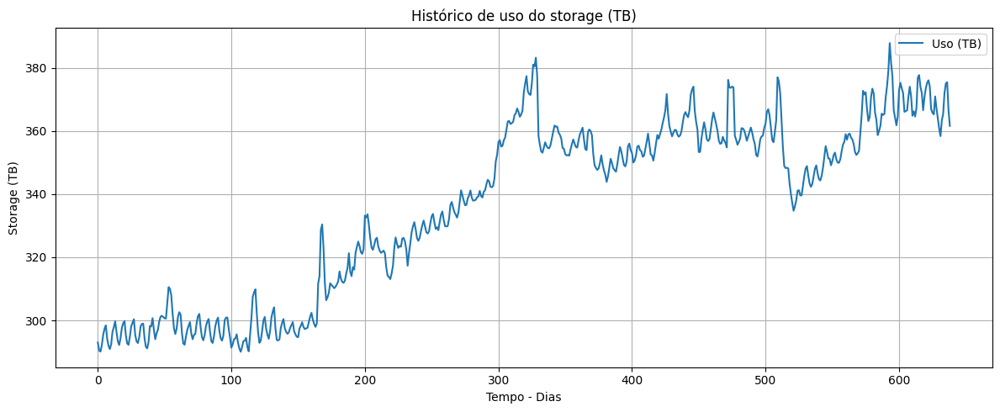

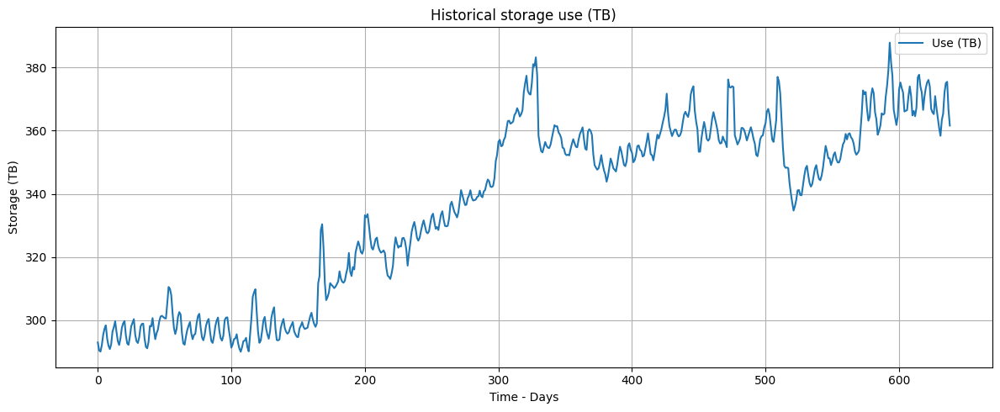

In [13]:
# ============================================================
#  ✅ PLOT DATA
# ============================================================
#TO_TB = 1e12   # TB decimal (use 1024**4 se quiser TiB)

#y_tb = df[TARGET_COLUMN].values / TO_TB

y_tb = df['value']  / (1024 * 1024)

# ============================================================
#  ✅ PLOT DATA
# ============================================================

# ============================================================
plt.figure(figsize=(12, 5))
if "Time" in df.columns:
    plt.plot(df["Time"], y_tb, label="Uso (TB)")
    plt.xlabel("Tempo")
else:
    plt.plot(y_tb, label="Uso (TB)")
    plt.xlabel("Tempo - Dias")

plt.ylabel("Storage (TB)")
plt.title("Histórico de uso do storage (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("ecs-dataset-pt.png", dpi=300)  # 👈 salva em alta qualidade
plt.show()


plt.figure(figsize=(12, 5))
if "Time" in df.columns:
    plt.plot(df["Time"], y_tb, label="Use (TB)")
    plt.xlabel("Time")
else:
    plt.plot(y_tb, label="Use (TB)")
    plt.xlabel("Time - Days")

plt.ylabel("Storage (TB)")
plt.title("Historical storage use (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("ecs-dataset-en.png", dpi=300)  # 👈 salva em alta qualidade
plt.show()

# MLP

In [14]:
# ============================================================
#  ✅ MODEL MLP
# ============================================================
if RELOAD == 0:
    def build_mlp(window):
        model = Sequential([
            Input(shape=(window, 1)),   # mesma forma usada no LSTM
            Flatten(),                  # achata (window, 1) -> (window,)
            Dense(128, activation='relu'),
            Dense(64, activation='relu'),
            Dense(1, activation='linear') # saída escalar
        ])
        optimizer = Adam(learning_rate=1e-5, clipnorm=1.0)
        model.compile(optimizer=optimizer, loss='mse')
        return model

    # ============================================================
    #  ✅ TREINO MLP
    # ============================================================
    with tf.device(device):
        model_mlp = build_mlp(BEST_WINDOW_MLP)
        history = model_mlp.fit(
            X_train_mlp, y_train_mlp,
            epochs=EPOCHS_MLP,
            batch_size=BATCH_SIZE_MLP,
            validation_data=(X_test_mlp, y_test_mlp),
            verbose=1
        )

    # perdas por época
    train_losses_mlp = history.history['loss']
    test_losses_mlp  = history.history['val_loss']


In [15]:
if RELOAD == 1:
    # ============================================================
    # 🔄 RELOAD EVERYTHING - MLP
    # ============================================================

    import os
    import json
    import joblib
    import numpy as np
    from tensorflow.keras.models import load_model

    MODEL_NAME = "mlp"

    # ============================================================
    # FILE PATHS
    # ============================================================
    FILE_MODEL              = f"{BASE_PATH}/{MODEL_NAME}_model.keras"
    FILE_SCALER             = f"{BASE_PATH}/{MODEL_NAME}_scaler.save"
    FILE_CONFIG             = f"{BASE_PATH}/{MODEL_NAME}_config.json"
    FILE_METRICS            = f"{BASE_PATH}/{MODEL_NAME}_metrics.json"

    FILE_TRAIN_LOSS         = f"{BASE_PATH}/train_losses_{MODEL_NAME}.npy"
    FILE_VAL_LOSS           = f"{BASE_PATH}/val_losses_{MODEL_NAME}.npy"

    FILE_X_TRAIN            = f"{BASE_PATH}/X_train_{MODEL_NAME}.npy"
    FILE_Y_TRAIN            = f"{BASE_PATH}/y_train_{MODEL_NAME}.npy"
    FILE_X_TEST             = f"{BASE_PATH}/X_test_{MODEL_NAME}.npy"
    FILE_Y_TEST             = f"{BASE_PATH}/y_test_{MODEL_NAME}.npy"

    FILE_Y_TRAIN_INV        = f"{BASE_PATH}/y_train_inv_{MODEL_NAME}.npy"
    FILE_Y_PRED_TRAIN_INV   = f"{BASE_PATH}/y_pred_train_inv_{MODEL_NAME}.npy"
    FILE_Y_TEST_INV         = f"{BASE_PATH}/y_test_inv_{MODEL_NAME}.npy"
    FILE_Y_PRED_INV         = f"{BASE_PATH}/y_pred_inv_{MODEL_NAME}.npy"

    FILE_Y_TEST_ABS         = f"{BASE_PATH}/y_test_abs_{MODEL_NAME}.npy"
    FILE_Y_PRED_ABS         = f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}.npy"
    FILE_Y_TEST_ABS_TB      = f"{BASE_PATH}/y_test_abs_{MODEL_NAME}_tb.npy"
    FILE_Y_PRED_ABS_TB      = f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}_tb.npy"

    FILE_FORECAST_DIFFS     = f"{BASE_PATH}/forecast_diffs_{MODEL_NAME}.npy"
    FILE_FORECAST_DIFFS_INV = f"{BASE_PATH}/forecast_diffs_inv_{MODEL_NAME}.npy"
    FILE_FORECAST_ABS       = f"{BASE_PATH}/forecast_abs_{MODEL_NAME}.npy"
    FILE_FORECAST_TB        = f"{BASE_PATH}/forecast_tb_{MODEL_NAME}.npy"

    FILE_SERIES             = f"{BASE_PATH}/series_original.npy"
    FILE_DIFF_SERIES        = f"{BASE_PATH}/diff_series.npy"
    FILE_DIFF_TRAIN         = f"{BASE_PATH}/diff_train.npy"
    FILE_DIFF_TEST          = f"{BASE_PATH}/diff_test.npy"
    FILE_DIFF_TRAIN_NORM    = f"{BASE_PATH}/diff_train_norm.npy"
    FILE_DIFF_TEST_NORM     = f"{BASE_PATH}/diff_test_norm.npy"

    FILE_LAST_WINDOW        = f"{BASE_PATH}/last_window_{MODEL_NAME}.npy"
    FILE_RECON_INFO         = f"{BASE_PATH}/reconstruction_info_{MODEL_NAME}.json"

    # ============================================================
    # LOAD CORE
    # ============================================================
    model_mlp = load_model(FILE_MODEL)
    scaler = joblib.load(FILE_SCALER)

    with open(FILE_CONFIG, "r") as f:
        config_mlp = json.load(f)

    with open(FILE_METRICS, "r") as f:
        metrics_mlp = json.load(f)

    BEST_WINDOW_MLP = config_mlp["window"]
    EPOCHS_MLP      = config_mlp["epochs"]
    BATCH_SIZE_MLP  = config_mlp["batch_size"]
    FORECAST_STEPS  = config_mlp["forecast_steps"]
    FORECAST_DAYS   = config_mlp["forecast_days"]
    time_unit       = config_mlp["time_unit"]
    split           = config_mlp["train_size"]

    # ============================================================
    # LOAD HISTORY
    # ============================================================
    train_losses_mlp = np.load(FILE_TRAIN_LOSS)
    test_losses_mlp  = np.load(FILE_VAL_LOSS)

    # ============================================================
    # LOAD ARRAYS
    # ============================================================
    X_train_mlp = np.load(FILE_X_TRAIN)
    y_train_mlp = np.load(FILE_Y_TRAIN)
    X_test_mlp  = np.load(FILE_X_TEST)
    y_test_mlp  = np.load(FILE_Y_TEST)

    y_train_inv_mlp      = np.load(FILE_Y_TRAIN_INV)
    y_pred_train_inv_mlp = np.load(FILE_Y_PRED_TRAIN_INV)
    y_test_inv_mlp       = np.load(FILE_Y_TEST_INV)
    y_pred_inv_mlp       = np.load(FILE_Y_PRED_INV)

    y_test_abs_mlp    = np.load(FILE_Y_TEST_ABS)
    y_pred_abs_mlp    = np.load(FILE_Y_PRED_ABS)
    y_test_abs_mlp_tb = np.load(FILE_Y_TEST_ABS_TB)
    y_pred_abs_mlp_tb = np.load(FILE_Y_PRED_ABS_TB)

    forecast_diffs_mlp     = np.load(FILE_FORECAST_DIFFS)
    forecast_diffs_inv_mlp = np.load(FILE_FORECAST_DIFFS_INV)
    forecast_abs_mlp       = np.load(FILE_FORECAST_ABS)
    forecast_abs_mlp_tb    = np.load(FILE_FORECAST_TB)

    series          = np.load(FILE_SERIES)
    diff_series     = np.load(FILE_DIFF_SERIES)
    diff_train      = np.load(FILE_DIFF_TRAIN)
    diff_test       = np.load(FILE_DIFF_TEST)
    diff_train_norm = np.load(FILE_DIFF_TRAIN_NORM)
    diff_test_norm  = np.load(FILE_DIFF_TEST_NORM)

    last_window_mlp = np.load(FILE_LAST_WINDOW) if os.path.exists(FILE_LAST_WINDOW) else None

    with open(FILE_RECON_INFO, "r") as f:
        reconstruction_info_mlp = json.load(f)

    base_value = reconstruction_info_mlp["base_value"]
    series_last_value = reconstruction_info_mlp["series_last_value"]

    # ============================================================
    # OPTIONAL RECOMPUTE
    # ============================================================
    y_pred_mlp_recomputed = model_mlp.predict(X_test_mlp, verbose=0)

    # ============================================================
    # SUMMARY
    # ============================================================
    print("\n✅ RELOAD EVERYTHING - MLP COMPLETED")
    print(f"Base path              : {BASE_PATH}")
    print(f"Model                  : {MODEL_NAME}")
    print(f"Window                 : {BEST_WINDOW_MLP}")
    print(f"Epochs                 : {EPOCHS_MLP}")
    print(f"Batch size             : {BATCH_SIZE_MLP}")
    print(f"Forecast steps         : {FORECAST_STEPS}")
    print(f"Forecast days          : {FORECAST_DAYS}")
    print(f"Time unit              : {time_unit}")

    print("\n📊 Metrics")
    print(f"Final train loss       : {metrics_mlp['final_train_loss']:.6f}")
    print(f"Final val loss         : {metrics_mlp['final_val_loss']:.6f}")
    print(f"MSE train diff         : {metrics_mlp['mse_train_diff']:.6e}")
    print(f"RMSE train diff        : {metrics_mlp['rmse_train_diff']:.6e}")
    print(f"R² train diff          : {metrics_mlp['r2_train_diff']:.6f}")
    print(f"MSE test diff          : {metrics_mlp['mse_test_diff']:.6e}")
    print(f"RMSE test diff         : {metrics_mlp['rmse_test_diff']:.6e}")
    print(f"R² test diff           : {metrics_mlp['r2_test_diff']:.6f}")
    print(f"MSE abs                : {metrics_mlp['mse_abs']:.6e}")
    print(f"RMSE abs               : {metrics_mlp['rmse_abs']:.6e}")
    print(f"R² abs                 : {metrics_mlp['r2_abs']:.6f}")
    print(f"Final forecast TB      : {metrics_mlp['forecast_last_tb']:.3f}")

    print("\n📐 Shapes")
    print(f"X_train_mlp            : {X_train_mlp.shape}")
    print(f"y_train_mlp            : {y_train_mlp.shape}")
    print(f"X_test_mlp             : {X_test_mlp.shape}")
    print(f"y_test_mlp             : {y_test_mlp.shape}")
    print(f"y_pred_inv_mlp         : {y_pred_inv_mlp.shape}")
    print(f"y_test_abs_mlp         : {y_test_abs_mlp.shape}")
    print(f"forecast_abs_mlp_tb    : {forecast_abs_mlp_tb.shape}")

    # ============================================================
    # PACKAGE EVERYTHING
    # ============================================================
    artifacts_mlp = locals()

    print("\n✅ artifacts_mlp dictionary created.")


✅ RELOAD EVERYTHING - MLP COMPLETED
Base path              : /content/drive/MyDrive/Colab Notebooks/MESTRADO/1-TESE/360/12-jun-2026
Model                  : mlp
Window                 : 24
Epochs                 : 200
Batch size             : 64
Forecast steps         : 360
Forecast days          : 360
Time unit              : day

📊 Metrics
Final train loss       : 0.013012
Final val loss         : 0.020413
MSE train diff         : 5.869222e+06
RMSE train diff        : 2.422648e+03
R² train diff          : 0.444334
MSE test diff          : 9.216950e+06
RMSE test diff         : 3.035943e+03
R² test diff           : 0.394895
MSE abs                : 1.937135e+08
RMSE abs               : 1.391810e+04
R² abs                 : -0.861781
Final forecast TB      : 563.707

📐 Shapes
X_train_mlp            : (486, 24)
y_train_mlp            : (486, 1)
X_test_mlp             : (104, 24)
y_test_mlp             : (104, 1)
y_pred_inv_mlp         : (104,)
y_test_abs_mlp         : (104,)
forecast_ab

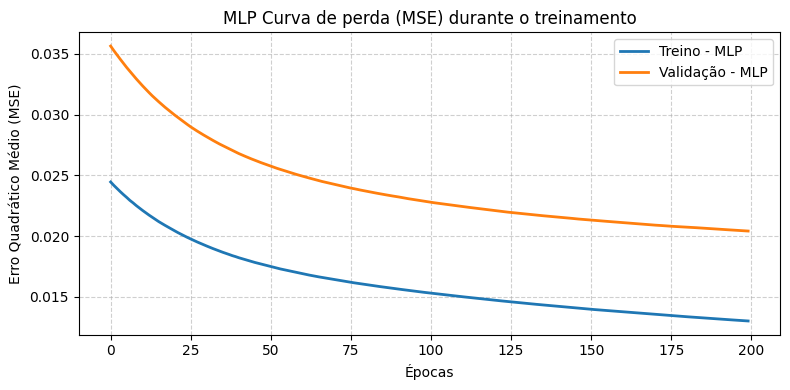

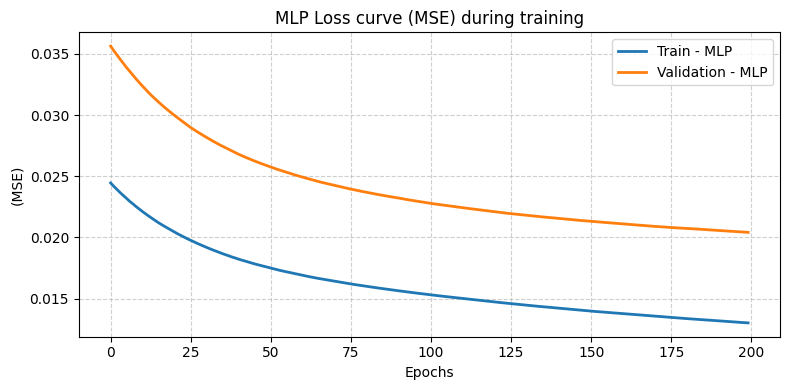

In [16]:
# ============================================================
#  ✅ MLP - CURVA DE PERDA
# ============================================================
plt.figure(figsize=(8, 4))

plt.plot(train_losses_mlp, label='Treino - MLP', linewidth=2)
plt.plot(test_losses_mlp, label='Validação - MLP', linewidth=2)

plt.title("MLP Curva de perda (MSE) durante o treinamento")
plt.xlabel("Épocas")
plt.ylabel("Erro Quadrático Médio (MSE)")

plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.savefig("mlp_loss_pt.png", dpi=300)  # 👈 salva em alta qualidade
plt.show()


plt.figure(figsize=(8, 4))

plt.plot(train_losses_mlp, label='Train - MLP', linewidth=2)
plt.plot(test_losses_mlp, label='Validation - MLP', linewidth=2)

plt.title("MLP Loss curve (MSE) during training")
plt.xlabel("Epochs")
plt.ylabel("(MSE)")

plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.savefig("mlp_loss_en.png", dpi=300)  # 👈 salva em alta qualidade
plt.show()

In [17]:
# ============================================================
#  ✅ AVALIAÇÃO TREINO vs VALIDAÇÃO
# ============================================================
def inverse_transform_and_eval(X_t, y_t):
    y_pred = model_mlp.predict(X_t, verbose=0)
    y_t_inv = scaler.inverse_transform(y_t.reshape(-1,1)).flatten()
    y_pred_inv = scaler.inverse_transform(y_pred).flatten()
    mse = mean_squared_error(y_t_inv, y_pred_inv)
    rmse = math.sqrt(mse)
    r2 = r2_score(y_t_inv, y_pred_inv)
    return y_t_inv, y_pred_inv, mse, rmse, r2

y_train_inv_mlp, y_pred_train_inv_mlp, mse_train_mlp, rmse_train_mlp, r2_train_mlp = inverse_transform_and_eval(X_train_mlp, y_train_mlp)
y_test_inv_mlp, y_pred_inv_mlp, mse_test_mlp, rmse_test_mlp, r2_test_mlp = inverse_transform_and_eval(X_test_mlp, y_test_mlp)

print("\n📊 MLP Comparação Treino vs Validação:")
print(f"{'Métrica':<10} | {'Treino':>15} | {'Validação':>15}")
print("-"*45)
print(f"{'MSE':<10} | {mse_train_mlp:>15.4e} | {mse_test_mlp:>15.4e}")
print(f"{'RMSE':<10} | {rmse_train_mlp:>15.4e} | {rmse_test_mlp:>15.4e}")
print(f"{'R²':<10} | {r2_train_mlp:>15.4f} | {r2_test_mlp:>15.4f}")

print("\n📊 MLP Comparison Train vs Validation:")
print(f"{'Metric':<10} | {'Train':>15} | {'Validation':>15}")
print("-"*45)
print(f"{'MSE':<10} | {mse_train_mlp:>15.4e} | {mse_test_mlp:>15.4e}")
print(f"{'RMSE':<10} | {rmse_train_mlp:>15.4e} | {rmse_test_mlp:>15.4e}")
print(f"{'R²':<10} | {r2_train_mlp:>15.4f} | {r2_test_mlp:>15.4f}")


📊 MLP Comparação Treino vs Validação:
Métrica    |          Treino |       Validação
---------------------------------------------
MSE        |      5.8692e+06 |      9.2169e+06
RMSE       |      2.4226e+03 |      3.0359e+03
R²         |          0.4443 |          0.3949

📊 MLP Comparison Train vs Validation:
Metric     |           Train |      Validation
---------------------------------------------
MSE        |      5.8692e+06 |      9.2169e+06
RMSE       |      2.4226e+03 |      3.0359e+03
R²         |          0.4443 |          0.3949


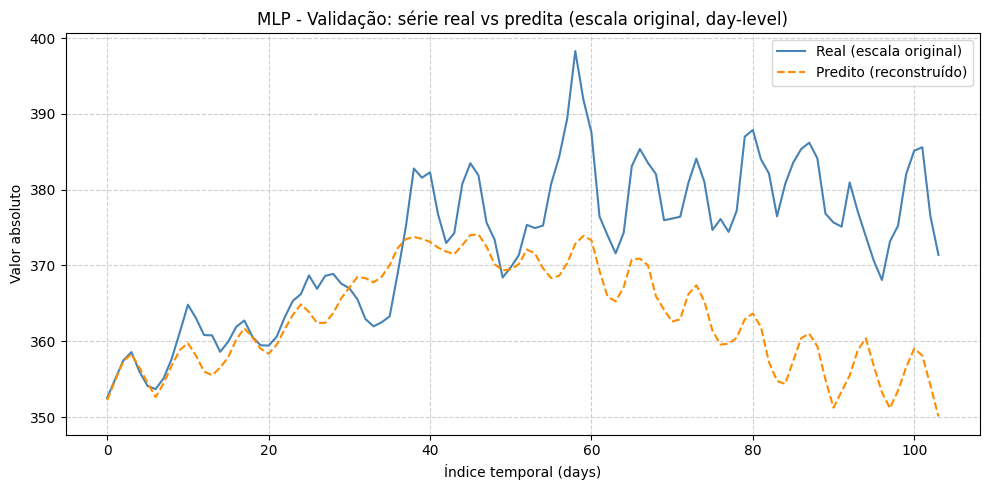

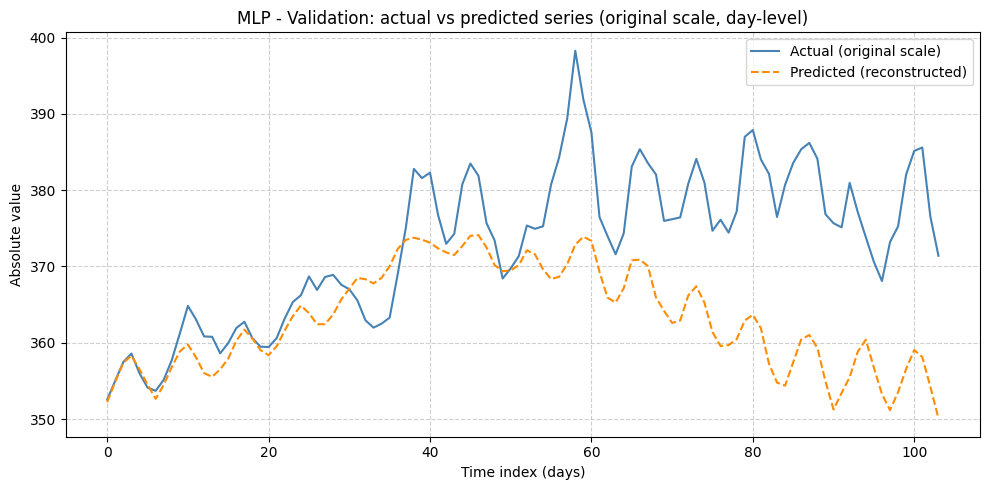


📊 MLP - Métricas em escala ABSOLUTA (reconstruída):
MSE(abs)  = 1.9371e+08
RMSE(abs) = 1.3918e+04
R²(abs)   = -0.8618
Window    = 24
Batch     = 64

📊 MLP - Metrics in ABSOLUTE scale (reconstructed):
MSE(abs)  = 1.9371e+08
RMSE(abs) = 1.3918e+04
R²(abs)   = -0.8618
Window    = 24
Batch     = 64


In [18]:
# ============================================================
#  ✅ RECONSTRUÇÃO EM ESCALA ABSOLUTA (VALIDAÇÃO)
# ============================================================
# y_test_inv e y_pred_inv já são ΔValue na escala original
# (vieram de inverse_transform_and_eval)
split = train_size
base_value = series[split + BEST_WINDOW_MLP - 1]

# reconstrói série absoluta acumulando os deltas
y_pred_abs_mlp = base_value + np.cumsum(y_pred_inv_mlp)
y_test_abs_mlp = base_value + np.cumsum(y_test_inv_mlp)

y_pred_abs_mlp_tb = y_pred_abs_mlp /1024
y_test_abs_mlp_tb = y_test_abs_mlp /1024

# Plot validation in absolute scale (consistent with main graph)
plt.figure(figsize=(10,5))
plt.plot(y_test_abs_mlp_tb, label="Real (escala original)", color='steelblue')
plt.plot(y_pred_abs_mlp_tb, label="Predito (reconstruído)", color='darkorange', linestyle='--')
plt.title(f"MLP - Validação: série real vs predita (escala original, {time_unit}-level)")
plt.xlabel(f"Índice temporal ({time_unit}s)")
plt.ylabel("Valor absoluto")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig("mlp_val_real_vs_pred-pt.png", dpi=300)  # 👈 salva em alta qualidade
plt.show()

# Plot validation in absolute scale (consistent with the main graph)
plt.figure(figsize=(10,5))
plt.plot(y_test_abs_mlp_tb, label="Actual (original scale)", color='steelblue')
plt.plot(y_pred_abs_mlp_tb, label="Predicted (reconstructed)", color='darkorange', linestyle='--')
plt.title(f"MLP - Validation: actual vs predicted series (original scale, {time_unit}-level)")
plt.xlabel(f"Time index ({time_unit}s)")
plt.ylabel("Absolute value")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig("mlp_val_real_vs_pred-en.png", dpi=300)  # 👈 salva em alta qualidade
plt.show()

# métricas também em escala absoluta (opcional)
mse_abs_mlp  = mean_squared_error(y_test_abs_mlp, y_pred_abs_mlp)
rmse_abs_mlp = math.sqrt(mse_abs_mlp)
r2_abs_mlp   = r2_score(y_test_abs_mlp, y_pred_abs_mlp)

print("\n📊 MLP - Métricas em escala ABSOLUTA (reconstruída):")
print(f"MSE(abs)  = {mse_abs_mlp:,.4e}")
print(f"RMSE(abs) = {rmse_abs_mlp:,.4e}")
print(f"R²(abs)   = {r2_abs_mlp:.4f}")
print(f"Window    = {BEST_WINDOW_MLP:}")
print(f"Batch     = {BATCH_SIZE_MLP:}")

print("\n📊 MLP - Metrics in ABSOLUTE scale (reconstructed):")
print(f"MSE(abs)  = {mse_abs_mlp:,.4e}")
print(f"RMSE(abs) = {rmse_abs_mlp:,.4e}")
print(f"R²(abs)   = {r2_abs_mlp:.4f}")
print(f"Window    = {BEST_WINDOW_MLP:}")
print(f"Batch     = {BATCH_SIZE_MLP:}")


In [19]:
#print("model input_shape:", model_mlp.input_shape)
#print("model output_shape:", model_mlp.output_shape)

#print("last_window shape:", last_window.shape, "dtype:", last_window.dtype)



📊 MLP - Forecast (em TB):
Passo 001: 369.355 TB
Passo 002: 365.887 TB
Passo 003: 365.306 TB
Passo 004: 364.726 TB
Passo 005: 365.910 TB
Passo 006: 367.501 TB
Passo 007: 368.565 TB
Passo 008: 366.768 TB
Passo 009: 364.869 TB
Passo 010: 365.409 TB
Passo 011: 366.112 TB
Passo 012: 367.160 TB
Passo 013: 368.279 TB
Passo 014: 367.731 TB
Passo 015: 366.030 TB
Passo 016: 363.382 TB
Passo 017: 363.438 TB
Passo 018: 364.263 TB
Passo 019: 367.061 TB
Passo 020: 369.374 TB
Passo 021: 369.765 TB
Passo 022: 369.996 TB
Passo 023: 368.592 TB
Passo 024: 368.534 TB
Passo 025: 369.668 TB
Passo 026: 371.746 TB
Passo 027: 373.736 TB
Passo 028: 374.439 TB
Passo 029: 373.410 TB
Passo 030: 371.769 TB
Passo 031: 371.773 TB
Passo 032: 373.108 TB
Passo 033: 375.195 TB
Passo 034: 377.041 TB
Passo 035: 377.870 TB
Passo 036: 376.813 TB
Passo 037: 375.162 TB
Passo 038: 375.138 TB
Passo 039: 376.546 TB
Passo 040: 378.807 TB
Passo 041: 380.988 TB
Passo 042: 382.118 TB
Passo 043: 381.573 TB
Passo 044: 379.869 TB
Passo

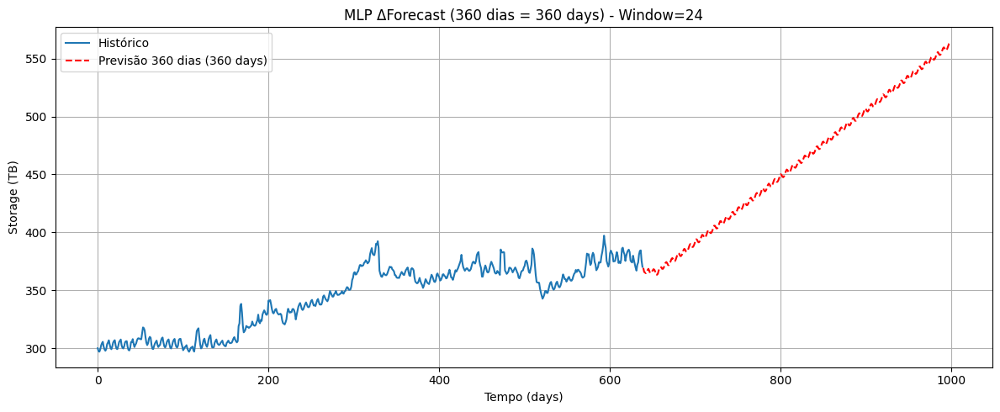

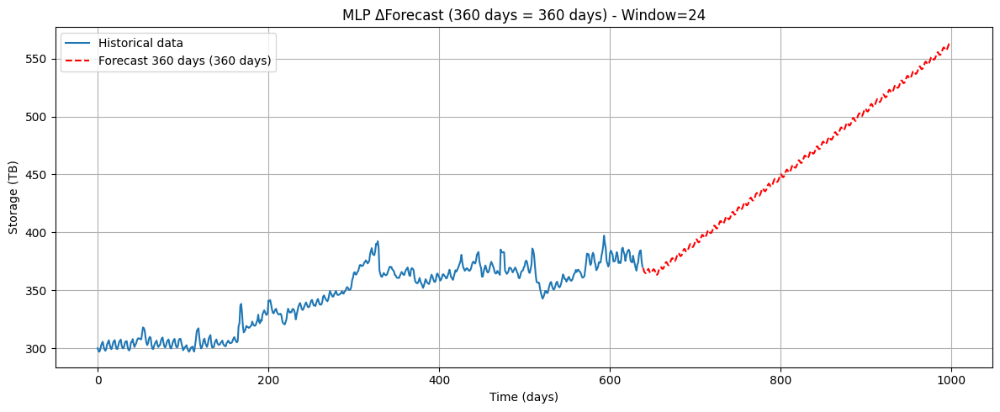

In [20]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# garante float32 desde o começo
diff_norm32_mlp = np.asarray(diff_norm, dtype=np.float32)
last_window_mlp = diff_norm32_mlp[-BEST_WINDOW_MLP:].reshape(1, BEST_WINDOW_MLP, 1)

forecast_diffs_mlp = []

for _ in range(FORECAST_STEPS):
    x = tf.convert_to_tensor(last_window_mlp, dtype=tf.float32)
    x = tf.ensure_shape(x, (1, BEST_WINDOW_MLP, 1))

    y = model_mlp(x, training=False)
    yhat = float(y.numpy().reshape(-1)[0])

    forecast_diffs_mlp.append(yhat)

    # atualiza a janela corretamente
    last_window_mlp = np.concatenate(
        [
            last_window_mlp[:, 1:, :],
            np.array(yhat, dtype=np.float32).reshape(1, 1, 1)
        ],
        axis=1
    ).astype(np.float32)

# volta para escala original
forecast_diffs_inv_mlp = scaler.inverse_transform(
    np.array(forecast_diffs_mlp, dtype=np.float32).reshape(-1, 1)
).ravel()

forecast_abs_mlp = series[-1] + np.cumsum(forecast_diffs_inv_mlp)

# converte histórico e previsão para TB
series_tb = series / 1024
forecast_abs_mlp_tb = forecast_abs_mlp / 1024

# eixo x da previsão
x_hist = np.arange(len(series_tb))
x_fore_mlp = np.arange(len(series_tb), len(series_tb) + FORECAST_STEPS)

print("\n📊 MLP - Forecast (em TB):")
for i, val in enumerate(forecast_abs_mlp_tb, start=1):
    print(f"Passo {i:03d}: {val:.3f} TB")
print(f"\n🔮 Último valor previsto ({FORECAST_DAYS} dias à frente): {forecast_abs_mlp_tb[-1]:.3f} TB")

# PT-BR
plt.figure(figsize=(12, 5))
plt.plot(x_hist, series_tb, label="Histórico")
plt.plot(
    x_fore_mlp,
    forecast_abs_mlp_tb,
    "r--",
    label=f"Previsão {FORECAST_DAYS} dias ({FORECAST_STEPS} {time_unit}s)"
)
plt.title(f"MLP ΔForecast ({FORECAST_DAYS} dias = {FORECAST_STEPS} {time_unit}s) - Window={BEST_WINDOW_MLP}")
plt.xlabel(f"Tempo ({time_unit}s)")
plt.ylabel("Storage (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("mlp_forecast-pt.png", dpi=300, bbox_inches="tight")
plt.show()

# EN
plt.figure(figsize=(12, 5))
plt.plot(x_hist, series_tb, label="Historical data")
plt.plot(
    x_fore_mlp,
    forecast_abs_mlp_tb,
    "r--",
    label=f"Forecast {FORECAST_DAYS} days ({FORECAST_STEPS} {time_unit}s)"
)
plt.title(f"MLP ΔForecast ({FORECAST_DAYS} days = {FORECAST_STEPS} {time_unit}s) - Window={BEST_WINDOW_MLP}")
plt.xlabel(f"Time ({time_unit}s)")
plt.ylabel("Storage (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("mlp_forecast-en.png", dpi=300, bbox_inches="tight")
plt.show()

In [21]:
if SAVE == 1:
    # ============================================================
    # 💾 SAVE EVERYTHING - MLP
    # ============================================================

    import os
    import json
    import shutil
    import joblib
    import numpy as np


    MODEL_NAME = "mlp"

    os.makedirs(BASE_PATH, exist_ok=True)

    # ============================================================
    # 1) SAVE MODEL
    # ============================================================
    model_mlp.save(f"{BASE_PATH}/{MODEL_NAME}_model.keras", include_optimizer=True)

    # ============================================================
    # 2) SAVE SCALER
    # ============================================================
    joblib.dump(scaler, f"{BASE_PATH}/{MODEL_NAME}_scaler.save")

    # ============================================================
    # 3) SAVE CONFIG
    # ============================================================
    config_mlp = {
        "window": int(BEST_WINDOW_MLP),
        "epochs": int(EPOCHS_MLP),
        "batch_size": int(BATCH_SIZE_MLP),
        "forecast_steps": int(FORECAST_STEPS),
        "forecast_days": int(FORECAST_DAYS),
        "time_unit": str(time_unit),
        "train_size": int(split),
        "architecture": "Input(window,1) -> Flatten -> Dense(128,relu) -> Dense(64,relu) -> Dense(1,linear)"
    }

    with open(f"{BASE_PATH}/{MODEL_NAME}_config.json", "w") as f:
        json.dump(config_mlp, f, indent=4)

    # ============================================================
    # 4) SAVE TRAINING HISTORY
    # ============================================================
    np.save(f"{BASE_PATH}/train_losses_{MODEL_NAME}.npy", np.array(train_losses_mlp, dtype=np.float64))
    np.save(f"{BASE_PATH}/val_losses_{MODEL_NAME}.npy", np.array(test_losses_mlp, dtype=np.float64))

    # ============================================================
    # 5) SAVE METRICS
    # ============================================================
    metrics_mlp = {
        "final_train_loss": float(train_losses_mlp[-1]),
        "final_val_loss": float(test_losses_mlp[-1]),

        "mse_train_diff": float(mse_train_mlp),
        "rmse_train_diff": float(rmse_train_mlp),
        "r2_train_diff": float(r2_train_mlp),

        "mse_test_diff": float(mse_test_mlp),
        "rmse_test_diff": float(rmse_test_mlp),
        "r2_test_diff": float(r2_test_mlp),

        "mse_abs": float(mse_abs_mlp),
        "rmse_abs": float(rmse_abs_mlp),
        "r2_abs": float(r2_abs_mlp),

        "forecast_last_tb": float(forecast_abs_mlp_tb[-1]),
    }

    with open(f"{BASE_PATH}/{MODEL_NAME}_metrics.json", "w") as f:
        json.dump(metrics_mlp, f, indent=4)

    # ============================================================
    # 6) SAVE DATA ARRAYS
    # ============================================================
    np.save(f"{BASE_PATH}/X_train_{MODEL_NAME}.npy", X_train_mlp)
    np.save(f"{BASE_PATH}/y_train_{MODEL_NAME}.npy", y_train_mlp)
    np.save(f"{BASE_PATH}/X_test_{MODEL_NAME}.npy", X_test_mlp)
    np.save(f"{BASE_PATH}/y_test_{MODEL_NAME}.npy", y_test_mlp)

    # escala original (deltas invertidos)
    np.save(f"{BASE_PATH}/y_train_inv_{MODEL_NAME}.npy", y_train_inv_mlp)
    np.save(f"{BASE_PATH}/y_pred_train_inv_{MODEL_NAME}.npy", y_pred_train_inv_mlp)
    np.save(f"{BASE_PATH}/y_test_inv_{MODEL_NAME}.npy", y_test_inv_mlp)
    np.save(f"{BASE_PATH}/y_pred_inv_{MODEL_NAME}.npy", y_pred_inv_mlp)

    # ============================================================
    # 7) SAVE ABSOLUTE RECONSTRUCTION
    # ============================================================
    np.save(f"{BASE_PATH}/y_test_abs_{MODEL_NAME}.npy", y_test_abs_mlp)
    np.save(f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}.npy", y_pred_abs_mlp)
    np.save(f"{BASE_PATH}/y_test_abs_{MODEL_NAME}_tb.npy", y_test_abs_mlp_tb)
    np.save(f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}_tb.npy", y_pred_abs_mlp_tb)

    # ============================================================
    # 8) SAVE FORECAST
    # ============================================================
    np.save(f"{BASE_PATH}/forecast_diffs_{MODEL_NAME}.npy", np.array(forecast_diffs_mlp))
    np.save(f"{BASE_PATH}/forecast_diffs_inv_{MODEL_NAME}.npy", forecast_diffs_inv_mlp)
    np.save(f"{BASE_PATH}/forecast_abs_{MODEL_NAME}.npy", forecast_abs_mlp)
    np.save(f"{BASE_PATH}/forecast_tb_{MODEL_NAME}.npy", forecast_abs_mlp_tb)

    try:
        np.save(f"{BASE_PATH}/last_window_{MODEL_NAME}.npy", last_window_mlp)
    except NameError:
        pass

    # ============================================================
    # 9) SAVE PREPROCESSING REFERENCES
    # ============================================================
    np.save(f"{BASE_PATH}/series_original.npy", series)
    np.save(f"{BASE_PATH}/diff_series.npy", diff_series)
    np.save(f"{BASE_PATH}/diff_train.npy", diff_train)
    np.save(f"{BASE_PATH}/diff_test.npy", diff_test)
    np.save(f"{BASE_PATH}/diff_train_norm.npy", diff_train_norm)
    np.save(f"{BASE_PATH}/diff_test_norm.npy", diff_test_norm)

    # ============================================================
    # 10) SAVE RECONSTRUCTION INFO
    # ============================================================
    reconstruction_info_mlp = {
        "split": int(split),
        "base_value": float(base_value),
        "series_last_value": float(series[-1]),
    }

    with open(f"{BASE_PATH}/reconstruction_info_{MODEL_NAME}.json", "w") as f:
        json.dump(reconstruction_info_mlp, f, indent=4)

    # ============================================================
    # 11) COPY FIGURES
    # ============================================================
    figure_files = [
        "mlp_loss_pt.png",
        "mlp_loss_en.png",
        "mlp_val_real_vs_pred-pt.png",
        "mlp_val_real_vs_pred-en.png",
        "mlp_forecast-pt.png",
        "mlp_forecast-en.png",
    ]

    for fig in figure_files:
        if os.path.exists(fig):
            dest = os.path.join(BASE_PATH, fig)
            if os.path.abspath(fig) != os.path.abspath(dest):
                shutil.copy2(fig, dest)

    # ============================================================
    # ✅ SUMMARY
    # ============================================================
    print(f"✅ All MLP artifacts saved in:\n{BASE_PATH}")

# LSTM

In [22]:
# ============================================================
#  ✅ MODEL LSTM
# ============================================================
from tensorflow.keras.layers import LSTM
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint

if RELOAD == 0:
    callbacks = [
        ReduceLROnPlateau(
            monitor="val_loss", factor=0.5, patience=15,
            min_lr=1e-7, verbose=1
        ),
        #EarlyStopping(
        #    monitor="val_loss", patience=20,
        #    restore_best_weights=True, verbose=1
        #),
        ModelCheckpoint(
            "best_lstm_residual.keras", monitor="val_loss",
            save_best_only=True, verbose=0
        )
    ]
    def build_lstm(window):
        model = Sequential([
            Input(shape=(window, 1)),
            #LSTM(128, activation='tanh', return_sequences=True),
            LSTM(64, activation='relu', return_sequences=True),
            LSTM(32, activation='relu', return_sequences=False),
            Dense(32, activation='relu'),
            Dense(1, activation='linear')
        ])
        optimizer = Adam(learning_rate=1e-4, clipnorm=1.0)
        model.compile(optimizer=optimizer, loss='mse')
        return model

    with tf.device(device):
        model_lstm = build_lstm(BEST_WINDOW_LSTM)
        history = model_lstm.fit(
            X_train_lstm, y_train_lstm,
            epochs=EPOCHS_LSTM,
            batch_size=BATCH_SIZE_LSTM,
            validation_data=(X_test_lstm, y_test_lstm),
            #callbacks=callbacks,
            verbose=1
        )

    # perdas por época
    train_losses_lstm = history.history['loss']
    test_losses_lstm  = history.history['val_loss']


In [23]:
if RELOAD == 1:
    # ============================================================
    # 🔄 RELOAD EVERYTHING - LSTM
    # ============================================================

    import os
    import json
    import joblib
    import numpy as np
    from tensorflow.keras.models import load_model

    # ============================================================
    # 📁 BASE PATH
    # ============================================================

    MODEL_NAME = "lstm"

    # ============================================================
    # 📂 FILE PATHS
    # ============================================================
    FILE_MODEL              = f"{BASE_PATH}/{MODEL_NAME}_model.keras"
    FILE_SCALER             = f"{BASE_PATH}/{MODEL_NAME}_scaler.save"
    FILE_METRICS            = f"{BASE_PATH}/{MODEL_NAME}_metrics.json"
    FILE_CONFIG             = f"{BASE_PATH}/{MODEL_NAME}_config.json"

    FILE_TRAIN_LOSS         = f"{BASE_PATH}/train_losses_{MODEL_NAME}.npy"
    FILE_VAL_LOSS           = f"{BASE_PATH}/val_losses_{MODEL_NAME}.npy"

    FILE_X_TRAIN            = f"{BASE_PATH}/X_train_{MODEL_NAME}.npy"
    FILE_Y_TRAIN            = f"{BASE_PATH}/y_train_{MODEL_NAME}.npy"
    FILE_X_TEST             = f"{BASE_PATH}/X_test_{MODEL_NAME}.npy"
    FILE_Y_TEST             = f"{BASE_PATH}/y_test_{MODEL_NAME}.npy"

    FILE_Y_TRAIN_INV        = f"{BASE_PATH}/y_train_inv_{MODEL_NAME}.npy"
    FILE_Y_PRED_TRAIN_INV   = f"{BASE_PATH}/y_pred_train_inv_{MODEL_NAME}.npy"
    FILE_Y_TEST_INV         = f"{BASE_PATH}/y_test_inv_{MODEL_NAME}.npy"
    FILE_Y_PRED_INV         = f"{BASE_PATH}/y_pred_inv_{MODEL_NAME}.npy"

    FILE_Y_TEST_ABS         = f"{BASE_PATH}/y_test_abs_{MODEL_NAME}.npy"
    FILE_Y_PRED_ABS         = f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}.npy"
    FILE_Y_TEST_ABS_TB      = f"{BASE_PATH}/y_test_abs_{MODEL_NAME}_tb.npy"
    FILE_Y_PRED_ABS_TB      = f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}_tb.npy"

    FILE_FORECAST_DIFFS     = f"{BASE_PATH}/forecast_diffs_{MODEL_NAME}.npy"
    FILE_FORECAST_DIFFS_INV = f"{BASE_PATH}/forecast_diffs_inv_{MODEL_NAME}.npy"
    FILE_FORECAST_ABS       = f"{BASE_PATH}/forecast_abs_{MODEL_NAME}.npy"
    FILE_FORECAST_ABS_TB    = f"{BASE_PATH}/forecast_abs_{MODEL_NAME}_tb.npy"

    FILE_SERIES             = f"{BASE_PATH}/series_original.npy"
    FILE_DIFF_SERIES        = f"{BASE_PATH}/diff_series.npy"
    FILE_DIFF_TRAIN         = f"{BASE_PATH}/diff_train.npy"
    FILE_DIFF_TEST          = f"{BASE_PATH}/diff_test.npy"
    FILE_DIFF_TRAIN_NORM    = f"{BASE_PATH}/diff_train_norm.npy"
    FILE_DIFF_TEST_NORM     = f"{BASE_PATH}/diff_test_norm.npy"

    FILE_LAST_WINDOW        = f"{BASE_PATH}/last_window_{MODEL_NAME}.npy"
    FILE_RECON_INFO         = f"{BASE_PATH}/reconstruction_info_{MODEL_NAME}.json"

    # ============================================================
    # ✅ LOAD CORE ARTIFACTS
    # ============================================================
    model_lstm = load_model(FILE_MODEL)
    scaler = joblib.load(FILE_SCALER)

    with open(FILE_METRICS, "r") as f:
        metrics_lstm = json.load(f)

    with open(FILE_CONFIG, "r") as f:
        config_lstm = json.load(f)

    train_losses_lstm = np.load(FILE_TRAIN_LOSS)
    test_losses_lstm  = np.load(FILE_VAL_LOSS)

    # ============================================================
    # ✅ LOAD TRAINING CONFIG
    # ============================================================
    BEST_WINDOW_LSTM = config_lstm["window"]
    EPOCHS_LSTM      = config_lstm["epochs"]
    BATCH_SIZE_LSTM  = config_lstm["batch_size"]
    FORECAST_STEPS   = config_lstm["forecast_steps"]
    FORECAST_DAYS    = config_lstm["forecast_days"]
    time_unit        = config_lstm["time_unit"]
    train_size       = config_lstm["train_size"]

    # ============================================================
    # ✅ LOAD DATA ARRAYS
    # ============================================================
    X_train_lstm = np.load(FILE_X_TRAIN)
    y_train_lstm = np.load(FILE_Y_TRAIN)
    X_test_lstm  = np.load(FILE_X_TEST)
    y_test_lstm  = np.load(FILE_Y_TEST)

    y_train_inv_lstm      = np.load(FILE_Y_TRAIN_INV)
    y_pred_train_inv_lstm = np.load(FILE_Y_PRED_TRAIN_INV)
    y_test_inv_lstm       = np.load(FILE_Y_TEST_INV)
    y_pred_inv_lstm       = np.load(FILE_Y_PRED_INV)

    y_test_abs_lstm       = np.load(FILE_Y_TEST_ABS)
    y_pred_abs_lstm       = np.load(FILE_Y_PRED_ABS)
    y_test_abs_lstm_tb    = np.load(FILE_Y_TEST_ABS_TB)
    y_pred_abs_lstm_tb    = np.load(FILE_Y_PRED_ABS_TB)

    forecast_diffs_lstm     = np.load(FILE_FORECAST_DIFFS)
    forecast_diffs_inv_lstm = np.load(FILE_FORECAST_DIFFS_INV)
    forecast_abs_lstm       = np.load(FILE_FORECAST_ABS)
    forecast_abs_lstm_tb    = np.load(FILE_FORECAST_ABS_TB)

    series          = np.load(FILE_SERIES)
    diff_series     = np.load(FILE_DIFF_SERIES)
    diff_train      = np.load(FILE_DIFF_TRAIN)
    diff_test       = np.load(FILE_DIFF_TEST)
    diff_train_norm = np.load(FILE_DIFF_TRAIN_NORM)
    diff_test_norm  = np.load(FILE_DIFF_TEST_NORM)

    last_window_lstm = None
    if os.path.exists(FILE_LAST_WINDOW):
        last_window_lstm = np.load(FILE_LAST_WINDOW)

    with open(FILE_RECON_INFO, "r") as f:
        reconstruction_info_lstm = json.load(f)

    split = reconstruction_info_lstm["split"]
    base_value = reconstruction_info_lstm["base_value"]
    series_last_value = reconstruction_info_lstm["series_last_value"]

    # ============================================================
    # ✅ OPTIONAL: RECOMPUTE PREDICTIONS FROM MODEL
    # ============================================================
    y_pred_lstm_recomputed = model_lstm.predict(X_test_lstm, verbose=0)

    # ============================================================
    # ✅ SUMMARY
    # ============================================================
    print("\n✅ RELOAD EVERYTHING - LSTM COMPLETED")
    print(f"Base path              : {BASE_PATH}")
    print(f"Model                  : {MODEL_NAME}")
    print(f"Window                 : {BEST_WINDOW_LSTM}")
    print(f"Epochs                 : {EPOCHS_LSTM}")
    print(f"Batch size             : {BATCH_SIZE_LSTM}")
    print(f"Forecast steps         : {FORECAST_STEPS}")
    print(f"Forecast days          : {FORECAST_DAYS}")
    print(f"Time unit              : {time_unit}")
    print(f"Train size             : {train_size}")

    print("\n📊 Final training losses")
    print(f"Final train loss       : {metrics_lstm['final_train_loss']:.6f}")
    print(f"Final val loss         : {metrics_lstm['final_val_loss']:.6f}")

    print("\n📊 Metrics in differenced/original-delta scale")
    print(f"MSE train              : {metrics_lstm['mse_train_diff']:.6e}")
    print(f"RMSE train             : {metrics_lstm['rmse_train_diff']:.6e}")
    print(f"R² train               : {metrics_lstm['r2_train_diff']:.6f}")
    print(f"MSE test               : {metrics_lstm['mse_test_diff']:.6e}")
    print(f"RMSE test              : {metrics_lstm['rmse_test_diff']:.6e}")
    print(f"R² test                : {metrics_lstm['r2_test_diff']:.6f}")

    print("\n📊 Metrics in absolute scale")
    print(f"MSE abs                : {metrics_lstm['mse_abs']:.6e}")
    print(f"RMSE abs               : {metrics_lstm['rmse_abs']:.6e}")
    print(f"R² abs                 : {metrics_lstm['r2_abs']:.6f}")
    print(f"Final forecast TB      : {metrics_lstm['forecast_last_tb']:.3f}")

    print("\n📐 Shapes")
    print(f"X_train_lstm           : {X_train_lstm.shape}")
    print(f"y_train_lstm           : {y_train_lstm.shape}")
    print(f"X_test_lstm            : {X_test_lstm.shape}")
    print(f"y_test_lstm            : {y_test_lstm.shape}")
    print(f"y_pred_inv_lstm        : {y_pred_inv_lstm.shape}")
    print(f"y_test_abs_lstm        : {y_test_abs_lstm.shape}")
    print(f"forecast_abs_lstm_tb   : {forecast_abs_lstm_tb.shape}")

    # ============================================================
    # ✅ PACKAGE EVERYTHING
    # ============================================================
    artifacts_lstm = {
        "model_lstm": model_lstm,
        "scaler": scaler,
        "metrics_lstm": metrics_lstm,
        "config_lstm": config_lstm,
        "train_losses_lstm": train_losses_lstm,
        "test_losses_lstm": test_losses_lstm,
        "X_train_lstm": X_train_lstm,
        "y_train_lstm": y_train_lstm,
        "X_test_lstm": X_test_lstm,
        "y_test_lstm": y_test_lstm,
        "y_train_inv_lstm": y_train_inv_lstm,
        "y_pred_train_inv_lstm": y_pred_train_inv_lstm,
        "y_test_inv_lstm": y_test_inv_lstm,
        "y_pred_inv_lstm": y_pred_inv_lstm,
        "y_test_abs_lstm": y_test_abs_lstm,
        "y_pred_abs_lstm": y_pred_abs_lstm,
        "y_test_abs_lstm_tb": y_test_abs_lstm_tb,
        "y_pred_abs_lstm_tb": y_pred_abs_lstm_tb,
        "forecast_diffs_lstm": forecast_diffs_lstm,
        "forecast_diffs_inv_lstm": forecast_diffs_inv_lstm,
        "forecast_abs_lstm": forecast_abs_lstm,
        "forecast_abs_lstm_tb": forecast_abs_lstm_tb,
        "series": series,
        "diff_series": diff_series,
        "diff_train": diff_train,
        "diff_test": diff_test,
        "diff_train_norm": diff_train_norm,
        "diff_test_norm": diff_test_norm,
        "last_window_lstm": last_window_lstm,
        "split": split,
        "base_value": base_value,
        "series_last_value": series_last_value,
        "y_pred_lstm_recomputed": y_pred_lstm_recomputed,
    }

    print("\n✅ artifacts_lstm dictionary created.")



✅ RELOAD EVERYTHING - LSTM COMPLETED
Base path              : /content/drive/MyDrive/Colab Notebooks/MESTRADO/1-TESE/360/12-jun-2026
Model                  : lstm
Window                 : 24
Epochs                 : 200
Batch size             : 64
Forecast steps         : 360
Forecast days          : 360
Time unit              : day
Train size             : 510

📊 Final training losses
Final train loss       : 0.019689
Final val loss         : 0.027372

📊 Metrics in differenced/original-delta scale
MSE train              : 8.842394e+06
RMSE train             : 2.973616e+03
R² train               : 0.162850
MSE test               : 1.235880e+07
RMSE test              : 3.515509e+03
R² test                : 0.188628

📊 Metrics in absolute scale
MSE abs                : 2.589466e+09
RMSE abs               : 5.088680e+04
R² abs                 : -23.887362
Final forecast TB      : 648.927

📐 Shapes
X_train_lstm           : (486, 24, 1)
y_train_lstm           : (486, 1)
X_test_lstm        

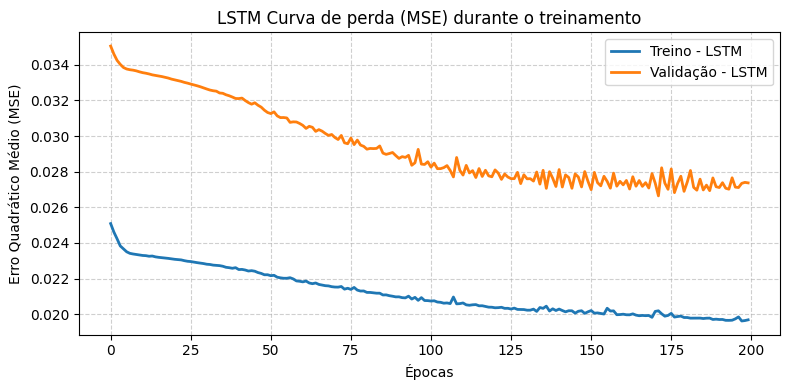

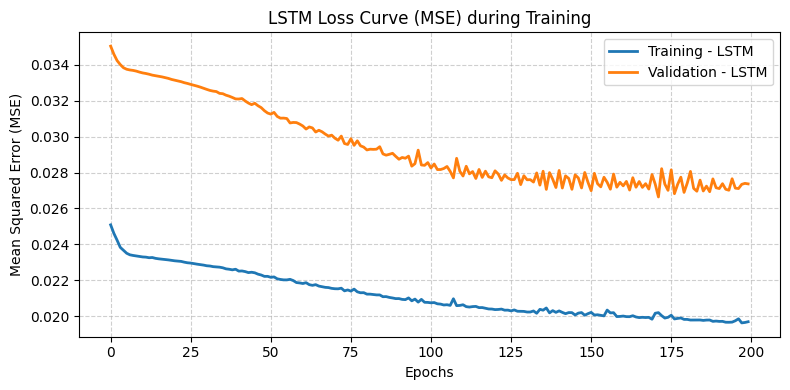

In [24]:
# ============================================================
#  ✅ CURVA DE PERDA
# ============================================================
plt.figure(figsize=(8, 4))

plt.plot(train_losses_lstm, label='Treino - LSTM', linewidth=2)
plt.plot(test_losses_lstm, label='Validação - LSTM', linewidth=2)

plt.title("LSTM Curva de perda (MSE) durante o treinamento")
plt.xlabel("Épocas")
plt.ylabel("Erro Quadrático Médio (MSE)")

plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.savefig("lstm_loss-pt.png", dpi=300, bbox_inches="tight")
plt.show()



plt.figure(figsize=(8, 4))

# plt.plot(train_losses_mlp, label='Training - MLP', linewidth=2)
plt.plot(train_losses_lstm, label='Training - LSTM', linewidth=2)
plt.plot(test_losses_lstm, label='Validation - LSTM', linewidth=2)

plt.title("LSTM Loss Curve (MSE) during Training")
plt.xlabel("Epochs")
plt.ylabel("Mean Squared Error (MSE)")

plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.savefig("lstm_loss-en.png", dpi=300, bbox_inches="tight")
plt.show()


In [25]:
# ============================================================
#  ✅ LSTM AVALIAÇÃO TREINO vs VALIDAÇÃO
# ============================================================
def inverse_transform_and_eval_lstm(X_t, y_t):
    y_pred = model_lstm.predict(X_t, verbose=0)
    y_t_inv = scaler.inverse_transform(y_t.reshape(-1,1)).flatten()
    y_pred_inv = scaler.inverse_transform(y_pred).flatten()
    mse = mean_squared_error(y_t_inv, y_pred_inv)
    rmse = math.sqrt(mse)
    r2 = r2_score(y_t_inv, y_pred_inv)
    return y_t_inv, y_pred_inv, mse, rmse, r2

y_train_inv_lstm, y_pred_train_inv_lstm, mse_train_lstm, rmse_train_lstm, r2_train_lstm = inverse_transform_and_eval_lstm(X_train_lstm, y_train_lstm)
y_test_inv_lstm, y_pred_inv_lstm, mse_test_lstm, rmse_test_lstm, r2_test_lstm = inverse_transform_and_eval_lstm(X_test_lstm, y_test_lstm)

print("\n📊 LSTM Comparação Treino vs Validação:")
print(f"{'Métrica':<10} | {'Treino':>15} | {'Validação':>15}")
print("-"*45)
print(f"{'MSE':<10} | {mse_train_lstm:>15.4e} | {mse_test_lstm:>15.4e}")
print(f"{'RMSE':<10} | {rmse_train_lstm:>15.4e} | {rmse_test_lstm:>15.4e}")
print(f"{'R²':<10} | {r2_train_lstm:>15.4f} | {r2_test_lstm:>15.4f}")
print(f"Window    = {BEST_WINDOW_LSTM:}")
print(f"Batch     = {BATCH_SIZE_LSTM:}")


print("\n📊 LSTM Comparison Train vs Validation:")
print(f"{'Metric':<10} | {'Train':>15} | {'Validation':>15}")
print("-"*45)
print(f"{'MSE':<10} | {mse_train_lstm:>15.4e} | {mse_test_lstm:>15.4e}")
print(f"{'RMSE':<10} | {rmse_train_lstm:>15.4e} | {rmse_test_lstm:>15.4e}")
print(f"{'R²':<10} | {r2_train_lstm:>15.4f} | {r2_test_lstm:>15.4f}")
print(f"Window    = {BEST_WINDOW_LSTM:}")
print(f"Batch     = {BATCH_SIZE_LSTM:}")


📊 LSTM Comparação Treino vs Validação:
Métrica    |          Treino |       Validação
---------------------------------------------
MSE        |      8.8424e+06 |      1.2359e+07
RMSE       |      2.9736e+03 |      3.5155e+03
R²         |          0.1628 |          0.1886
Window    = 24
Batch     = 64

📊 LSTM Comparison Train vs Validation:
Metric     |           Train |      Validation
---------------------------------------------
MSE        |      8.8424e+06 |      1.2359e+07
RMSE       |      2.9736e+03 |      3.5155e+03
R²         |          0.1628 |          0.1886
Window    = 24
Batch     = 64


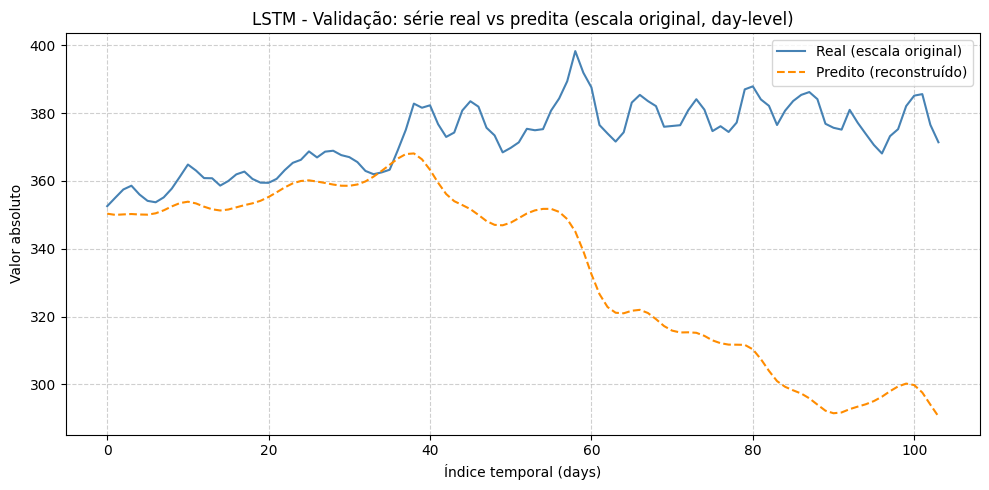

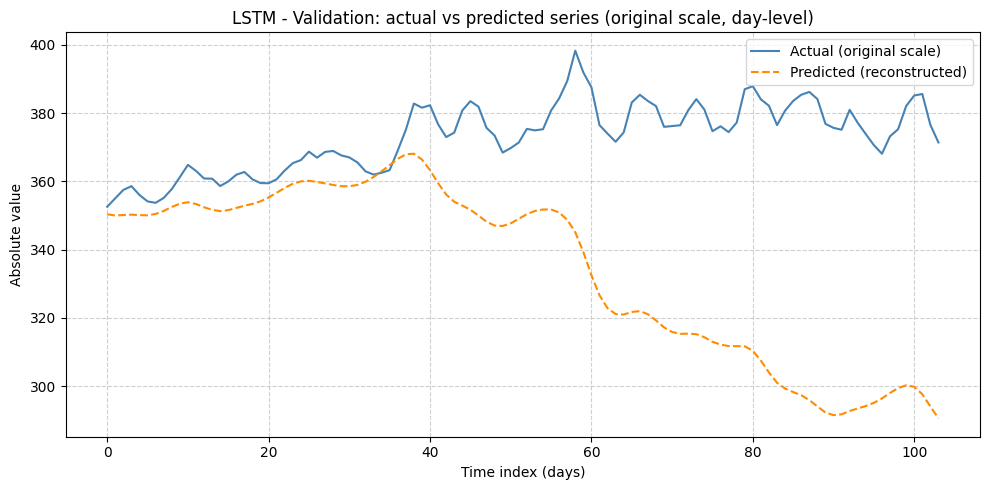


📊 LSTM - Métricas em escala ABSOLUTA (reconstruída):
Window    = 24
Batch     = 64
MSE(abs)  = 2.5895e+09
RMSE(abs) = 5.0887e+04
R²(abs)   = -23.8874

📊 LSTM - Metrics in ABSOLUTE scale (reconstructed):
Window    = 24
Batch     = 64
MSE(abs)  = 2.5895e+09
RMSE(abs) = 5.0887e+04
R²(abs)   = -23.8874


In [26]:
# ============================================================
#  ✅ LSTM - RECONSTRUÇÃO EM ESCALA ABSOLUTA (VALIDAÇÃO)
# ============================================================
# y_test_inv e y_pred_inv já são ΔValue na escala original
# (vieram de inverse_transform_and_eval)
split = train_size
base_value = series[split + BEST_WINDOW_LSTM - 1]

# reconstrói série absoluta acumulando os deltas
y_pred_abs_lstm = base_value + np.cumsum(y_pred_inv_lstm)
y_test_abs_lstm = base_value + np.cumsum(y_test_inv_lstm)

y_pred_abs_lstm_tb = y_pred_abs_lstm / 1024
y_test_abs_lstm_tb = y_test_abs_lstm / 1024

# Plot validation in absolute scale (consistent with main graph)
plt.figure(figsize=(10,5))
plt.plot(y_test_abs_lstm_tb, label="Real (escala original)", color='steelblue')
plt.plot(y_pred_abs_lstm_tb, label="Predito (reconstruído)", color='darkorange', linestyle='--')
plt.title(f"LSTM - Validação: série real vs predita (escala original, {time_unit}-level)")
plt.xlabel(f"Índice temporal ({time_unit}s)")
plt.ylabel("Valor absoluto")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig("lstm_val_real_vs_pred-pt.png", dpi=300, bbox_inches="tight")
plt.show()


# Plot validation in absolute scale (consistent with the main graph)
plt.figure(figsize=(10,5))
plt.plot(y_test_abs_lstm_tb, label="Actual (original scale)", color='steelblue')
plt.plot(y_pred_abs_lstm_tb, label="Predicted (reconstructed)", color='darkorange', linestyle='--')
plt.title(f"LSTM - Validation: actual vs predicted series (original scale, {time_unit}-level)")
plt.xlabel(f"Time index ({time_unit}s)")
plt.ylabel("Absolute value")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig("lstm_val_real_vs_pred-en.png", dpi=300, bbox_inches="tight")
plt.show()


# métricas também em escala absoluta (opcional)
mse_abs_lstm  = mean_squared_error(y_test_abs_lstm, y_pred_abs_lstm)
rmse_abs_lstm = math.sqrt(mse_abs_lstm)
r2_abs_lstm   = r2_score(y_test_abs_lstm, y_pred_abs_lstm)

print("\n📊 LSTM - Métricas em escala ABSOLUTA (reconstruída):")
print(f"Window    = {BEST_WINDOW_LSTM:}")
print(f"Batch     = {BATCH_SIZE_LSTM:}")
print(f"MSE(abs)  = {mse_abs_lstm:,.4e}")
print(f"RMSE(abs) = {rmse_abs_lstm:,.4e}")
print(f"R²(abs)   = {r2_abs_lstm:.4f}")

print("\n📊 LSTM - Metrics in ABSOLUTE scale (reconstructed):")
print(f"Window    = {BEST_WINDOW_LSTM:}")
print(f"Batch     = {BATCH_SIZE_LSTM:}")
print(f"MSE(abs)  = {mse_abs_lstm:,.4e}")
print(f"RMSE(abs) = {rmse_abs_lstm:,.4e}")
print(f"R²(abs)   = {r2_abs_lstm:.4f}")








In [27]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# garante float32 desde o começo
diff_norm32_lstm = np.asarray(diff_norm, dtype=np.float32)
last_window_lstm = diff_norm32_lstm[-BEST_WINDOW_LSTM:].reshape(1, BEST_WINDOW_LSTM, 1)

forecast_diffs_lstm = []

for _ in range(FORECAST_STEPS):
    x = tf.convert_to_tensor(last_window_lstm, dtype=tf.float32)
    x = tf.ensure_shape(x, (1, BEST_WINDOW_LSTM, 1))

    # chamada direta do modelo
    y = model_lstm(x, training=False)
    yhat = float(y.numpy().reshape(-1)[0])

    forecast_diffs_lstm.append(yhat)

    # atualiza a janela corretamente
    last_window_lstm = np.concatenate(
        [
            last_window_lstm[:, 1:, :],
            np.array(yhat, dtype=np.float32).reshape(1, 1, 1)
        ],
        axis=1
    ).astype(np.float32)

# volta da escala normalizada/diferenciada para escala original
forecast_diffs_inv_lstm = scaler.inverse_transform(
    np.array(forecast_diffs_lstm, dtype=np.float32).reshape(-1, 1)
).ravel()

forecast_abs_lstm = series[-1] + np.cumsum(forecast_diffs_inv_lstm)




📊 LSTM - Forecast (em TB):
Passo 001: 367.638 TB
Passo 002: 364.278 TB
Passo 003: 361.268 TB
Passo 004: 359.286 TB
Passo 005: 358.551 TB
Passo 006: 358.859 TB
Passo 007: 359.828 TB
Passo 008: 360.988 TB
Passo 009: 362.045 TB
Passo 010: 362.862 TB
Passo 011: 363.386 TB
Passo 012: 363.580 TB
Passo 013: 363.522 TB
Passo 014: 363.385 TB
Passo 015: 363.303 TB
Passo 016: 363.426 TB
Passo 017: 363.722 TB
Passo 018: 364.214 TB
Passo 019: 364.858 TB
Passo 020: 365.501 TB
Passo 021: 366.046 TB
Passo 022: 366.513 TB
Passo 023: 366.980 TB
Passo 024: 367.833 TB
Passo 025: 368.695 TB
Passo 026: 369.578 TB
Passo 027: 370.477 TB
Passo 028: 371.372 TB
Passo 029: 372.225 TB
Passo 030: 373.001 TB
Passo 031: 373.708 TB
Passo 032: 374.387 TB
Passo 033: 375.079 TB
Passo 034: 375.810 TB
Passo 035: 376.588 TB
Passo 036: 377.410 TB
Passo 037: 378.267 TB
Passo 038: 379.143 TB
Passo 039: 380.023 TB
Passo 040: 380.893 TB
Passo 041: 381.744 TB
Passo 042: 382.575 TB
Passo 043: 383.391 TB
Passo 044: 384.204 TB
Pass

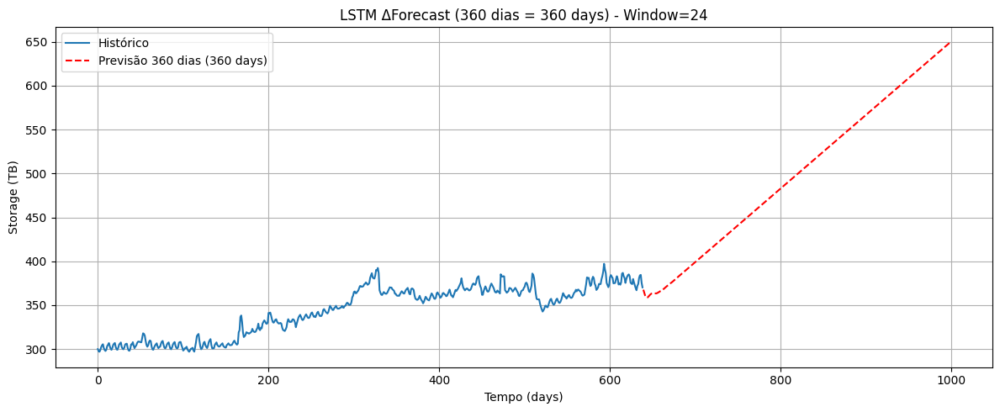

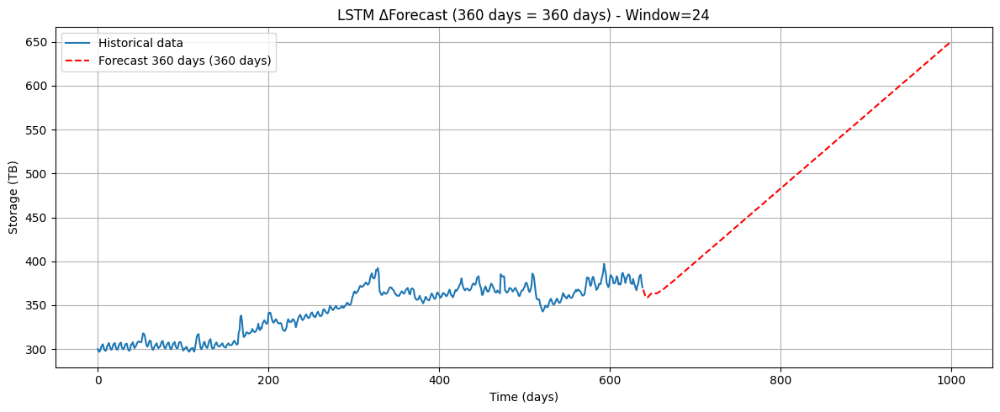

In [28]:
# converte tudo para TB
series_tb = series / 1024
forecast_abs_lstm_tb = forecast_abs_lstm / 1024

print("\n📊 LSTM - Forecast (em TB):")
for i, val in enumerate(forecast_abs_lstm_tb, start=1):
    print(f"Passo {i:03d}: {val:.3f} TB")
print(f"\n🔮 Último valor previsto ({FORECAST_DAYS} dias à frente): {forecast_abs_lstm_tb[-1]:.3f} TB")

# eixos
x_hist_lstm = np.arange(len(series_tb))
x_fore_lstm = np.arange(len(series_tb), len(series_tb) + FORECAST_STEPS)

# =========================
# PT-BR
# =========================
plt.figure(figsize=(12, 5))
plt.plot(x_hist_lstm, series_tb, label="Histórico")
plt.plot(
    x_fore_lstm,
    forecast_abs_lstm_tb,
    "r--",
    label=f"Previsão {FORECAST_DAYS} dias ({FORECAST_STEPS} {time_unit}s)"
)
plt.title(f"LSTM ΔForecast ({FORECAST_DAYS} dias = {FORECAST_STEPS} {time_unit}s) - Window={BEST_WINDOW_LSTM}")
plt.xlabel(f"Tempo ({time_unit}s)")
plt.ylabel("Storage (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("lstm_forecast-pt.png", dpi=300, bbox_inches="tight")
plt.show()

# =========================
# EN
# =========================
plt.figure(figsize=(12, 5))
plt.plot(x_hist_lstm, series_tb, label="Historical data")
plt.plot(
    x_fore_lstm,
    forecast_abs_lstm_tb,
    "r--",
    label=f"Forecast {FORECAST_DAYS} days ({FORECAST_STEPS} {time_unit}s)"
)
plt.title(f"LSTM ΔForecast ({FORECAST_DAYS} days = {FORECAST_STEPS} {time_unit}s) - Window={BEST_WINDOW_LSTM}")
plt.xlabel(f"Time ({time_unit}s)")
plt.ylabel("Storage (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("lstm_forecast-en.png", dpi=300, bbox_inches="tight")
plt.show()


📊 LSTM - Forecast (em TB):
Passo 001: 367.638 TB
Passo 002: 364.278 TB
Passo 003: 361.268 TB
Passo 004: 359.286 TB
Passo 005: 358.551 TB
Passo 006: 358.859 TB
Passo 007: 359.828 TB
Passo 008: 360.988 TB
Passo 009: 362.045 TB
Passo 010: 362.862 TB
Passo 011: 363.386 TB
Passo 012: 363.580 TB
Passo 013: 363.522 TB
Passo 014: 363.385 TB
Passo 015: 363.303 TB
Passo 016: 363.426 TB
Passo 017: 363.722 TB
Passo 018: 364.214 TB
Passo 019: 364.858 TB
Passo 020: 365.501 TB
Passo 021: 366.046 TB
Passo 022: 366.513 TB
Passo 023: 366.980 TB
Passo 024: 367.833 TB
Passo 025: 368.695 TB
Passo 026: 369.578 TB
Passo 027: 370.477 TB
Passo 028: 371.372 TB
Passo 029: 372.225 TB
Passo 030: 373.001 TB
Passo 031: 373.708 TB
Passo 032: 374.387 TB
Passo 033: 375.079 TB
Passo 034: 375.810 TB
Passo 035: 376.588 TB
Passo 036: 377.410 TB
Passo 037: 378.267 TB
Passo 038: 379.143 TB
Passo 039: 380.023 TB
Passo 040: 380.893 TB
Passo 041: 381.744 TB
Passo 042: 382.575 TB
Passo 043: 383.391 TB
Passo 044: 384.204 TB
Pass

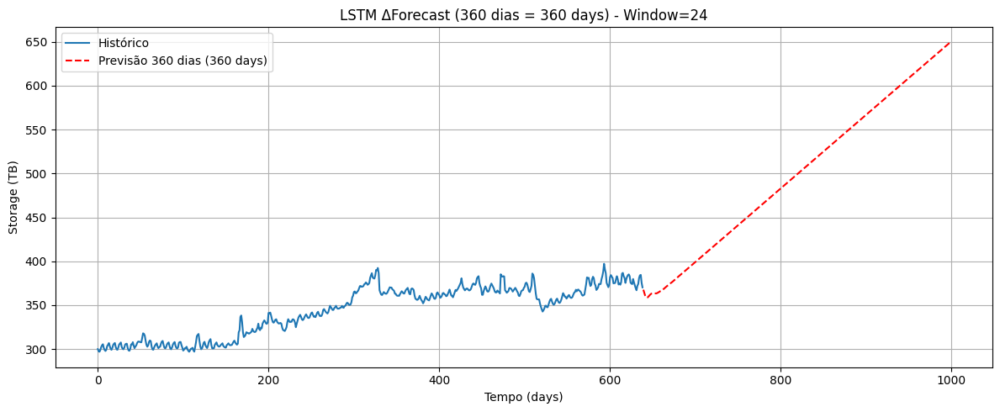

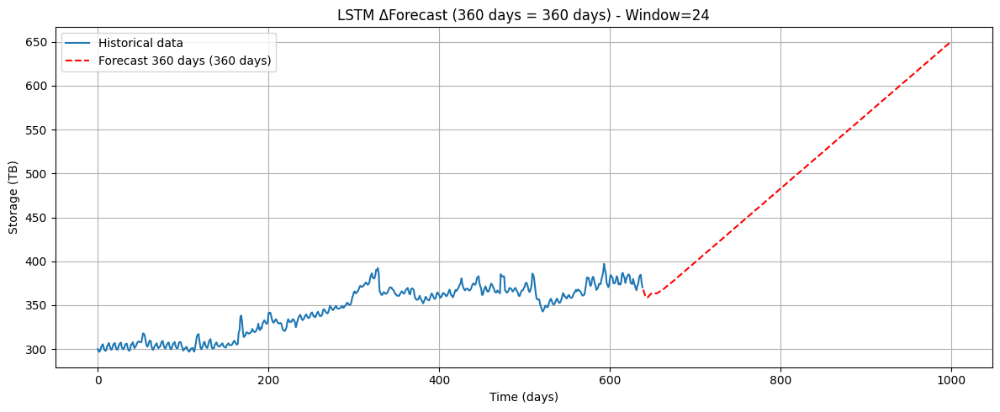

In [29]:
# converte tudo para TB
series_tb = series / 1024
forecast_abs_lstm_tb = forecast_abs_lstm / 1024

print("\n📊 LSTM - Forecast (em TB):")
for i, val in enumerate(forecast_abs_lstm_tb, start=1):
    print(f"Passo {i:03d}: {val:.3f} TB")
print(f"\n🔮 Último valor previsto ({FORECAST_DAYS} dias à frente): {forecast_abs_lstm_tb[-1]:.3f} TB")

# eixos
x_hist_lstm = np.arange(len(series_tb))
x_fore_lstm = np.arange(len(series_tb), len(series_tb) + FORECAST_STEPS)

# =========================
# PT-BR
# =========================
plt.figure(figsize=(12, 5))
plt.plot(x_hist_lstm, series_tb, label="Histórico")
plt.plot(
    x_fore_lstm,
    forecast_abs_lstm_tb,
    "r--",
    label=f"Previsão {FORECAST_DAYS} dias ({FORECAST_STEPS} {time_unit}s)"
)
plt.title(f"LSTM ΔForecast ({FORECAST_DAYS} dias = {FORECAST_STEPS} {time_unit}s) - Window={BEST_WINDOW_LSTM}")
plt.xlabel(f"Tempo ({time_unit}s)")
plt.ylabel("Storage (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("lstm_forecast-pt.png", dpi=300, bbox_inches="tight")
plt.show()

# =========================
# EN
# =========================
plt.figure(figsize=(12, 5))
plt.plot(x_hist_lstm, series_tb, label="Historical data")
plt.plot(
    x_fore_lstm,
    forecast_abs_lstm_tb,
    "r--",
    label=f"Forecast {FORECAST_DAYS} days ({FORECAST_STEPS} {time_unit}s)"
)
plt.title(f"LSTM ΔForecast ({FORECAST_DAYS} days = {FORECAST_STEPS} {time_unit}s) - Window={BEST_WINDOW_LSTM}")
plt.xlabel(f"Time ({time_unit}s)")
plt.ylabel("Storage (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("lstm_forecast-en.png", dpi=300, bbox_inches="tight")
plt.show()

In [30]:
if SAVE == 1:
    # ============================================================
    # 💾 SAVE PIPELINE - LSTM (FULL REPRODUCIBILITY)
    # ============================================================

    import os
    import json
    import joblib
    import numpy as np

    # ============================================================
    # 📁 BASE PATH
    # ============================================================

    #os.makedirs(BASE_PATH, exist_ok=True)

    # ============================================================
    # 📌 PREFIX
    # ============================================================
    MODEL_NAME = "lstm"

    # ============================================================
    # 1. SAVE TRAINING HISTORY
    # ============================================================
    np.save(f"{BASE_PATH}/train_losses_{MODEL_NAME}.npy", train_losses_lstm)
    np.save(f"{BASE_PATH}/val_losses_{MODEL_NAME}.npy", test_losses_lstm)

    # ============================================================
    # 2. SAVE TRAINED MODEL
    # ============================================================
    model_lstm.save(f"{BASE_PATH}/{MODEL_NAME}_model.keras", include_optimizer=True)

    # ============================================================
    # 3. SAVE FINAL METRICS (TRAINING)
    # ============================================================
    metrics_lstm = {
        "final_train_loss": float(train_losses_lstm[-1]),
        "final_val_loss": float(test_losses_lstm[-1]),
        "mse_train_diff": float(mse_train_lstm),
        "rmse_train_diff": float(rmse_train_lstm),
        "r2_train_diff": float(r2_train_lstm),
        "mse_test_diff": float(mse_test_lstm),
        "rmse_test_diff": float(rmse_test_lstm),
        "r2_test_diff": float(r2_test_lstm),
        "mse_abs": float(mse_abs_lstm),
        "rmse_abs": float(rmse_abs_lstm),
        "r2_abs": float(r2_abs_lstm),
        "forecast_last_tb": float(forecast_abs_lstm_tb[-1]),
    }

    with open(f"{BASE_PATH}/{MODEL_NAME}_metrics.json", "w") as f:
        json.dump(metrics_lstm, f, indent=4)

    # ============================================================
    # 4. SAVE SCALER
    # ============================================================
    joblib.dump(scaler, f"{BASE_PATH}/{MODEL_NAME}_scaler.save")

    # ============================================================
    # 5. SAVE TRAINING CONFIG
    # ============================================================
    config_lstm = {
        "window": int(BEST_WINDOW_LSTM),
        "epochs": int(EPOCHS_LSTM),
        "batch_size": int(BATCH_SIZE_LSTM),
        "forecast_steps": int(FORECAST_STEPS),
        "forecast_days": int(FORECAST_DAYS),
        "time_unit": str(time_unit),
        "train_size": int(train_size),
    }

    with open(f"{BASE_PATH}/{MODEL_NAME}_config.json", "w") as f:
        json.dump(config_lstm, f, indent=4)

    # ============================================================
    # 6. SAVE DATA ARRAYS - TRAIN/TEST/PRED
    # ============================================================
    np.save(f"{BASE_PATH}/X_train_{MODEL_NAME}.npy", X_train_lstm)
    np.save(f"{BASE_PATH}/y_train_{MODEL_NAME}.npy", y_train_lstm)
    np.save(f"{BASE_PATH}/X_test_{MODEL_NAME}.npy", X_test_lstm)
    np.save(f"{BASE_PATH}/y_test_{MODEL_NAME}.npy", y_test_lstm)

    np.save(f"{BASE_PATH}/y_train_inv_{MODEL_NAME}.npy", y_train_inv_lstm)
    np.save(f"{BASE_PATH}/y_pred_train_inv_{MODEL_NAME}.npy", y_pred_train_inv_lstm)
    np.save(f"{BASE_PATH}/y_test_inv_{MODEL_NAME}.npy", y_test_inv_lstm)
    np.save(f"{BASE_PATH}/y_pred_inv_{MODEL_NAME}.npy", y_pred_inv_lstm)

    # ============================================================
    # 7. SAVE ABSOLUTE-SCALE RECONSTRUCTION
    # ============================================================
    np.save(f"{BASE_PATH}/y_test_abs_{MODEL_NAME}.npy", y_test_abs_lstm)
    np.save(f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}.npy", y_pred_abs_lstm)

    np.save(f"{BASE_PATH}/y_test_abs_{MODEL_NAME}_tb.npy", y_test_abs_lstm_tb)
    np.save(f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}_tb.npy", y_pred_abs_lstm_tb)

    # ============================================================
    # 8. SAVE FUTURE FORECAST
    # ============================================================
    np.save(f"{BASE_PATH}/forecast_diffs_{MODEL_NAME}.npy", np.array(forecast_diffs_lstm))
    np.save(f"{BASE_PATH}/forecast_diffs_inv_{MODEL_NAME}.npy", forecast_diffs_inv_lstm)
    np.save(f"{BASE_PATH}/forecast_abs_{MODEL_NAME}.npy", forecast_abs_lstm)
    np.save(f"{BASE_PATH}/forecast_abs_{MODEL_NAME}_tb.npy", forecast_abs_lstm_tb)

    # ============================================================
    # 9. SAVE RAW SERIES / PREPROCESSING REFERENCES
    # ============================================================
    np.save(f"{BASE_PATH}/series_original.npy", series)
    np.save(f"{BASE_PATH}/diff_series.npy", diff_series)
    np.save(f"{BASE_PATH}/diff_train.npy", diff_train)
    np.save(f"{BASE_PATH}/diff_test.npy", diff_test)
    np.save(f"{BASE_PATH}/diff_train_norm.npy", diff_train_norm)
    np.save(f"{BASE_PATH}/diff_test_norm.npy", diff_test_norm)

    # opcional: snapshot específico do LSTM
    np.save(f"{BASE_PATH}/last_window_{MODEL_NAME}.npy", last_window_lstm)

    # ============================================================
    # 10. SAVE BASE VALUE USED IN RECONSTRUCTION
    # ============================================================
    reconstruction_info_lstm = {
        "split": int(train_size),
        "base_value": float(base_value),
        "series_last_value": float(series[-1]),
    }

    with open(f"{BASE_PATH}/reconstruction_info_{MODEL_NAME}.json", "w") as f:
        json.dump(reconstruction_info_lstm, f, indent=4)

    # ============================================================
    # 11. SAVE FIGURES IF THEY EXIST IN CURRENT DIR
    # ============================================================
    figure_files = [
        "lstm_loss-pt.png",
        "lstm_loss-en.png",
        "lstm_val_real_vs_pred-pt.png",
        "lstm_val_real_vs_pred-en.png",
        "lstm_forecast-pt.png",
        "lstm_forecast-en.png",
    ]

    for fig in figure_files:
        if os.path.exists(fig):
            dest = os.path.join(BASE_PATH, fig)
            if os.path.abspath(fig) != os.path.abspath(dest):
                import shutil
                shutil.copy2(fig, dest)

    # ============================================================
    # 12. SUMMARY
    # ============================================================
    print(f"✅ All LSTM artifacts saved in:\n{BASE_PATH}")
    print("\nSaved files:")
    print(f"- {MODEL_NAME}_model.keras")
    print(f"- {MODEL_NAME}_scaler.save")
    print(f"- {MODEL_NAME}_metrics.json")
    print(f"- {MODEL_NAME}_config.json")
    print(f"- train_losses_{MODEL_NAME}.npy")
    print(f"- val_losses_{MODEL_NAME}.npy")
    print(f"- X_train_{MODEL_NAME}.npy / y_train_{MODEL_NAME}.npy")
    print(f"- X_test_{MODEL_NAME}.npy / y_test_{MODEL_NAME}.npy")
    print(f"- y_test_abs_{MODEL_NAME}.npy / y_pred_abs_{MODEL_NAME}.npy")
    print(f"- forecast_abs_{MODEL_NAME}.npy")
    print(f"- forecast_abs_{MODEL_NAME}_tb.npy")

# GRU

In [31]:
# ============================================================
#  ✅ MODEL GRU
# ============================================================

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Input, Dropout, LayerNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dense, Input, Dropout, LayerNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Model

if RELOAD == 0:
    callbacks = [
        ReduceLROnPlateau(
            monitor="val_loss",
            factor=0.3,
            patience=10,
            min_lr=1e-5,
            verbose=1
        ),
        EarlyStopping(
            monitor="val_loss",
            patience=25,
            restore_best_weights=True,
            verbose=1
        ),
        ModelCheckpoint(
            "best_gru.keras",
            monitor="val_loss",
            save_best_only=True,
            verbose=1
        )
    ]
    def build_gru(window):
        inputs = Input(shape=(window, 1))

        # GRU mais forte na primeira camada
        x = GRU(
            128,
            activation='tanh',
            return_sequences=True,
            #recurrent_dropout=0.2
        )(inputs)
        x = LayerNormalization()(x)

        # Segunda GRU resumindo a sequência
        x = GRU(
            64,
            activation='tanh',
            return_sequences=False,
            #recurrent_dropout=0.2
        )(x)
        x = LayerNormalization()(x)

        # Bloco denso final
        x = Dense(32, activation='relu', kernel_regularizer=l2(1e-5))(x)
        #x = Dropout(0.2)(x)

        outputs = Dense(1, activation='linear')(x)

        model = Model(inputs, outputs)

        optimizer = Adam(learning_rate=1e-5, clipnorm=1.0)
        model.compile(optimizer=optimizer, loss='mse')
        return model

    with tf.device(device):
        model_gru = build_gru(BEST_WINDOW_GRU)
        history = model_gru.fit(
            X_train_gru, y_train_gru,
            epochs=EPOCHS_GRU,
            batch_size=BATCH_SIZE_GRU,
            validation_data=(X_test_gru, y_test_gru),
            callbacks=callbacks,
            verbose=1
        )

    # perdas por época
    train_losses_gru = history.history['loss']
    test_losses_gru = history.history['val_loss']


In [32]:
if RELOAD == 1:
    # ============================================================
    # 🔄 RELOAD EVERYTHING - GRU
    # ============================================================

    import os
    import json
    import joblib
    import numpy as np
    from tensorflow.keras.models import load_model

    # ============================================================
    # 📁 BASE PATH
    # ============================================================

    MODEL_NAME = "gru"

    # ============================================================
    # 📂 FILE PATHS
    # ============================================================
    FILE_MODEL              = f"{BASE_PATH}/{MODEL_NAME}_model.keras"
    FILE_SCALER             = f"{BASE_PATH}/{MODEL_NAME}_scaler.save"
    FILE_METRICS            = f"{BASE_PATH}/{MODEL_NAME}_metrics.json"
    FILE_CONFIG             = f"{BASE_PATH}/{MODEL_NAME}_config.json"

    FILE_TRAIN_LOSS         = f"{BASE_PATH}/train_losses_{MODEL_NAME}.npy"
    FILE_VAL_LOSS           = f"{BASE_PATH}/val_losses_{MODEL_NAME}.npy"

    FILE_X_TRAIN            = f"{BASE_PATH}/X_train_{MODEL_NAME}.npy"
    FILE_Y_TRAIN            = f"{BASE_PATH}/y_train_{MODEL_NAME}.npy"
    FILE_X_TEST             = f"{BASE_PATH}/X_test_{MODEL_NAME}.npy"
    FILE_Y_TEST             = f"{BASE_PATH}/y_test_{MODEL_NAME}.npy"

    FILE_Y_TRAIN_INV        = f"{BASE_PATH}/y_train_inv_{MODEL_NAME}.npy"
    FILE_Y_PRED_TRAIN_INV   = f"{BASE_PATH}/y_pred_train_inv_{MODEL_NAME}.npy"
    FILE_Y_TEST_INV         = f"{BASE_PATH}/y_test_inv_{MODEL_NAME}.npy"
    FILE_Y_PRED_INV         = f"{BASE_PATH}/y_pred_inv_{MODEL_NAME}.npy"

    FILE_Y_TEST_ABS         = f"{BASE_PATH}/y_test_abs_{MODEL_NAME}.npy"
    FILE_Y_PRED_ABS         = f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}.npy"
    FILE_Y_TEST_ABS_TB      = f"{BASE_PATH}/y_test_abs_{MODEL_NAME}_tb.npy"
    FILE_Y_PRED_ABS_TB      = f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}_tb.npy"

    FILE_FORECAST_DIFFS     = f"{BASE_PATH}/forecast_diffs_{MODEL_NAME}.npy"
    FILE_FORECAST_DIFFS_INV = f"{BASE_PATH}/forecast_diffs_inv_{MODEL_NAME}.npy"
    FILE_FORECAST_ABS       = f"{BASE_PATH}/forecast_abs_{MODEL_NAME}.npy"
    FILE_FORECAST_ABS_TB    = f"{BASE_PATH}/forecast_abs_{MODEL_NAME}_tb.npy"

    FILE_SERIES             = f"{BASE_PATH}/series_original.npy"
    FILE_DIFF_SERIES        = f"{BASE_PATH}/diff_series.npy"
    FILE_DIFF_TRAIN         = f"{BASE_PATH}/diff_train.npy"
    FILE_DIFF_TEST          = f"{BASE_PATH}/diff_test.npy"
    FILE_DIFF_TRAIN_NORM    = f"{BASE_PATH}/diff_train_norm.npy"
    FILE_DIFF_TEST_NORM     = f"{BASE_PATH}/diff_test_norm.npy"

    FILE_LAST_WINDOW        = f"{BASE_PATH}/last_window_{MODEL_NAME}.npy"
    FILE_RECON_INFO         = f"{BASE_PATH}/reconstruction_info_{MODEL_NAME}.json"

    # ============================================================
    # ✅ LOAD CORE ARTIFACTS
    # ============================================================
    model_gru = load_model(FILE_MODEL)
    scaler = joblib.load(FILE_SCALER)

    with open(FILE_METRICS, "r") as f:
        metrics_gru = json.load(f)

    with open(FILE_CONFIG, "r") as f:
        config_gru = json.load(f)

    train_losses_gru = np.load(FILE_TRAIN_LOSS)
    test_losses_gru  = np.load(FILE_VAL_LOSS)

    # ============================================================
    # ✅ LOAD CONFIG
    # ============================================================
    BEST_WINDOW_GRU = config_gru["window"]
    EPOCHS_GRU      = config_gru["epochs"]
    BATCH_SIZE_GRU  = config_gru["batch_size"]
    FORECAST_STEPS  = config_gru["forecast_steps"]
    FORECAST_DAYS   = config_gru["forecast_days"]
    time_unit       = config_gru["time_unit"]
    train_size      = config_gru["train_size"]

    # ============================================================
    # ✅ LOAD DATA ARRAYS
    # ============================================================
    X_train_gru = np.load(FILE_X_TRAIN)
    y_train_gru = np.load(FILE_Y_TRAIN)
    X_test_gru  = np.load(FILE_X_TEST)
    y_test_gru  = np.load(FILE_Y_TEST)

    y_train_inv_gru      = np.load(FILE_Y_TRAIN_INV)
    y_pred_train_inv_gru = np.load(FILE_Y_PRED_TRAIN_INV)
    y_test_inv_gru       = np.load(FILE_Y_TEST_INV)
    y_pred_inv_gru       = np.load(FILE_Y_PRED_INV)

    y_test_abs_gru       = np.load(FILE_Y_TEST_ABS)
    y_pred_abs_gru       = np.load(FILE_Y_PRED_ABS)
    y_test_abs_gru_tb    = np.load(FILE_Y_TEST_ABS_TB)
    y_pred_abs_gru_tb    = np.load(FILE_Y_PRED_ABS_TB)

    forecast_diffs_gru     = np.load(FILE_FORECAST_DIFFS)
    forecast_diffs_inv_gru = np.load(FILE_FORECAST_DIFFS_INV)
    forecast_abs_gru       = np.load(FILE_FORECAST_ABS)
    forecast_tb_gru        = np.load(FILE_FORECAST_ABS_TB)

    series          = np.load(FILE_SERIES)
    diff_series     = np.load(FILE_DIFF_SERIES)
    diff_train      = np.load(FILE_DIFF_TRAIN)
    diff_test       = np.load(FILE_DIFF_TEST)
    diff_train_norm = np.load(FILE_DIFF_TRAIN_NORM)
    diff_test_norm  = np.load(FILE_DIFF_TEST_NORM)

    last_window_gru = None
    if os.path.exists(FILE_LAST_WINDOW):
        last_window_gru = np.load(FILE_LAST_WINDOW)

    with open(FILE_RECON_INFO, "r") as f:
        reconstruction_info_gru = json.load(f)

    split = reconstruction_info_gru["split"]
    base_value = reconstruction_info_gru["base_value"]
    series_last_value = reconstruction_info_gru["series_last_value"]

    # ============================================================
    # ✅ OPTIONAL: RECOMPUTE PREDICTIONS
    # ============================================================
    y_pred_gru_recomputed = model_gru.predict(X_test_gru, verbose=0)

    # ============================================================
    # ✅ SUMMARY
    # ============================================================
    print("\n✅ RELOAD EVERYTHING - GRU COMPLETED")
    print(f"Base path              : {BASE_PATH}")
    print(f"Model                  : {MODEL_NAME}")
    print(f"Window                 : {BEST_WINDOW_GRU}")
    print(f"Epochs                 : {EPOCHS_GRU}")
    print(f"Batch size             : {BATCH_SIZE_GRU}")
    print(f"Forecast steps         : {FORECAST_STEPS}")
    print(f"Forecast days          : {FORECAST_DAYS}")
    print(f"Time unit              : {time_unit}")
    print(f"Train size             : {train_size}")

    print("\n📊 Final training losses")
    print(f"Final train loss       : {metrics_gru['final_train_loss']:.6f}")
    print(f"Final val loss         : {metrics_gru['final_val_loss']:.6f}")

    print("\n📊 Metrics in differenced/original-delta scale")
    print(f"MSE train              : {metrics_gru['mse_train_diff']:.6e}")
    print(f"RMSE train             : {metrics_gru['rmse_train_diff']:.6e}")
    print(f"R² train               : {metrics_gru['r2_train_diff']:.6f}")
    print(f"MSE test               : {metrics_gru['mse_test_diff']:.6e}")
    print(f"RMSE test              : {metrics_gru['rmse_test_diff']:.6e}")
    print(f"R² test                : {metrics_gru['r2_test_diff']:.6f}")

    print("\n📊 Metrics in absolute scale")
    print(f"MSE abs                : {metrics_gru['mse_abs']:.6e}")
    print(f"RMSE abs               : {metrics_gru['rmse_abs']:.6e}")
    print(f"R² abs                 : {metrics_gru['r2_abs']:.6f}")
    print(f"Final forecast TB      : {metrics_gru['forecast_last_tb']:.3f}")

    print("\n📐 Shapes")
    print(f"X_train_gru            : {X_train_gru.shape}")
    print(f"y_train_gru            : {y_train_gru.shape}")
    print(f"X_test_gru             : {X_test_gru.shape}")
    print(f"y_test_gru             : {y_test_gru.shape}")
    print(f"y_pred_inv_gru         : {y_pred_inv_gru.shape}")
    print(f"y_test_abs_gru         : {y_test_abs_gru.shape}")
    print(f"forecast_tb_gru        : {forecast_tb_gru.shape}")

    # ============================================================
    # ✅ PACKAGE EVERYTHING
    # ============================================================
    artifacts_gru = {
        "model_gru": model_gru,
        "scaler": scaler,
        "metrics_gru": metrics_gru,
        "config_gru": config_gru,
        "train_losses_gru": train_losses_gru,
        "test_losses_gru": test_losses_gru,
        "X_train_gru": X_train_gru,
        "y_train_gru": y_train_gru,
        "X_test_gru": X_test_gru,
        "y_test_gru": y_test_gru,
        "y_train_inv_gru": y_train_inv_gru,
        "y_pred_train_inv_gru": y_pred_train_inv_gru,
        "y_test_inv_gru": y_test_inv_gru,
        "y_pred_inv_gru": y_pred_inv_gru,
        "y_test_abs_gru": y_test_abs_gru,
        "y_pred_abs_gru": y_pred_abs_gru,
        "y_test_abs_gru_tb": y_test_abs_gru_tb,
        "y_pred_abs_gru_tb": y_pred_abs_gru_tb,
        "forecast_diffs_gru": forecast_diffs_gru,
        "forecast_diffs_inv_gru": forecast_diffs_inv_gru,
        "forecast_abs_gru": forecast_abs_gru,
        "forecast_tb_gru": forecast_tb_gru,
        "series": series,
        "diff_series": diff_series,
        "diff_train": diff_train,
        "diff_test": diff_test,
        "diff_train_norm": diff_train_norm,
        "diff_test_norm": diff_test_norm,
        "last_window_gru": last_window_gru,
        "split": split,
        "base_value": base_value,
        "series_last_value": series_last_value,
        "y_pred_gru_recomputed": y_pred_gru_recomputed,
    }

    print("\n✅ artifacts_gru dictionary created.")



✅ RELOAD EVERYTHING - GRU COMPLETED
Base path              : /content/drive/MyDrive/Colab Notebooks/MESTRADO/1-TESE/360/12-jun-2026
Model                  : gru
Window                 : 24
Epochs                 : 200
Batch size             : 64
Forecast steps         : 360
Forecast days          : 360
Time unit              : day
Train size             : 510

📊 Final training losses
Final train loss       : 0.013789
Final val loss         : 0.025372

📊 Metrics in differenced/original-delta scale
MSE train              : 6.012975e+06
RMSE train             : 2.452137e+03
R² train               : 0.430724
MSE test               : 1.099968e+07
RMSE test              : 3.316576e+03
R² test                : 0.277856

📊 Metrics in absolute scale
MSE abs                : 1.378124e+08
RMSE abs               : 1.173935e+04
R² abs                 : -0.324515
Final forecast TB      : 509.559

📐 Shapes
X_train_gru            : (486, 24, 1)
y_train_gru            : (486, 1)
X_test_gru            

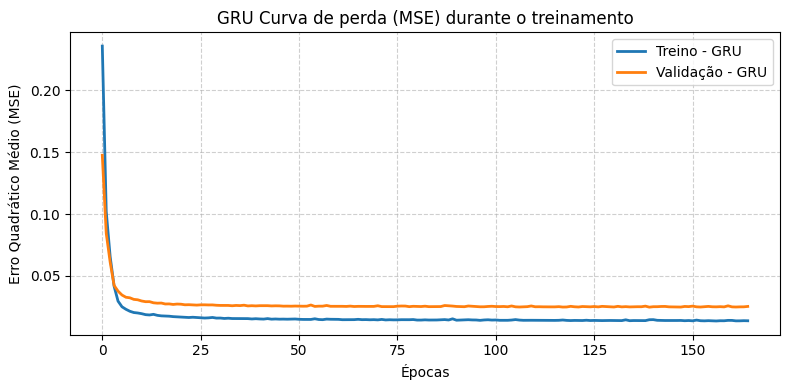

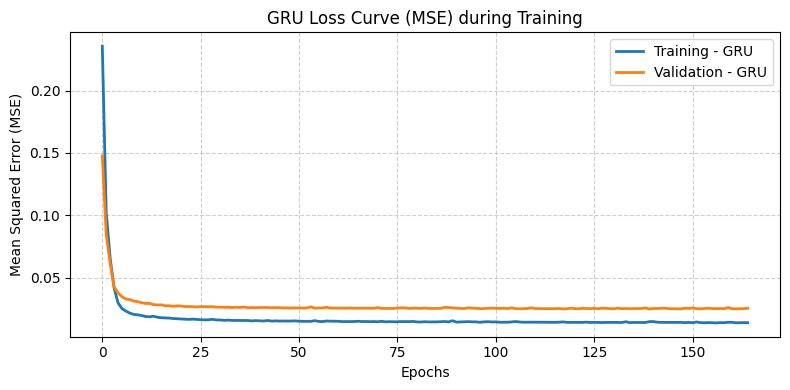

In [33]:
# ============================================================
#  ✅ CURVA DE PERDA
# ============================================================
plt.figure(figsize=(8, 4))

plt.plot(train_losses_gru, label='Treino - GRU', linewidth=2)
plt.plot(test_losses_gru, label='Validação - GRU', linewidth=2)

plt.title("GRU Curva de perda (MSE) durante o treinamento")
plt.xlabel("Épocas")
plt.ylabel("Erro Quadrático Médio (MSE)")

plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.savefig("gru_loss-pt.png", dpi=300, bbox_inches="tight")
plt.show()



###################
plt.figure(figsize=(8, 4))

plt.plot(train_losses_gru, label='Training - GRU', linewidth=2)
plt.plot(test_losses_gru, label='Validation - GRU', linewidth=2)

plt.title("GRU Loss Curve (MSE) during Training")
plt.xlabel("Epochs")
plt.ylabel("Mean Squared Error (MSE)")

plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.savefig("gru_loss-en.png", dpi=300, bbox_inches="tight")
plt.show()


In [34]:
# ============================================================
#  ✅ GRU AVALIAÇÃO TREINO vs VALIDAÇÃO
# ============================================================
def inverse_transform_and_eval_gru(X_t, y_t):
    y_pred = model_gru.predict(X_t, verbose=0)
    y_t_inv = scaler.inverse_transform(y_t.reshape(-1,1)).flatten()
    y_pred_inv = scaler.inverse_transform(y_pred).flatten()
    mse = mean_squared_error(y_t_inv, y_pred_inv)
    rmse = math.sqrt(mse)
    r2 = r2_score(y_t_inv, y_pred_inv)
    return y_t_inv, y_pred_inv, mse, rmse, r2

y_train_inv_gru, y_pred_train_inv_gru, mse_train_gru, rmse_train_gru, r2_train_gru = inverse_transform_and_eval_gru(X_train_gru, y_train_gru)
y_test_inv_gru, y_pred_inv_gru, mse_test_gru, rmse_test_gru, r2_test_gru = inverse_transform_and_eval_gru(X_test_gru, y_test_gru)

print("\n📊 GRU Comparação Treino vs Validação:")
print(f"{'Métrica':<10} | {'Treino':>15} | {'Validação':>15}")
print("-"*45)
print(f"{'MSE':<10} | {mse_train_gru:>15.4e} | {mse_test_gru:>15.4e}")
print(f"{'RMSE':<10} | {rmse_train_gru:>15.4e} | {rmse_test_gru:>15.4e}")
print(f"{'R²':<10} | {r2_train_gru:>15.4f} | {r2_test_gru:>15.4f}")
print(f"Window    = {BEST_WINDOW_GRU:}")
print(f"Batch     = {BATCH_SIZE_GRU:}")

print("\n📊 GRU Train vs Validation Comparison:")
print(f"{'Metric':<10} | {'Train':>15} | {'Validation':>15}")
print("-"*45)
print(f"{'MSE':<10} | {mse_train_gru:>15.4e} | {mse_test_gru:>15.4e}")
print(f"{'RMSE':<10} | {rmse_train_gru:>15.4e} | {rmse_test_gru:>15.4e}")
print(f"{'R²':<10} | {r2_train_gru:>15.4f} | {r2_test_gru:>15.4f}")
print(f"Window    = {BEST_WINDOW_GRU:}")
print(f"Batch     = {BATCH_SIZE_GRU:}")



📊 GRU Comparação Treino vs Validação:
Métrica    |          Treino |       Validação
---------------------------------------------
MSE        |      6.0130e+06 |      1.1000e+07
RMSE       |      2.4521e+03 |      3.3166e+03
R²         |          0.4307 |          0.2779
Window    = 24
Batch     = 64

📊 GRU Train vs Validation Comparison:
Metric     |           Train |      Validation
---------------------------------------------
MSE        |      6.0130e+06 |      1.1000e+07
RMSE       |      2.4521e+03 |      3.3166e+03
R²         |          0.4307 |          0.2779
Window    = 24
Batch     = 64


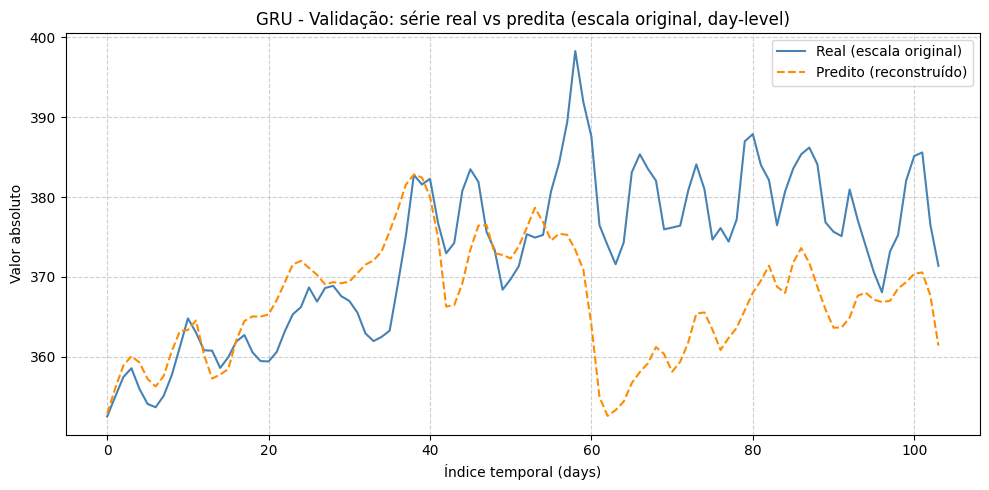

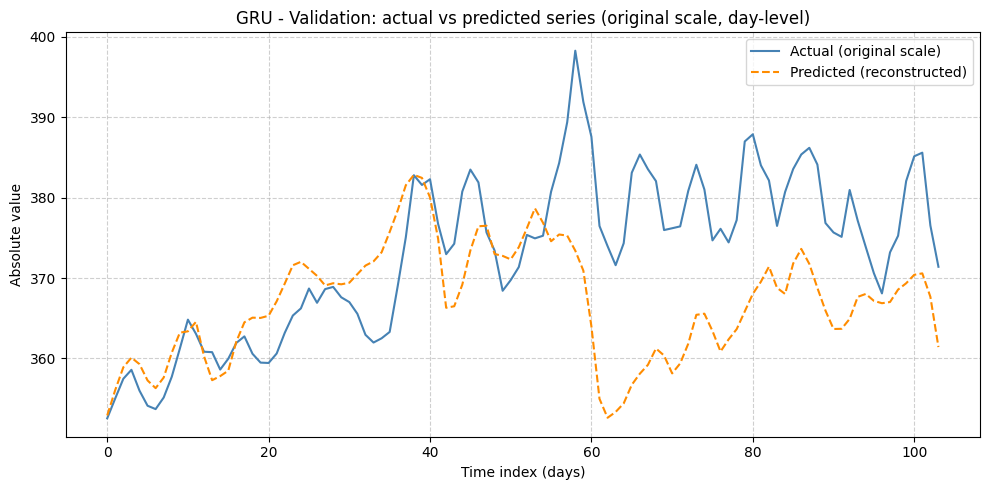


📊 GRU - Métricas em escala ABSOLUTA (reconstruída):
MSE(abs)  = 1.3781e+08
RMSE(abs) = 1.1739e+04
R²(abs)   = -0.3245
Window    = 24
Batch     = 64

📊 GRU - Metrics in ABSOLUTE scale (reconstructed):
MSE(abs)  = 1.3781e+08
RMSE(abs) = 1.1739e+04
R²(abs)   = -0.3245
Window    = 24
Batch     = 64


In [35]:
# ============================================================
#  ✅ GRU - RECONSTRUÇÃO EM ESCALA ABSOLUTA (VALIDAÇÃO)
# ============================================================
# y_test_inv e y_pred_inv já são ΔValue na escala original
# (vieram de inverse_transform_and_eval)

base_value = series[split + BEST_WINDOW_GRU - 1]

# reconstrói série absoluta acumulando os deltas
y_pred_abs_gru = base_value + np.cumsum(y_pred_inv_gru)
y_test_abs_gru = base_value + np.cumsum(y_test_inv_gru)

y_pred_abs_gru_tb = y_pred_abs_gru / 1024
y_test_abs_gru_tb = y_test_abs_gru / 1024

# Plot validation in absolute scale (consistent with main graph)
plt.figure(figsize=(10,5))
plt.plot(y_test_abs_gru_tb, label="Real (escala original)", color='steelblue')
plt.plot(y_pred_abs_gru_tb, label="Predito (reconstruído)", color='darkorange', linestyle='--')
plt.title(f"GRU - Validação: série real vs predita (escala original, {time_unit}-level)")
plt.xlabel(f"Índice temporal ({time_unit}s)")
plt.ylabel("Valor absoluto")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig("gru_val_real_vs_pred-pt.png", dpi=300, bbox_inches="tight")
plt.show()


# Plot validation in absolute scale (consistent with the main graph)
plt.figure(figsize=(10,5))
plt.plot(y_test_abs_gru_tb, label="Actual (original scale)", color='steelblue')
plt.plot(y_pred_abs_gru_tb, label="Predicted (reconstructed)", color='darkorange', linestyle='--')
plt.title(f"GRU - Validation: actual vs predicted series (original scale, {time_unit}-level)")
plt.xlabel(f"Time index ({time_unit}s)")
plt.ylabel("Absolute value")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig("gru_val_real_vs_pred-en.png", dpi=300, bbox_inches="tight")
plt.show()

# métricas também em escala absoluta (opcional)
mse_abs_gru  = mean_squared_error(y_test_abs_gru, y_pred_abs_gru)
rmse_abs_gru = math.sqrt(mse_abs_gru)
r2_abs_gru   = r2_score(y_test_abs_gru, y_pred_abs_gru)

print("\n📊 GRU - Métricas em escala ABSOLUTA (reconstruída):")
print(f"MSE(abs)  = {mse_abs_gru:,.4e}")
print(f"RMSE(abs) = {rmse_abs_gru:,.4e}")
print(f"R²(abs)   = {r2_abs_gru:.4f}")
print(f"Window    = {BEST_WINDOW_GRU:}")
print(f"Batch     = {BATCH_SIZE_GRU:}")

print("\n📊 GRU - Metrics in ABSOLUTE scale (reconstructed):")
print(f"MSE(abs)  = {mse_abs_gru:,.4e}")
print(f"RMSE(abs) = {rmse_abs_gru:,.4e}")
print(f"R²(abs)   = {r2_abs_gru:.4f}")
print(f"Window    = {BEST_WINDOW_GRU:}")
print(f"Batch     = {BATCH_SIZE_GRU:}")


📊 GRU - Forecast (em TB):
Passo 001: 370.434 TB
Passo 002: 367.028 TB
Passo 003: 360.216 TB
Passo 004: 356.716 TB
Passo 005: 357.265 TB
Passo 006: 359.142 TB
Passo 007: 362.537 TB
Passo 008: 364.672 TB
Passo 009: 363.745 TB
Passo 010: 360.762 TB
Passo 011: 358.713 TB
Passo 012: 358.382 TB
Passo 013: 360.141 TB
Passo 014: 363.296 TB
Passo 015: 366.314 TB
Passo 016: 366.118 TB
Passo 017: 365.473 TB
Passo 018: 363.309 TB
Passo 019: 361.794 TB
Passo 020: 362.143 TB
Passo 021: 364.801 TB
Passo 022: 367.677 TB
Passo 023: 369.007 TB
Passo 024: 368.055 TB
Passo 025: 365.464 TB
Passo 026: 363.502 TB
Passo 027: 363.440 TB
Passo 028: 365.474 TB
Passo 029: 368.974 TB
Passo 030: 372.720 TB
Passo 031: 373.256 TB
Passo 032: 372.291 TB
Passo 033: 370.665 TB
Passo 034: 368.652 TB
Passo 035: 368.285 TB
Passo 036: 370.259 TB
Passo 037: 374.305 TB
Passo 038: 376.767 TB
Passo 039: 376.533 TB
Passo 040: 376.311 TB
Passo 041: 374.948 TB
Passo 042: 373.720 TB
Passo 043: 373.903 TB
Passo 044: 376.314 TB
Passo

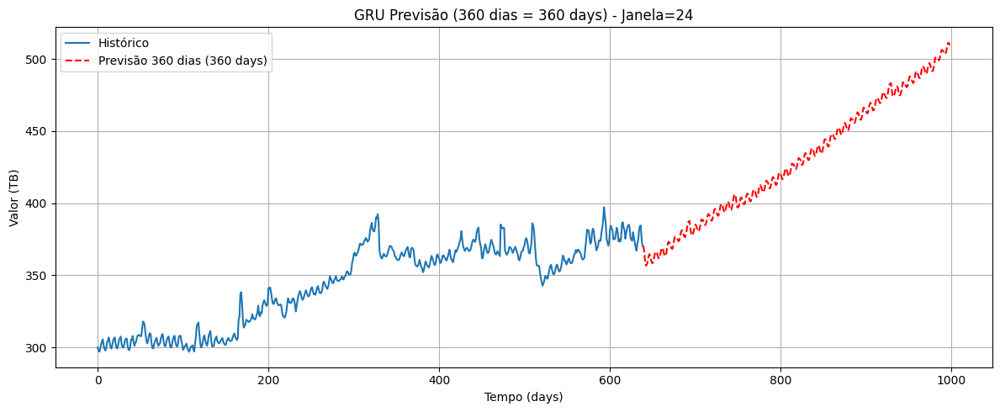

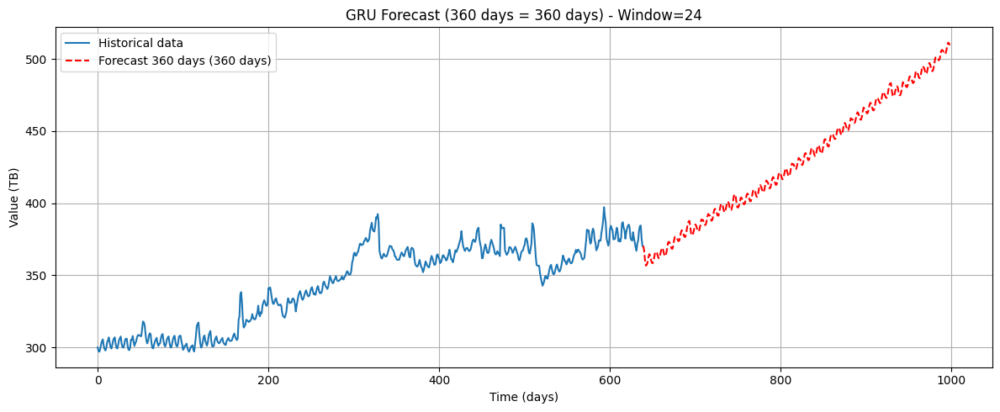

In [36]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# garante float32 desde o começo
diff_norm32_gru = np.asarray(diff_norm, dtype=np.float32)
last_window_gru = diff_norm32_gru[-BEST_WINDOW_GRU:].reshape(1, BEST_WINDOW_GRU, 1)  # (1,24,1) float32

forecast_diffs_gru = []

for _ in range(FORECAST_STEPS):
    # cria Tensor e fixa shape (elimina "unknown rank")
    x = tf.convert_to_tensor(last_window_gru, dtype=tf.float32)
    x = tf.ensure_shape(x, (1, BEST_WINDOW_GRU, 1))

    # CHAMA O MODELO DIRETO (sem predict)
    y = model_gru(x, training=False)          # Tensor (1,1)
    yhat = float(y.numpy().reshape(-1)[0])    # escalar

    forecast_diffs_gru.append(yhat)

    # desliza janela mantendo float32
    last_window_gru = np.concatenate(
        [last_window_gru[:, 1:, :],
         np.array(yhat, dtype=np.float32).reshape(1, 1, 1)],
        axis=1
    ).astype(np.float32)

forecast_diffs_inv_gru = scaler.inverse_transform(np.array(forecast_diffs_gru, dtype=np.float32).reshape(-1, 1)).ravel()
forecast_abs_gru = series[-1] + np.cumsum(forecast_diffs_inv_gru)

# TB (decimal). Se quiser TiB: /(1024**4)
series_tb = np.asarray(series, dtype=np.float64) / 1024
forecast_tb_gru = np.asarray(forecast_abs_gru, dtype=np.float64) / 1024

print("\n📊 GRU - Forecast (em TB):")
for i, val in enumerate(forecast_tb_gru, start=1):
    print(f"Passo {i:03d}: {val:.3f} TB")

print(f"\n🔮 Último valor previsto ({FORECAST_DAYS} dias à frente): {forecast_tb_gru[-1]:.3f} TB")

# eixo x
x_hist = np.arange(len(series_tb))
x_fore_gru = np.arange(len(series_tb), len(series_tb) + FORECAST_STEPS)

# gráfico em português
plt.figure(figsize=(12, 5))
plt.plot(x_hist, series_tb, label="Histórico")
plt.plot(
    x_fore_gru,
    forecast_tb_gru,
    "r--",
    label=f"Previsão {FORECAST_DAYS} dias ({FORECAST_STEPS} {time_unit}s)"
)
plt.title(f"GRU Previsão ({FORECAST_DAYS} dias = {FORECAST_STEPS} {time_unit}s) - Janela={BEST_WINDOW_GRU}")
plt.xlabel(f"Tempo ({time_unit}s)")
plt.ylabel("Valor (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("gru_forecast-pt.png", dpi=300, bbox_inches="tight")
plt.show()

# gráfico em inglês
plt.figure(figsize=(12, 5))
plt.plot(x_hist, series_tb, label="Historical data")
plt.plot(
    x_fore_gru,
    forecast_tb_gru,
    "r--",
    label=f"Forecast {FORECAST_DAYS} days ({FORECAST_STEPS} {time_unit}s)"
)
plt.title(f"GRU Forecast ({FORECAST_DAYS} days = {FORECAST_STEPS} {time_unit}s) - Window={BEST_WINDOW_GRU}")
plt.xlabel(f"Time ({time_unit}s)")
plt.ylabel("Value (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("gru_forecast-en.png", dpi=300, bbox_inches="tight")
plt.show()


📊 GRU - Forecast (em TB):
Passo 001: 370.434 TB
Passo 002: 367.028 TB
Passo 003: 360.216 TB
Passo 004: 356.716 TB
Passo 005: 357.265 TB
Passo 006: 359.142 TB
Passo 007: 362.537 TB
Passo 008: 364.672 TB
Passo 009: 363.745 TB
Passo 010: 360.762 TB
Passo 011: 358.713 TB
Passo 012: 358.382 TB
Passo 013: 360.141 TB
Passo 014: 363.296 TB
Passo 015: 366.314 TB
Passo 016: 366.118 TB
Passo 017: 365.473 TB
Passo 018: 363.309 TB
Passo 019: 361.794 TB
Passo 020: 362.143 TB
Passo 021: 364.801 TB
Passo 022: 367.677 TB
Passo 023: 369.007 TB
Passo 024: 368.055 TB
Passo 025: 365.464 TB
Passo 026: 363.502 TB
Passo 027: 363.440 TB
Passo 028: 365.474 TB
Passo 029: 368.974 TB
Passo 030: 372.720 TB
Passo 031: 373.256 TB
Passo 032: 372.291 TB
Passo 033: 370.665 TB
Passo 034: 368.652 TB
Passo 035: 368.285 TB
Passo 036: 370.259 TB
Passo 037: 374.305 TB
Passo 038: 376.767 TB
Passo 039: 376.533 TB
Passo 040: 376.311 TB
Passo 041: 374.948 TB
Passo 042: 373.720 TB
Passo 043: 373.903 TB
Passo 044: 376.314 TB
Passo

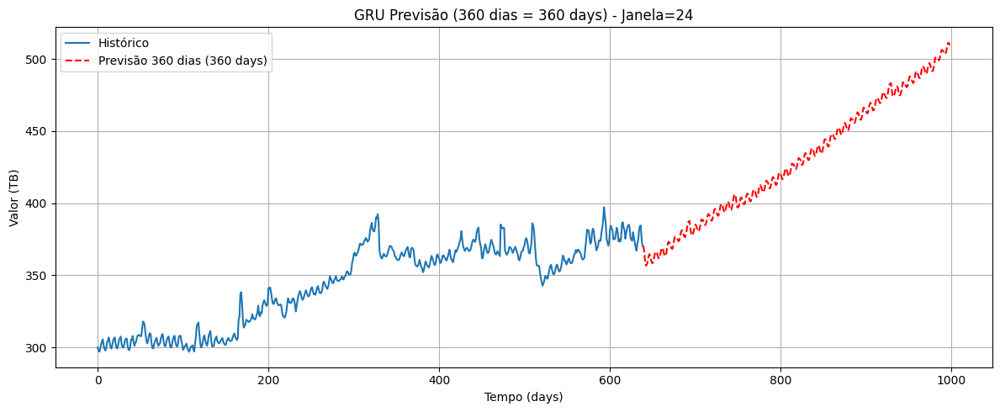

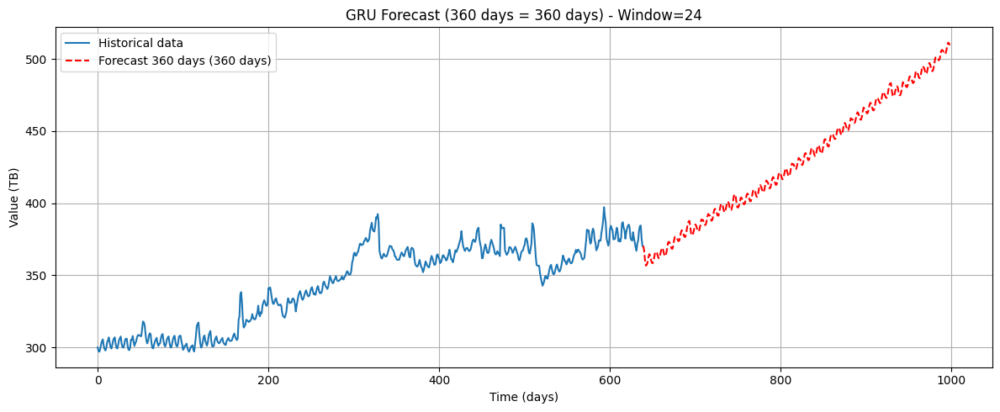

In [37]:
# TB (decimal). Se quiser TiB: /(1024**4)
series_tb = np.asarray(series, dtype=np.float64) / 1024
forecast_tb_gru = np.asarray(forecast_abs_gru, dtype=np.float64) / 1024

print("\n📊 GRU - Forecast (em TB):")
for i, val in enumerate(forecast_tb_gru, start=1):
    print(f"Passo {i:03d}: {val:.3f} TB")

print(f"\n🔮 Último valor previsto ({FORECAST_DAYS} dias à frente): {forecast_tb_gru[-1]:.3f} TB")

# eixo x
x_hist = np.arange(len(series_tb))
x_fore_gru = np.arange(len(series_tb), len(series_tb) + FORECAST_STEPS)

# gráfico em português
plt.figure(figsize=(12, 5))
plt.plot(x_hist, series_tb, label="Histórico")
plt.plot(
    x_fore_gru,
    forecast_tb_gru,
    "r--",
    label=f"Previsão {FORECAST_DAYS} dias ({FORECAST_STEPS} {time_unit}s)"
)
plt.title(f"GRU Previsão ({FORECAST_DAYS} dias = {FORECAST_STEPS} {time_unit}s) - Janela={BEST_WINDOW_GRU}")
plt.xlabel(f"Tempo ({time_unit}s)")
plt.ylabel("Valor (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("gru_forecast-pt.png", dpi=300, bbox_inches="tight")
plt.show()

# gráfico em inglês
plt.figure(figsize=(12, 5))
plt.plot(x_hist, series_tb, label="Historical data")
plt.plot(
    x_fore_gru,
    forecast_tb_gru,
    "r--",
    label=f"Forecast {FORECAST_DAYS} days ({FORECAST_STEPS} {time_unit}s)"
)
plt.title(f"GRU Forecast ({FORECAST_DAYS} days = {FORECAST_STEPS} {time_unit}s) - Window={BEST_WINDOW_GRU}")
plt.xlabel(f"Time ({time_unit}s)")
plt.ylabel("Value (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("gru_forecast-en.png", dpi=300, bbox_inches="tight")
plt.show()

In [38]:
if SAVE == 1:
    # ============================================================
    # 💾 SAVE PIPELINE - GRU (FULL REPRODUCIBILITY)
    # ============================================================

    import os
    import json
    import shutil
    import joblib
    import numpy as np

    # ============================================================
    # 📁 BASE PATH
    # ============================================================
    os.makedirs(BASE_PATH, exist_ok=True)

    MODEL_NAME = "gru"

    # ============================================================
    # 1. SAVE TRAINING HISTORY
    # ============================================================
    np.save(f"{BASE_PATH}/train_losses_{MODEL_NAME}.npy", train_losses_gru)
    np.save(f"{BASE_PATH}/val_losses_{MODEL_NAME}.npy", test_losses_gru)

    # ============================================================
    # 2. SAVE TRAINED MODEL
    # ============================================================
    model_gru.save(f"{BASE_PATH}/{MODEL_NAME}_model.keras", include_optimizer=True)

    # ============================================================
    # 3. SAVE METRICS
    # ============================================================
    metrics_gru = {
        "final_train_loss": float(train_losses_gru[-1]),
        "final_val_loss": float(test_losses_gru[-1]),

        "mse_train_diff": float(mse_train_gru),
        "rmse_train_diff": float(rmse_train_gru),
        "r2_train_diff": float(r2_train_gru),

        "mse_test_diff": float(mse_test_gru),
        "rmse_test_diff": float(rmse_test_gru),
        "r2_test_diff": float(r2_test_gru),

        "mse_abs": float(mse_abs_gru),
        "rmse_abs": float(rmse_abs_gru),
        "r2_abs": float(r2_abs_gru),

        "forecast_last_tb": float(forecast_tb_gru[-1]),
    }

    with open(f"{BASE_PATH}/{MODEL_NAME}_metrics.json", "w") as f:
        json.dump(metrics_gru, f, indent=4)

    # ============================================================
    # 4. SAVE SCALER
    # ============================================================
    joblib.dump(scaler, f"{BASE_PATH}/{MODEL_NAME}_scaler.save")

    # ============================================================
    # 5. SAVE CONFIG
    # ============================================================
    config_gru = {
        "window": int(BEST_WINDOW_GRU),
        "epochs": int(EPOCHS_GRU),
        "batch_size": int(BATCH_SIZE_GRU),
        "forecast_steps": int(FORECAST_STEPS),
        "forecast_days": int(FORECAST_DAYS),
        "time_unit": str(time_unit),
        "train_size": int(train_size),
    }

    with open(f"{BASE_PATH}/{MODEL_NAME}_config.json", "w") as f:
        json.dump(config_gru, f, indent=4)

    # ============================================================
    # 6. SAVE TRAIN / TEST ARRAYS
    # ============================================================
    np.save(f"{BASE_PATH}/X_train_{MODEL_NAME}.npy", X_train_gru)
    np.save(f"{BASE_PATH}/y_train_{MODEL_NAME}.npy", y_train_gru)
    np.save(f"{BASE_PATH}/X_test_{MODEL_NAME}.npy", X_test_gru)
    np.save(f"{BASE_PATH}/y_test_{MODEL_NAME}.npy", y_test_gru)

    # ============================================================
    # 7. SAVE INVERSE-TRANSFORM ARRAYS
    # ============================================================
    np.save(f"{BASE_PATH}/y_train_inv_{MODEL_NAME}.npy", y_train_inv_gru)
    np.save(f"{BASE_PATH}/y_pred_train_inv_{MODEL_NAME}.npy", y_pred_train_inv_gru)
    np.save(f"{BASE_PATH}/y_test_inv_{MODEL_NAME}.npy", y_test_inv_gru)
    np.save(f"{BASE_PATH}/y_pred_inv_{MODEL_NAME}.npy", y_pred_inv_gru)

    # ============================================================
    # 8. SAVE ABSOLUTE-SCALE RECONSTRUCTION
    # ============================================================
    np.save(f"{BASE_PATH}/y_test_abs_{MODEL_NAME}.npy", y_test_abs_gru)
    np.save(f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}.npy", y_pred_abs_gru)

    np.save(f"{BASE_PATH}/y_test_abs_{MODEL_NAME}_tb.npy", y_test_abs_gru_tb)
    np.save(f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}_tb.npy", y_pred_abs_gru_tb)

    # ============================================================
    # 9. SAVE FORECAST ARRAYS
    # ============================================================
    np.save(f"{BASE_PATH}/forecast_diffs_{MODEL_NAME}.npy", np.array(forecast_diffs_gru))
    np.save(f"{BASE_PATH}/forecast_diffs_inv_{MODEL_NAME}.npy", forecast_diffs_inv_gru)
    np.save(f"{BASE_PATH}/forecast_abs_{MODEL_NAME}.npy", forecast_abs_gru)
    np.save(f"{BASE_PATH}/forecast_abs_{MODEL_NAME}_tb.npy", forecast_tb_gru)

    # ============================================================
    # 10. SAVE RAW SERIES / PREPROCESSING REFERENCES
    # ============================================================
    np.save(f"{BASE_PATH}/series_original.npy", series)
    np.save(f"{BASE_PATH}/diff_series.npy", diff_series)
    np.save(f"{BASE_PATH}/diff_train.npy", diff_train)
    np.save(f"{BASE_PATH}/diff_test.npy", diff_test)
    np.save(f"{BASE_PATH}/diff_train_norm.npy", diff_train_norm)
    np.save(f"{BASE_PATH}/diff_test_norm.npy", diff_test_norm)

    # opcional: snapshot do forecast input
    try:
        np.save(f"{BASE_PATH}/last_window_{MODEL_NAME}.npy", last_window_gru)
    except NameError:
        pass

    # ============================================================
    # 11. SAVE RECONSTRUCTION INFO
    # ============================================================
    reconstruction_info_gru = {
        "split": int(split),
        "base_value": float(base_value),
        "series_last_value": float(series[-1]),
    }

    with open(f"{BASE_PATH}/reconstruction_info_{MODEL_NAME}.json", "w") as f:
        json.dump(reconstruction_info_gru, f, indent=4)

    # ============================================================
    # 12. COPY FIGURES IF THEY EXIST
    # ============================================================
    figure_files = [
        "gru_loss-pt.png",
        "gru_loss-en.png",
        "gru_val_real_vs_pred-pt.png",
        "gru_val_real_vs_pred-en.png",
        "gru_forecast-pt.png",
        "gru_forecast-en.png",
    ]

    for fig in figure_files:
        if os.path.exists(fig):
            dest = os.path.join(BASE_PATH, fig)
            if os.path.abspath(fig) != os.path.abspath(dest):
                shutil.copy2(fig, dest)

    # ============================================================
    # ✅ SUMMARY
    # ============================================================
    print(f"✅ All GRU artifacts saved in:\n{BASE_PATH}")
    print("\nSaved:")
    print(f"- {MODEL_NAME}_model.keras")
    print(f"- {MODEL_NAME}_scaler.save")
    print(f"- {MODEL_NAME}_metrics.json")
    print(f"- {MODEL_NAME}_config.json")
    print(f"- train_losses_{MODEL_NAME}.npy")
    print(f"- val_losses_{MODEL_NAME}.npy")
    print(f"- X_train_{MODEL_NAME}.npy / y_train_{MODEL_NAME}.npy")
    print(f"- X_test_{MODEL_NAME}.npy / y_test_{MODEL_NAME}.npy")
    print(f"- y_test_abs_{MODEL_NAME}.npy / y_pred_abs_{MODEL_NAME}.npy")
    print(f"- forecast_abs_{MODEL_NAME}.npy")
    print(f"- forecast_abs_{MODEL_NAME}_tb.npy")

# PINN

In [39]:
# ============================================================
# ✅ PINN (PINNSeq)
# ============================================================

import math
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow.keras import Sequential, Input
from tensorflow.keras.layers import LSTM, Dense, Dropout, TimeDistributed
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from sklearn.metrics import mean_squared_error, r2_score

if RELOAD == 0:
    # ------------------------------------------------------------
    # 0) Callbacks
    # FIX: save_weights_only=True avoids serialization of custom model
    # ------------------------------------------------------------
    callbacks = [
        ReduceLROnPlateau(
            monitor="val_loss",
            factor=0.5,
            patience=15,
            min_lr=1e-7,
            verbose=1
        ),
        EarlyStopping(
            monitor="val_loss",
            patience=30,
            restore_best_weights=True,
            verbose=1
        ),
        ModelCheckpoint(
            "best_pinn_lstm.weights.h5",
            monitor="val_loss",
            save_best_only=True,
            save_weights_only=True,
            verbose=1
        ),
    ]

    # ------------------------------------------------------------
    # 1) LSTM that returns a SEQUENCE (B, T, 1)
    # ------------------------------------------------------------
    def build_lstm_pinn_seq(window: int) -> tf.keras.Model:
        model = Sequential([
            Input(shape=(window, 1)),
            LSTM(64, activation="tanh", return_sequences=True),
            Dropout(0.1),
            LSTM(32, activation="tanh", return_sequences=True),
            TimeDistributed(Dense(32, activation="relu")),
            TimeDistributed(Dense(1, activation="linear")),  # (B, T, 1)
        ])
        return model

    # ------------------------------------------------------------
    # 2) PINN-style wrapper
    # ------------------------------------------------------------
    class PINNSeq(tf.keras.Model):
        def __init__(self, net: tf.keras.Model, omega: float, lambda_phys: float = 1e-3, dt: float = 1.0, **kwargs):
            super().__init__(**kwargs)
            self.net = net
            self.omega = tf.constant(omega, dtype=tf.float32)
            self.lambda_phys = tf.constant(lambda_phys, dtype=tf.float32)
            self.dt = tf.constant(dt, dtype=tf.float32)

            self.loss_tracker = tf.keras.metrics.Mean(name="loss")
            self.data_tracker = tf.keras.metrics.Mean(name="data_loss")
            self.phys_tracker = tf.keras.metrics.Mean(name="phys_loss")

        @property
        def metrics(self):
            return [self.loss_tracker, self.data_tracker, self.phys_tracker]

        def call(self, x, training=False):
            return self.net(x, training=training)

        def _d2_dt2(self, u):
            # u: (B, T, 1) -> centered 2nd derivative (B, T-2, 1)
            u_tm1 = u[:, :-2, :]
            u_t   = u[:, 1:-1, :]
            u_tp1 = u[:, 2:, :]
            return (u_tp1 - 2.0 * u_t + u_tm1) / (self.dt ** 2)

        def train_step(self, data):
            x, y_true = data  # y_true shape (B,1)
            with tf.GradientTape() as tape:
                y_pred_seq = self(x, training=True)   # (B,T,1)
                y_last = y_pred_seq[:, -1, :]         # (B,1)

                data_loss = tf.reduce_mean(tf.square(y_true - y_last))

                u_mid = y_pred_seq[:, 1:-1, :]
                u_dd = self._d2_dt2(y_pred_seq)
                resid = u_dd + (self.omega ** 2) * u_mid
                phys_loss = tf.reduce_mean(tf.square(resid))

                loss = data_loss + self.lambda_phys * phys_loss

            grads = tape.gradient(loss, self.trainable_variables)
            self.optimizer.apply_gradients(zip(grads, self.trainable_variables))

            self.loss_tracker.update_state(loss)
            self.data_tracker.update_state(data_loss)
            self.phys_tracker.update_state(phys_loss)

            return {m.name: m.result() for m in self.metrics}

        def test_step(self, data):
            x, y_true = data
            y_pred_seq = self(x, training=False)
            y_last = y_pred_seq[:, -1, :]

            data_loss = tf.reduce_mean(tf.square(y_true - y_last))

            u_mid = y_pred_seq[:, 1:-1, :]
            u_dd = self._d2_dt2(y_pred_seq)
            resid = u_dd + (self.omega ** 2) * u_mid
            phys_loss = tf.reduce_mean(tf.square(resid))

            loss = data_loss + self.lambda_phys * phys_loss

            self.loss_tracker.update_state(loss)
            self.data_tracker.update_state(data_loss)
            self.phys_tracker.update_state(phys_loss)

            return {m.name: m.result() for m in self.metrics}

    # ------------------------------------------------------------
    # 3) Helper
    # ------------------------------------------------------------
    def inverse_transform_and_eval(y_true_scaled, y_pred_scaled, scaler):
        y_true_scaled = np.asarray(y_true_scaled).reshape(-1, 1)
        y_pred_scaled = np.asarray(y_pred_scaled).reshape(-1, 1)

        y_true_inv = scaler.inverse_transform(y_true_scaled).ravel()
        y_pred_inv = scaler.inverse_transform(y_pred_scaled).ravel()
        return y_true_inv, y_pred_inv

    # ------------------------------------------------------------
    # 4) Choose omega
    # ------------------------------------------------------------
    T = 24
    omega = 2.0 * math.pi / T

    # ------------------------------------------------------------
    # 5) Train PINN model
    # FIX: validation_data must match the PINN window/dataset
    # ------------------------------------------------------------
    with tf.device(device):
        net = build_lstm_pinn_seq(BEST_WINDOW_PINN)
        model_pinn = PINNSeq(net, omega=omega, lambda_phys=1e-3, dt=1.0)
        model_pinn.compile(optimizer=Adam(1e-4, clipnorm=1.0))

        hist = model_pinn.fit(
            X_train_pinn, y_train_pinn,
            validation_data=(X_test_pinn, y_test_pinn),
            epochs=EPOCHS_PINN,
            batch_size=BATCH_SIZE_PINN,
            callbacks=callbacks,
            shuffle=False,
            verbose=1
        )

    # optional: reload best weights explicitly
    model_pinn.load_weights("best_pinn_lstm.weights.h5")





In [40]:
if RELOAD == 1:
    # ============================================================
    # 🔄 RELOAD EVERYTHING - PINN / PINNSeq
    # ============================================================

    import os
    import json
    import math
    import joblib
    import numpy as np
    import tensorflow as tf
    from types import SimpleNamespace

    from tensorflow.keras import Sequential, Input
    from tensorflow.keras.layers import LSTM, Dense, Dropout, TimeDistributed
    from tensorflow.keras.optimizers import Adam

    MODEL_NAME = "pinn"

    # ============================================================
    # 1) REBUILD ARCHITECTURE
    # ============================================================
    def build_lstm_pinn_seq(window: int) -> tf.keras.Model:
        return Sequential([
            Input(shape=(window, 1)),
            LSTM(64, activation="tanh", return_sequences=True),
            Dropout(0.1),
            LSTM(32, activation="tanh", return_sequences=True),
            TimeDistributed(Dense(32, activation="relu")),
            TimeDistributed(Dense(1, activation="linear")),
        ])

    class PINNSeq(tf.keras.Model):
        def __init__(
            self,
            net: tf.keras.Model,
            omega: float,
            lambda_phys: float = 1e-3,
            dt: float = 1.0,
            **kwargs
        ):
            super().__init__(**kwargs)
            self.net = net
            self.omega = tf.constant(omega, dtype=tf.float32)
            self.lambda_phys = tf.constant(lambda_phys, dtype=tf.float32)
            self.dt = tf.constant(dt, dtype=tf.float32)

            self.loss_tracker = tf.keras.metrics.Mean(name="loss")
            self.data_tracker = tf.keras.metrics.Mean(name="data_loss")
            self.phys_tracker = tf.keras.metrics.Mean(name="phys_loss")

        @property
        def metrics(self):
            return [self.loss_tracker, self.data_tracker, self.phys_tracker]

        def call(self, x, training=False):
            return self.net(x, training=training)

        def _d2_dt2(self, u):
            u_tm1 = u[:, :-2, :]
            u_t = u[:, 1:-1, :]
            u_tp1 = u[:, 2:, :]
            return (u_tp1 - 2.0 * u_t + u_tm1) / (self.dt ** 2)

        def train_step(self, data):
            x, y_true = data

            with tf.GradientTape() as tape:
                y_pred_seq = self(x, training=True)
                y_last = y_pred_seq[:, -1, :]

                data_loss = tf.reduce_mean(tf.square(y_true - y_last))

                u_mid = y_pred_seq[:, 1:-1, :]
                u_dd = self._d2_dt2(y_pred_seq)
                resid = u_dd + (self.omega ** 2) * u_mid

                phys_loss = tf.reduce_mean(tf.square(resid))
                loss = data_loss + self.lambda_phys * phys_loss

            grads = tape.gradient(loss, self.trainable_variables)
            self.optimizer.apply_gradients(zip(grads, self.trainable_variables))

            self.loss_tracker.update_state(loss)
            self.data_tracker.update_state(data_loss)
            self.phys_tracker.update_state(phys_loss)

            return {m.name: m.result() for m in self.metrics}

        def test_step(self, data):
            x, y_true = data

            y_pred_seq = self(x, training=False)
            y_last = y_pred_seq[:, -1, :]

            data_loss = tf.reduce_mean(tf.square(y_true - y_last))

            u_mid = y_pred_seq[:, 1:-1, :]
            u_dd = self._d2_dt2(y_pred_seq)
            resid = u_dd + (self.omega ** 2) * u_mid

            phys_loss = tf.reduce_mean(tf.square(resid))
            loss = data_loss + self.lambda_phys * phys_loss

            self.loss_tracker.update_state(loss)
            self.data_tracker.update_state(data_loss)
            self.phys_tracker.update_state(phys_loss)

            return {m.name: m.result() for m in self.metrics}

    # ============================================================
    # 2) FILE PATHS
    # ============================================================
    FILE_WEIGHTS = f"{BASE_PATH}/{MODEL_NAME}_model.weights.h5"
    FILE_SCALER = f"{BASE_PATH}/{MODEL_NAME}_scaler.save"
    FILE_CONFIG = f"{BASE_PATH}/{MODEL_NAME}_config.json"
    FILE_METRICS = f"{BASE_PATH}/{MODEL_NAME}_metrics.json"

    FILE_LOSS = f"{BASE_PATH}/{MODEL_NAME}_loss.npy"
    FILE_VAL_LOSS = f"{BASE_PATH}/{MODEL_NAME}_val_loss.npy"
    FILE_DATA_LOSS = f"{BASE_PATH}/{MODEL_NAME}_data_loss.npy"
    FILE_VAL_DATA_LOSS = f"{BASE_PATH}/{MODEL_NAME}_val_data_loss.npy"
    FILE_PHYS_LOSS = f"{BASE_PATH}/{MODEL_NAME}_phys_loss.npy"
    FILE_VAL_PHYS_LOSS = f"{BASE_PATH}/{MODEL_NAME}_val_phys_loss.npy"

    FILE_X_TRAIN = f"{BASE_PATH}/X_train_{MODEL_NAME}.npy"
    FILE_Y_TRAIN = f"{BASE_PATH}/y_train_{MODEL_NAME}.npy"
    FILE_X_TEST = f"{BASE_PATH}/X_test_{MODEL_NAME}.npy"
    FILE_Y_TEST = f"{BASE_PATH}/y_test_{MODEL_NAME}.npy"

    FILE_Y_PRED_TRAIN_SEQ = f"{BASE_PATH}/y_pred_train_seq_{MODEL_NAME}.npy"
    FILE_Y_PRED_TRAIN = f"{BASE_PATH}/y_pred_train_{MODEL_NAME}.npy"
    FILE_Y_PRED_TEST_SEQ = f"{BASE_PATH}/y_pred_test_seq_{MODEL_NAME}.npy"
    FILE_Y_PRED_TEST = f"{BASE_PATH}/y_pred_test_{MODEL_NAME}.npy"

    FILE_Y_TEST_INV = f"{BASE_PATH}/y_test_inv_{MODEL_NAME}.npy"
    FILE_Y_PRED_INV = f"{BASE_PATH}/y_pred_inv_{MODEL_NAME}.npy"

    FILE_Y_TEST_ABS = f"{BASE_PATH}/y_test_abs_{MODEL_NAME}.npy"
    FILE_Y_PRED_ABS = f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}.npy"
    FILE_Y_TEST_ABS_TB = f"{BASE_PATH}/y_test_abs_{MODEL_NAME}_tb.npy"
    FILE_Y_PRED_ABS_TB = f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}_tb.npy"

    FILE_FORECAST_DIFFS = f"{BASE_PATH}/forecast_diffs_{MODEL_NAME}.npy"
    FILE_FORECAST_DIFFS_INV = f"{BASE_PATH}/forecast_diffs_inv_{MODEL_NAME}.npy"
    FILE_FORECAST_ABS = f"{BASE_PATH}/forecast_abs_{MODEL_NAME}.npy"
    FILE_FORECAST_TB = f"{BASE_PATH}/forecast_tb_{MODEL_NAME}.npy"

    FILE_SERIES = f"{BASE_PATH}/series_original.npy"
    FILE_DIFF_SERIES = f"{BASE_PATH}/diff_series.npy"
    FILE_DIFF_TRAIN = f"{BASE_PATH}/diff_train.npy"
    FILE_DIFF_TEST = f"{BASE_PATH}/diff_test.npy"
    FILE_DIFF_TRAIN_NORM = f"{BASE_PATH}/diff_train_norm.npy"
    FILE_DIFF_TEST_NORM = f"{BASE_PATH}/diff_test_norm.npy"

    FILE_LAST_WINDOW = f"{BASE_PATH}/last_window_{MODEL_NAME}.npy"
    FILE_RECON_INFO = f"{BASE_PATH}/reconstruction_info_{MODEL_NAME}.json"

    # ============================================================
    # 3) LOAD CONFIG / METRICS / SCALER
    # ============================================================
    with open(FILE_CONFIG, "r") as f:
        config_pinn = json.load(f)

    with open(FILE_METRICS, "r") as f:
        metrics_pinn = json.load(f)

    scaler = joblib.load(FILE_SCALER)

    BEST_WINDOW_PINN = config_pinn["window"]
    EPOCHS_PINN = config_pinn["epochs"]
    BATCH_SIZE_PINN = config_pinn["batch_size"]
    omega = config_pinn["omega"]
    lambda_phys = config_pinn["lambda_phys"]
    dt = config_pinn["dt"]
    FORECAST_STEPS = config_pinn["forecast_steps"]
    FORECAST_DAYS = config_pinn["forecast_days"]
    time_unit = config_pinn["time_unit"]
    split = config_pinn["train_size"]

    # ============================================================
    # 4) REBUILD MODEL AND LOAD WEIGHTS
    # ============================================================
    net = build_lstm_pinn_seq(BEST_WINDOW_PINN)
    model_pinn = PINNSeq(
        net,
        omega=omega,
        lambda_phys=lambda_phys,
        dt=dt
    )

    model_pinn.compile(
        optimizer=Adam(1e-4, clipnorm=1.0)
    )

    dummy_x = np.zeros((1, BEST_WINDOW_PINN, 1), dtype=np.float32)
    _ = model_pinn(dummy_x, training=False)

    model_pinn.load_weights(FILE_WEIGHTS)

    # ============================================================
    # 5) LOAD TRAINING HISTORY
    # ============================================================
    loss_pinn = np.load(FILE_LOSS)
    val_loss_pinn = np.load(FILE_VAL_LOSS)
    data_loss_pinn = np.load(FILE_DATA_LOSS)
    val_data_loss_pinn = np.load(FILE_VAL_DATA_LOSS)
    phys_loss_pinn = np.load(FILE_PHYS_LOSS)
    val_phys_loss_pinn = np.load(FILE_VAL_PHYS_LOSS)

    hist = SimpleNamespace(
        history={
            "loss": loss_pinn,
            "val_loss": val_loss_pinn,
            "data_loss": data_loss_pinn,
            "val_data_loss": val_data_loss_pinn,
            "phys_loss": phys_loss_pinn,
            "val_phys_loss": val_phys_loss_pinn,
        }
    )

    history = hist.history

    # ============================================================
    # 6) LOAD DATA ARRAYS
    # ============================================================
    X_train_pinn = np.load(FILE_X_TRAIN)
    y_train_pinn = np.load(FILE_Y_TRAIN)
    X_test_pinn = np.load(FILE_X_TEST)
    y_test_pinn = np.load(FILE_Y_TEST)

    y_pred_train_seq_pinn = np.load(FILE_Y_PRED_TRAIN_SEQ)
    y_pred_train_pinn = np.load(FILE_Y_PRED_TRAIN)
    y_pred_test_seq_pinn = np.load(FILE_Y_PRED_TEST_SEQ)
    y_pred_test_pinn = np.load(FILE_Y_PRED_TEST)

    y_test_inv_pinn = np.load(FILE_Y_TEST_INV)
    y_pred_inv_pinn = np.load(FILE_Y_PRED_INV)

    y_test_abs_pinn = np.load(FILE_Y_TEST_ABS)
    y_pred_abs_pinn = np.load(FILE_Y_PRED_ABS)

    y_test_abs_pinn_tb = np.load(FILE_Y_TEST_ABS_TB)
    y_pred_abs_pinn_tb = np.load(FILE_Y_PRED_ABS_TB)

    forecast_diffs_pinn = np.load(FILE_FORECAST_DIFFS)
    forecast_diffs_inv_pinn = np.load(FILE_FORECAST_DIFFS_INV)
    forecast_abs_pinn = np.load(FILE_FORECAST_ABS)
    forecast_tb_pinn = np.load(FILE_FORECAST_TB)

    series = np.load(FILE_SERIES)
    diff_series = np.load(FILE_DIFF_SERIES)
    diff_train = np.load(FILE_DIFF_TRAIN)
    diff_test = np.load(FILE_DIFF_TEST)
    diff_train_norm = np.load(FILE_DIFF_TRAIN_NORM)
    diff_test_norm = np.load(FILE_DIFF_TEST_NORM)

    last_window_pinn = None
    if os.path.exists(FILE_LAST_WINDOW):
        last_window_pinn = np.load(FILE_LAST_WINDOW)

    with open(FILE_RECON_INFO, "r") as f:
        reconstruction_info_pinn = json.load(f)

    base_value = reconstruction_info_pinn["base_value"]
    series_last_value = reconstruction_info_pinn["series_last_value"]

    # ============================================================
    # 7) OPTIONAL RECOMPUTE
    # ============================================================
    y_pred_test_seq_pinn_recomputed = model_pinn.predict(
        X_test_pinn,
        batch_size=BATCH_SIZE_PINN,
        verbose=0
    )

    y_pred_test_pinn_recomputed = y_pred_test_seq_pinn_recomputed[:, -1, 0]

    # ============================================================
    # 8) PACKAGE EVERYTHING
    # ============================================================
    artifacts_pinn = {
        "model_pinn": model_pinn,
        "scaler": scaler,
        "config_pinn": config_pinn,
        "metrics_pinn": metrics_pinn,

        "hist": hist,
        "history": history,

        "loss_pinn": loss_pinn,
        "val_loss_pinn": val_loss_pinn,
        "data_loss_pinn": data_loss_pinn,
        "val_data_loss_pinn": val_data_loss_pinn,
        "phys_loss_pinn": phys_loss_pinn,
        "val_phys_loss_pinn": val_phys_loss_pinn,

        "X_train_pinn": X_train_pinn,
        "y_train_pinn": y_train_pinn,
        "X_test_pinn": X_test_pinn,
        "y_test_pinn": y_test_pinn,

        "y_pred_train_seq_pinn": y_pred_train_seq_pinn,
        "y_pred_train_pinn": y_pred_train_pinn,
        "y_pred_test_seq_pinn": y_pred_test_seq_pinn,
        "y_pred_test_pinn": y_pred_test_pinn,

        "y_test_inv_pinn": y_test_inv_pinn,
        "y_pred_inv_pinn": y_pred_inv_pinn,

        "y_test_abs_pinn": y_test_abs_pinn,
        "y_pred_abs_pinn": y_pred_abs_pinn,

        "y_test_abs_pinn_tb": y_test_abs_pinn_tb,
        "y_pred_abs_pinn_tb": y_pred_abs_pinn_tb,

        "forecast_diffs_pinn": forecast_diffs_pinn,
        "forecast_diffs_inv_pinn": forecast_diffs_inv_pinn,
        "forecast_abs_pinn": forecast_abs_pinn,
        "forecast_tb_pinn": forecast_tb_pinn,

        "series": series,
        "diff_series": diff_series,
        "diff_train": diff_train,
        "diff_test": diff_test,
        "diff_train_norm": diff_train_norm,
        "diff_test_norm": diff_test_norm,

        "last_window_pinn": last_window_pinn,
        "split": split,
        "base_value": base_value,
        "series_last_value": series_last_value,

        "y_pred_test_seq_pinn_recomputed": y_pred_test_seq_pinn_recomputed,
        "y_pred_test_pinn_recomputed": y_pred_test_pinn_recomputed,
    }

    # ============================================================
    # ✅ SUMMARY
    # ============================================================
    print("\n✅ RELOAD EVERYTHING - PINN / PINNSeq COMPLETED")
    print(f"Base path              : {BASE_PATH}")
    print(f"Model                  : {MODEL_NAME}")
    print(f"Window                 : {BEST_WINDOW_PINN}")
    print(f"Epochs                 : {EPOCHS_PINN}")
    print(f"Batch size             : {BATCH_SIZE_PINN}")
    print(f"Forecast steps         : {FORECAST_STEPS}")
    print(f"Forecast days          : {FORECAST_DAYS}")
    print(f"Time unit              : {time_unit}")
    print(f"Omega                  : {omega}")
    print(f"Lambda phys            : {lambda_phys}")
    print(f"dt                     : {dt}")

    print("\n📊 Metrics")
    print(f"Final loss             : {metrics_pinn['final_loss']:.6f}")
    print(f"Best val loss          : {metrics_pinn['best_val_loss']:.6f}")
    print(f"MSE train scaled       : {metrics_pinn['mse_train_scaled']:.6e}")
    print(f"RMSE train scaled      : {metrics_pinn['rmse_train_scaled']:.6e}")
    print(f"R² train scaled        : {metrics_pinn['r2_train_scaled']:.6f}")
    print(f"MSE test scaled        : {metrics_pinn['mse_test_scaled']:.6e}")
    print(f"RMSE test scaled       : {metrics_pinn['rmse_test_scaled']:.6e}")
    print(f"R² test scaled         : {metrics_pinn['r2_test_scaled']:.6f}")
    print(f"MSE abs                : {metrics_pinn['mse_abs']:.6e}")
    print(f"RMSE abs               : {metrics_pinn['rmse_abs']:.6e}")
    print(f"R² abs                 : {metrics_pinn['r2_abs']:.6f}")
    print(f"Final forecast TB      : {metrics_pinn['forecast_last_tb']:.3f}")

    print("\n📐 Shapes")
    print(f"X_train_pinn           : {X_train_pinn.shape}")
    print(f"y_train_pinn           : {y_train_pinn.shape}")
    print(f"X_test_pinn            : {X_test_pinn.shape}")
    print(f"y_test_pinn            : {y_test_pinn.shape}")
    print(f"y_pred_train_seq_pinn  : {y_pred_train_seq_pinn.shape}")
    print(f"y_pred_test_seq_pinn   : {y_pred_test_seq_pinn.shape}")
    print(f"y_test_abs_pinn        : {y_test_abs_pinn.shape}")
    print(f"forecast_tb_pinn       : {forecast_tb_pinn.shape}")

    print("\n📈 Available history keys:")
    for k in hist.history.keys():
        print("  -", k)

    print("\n✅ artifacts_pinn dictionary created.")
    print("✅ hist.history restored.")

/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 22 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



✅ RELOAD EVERYTHING - PINN / PINNSeq COMPLETED
Base path              : /content/drive/MyDrive/Colab Notebooks/MESTRADO/1-TESE/360/12-jun-2026
Model                  : pinn
Window                 : 24
Epochs                 : 200
Batch size             : 64
Forecast steps         : 360
Forecast days          : 360
Time unit              : day
Omega                  : 0.2617993877991494
Lambda phys            : 0.0010000000474974513
dt                     : 1.0

📊 Metrics
Final loss             : 0.020749
Best val loss          : 0.029494
MSE train scaled       : 2.038534e-02
RMSE train scaled      : 1.427772e-01
R² train scaled        : 0.128589
MSE test scaled        : 2.796427e-02
RMSE test scaled       : 1.672252e-01
R² test scaled         : 0.171069
MSE abs                : 5.877821e+08
RMSE abs               : 2.424422e+04
R² abs                 : -4.649174
Final forecast TB      : 487.654

📐 Shapes
X_train_pinn           : (486, 24, 1)
y_train_pinn           : (486, 1)
X_test_pi

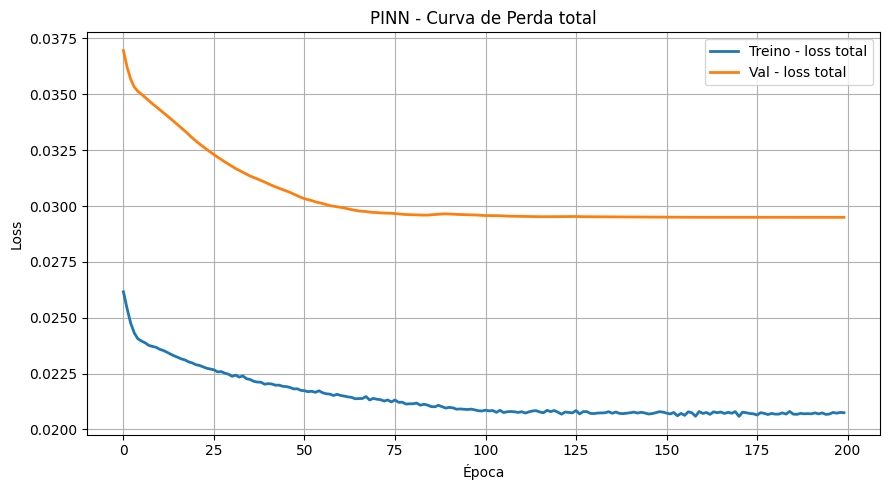

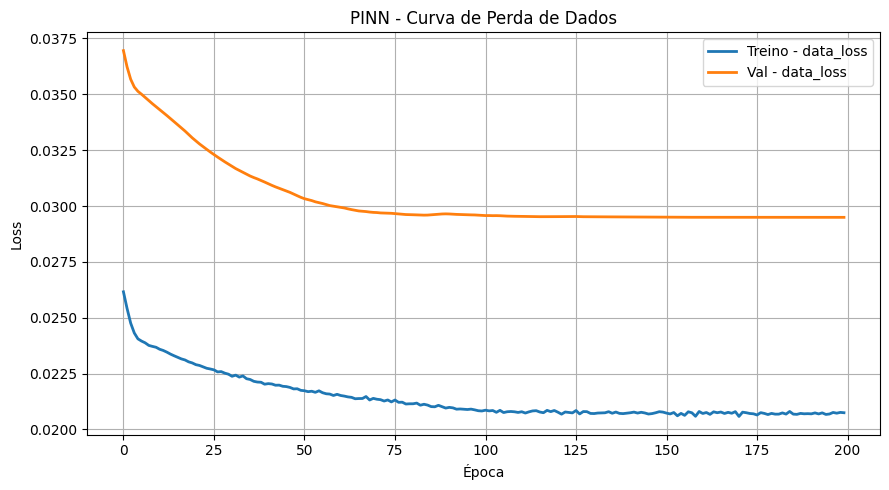

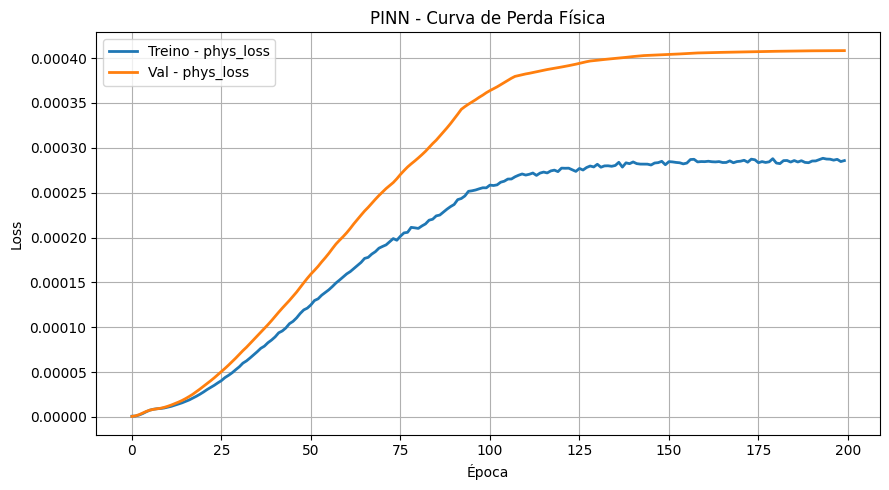

In [41]:
# ------------------------------------------------------------
# 6) Loss curves
# ------------------------------------------------------------
plt.figure(figsize=(9, 5))
plt.plot(hist.history["loss"], label="Treino - loss total", linewidth=2)
if "val_loss" in hist.history:
    plt.plot(hist.history["val_loss"], label="Val - loss total", linewidth=2)
plt.xlabel("Época")
plt.ylabel("Loss")
plt.title("PINN - Curva de Perda total")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("pinn_loss_total-pt.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(9, 5))
plt.plot(hist.history.get("data_loss", []), label="Treino - data_loss", linewidth=2)
if "val_data_loss" in hist.history:
    plt.plot(hist.history["val_data_loss"], label="Val - data_loss", linewidth=2)
plt.xlabel("Época")
plt.ylabel("Loss")
plt.title("PINN - Curva de Perda de Dados")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("pinn_data_loss-pt.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(9, 5))
plt.plot(hist.history.get("phys_loss", []), label="Treino - phys_loss", linewidth=2)
if "val_phys_loss" in hist.history:
    plt.plot(hist.history["val_phys_loss"], label="Val - phys_loss", linewidth=2)
plt.xlabel("Época")
plt.ylabel("Loss")
plt.title("PINN - Curva de Perda Física")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("pinn_phys_loss-pt.png", dpi=300, bbox_inches="tight")
plt.show()

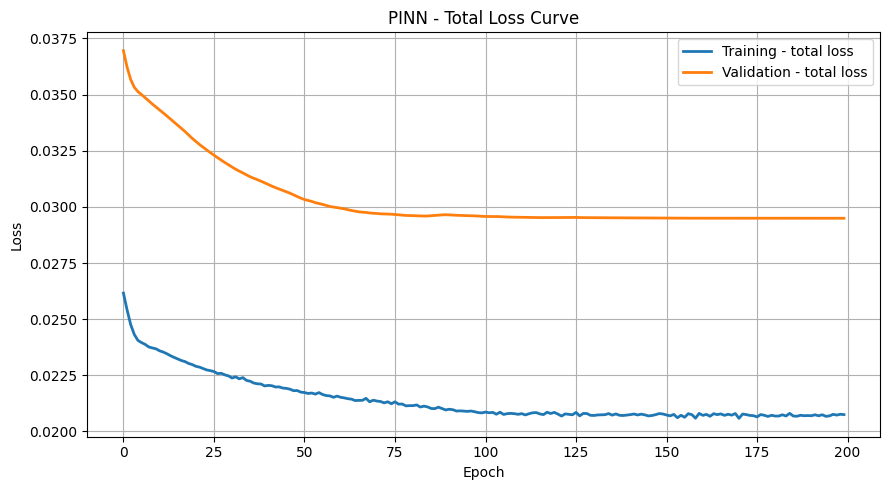

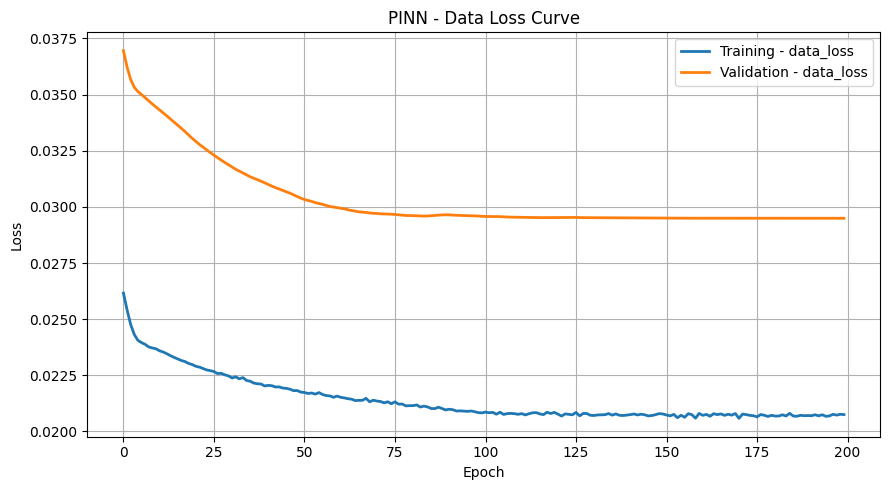

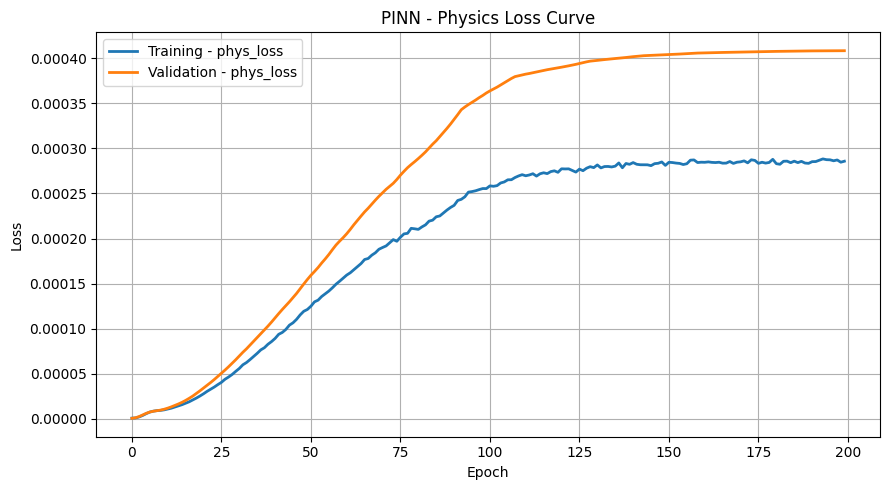

In [42]:
# ------------------------------------------------------------
# 6) Loss curves
# ------------------------------------------------------------
plt.figure(figsize=(9, 5))
plt.plot(hist.history["loss"], label="Training - total loss", linewidth=2)
if "val_loss" in hist.history:
    plt.plot(hist.history["val_loss"], label="Validation - total loss", linewidth=2)
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("PINN - Total Loss Curve")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("pinn_loss_total-en.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(9, 5))
plt.plot(hist.history.get("data_loss", []), label="Training - data_loss", linewidth=2)
if "val_data_loss" in hist.history:
    plt.plot(hist.history["val_data_loss"], label="Validation - data_loss", linewidth=2)
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("PINN - Data Loss Curve")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("pinn_data_loss-en.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(9, 5))
plt.plot(hist.history.get("phys_loss", []), label="Training - phys_loss", linewidth=2)
if "val_phys_loss" in hist.history:
    plt.plot(hist.history["val_phys_loss"], label="Validation - phys_loss", linewidth=2)
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("PINN - Physics Loss Curve")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("pinn_phys_loss-en.png", dpi=300, bbox_inches="tight")
plt.show()

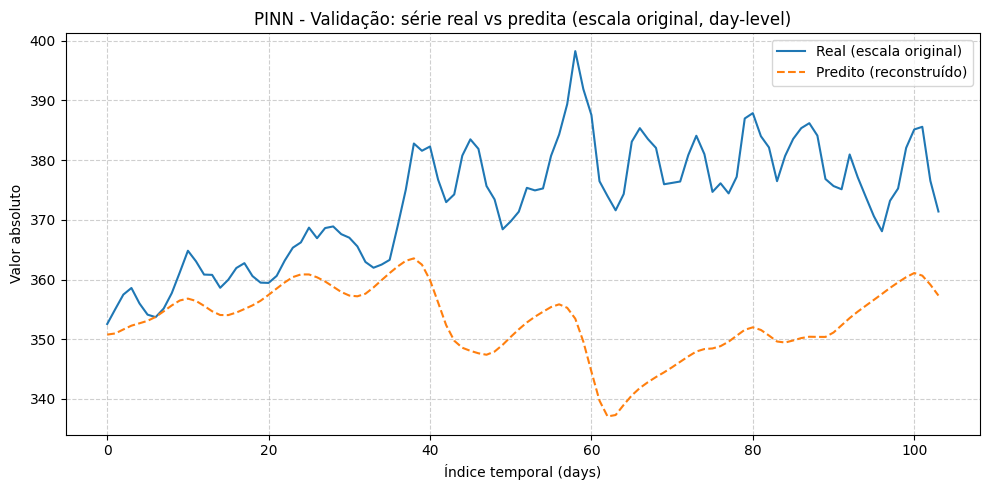

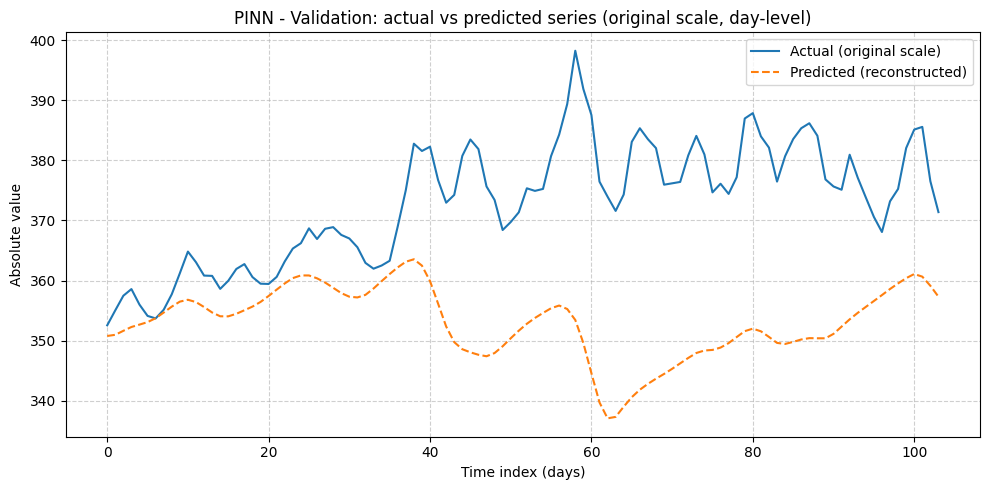


📊 PINN - Métricas em escala ABSOLUTA (reconstruída):
MSE(abs)  = 5.8778e+08
RMSE(abs) = 2.4244e+04
R²(abs)   = -4.6492
Window    = 24
Batch     = 64
lambda    = 0.0010000000474974513
omega     = 0.2617993950843811

📊 PINN - Metrics in ABSOLUTE scale (reconstructed):
MSE(abs)  = 5.8778e+08
RMSE(abs) = 2.4244e+04
R²(abs)   = -4.6492
Window    = 24
Batch     = 64
lambda    = 0.0010000000474974513
omega     = 0.2617993950843811


In [43]:
# ------------------------------------------------------------
# 7) Predict on validation
# ------------------------------------------------------------
y_pred_seq_pinn = model_pinn.predict(
    X_test_pinn,
    batch_size=BATCH_SIZE_PINN,
    verbose=0
)

y_pred_delta_pinn = y_pred_seq_pinn[:, -1, 0]

# inverse normalization
y_test_inv_pinn = scaler.inverse_transform(
    np.asarray(y_test_pinn).reshape(-1, 1)
).ravel()

y_pred_inv_pinn = scaler.inverse_transform(
    np.asarray(y_pred_delta_pinn).reshape(-1, 1)
).ravel()

# reconstruct absolute scale
base_value = series[split + BEST_WINDOW_PINN - 1]

y_pred_abs_pinn = base_value + np.cumsum(y_pred_inv_pinn)
y_test_abs_pinn = base_value + np.cumsum(y_test_inv_pinn)

# convert to TB
y_pred_abs_pinn_tb = y_pred_abs_pinn / 1024
y_test_abs_pinn_tb = y_test_abs_pinn / 1024

'''
# ------------------------------------------------------------
# 7) Predict on validation
# FIX: use X_test_pinn / y_test_pinn / BEST_WINDOW_PINN / BATCH_SIZE_PINN
# ------------------------------------------------------------
y_pred_seq_pinn = model_pinn.predict(X_test_pinn, batch_size=BATCH_SIZE_PINN, verbose=0)
y_pred_delta_pinn = y_pred_seq_pinn[:, -1, 0]

y_test_inv_pinn, y_pred_inv_pinn = inverse_transform_and_eval(
    y_test_pinn,
    y_pred_delta_pinn,
    scaler
)

base_value = series[split + BEST_WINDOW_PINN - 1]
y_pred_abs_pinn = base_value + np.cumsum(y_pred_inv_pinn)
y_test_abs_pinn = base_value + np.cumsum(y_test_inv_pinn)

y_pred_abs_pinn_tb = y_pred_abs_pinn / 1024
y_test_abs_pinn_tb = y_test_abs_pinn / 1024
'''

# ------------------------------------------------------------
# 8) Plot absolute-scale validation
# ------------------------------------------------------------
plt.figure(figsize=(10, 5))
plt.plot(y_test_abs_pinn_tb, label="Real (escala original)")
plt.plot(y_pred_abs_pinn_tb, label="Predito (reconstruído)", linestyle="--")
plt.title(f"PINN - Validação: série real vs predita (escala original, {time_unit}-level)")
plt.xlabel(f"Índice temporal ({time_unit}s)")
plt.ylabel("Valor absoluto")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.savefig("pinn_val_real_vs_pred-pt.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(y_test_abs_pinn_tb, label="Actual (original scale)")
plt.plot(y_pred_abs_pinn_tb, label="Predicted (reconstructed)", linestyle="--")
plt.title(f"PINN - Validation: actual vs predicted series (original scale, {time_unit}-level)")
plt.xlabel(f"Time index ({time_unit}s)")
plt.ylabel("Absolute value")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.savefig("pinn_val_real_vs_pred-en.png", dpi=300, bbox_inches="tight")
plt.show()

# ------------------------------------------------------------
# 9) Absolute-scale metrics
# ------------------------------------------------------------
mse_abs_pinn = mean_squared_error(y_test_abs_pinn, y_pred_abs_pinn)
rmse_abs_pinn = math.sqrt(mse_abs_pinn)
r2_abs_pinn = r2_score(y_test_abs_pinn, y_pred_abs_pinn)

print("\n📊 PINN - Métricas em escala ABSOLUTA (reconstruída):")
print(f"MSE(abs)  = {mse_abs_pinn:,.4e}")
print(f"RMSE(abs) = {rmse_abs_pinn:,.4e}")
print(f"R²(abs)   = {r2_abs_pinn:.4f}")
print(f"Window    = {BEST_WINDOW_PINN}")
print(f"Batch     = {BATCH_SIZE_PINN}")
print(f"lambda    = {float(model_pinn.lambda_phys.numpy())}")
print(f"omega     = {float(model_pinn.omega.numpy())}")

print("\n📊 PINN - Metrics in ABSOLUTE scale (reconstructed):")
print(f"MSE(abs)  = {mse_abs_pinn:,.4e}")
print(f"RMSE(abs) = {rmse_abs_pinn:,.4e}")
print(f"R²(abs)   = {r2_abs_pinn:.4f}")
print(f"Window    = {BEST_WINDOW_PINN}")
print(f"Batch     = {BATCH_SIZE_PINN}")
print(f"lambda    = {float(model_pinn.lambda_phys.numpy())}")
print(f"omega     = {float(model_pinn.omega.numpy())}")

In [44]:
# ============================================================
# ✅ PINN AVALIAÇÃO TREINO vs VALIDAÇÃO
# ============================================================

def inverse_transform_and_eval_pinn(X_t, y_t):
    y_pred_seq = model_pinn.predict(
        X_t,
        batch_size=BATCH_SIZE_PINN,
        verbose=0
    )

    # PINN/PINN returns sequence output: use last time step
    y_pred_delta = y_pred_seq[:, -1, 0]

    y_t_inv = scaler.inverse_transform(
        y_t.reshape(-1, 1)
    ).flatten()

    y_pred_inv = scaler.inverse_transform(
        y_pred_delta.reshape(-1, 1)
    ).flatten()

    mse = mean_squared_error(y_t_inv, y_pred_inv)
    rmse = math.sqrt(mse)
    r2 = r2_score(y_t_inv, y_pred_inv)

    return y_t_inv, y_pred_inv, mse, rmse, r2


y_train_inv_pinn, y_pred_train_inv_pinn, mse_train_pinn, rmse_train_pinn, r2_train_pinn = inverse_transform_and_eval_pinn(
    X_train_pinn,
    y_train_pinn
)

y_test_inv_pinn, y_pred_inv_pinn, mse_test_pinn, rmse_test_pinn, r2_test_pinn = inverse_transform_and_eval_pinn(
    X_test_pinn,
    y_test_pinn
)


print("\n📊 PINN Comparação Treino vs Validação:")
print(f"{'Métrica':<10} | {'Treino':>15} | {'Validação':>15}")
print("-"*45)
print(f"{'MSE':<10} | {mse_train_pinn:>15.4e} | {mse_test_pinn:>15.4e}")
print(f"{'RMSE':<10} | {rmse_train_pinn:>15.4e} | {rmse_test_pinn:>15.4e}")
print(f"{'R²':<10} | {r2_train_pinn:>15.4f} | {r2_test_pinn:>15.4f}")
print(f"Window    = {BEST_WINDOW_PINN}")
print(f"Batch     = {BATCH_SIZE_PINN}")
print(f"lambda    = {float(model_pinn.lambda_phys.numpy())}")
print(f"omega     = {float(model_pinn.omega.numpy())}")


print("\n📊 PINN Train vs Validation Comparison:")
print(f"{'Metric':<10} | {'Train':>15} | {'Validation':>15}")
print("-"*45)
print(f"{'MSE':<10} | {mse_train_pinn:>15.4e} | {mse_test_pinn:>15.4e}")
print(f"{'RMSE':<10} | {rmse_train_pinn:>15.4e} | {rmse_test_pinn:>15.4e}")
print(f"{'R²':<10} | {r2_train_pinn:>15.4f} | {r2_test_pinn:>15.4f}")
print(f"Window    = {BEST_WINDOW_PINN}")
print(f"Batch     = {BATCH_SIZE_PINN}")
print(f"lambda    = {float(model_pinn.lambda_phys.numpy())}")
print(f"omega     = {float(model_pinn.omega.numpy())}")


📊 PINN Comparação Treino vs Validação:
Métrica    |          Treino |       Validação
---------------------------------------------
MSE        |      9.2043e+06 |      1.2626e+07
RMSE       |      3.0339e+03 |      3.5533e+03
R²         |          0.1286 |          0.1711
Window    = 24
Batch     = 64
lambda    = 0.0010000000474974513
omega     = 0.2617993950843811

📊 PINN Train vs Validation Comparison:
Metric     |           Train |      Validation
---------------------------------------------
MSE        |      9.2043e+06 |      1.2626e+07
RMSE       |      3.0339e+03 |      3.5533e+03
R²         |          0.1286 |          0.1711
Window    = 24
Batch     = 64
lambda    = 0.0010000000474974513
omega     = 0.2617993950843811



📊 PINN - Forecast (em TB):
Passo 001: 369.151 TB
Passo 002: 366.867 TB
Passo 003: 364.158 TB
Passo 004: 361.960 TB
Passo 005: 360.896 TB
Passo 006: 361.128 TB
Passo 007: 362.154 TB
Passo 008: 363.307 TB
Passo 009: 364.436 TB
Passo 010: 365.485 TB
Passo 011: 366.452 TB
Passo 012: 367.255 TB
Passo 013: 367.672 TB
Passo 014: 367.779 TB
Passo 015: 367.703 TB
Passo 016: 367.597 TB
Passo 017: 367.568 TB
Passo 018: 367.676 TB
Passo 019: 367.928 TB
Passo 020: 368.299 TB
Passo 021: 368.757 TB
Passo 022: 369.269 TB
Passo 023: 369.789 TB
Passo 024: 370.327 TB
Passo 025: 370.802 TB
Passo 026: 371.197 TB
Passo 027: 371.514 TB
Passo 028: 371.771 TB
Passo 029: 371.999 TB
Passo 030: 372.230 TB
Passo 031: 372.493 TB
Passo 032: 372.803 TB
Passo 033: 373.159 TB
Passo 034: 373.551 TB
Passo 035: 373.960 TB
Passo 036: 374.371 TB
Passo 037: 374.770 TB
Passo 038: 375.147 TB
Passo 039: 375.500 TB
Passo 040: 375.834 TB
Passo 041: 376.154 TB
Passo 042: 376.471 TB
Passo 043: 376.792 TB
Passo 044: 377.123 TB
Pass

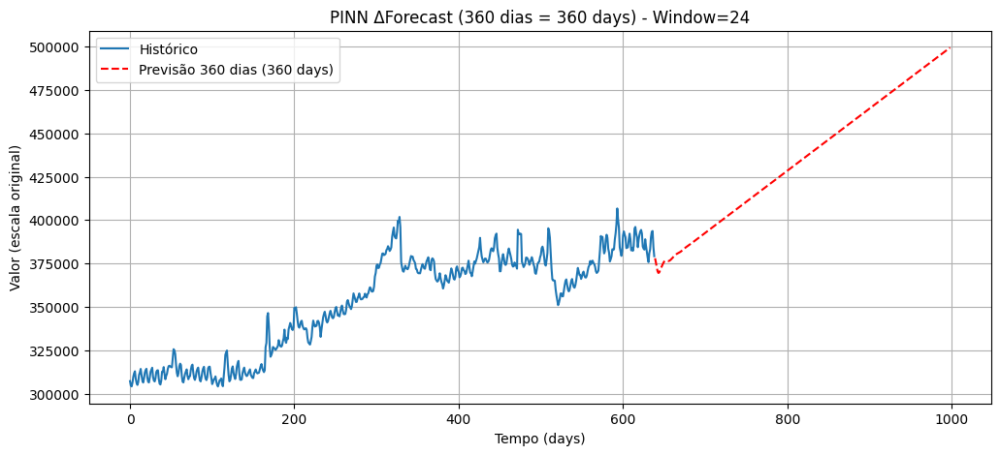

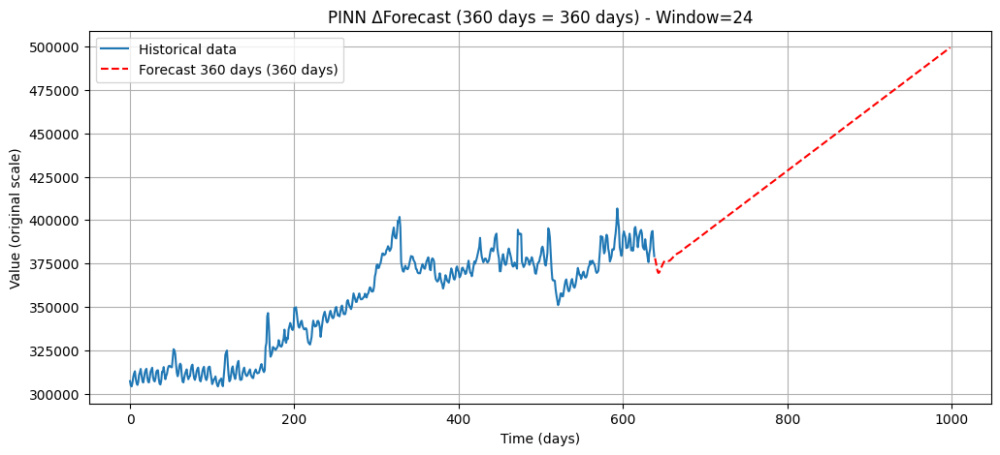

In [45]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# ============================================================
#  ✅ PINN (PINNSeq) - FORECAST (recursive / rolling)
#  - entrada float32
#  - fixa shape (evita "unknown rank")
#  - chama o modelo direto (sem predict)
#  - usa o ÚLTIMO delta da sequência (consistente com train_step)
# ============================================================

# use a base normalizada do notebook (para janela LSTM/PINN)
diff_norm32_pinn = np.asarray(diff_norm, dtype=np.float32)
last_window_pinn = diff_norm32_pinn[-BEST_WINDOW_PINN:].reshape(1, BEST_WINDOW_PINN, 1)  # (1,24,1) float32

forecast_diffs_pinn = []

for _ in range(FORECAST_STEPS):
    # cria Tensor e fixa shape
    x = tf.convert_to_tensor(last_window_pinn, dtype=tf.float32)
    x = tf.ensure_shape(x, (1, BEST_WINDOW_PINN, 1))

    # CHAMA O MODELO DIRETO (sem predict)
    y_seq = model_pinn(x, training=False)          # Tensor (1, window, 1)
    yhat  = float(y_seq.numpy()[0, -1, 0])         # pega o último delta (escalar)

    forecast_diffs_pinn.append(yhat)

    # desliza janela mantendo float32
    last_window_pinn = np.concatenate(
        [last_window_pinn[:, 1:, :],
         np.array(yhat, dtype=np.float32).reshape(1, 1, 1)],
        axis=1
    ).astype(np.float32)

# inverte escala (mesmo scaler do notebook)
forecast_diffs_inv_pinn = scaler.inverse_transform(
    np.array(forecast_diffs_pinn, dtype=np.float32).reshape(-1, 1)
).ravel()

# reconstrói absoluto
forecast_abs_pinn = series[-1] + np.cumsum(forecast_diffs_inv_pinn)
#forecast_abs_pinn = forecast_abs_pinn / 1024

# TB (decimal). Se quiser TiB: /(1024**4)
forecast_tb_pinn = forecast_abs_pinn / 1024

print("\n📊 PINN - Forecast (em TB):")
for i, val in enumerate(forecast_tb_pinn, start=1):
    print(f"Passo {i:03d}: {val:.3f} TB")
print(f"\n🔮 Último valor previsto ({FORECAST_DAYS} dias à frente): {forecast_tb_pinn[-1]:.3f} TB")

x_fore_pinn = np.arange(len(series), len(series) + FORECAST_STEPS)

plt.figure(figsize=(12, 5))
plt.plot(series, label="Histórico")
plt.plot(x_fore_pinn, forecast_abs_pinn, "r--",
         label=f"Previsão {FORECAST_DAYS} dias ({FORECAST_STEPS} {time_unit}s)")
plt.title(f"PINN ΔForecast ({FORECAST_DAYS} dias = {FORECAST_STEPS} {time_unit}s) - Window={BEST_WINDOW_LSTM}")
plt.xlabel(f"Tempo ({time_unit}s)")
plt.ylabel("Valor (escala original)")
plt.legend()
plt.grid(True)
#plt.savefig("pinn_forecast_pt.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(12, 5))
plt.plot(series, label="Historical data")
plt.plot(x_fore_pinn, forecast_abs_pinn, "r--",
         label=f"Forecast {FORECAST_DAYS} days ({FORECAST_STEPS} {time_unit}s)")
plt.title(f"PINN ΔForecast ({FORECAST_DAYS} days = {FORECAST_STEPS} {time_unit}s) - Window={BEST_WINDOW_LSTM}")
plt.xlabel(f"Time ({time_unit}s)")
plt.ylabel("Value (original scale)")
plt.legend()
plt.grid(True)
#plt.savefig("pinn_forecast-en.png", dpi=300, bbox_inches="tight")
plt.show()



📊 PINN - Forecast (em TB):
Passo 001: 369.151 TB
Passo 002: 366.867 TB
Passo 003: 364.158 TB
Passo 004: 361.960 TB
Passo 005: 360.896 TB
Passo 006: 361.128 TB
Passo 007: 362.154 TB
Passo 008: 363.307 TB
Passo 009: 364.436 TB
Passo 010: 365.485 TB
Passo 011: 366.452 TB
Passo 012: 367.255 TB
Passo 013: 367.672 TB
Passo 014: 367.779 TB
Passo 015: 367.703 TB
Passo 016: 367.597 TB
Passo 017: 367.568 TB
Passo 018: 367.676 TB
Passo 019: 367.928 TB
Passo 020: 368.299 TB
Passo 021: 368.757 TB
Passo 022: 369.269 TB
Passo 023: 369.789 TB
Passo 024: 370.327 TB
Passo 025: 370.802 TB
Passo 026: 371.197 TB
Passo 027: 371.514 TB
Passo 028: 371.771 TB
Passo 029: 371.999 TB
Passo 030: 372.230 TB
Passo 031: 372.493 TB
Passo 032: 372.803 TB
Passo 033: 373.159 TB
Passo 034: 373.551 TB
Passo 035: 373.960 TB
Passo 036: 374.371 TB
Passo 037: 374.770 TB
Passo 038: 375.147 TB
Passo 039: 375.500 TB
Passo 040: 375.834 TB
Passo 041: 376.154 TB
Passo 042: 376.471 TB
Passo 043: 376.792 TB
Passo 044: 377.123 TB
Pass

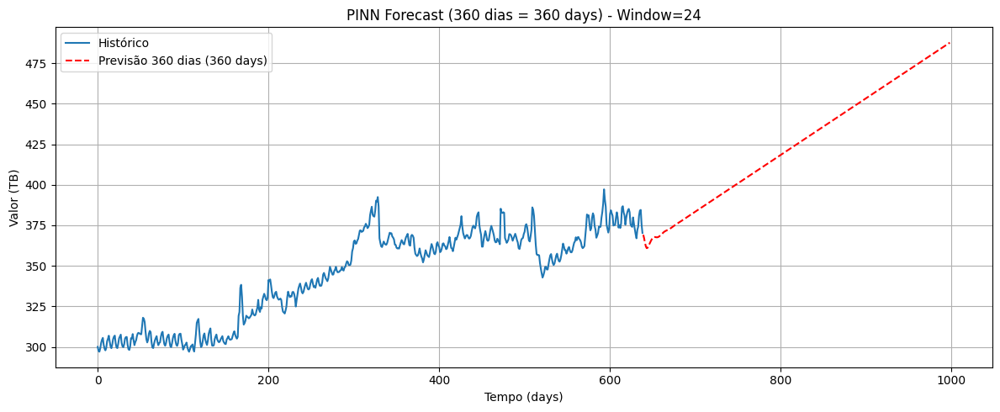

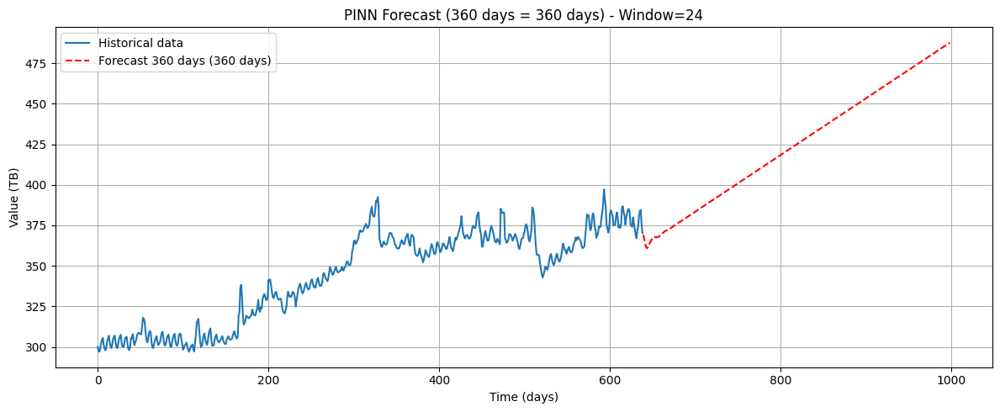

In [46]:
# TB (decimal). Se quiser TiB: /(1024**4)
series_tb = np.asarray(series, dtype=np.float64) / 1024
forecast_tb_pinn = np.asarray(forecast_abs_pinn, dtype=np.float64) / 1024

print("\n📊 PINN - Forecast (em TB):")
for i, val in enumerate(forecast_tb_pinn, start=1):
    print(f"Passo {i:03d}: {val:.3f} TB")

print(f"\n🔮 Último valor previsto ({FORECAST_DAYS} dias à frente): {forecast_tb_pinn[-1]:.3f} TB")

# eixo x
x_hist = np.arange(len(series_tb))
x_fore_pinn = np.arange(len(series_tb), len(series_tb) + FORECAST_STEPS)

# gráfico em português
plt.figure(figsize=(12, 5))
plt.plot(x_hist, series_tb, label="Histórico")
plt.plot(
    x_fore_pinn,
    forecast_tb_pinn,
    "r--",
    label=f"Previsão {FORECAST_DAYS} dias ({FORECAST_STEPS} {time_unit}s)"
)
plt.title(f"PINN Forecast ({FORECAST_DAYS} dias = {FORECAST_STEPS} {time_unit}s) - Window={BEST_WINDOW_PINN}")
plt.xlabel(f"Tempo ({time_unit}s)")
plt.ylabel("Valor (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("pinn_forecast-pt.png", dpi=300, bbox_inches="tight")
plt.show()

# gráfico em inglês
plt.figure(figsize=(12, 5))
plt.plot(x_hist, series_tb, label="Historical data")
plt.plot(
    x_fore_pinn,
    forecast_tb_pinn,
    "r--",
    label=f"Forecast {FORECAST_DAYS} days ({FORECAST_STEPS} {time_unit}s)"
)
plt.title(f"PINN Forecast ({FORECAST_DAYS} days = {FORECAST_STEPS} {time_unit}s) - Window={BEST_WINDOW_PINN}")
plt.xlabel(f"Time ({time_unit}s)")
plt.ylabel("Value (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("pinn_forecast-en.png", dpi=300, bbox_inches="tight")
plt.show()

In [47]:
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# =========================
# TRAIN
# =========================
y_pred_train_seq_pinn = model_pinn.predict(X_train_pinn, verbose=0)
y_pred_train_pinn = y_pred_train_seq_pinn[:, -1, 0]

y_train_true_pinn = y_train_pinn.ravel()

mse_train_pinn = mean_squared_error(y_train_true_pinn, y_pred_train_pinn)
rmse_train_pinn = np.sqrt(mse_train_pinn)
r2_train_pinn = r2_score(y_train_true_pinn, y_pred_train_pinn)

# =========================
# TEST
# =========================
y_pred_test_seq_pinn = model_pinn.predict(X_test_pinn, verbose=0)
y_pred_test_pinn = y_pred_test_seq_pinn[:, -1, 0]

y_test_true_pinn = y_test_pinn.ravel()

mse_test_pinn = mean_squared_error(y_test_true_pinn, y_pred_test_pinn)
rmse_test_pinn = np.sqrt(mse_test_pinn)
r2_test_pinn = r2_score(y_test_true_pinn, y_pred_test_pinn)

In [48]:
if SAVE == 1:
    # ============================================================
    # 💾 SAVE EVERYTHING - PINN / PINNSeq
    # ============================================================

    import os
    import json
    import shutil
    import joblib
    import numpy as np
    import pandas as pd

    MODEL_NAME = "pinn"

    os.makedirs(BASE_PATH, exist_ok=True)

    # ============================================================
    # 1) SAVE WEIGHTS
    # ============================================================
    model_pinn.save_weights(f"{BASE_PATH}/{MODEL_NAME}_model.weights.h5")

    # ============================================================
    # 2) SAVE SCALER
    # ============================================================
    joblib.dump(scaler, f"{BASE_PATH}/{MODEL_NAME}_scaler.save")

    # ============================================================
    # 3) SAVE CONFIG
    # ============================================================
    config_pinn = {
        "window": int(BEST_WINDOW_PINN),
        "epochs": int(EPOCHS_PINN),
        "batch_size": int(BATCH_SIZE_PINN),
        "omega": float(omega),
        "lambda_phys": float(model_pinn.lambda_phys.numpy()),
        "dt": float(model_pinn.dt.numpy()),
        "forecast_steps": int(FORECAST_STEPS),
        "forecast_days": int(FORECAST_DAYS),
        "time_unit": str(time_unit),
        "train_size": int(split),
        "architecture": "LSTM seq (64->32) + TimeDistributed Dense + Physics Loss"
    }

    with open(f"{BASE_PATH}/{MODEL_NAME}_config.json", "w") as f:
        json.dump(config_pinn, f, indent=4)

    # ============================================================
    # 4) SAVE TRAINING HISTORY
    # ============================================================
    hist_dict = {
        "loss": hist.history.get("loss", []),
        "val_loss": hist.history.get("val_loss", []),
        "data_loss": hist.history.get("data_loss", []),
        "val_data_loss": hist.history.get("val_data_loss", []),
        "phys_loss": hist.history.get("phys_loss", []),
        "val_phys_loss": hist.history.get("val_phys_loss", []),
    }

    for k, v in hist_dict.items():
        np.save(f"{BASE_PATH}/{MODEL_NAME}_{k}.npy", np.array(v, dtype=np.float64))

    df_pinn_loss = pd.DataFrame({
        "epoch": range(1, len(hist.history["loss"]) + 1),
        "loss_total": hist.history.get("loss"),
        "val_loss_total": hist.history.get("val_loss"),
        "data_loss": hist.history.get("data_loss"),
        "val_data_loss": hist.history.get("val_data_loss"),
        "phys_loss": hist.history.get("phys_loss"),
        "val_phys_loss": hist.history.get("val_phys_loss"),
    })
    df_pinn_loss.to_csv(f"{BASE_PATH}/{MODEL_NAME}_loss_curve.csv", index=False)

    # ============================================================
    # 5) SAVE METRICS
    # ============================================================
    metrics_pinn = {
        "final_loss": float(hist.history["loss"][-1]),
        "best_val_loss": float(min(hist.history["val_loss"])) if "val_loss" in hist.history else None,

        "mse_train_scaled": float(mse_train_pinn),
        "rmse_train_scaled": float(rmse_train_pinn),
        "r2_train_scaled": float(r2_train_pinn),

        "mse_test_scaled": float(mse_test_pinn),
        "rmse_test_scaled": float(rmse_test_pinn),
        "r2_test_scaled": float(r2_test_pinn),

        "mse_abs": float(mse_abs_pinn),
        "rmse_abs": float(rmse_abs_pinn),
        "r2_abs": float(r2_abs_pinn),

        "forecast_last_tb": float(forecast_tb_pinn[-1]),
    }

    with open(f"{BASE_PATH}/{MODEL_NAME}_metrics.json", "w") as f:
        json.dump(metrics_pinn, f, indent=4)

    # ============================================================
    # 6) SAVE DATA ARRAYS
    # ============================================================
    np.save(f"{BASE_PATH}/X_train_{MODEL_NAME}.npy", X_train_pinn)
    np.save(f"{BASE_PATH}/y_train_{MODEL_NAME}.npy", y_train_pinn)
    np.save(f"{BASE_PATH}/X_test_{MODEL_NAME}.npy", X_test_pinn)
    np.save(f"{BASE_PATH}/y_test_{MODEL_NAME}.npy", y_test_pinn)

    # preds escala normalizada
    np.save(f"{BASE_PATH}/y_pred_train_seq_{MODEL_NAME}.npy", y_pred_train_seq_pinn)
    np.save(f"{BASE_PATH}/y_pred_train_{MODEL_NAME}.npy", y_pred_train_pinn)
    np.save(f"{BASE_PATH}/y_pred_test_seq_{MODEL_NAME}.npy", y_pred_test_seq_pinn)
    np.save(f"{BASE_PATH}/y_pred_test_{MODEL_NAME}.npy", y_pred_test_pinn)

    # inversões para escala original dos deltas
    np.save(f"{BASE_PATH}/y_test_inv_{MODEL_NAME}.npy", y_test_inv_pinn)
    np.save(f"{BASE_PATH}/y_pred_inv_{MODEL_NAME}.npy", y_pred_inv_pinn)

    # ============================================================
    # 7) SAVE ABSOLUTE RECONSTRUCTION
    # ============================================================
    np.save(f"{BASE_PATH}/y_test_abs_{MODEL_NAME}.npy", y_test_abs_pinn)
    np.save(f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}.npy", y_pred_abs_pinn)
    np.save(f"{BASE_PATH}/y_test_abs_{MODEL_NAME}_tb.npy", y_test_abs_pinn_tb)
    np.save(f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}_tb.npy", y_pred_abs_pinn_tb)

    # ============================================================
    # 8) SAVE FORECAST
    # ============================================================
    np.save(f"{BASE_PATH}/forecast_diffs_{MODEL_NAME}.npy", np.array(forecast_diffs_pinn))
    np.save(f"{BASE_PATH}/forecast_diffs_inv_{MODEL_NAME}.npy", forecast_diffs_inv_pinn)
    np.save(f"{BASE_PATH}/forecast_abs_{MODEL_NAME}.npy", forecast_abs_pinn)
    np.save(f"{BASE_PATH}/forecast_tb_{MODEL_NAME}.npy", forecast_tb_pinn)

    try:
        np.save(f"{BASE_PATH}/last_window_{MODEL_NAME}.npy", last_window_pinn)
    except NameError:
        pass

    # ============================================================
    # 9) SAVE PREPROCESSING REFERENCES
    # ============================================================
    np.save(f"{BASE_PATH}/series_original.npy", series)
    np.save(f"{BASE_PATH}/diff_series.npy", diff_series)
    np.save(f"{BASE_PATH}/diff_train.npy", diff_train)
    np.save(f"{BASE_PATH}/diff_test.npy", diff_test)
    np.save(f"{BASE_PATH}/diff_train_norm.npy", diff_train_norm)
    np.save(f"{BASE_PATH}/diff_test_norm.npy", diff_test_norm)

    # ============================================================
    # 10) SAVE RECONSTRUCTION INFO
    # ============================================================
    reconstruction_info_pinn = {
        "split": int(split),
        "base_value": float(base_value),
        "series_last_value": float(series[-1]),
    }
    with open(f"{BASE_PATH}/reconstruction_info_{MODEL_NAME}.json", "w") as f:
        json.dump(reconstruction_info_pinn, f, indent=4)

    # ============================================================
    # 11) COPY FIGURES
    # ============================================================
    figure_files = [
        "pinn_loss_total-pt.png",
        "pinn_data_loss-pt.png",
        "pinn_phys_loss-pt.png",
        "pinn_val_real_vs_pred-pt.png",
        "pinn_val_real_vs_pred-en.png",
        "pinn_forecast-pt.png",
        "pinn_forecast-en.png",
    ]

    for fig in figure_files:
        if os.path.exists(fig):
            dest = os.path.join(BASE_PATH, fig)
            if os.path.abspath(fig) != os.path.abspath(dest):
                shutil.copy2(fig, dest)

    # ============================================================
    # ✅ SUMMARY
    # ============================================================
    print(f"✅ All PINN artifacts saved in:\n{BASE_PATH}")

# TFKAN

In [49]:
import tensorflow as tf
import keras
from keras import Model, Input
from keras.layers import Dense, Reshape
import keras.ops as ops
from keras.optimizers import Adam

# ============================================================
#  SimpleKANLayer (base + "spline")
# ============================================================
class SimpleKANLayer(keras.layers.Layer):
    """
    KAN simplificado: combinação de:
      - base = Dense(SiLU(x))
      - spline = MLP raso sobre x
    Saída: base + spline
    """
    def __init__(self, units, name=None, **kwargs):
        super().__init__(name=name, **kwargs)
        self.units = units

    def build(self, input_shape):
        # Cuidado com self.name None: não usar concatenação direta
        base_name  = (self.name or "simple_kan") + "_base"
        spl1_name  = (self.name or "simple_kan") + "_spl1"
        spl2_name  = (self.name or "simple_kan") + "_spl2"

        self.base_dense = Dense(self.units, use_bias=True, name=base_name)
        self.spline_dense1 = Dense(self.units, activation="tanh", name=spl1_name)
        self.spline_dense2 = Dense(self.units, activation="tanh", name=spl2_name)

        super().build(input_shape)

    def call(self, x):
        # Base: W_base * SiLU(x)
        base = self.base_dense(ops.silu(x))
        # "Spline": shallow MLP over x
        spline = self.spline_dense2(self.spline_dense1(x))
        # Combinação
        return base + spline


# ============================================================
#  FreqKAN Block (FFT -> KAN -> IFFT)
# ============================================================
class FreqKANBlock(keras.layers.Layer):
    """
    Bloco de frequência para TFKAN.

    Entrada:  (B, L, d)   = freq_embed
    Saída:    (B, L, d)   = freq_time (sinal no domínio do tempo)
    """
    def __init__(self, d_model, window, name=None, **kwargs):
        super().__init__(name=name, **kwargs)
        self.d_model = d_model
        self.window = window

    def build(self, input_shape):
        # KAN compartilhado para real e imaginário
        freq_kan_name = (self.name or "freq_block") + "_kan"
        self.freq_kan = SimpleKANLayer(self.d_model, name=freq_kan_name)
        super().build(input_shape)

    def call(self, freq_embed):
        # freq_embed: (B, L, d)
        # 1. Transpor para FFT ao longo de L: (B, L, d) -> (B, d, L)
        freq_t = ops.transpose(freq_embed, axes=(0, 2, 1))

        # 2. FFT real -> complexo: (B, d, L_fft), L_fft = floor(L/2)+1
        freq_fft = tf.signal.rfft(freq_t)

        # 3. Separar real/imaginário e voltar para (B, L_fft, d)
        real = ops.transpose(tf.math.real(freq_fft), axes=(0, 2, 1))
        imag = ops.transpose(tf.math.imag(freq_fft), axes=(0, 2, 1))

        # 4. Aplicar KAN nos dois ramos (compartilhando pesos)
        real_out = self.freq_kan(real)   # (B, L_fft, d)
        imag_out = self.freq_kan(imag)   # (B, L_fft, d)

        # 5. Reconstruir espectro complexo: (B, L_fft, d) -> (B, d, L_fft)
        real_out_t = ops.transpose(real_out, axes=(0, 2, 1))
        imag_out_t = ops.transpose(imag_out, axes=(0, 2, 1))
        z_complex = tf.complex(real_out_t, imag_out_t)

        # 6. IFFT para voltar ao tempo
        # ⚠️ Importante: NÃO passar fft_length manualmente — ele será inferido
        # a partir de L_fft, voltando exatamente para L original.
        freq_time_t = tf.signal.irfft(z_complex)  # (B, d, L)

        # 7. Transpor de volta para (B, L, d)
        freq_time = ops.transpose(freq_time_t, axes=(0, 2, 1))
        return freq_time


# ============================================================
#  TFKAN model builder
# ============================================================
def build_tfkan(window,
                n_features=1,
                d_model=128,
                forecast_steps=1,
                learning_rate=1e-4):

    # --------------------------------------------------------
    #  Input: (batch, L, N)
    # --------------------------------------------------------
    inputs = Input(shape=(window, n_features), name="input_series")

    # --------------------------------------------------------
    #  Embeddings (ajuste de dimensão)
    # --------------------------------------------------------
    freq_embed = Dense(d_model, use_bias=False, name="freq_embedding")(inputs)
    time_embed = Dense(d_model, use_bias=False, name="time_embedding")(inputs)

    # --------------------------------------------------------
    #  Ramo de frequência (FreqKAN)
    # --------------------------------------------------------
    freq_time = FreqKANBlock(d_model=d_model, window=window, name="freq_block")(freq_embed)

    # --------------------------------------------------------
    #  Ramo de tempo (TimeKAN)
    # --------------------------------------------------------
    time_kan = SimpleKANLayer(d_model, name="time_kan")
    time_out = time_kan(time_embed)  # (B, L, d)

    # --------------------------------------------------------
    #  Fusão dos dois ramos
    # --------------------------------------------------------
    bias = freq_embed + time_embed  # (B, L, d)
    H = freq_time + time_out + bias  # (B, L, d)

    # --------------------------------------------------------
    #  KAN-based predictor
    # --------------------------------------------------------
    # Achata (B, L, d) -> (B, L*d); Keras infere L*d com -1.
    H_flat = Reshape((-1,), name="flatten_output")(H)

    pred_kan = SimpleKANLayer(forecast_steps, name="pred_kan")
    outputs = pred_kan(H_flat)  # (B, τ)

    model = Model(inputs=inputs, outputs=outputs, name="TFKAN")

    optimizer = Adam(learning_rate=learning_rate, clipnorm=1.0)
    model.compile(optimizer=optimizer, loss="mse")

    return model


In [50]:
# Example Usage (replace with your actual data):
#BEST_WINDOW = 24
#N_FEATURES = 1

# Descobrir automaticamente a janela e o número de features a partir dos dados
#BEST_WINDOW = X_train.shape[1]      # 72
N_FEATURES  = X_train_tfkan.shape[2]      # 1

#print("Usando window =", BEST_WINDOW, " | n_features =", N_FEATURES)

#model = build_tfkan(window=BEST_WINDOW_TFKAN, n_features=N_FEATURES)
#model.summary()

In [51]:
import numpy as np
import tensorflow as tf
#from tfkan_model import build_tfkan # Import the model builder

# ============================================================
#  1. Configuration and Constants
# ============================================================
# Define the constants required for the model and training
#BEST_WINDOW = 24    # L: Length of the input sequence window
#N_FEATURES = 1      # N: Number of features (e.g., 1 for a univariate time series)
#FORECAST_STEPS = 1  # τ: Number of steps to forecast ahead
#EPOCHS = 50          # Number of training epochs
#BATCH_SIZE = 32     # Training batch size
#N_SAMPLES = 2000    # Total synthetic data points to generate
D_MODEL = 128       # Internal dimension of the KAN layers

# Set the device to GPU if available, otherwise CPU
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Restrict TensorFlow to only use the first GPU
        tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
        device = "/gpu:0"
        print("Using GPU for training.")
    except RuntimeError as e:
        print(e)
        device = "/cpu:0"
        print("Falling back to CPU.")
else:
    device = "/cpu:0"
    print("Using CPU for training.")

device = "/gpu:0"

# Verify shapes
n_features = X_train_tfkan.shape[-1]
print(f"X_train shape: {X_train_tfkan.shape}")
print(f"y_train shape: {y_train_tfkan.shape}")
print(f"Number of features (N): {n_features}")
print(f"Forecast steps (τ): {FORECAST_STEPS}")
print(f"Internal dimension (d): {D_MODEL}")


Using CPU for training.
X_train shape: (486, 24, 1)
y_train shape: (486, 1)
Number of features (N): 1
Forecast steps (τ): 360
Internal dimension (d): 128


In [52]:
if RELOAD == 0:

    print("Train:", X_train_tfkan.shape, y_train_tfkan.shape)
    print("Test :", X_test_tfkan.shape, y_test_tfkan.shape)

    # τ usado no TREINO: 1 passo à frente
    FORECAST_STEPS_TRAIN = 1

    # Ajusta y para ter 2D (N, 1)
    y_train_tf = y_train_tfkan.reshape(-1, 1)
    y_test_tf  = y_test_tfkan.reshape(-1, 1)

    # ============================================================
    #  3. Modelo TFKAN + treino
    # ============================================================
    with tf.device(device):
        model_tfkan = build_tfkan(
            window=BEST_WINDOW_TFKAN,
            n_features=N_FEATURES,
            d_model=D_MODEL,
            #Eforecast_steps=FORECAST_STEPS,
            forecast_steps=FORECAST_STEPS_TRAIN,
            learning_rate=1e-4
        )
        #model.summary()

        history_tfkan = model_tfkan.fit(
            X_train_tfkan, y_train_tfkan,
            epochs=EPOCHS_TFKAN,
            batch_size=BATCH_SIZE_TFKAN,
            validation_data=(X_test_tfkan, y_test_tfkan),
            verbose=1
        )

In [53]:
if RELOAD == 1:
    # ============================================================
    # 🔄 RELOAD EVERYTHING - TFKAN
    # ============================================================

    import os
    import json
    import joblib
    import numpy as np
    import tensorflow as tf
    import keras
    from keras.models import load_model

    # ============================================================
    # CUSTOM LAYERS
    # ============================================================
    class SimpleKANLayer(keras.layers.Layer):
        def __init__(self, units, name=None, **kwargs):
            super().__init__(name=name, **kwargs)
            self.units = units

        def build(self, input_shape):
            base_name = (self.name or "simple_kan") + "_base"
            spl1_name = (self.name or "simple_kan") + "_spl1"
            spl2_name = (self.name or "simple_kan") + "_spl2"

            self.base_dense = keras.layers.Dense(self.units, use_bias=True, name=base_name)
            self.spline_dense1 = keras.layers.Dense(self.units, activation="tanh", name=spl1_name)
            self.spline_dense2 = keras.layers.Dense(self.units, activation="tanh", name=spl2_name)

            super().build(input_shape)

        def call(self, x):
            base = self.base_dense(keras.ops.silu(x))
            spline = self.spline_dense2(self.spline_dense1(x))
            return base + spline

        def get_config(self):
            config = super().get_config()
            config.update({"units": self.units})
            return config


    class FreqKANBlock(keras.layers.Layer):
        def __init__(self, d_model, window, name=None, **kwargs):
            super().__init__(name=name, **kwargs)
            self.d_model = d_model
            self.window = window

        def build(self, input_shape):
            freq_kan_name = (self.name or "freq_block") + "_kan"
            self.freq_kan = SimpleKANLayer(self.d_model, name=freq_kan_name)
            super().build(input_shape)

        def call(self, freq_embed):
            freq_t = keras.ops.transpose(freq_embed, axes=(0, 2, 1))
            freq_fft = tf.signal.rfft(freq_t)

            real = keras.ops.transpose(tf.math.real(freq_fft), axes=(0, 2, 1))
            imag = keras.ops.transpose(tf.math.imag(freq_fft), axes=(0, 2, 1))

            real_out = self.freq_kan(real)
            imag_out = self.freq_kan(imag)

            real_out_t = keras.ops.transpose(real_out, axes=(0, 2, 1))
            imag_out_t = keras.ops.transpose(imag_out, axes=(0, 2, 1))
            z_complex = tf.complex(real_out_t, imag_out_t)

            freq_time_t = tf.signal.irfft(z_complex)
            freq_time = keras.ops.transpose(freq_time_t, axes=(0, 2, 1))
            return freq_time

        def get_config(self):
            config = super().get_config()
            config.update({
                "d_model": self.d_model,
                "window": self.window,
            })
            return config

    # ============================================================
    # PATHS
    # ============================================================

    MODEL_NAME = "tfkan"

    FILE_MODEL              = f"{BASE_PATH}/{MODEL_NAME}_model.keras"
    FILE_SCALER             = f"{BASE_PATH}/{MODEL_NAME}_scaler.save"
    FILE_CONFIG             = f"{BASE_PATH}/{MODEL_NAME}_config.json"
    FILE_METRICS            = f"{BASE_PATH}/{MODEL_NAME}_metrics.json"

    FILE_TRAIN_LOSS         = f"{BASE_PATH}/train_losses_{MODEL_NAME}.npy"
    FILE_VAL_LOSS           = f"{BASE_PATH}/val_losses_{MODEL_NAME}.npy"

    FILE_X_TRAIN            = f"{BASE_PATH}/X_train_{MODEL_NAME}.npy"
    FILE_Y_TRAIN            = f"{BASE_PATH}/y_train_{MODEL_NAME}.npy"
    FILE_X_TEST             = f"{BASE_PATH}/X_test_{MODEL_NAME}.npy"
    FILE_Y_TEST             = f"{BASE_PATH}/y_test_{MODEL_NAME}.npy"

    FILE_Y_TRAIN_INV        = f"{BASE_PATH}/y_train_inv_{MODEL_NAME}.npy"
    FILE_Y_PRED_TRAIN_INV   = f"{BASE_PATH}/y_pred_train_inv_{MODEL_NAME}.npy"
    FILE_Y_TEST_INV         = f"{BASE_PATH}/y_test_inv_{MODEL_NAME}.npy"
    FILE_Y_PRED_INV         = f"{BASE_PATH}/y_pred_inv_{MODEL_NAME}.npy"

    FILE_Y_TEST_ABS         = f"{BASE_PATH}/y_test_abs_{MODEL_NAME}.npy"
    FILE_Y_PRED_ABS         = f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}.npy"
    FILE_Y_TEST_ABS_TB      = f"{BASE_PATH}/y_test_abs_{MODEL_NAME}_tb.npy"
    FILE_Y_PRED_ABS_TB      = f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}_tb.npy"

    FILE_FORECAST_DIFFS     = f"{BASE_PATH}/forecast_diffs_{MODEL_NAME}.npy"
    FILE_FORECAST_DIFFS_INV = f"{BASE_PATH}/forecast_diffs_inv_{MODEL_NAME}.npy"
    FILE_FORECAST_ABS       = f"{BASE_PATH}/forecast_abs_{MODEL_NAME}.npy"
    FILE_FORECAST_TB        = f"{BASE_PATH}/forecast_tb_{MODEL_NAME}.npy"

    FILE_SERIES             = f"{BASE_PATH}/series_original.npy"
    FILE_DIFF_SERIES        = f"{BASE_PATH}/diff_series.npy"
    FILE_DIFF_TRAIN         = f"{BASE_PATH}/diff_train.npy"
    FILE_DIFF_TEST          = f"{BASE_PATH}/diff_test.npy"
    FILE_DIFF_TRAIN_NORM    = f"{BASE_PATH}/diff_train_norm.npy"
    FILE_DIFF_TEST_NORM     = f"{BASE_PATH}/diff_test_norm.npy"

    FILE_LAST_WINDOW        = f"{BASE_PATH}/last_window_{MODEL_NAME}.npy"
    FILE_RECON_INFO         = f"{BASE_PATH}/reconstruction_info_{MODEL_NAME}.json"

    # ============================================================
    # LOAD CORE
    # ============================================================
    model_tfkan = load_model(
        FILE_MODEL,
        custom_objects={
            "SimpleKANLayer": SimpleKANLayer,
            "FreqKANBlock": FreqKANBlock,
        }
    )

    scaler = joblib.load(FILE_SCALER)

    with open(FILE_CONFIG, "r") as f:
        config_tfkan = json.load(f)

    with open(FILE_METRICS, "r") as f:
        metrics_tfkan = json.load(f)

    BEST_WINDOW_TFKAN   = config_tfkan["window"]
    EPOCHS_TFKAN        = config_tfkan["epochs"]
    BATCH_SIZE_TFKAN    = config_tfkan["batch_size"]
    FORECAST_STEPS      = config_tfkan["forecast_steps"]
    FORECAST_DAYS       = config_tfkan["forecast_days"]
    FORECAST_STEPS_TRAIN = config_tfkan["forecast_steps_train"]
    time_unit           = config_tfkan["time_unit"]
    split               = config_tfkan["train_size"]
    N_FEATURES          = config_tfkan["n_features"]
    D_MODEL             = config_tfkan["d_model"]
    '''
    # ============================================================
    # LOAD HISTORY
    # ============================================================
    train_losses_tfkan = np.load(FILE_TRAIN_LOSS)
    test_losses_tfkan  = np.load(FILE_VAL_LOSS)
    '''

    # ============================================================
    # LOAD HISTORY
    # ============================================================
    train_losses_tfkan = np.load(FILE_TRAIN_LOSS)
    test_losses_tfkan  = np.load(FILE_VAL_LOSS)

    from types import SimpleNamespace

    history_tfkan = SimpleNamespace(
        history={
            "loss": train_losses_tfkan,
            "val_loss": test_losses_tfkan,
        }
    )

    # ============================================================
    # LOAD ARRAYS
    # ============================================================
    X_train_tfkan = np.load(FILE_X_TRAIN)
    y_train_tfkan = np.load(FILE_Y_TRAIN)
    X_test_tfkan  = np.load(FILE_X_TEST)
    y_test_tfkan  = np.load(FILE_Y_TEST)

    y_train_tfkan_inv      = np.load(FILE_Y_TRAIN_INV)
    y_pred_train_tfkan_inv = np.load(FILE_Y_PRED_TRAIN_INV)
    y_test_tfkan_inv       = np.load(FILE_Y_TEST_INV)
    y_pred_tfkan_inv       = np.load(FILE_Y_PRED_INV)

    y_test_abs_tfkan    = np.load(FILE_Y_TEST_ABS)
    y_pred_abs_tfkan    = np.load(FILE_Y_PRED_ABS)
    y_test_abs_tfkan_tb = np.load(FILE_Y_TEST_ABS_TB)
    y_pred_abs_tfkan_tb = np.load(FILE_Y_PRED_ABS_TB)

    forecast_diffs_tfkan     = np.load(FILE_FORECAST_DIFFS)
    forecast_diffs_inv_tfkan = np.load(FILE_FORECAST_DIFFS_INV)
    forecast_abs_tfkan       = np.load(FILE_FORECAST_ABS)
    forecast_abs_tfkan_tb    = np.load(FILE_FORECAST_TB)

    series          = np.load(FILE_SERIES)
    diff_series     = np.load(FILE_DIFF_SERIES)
    diff_train      = np.load(FILE_DIFF_TRAIN)
    diff_test       = np.load(FILE_DIFF_TEST)
    diff_train_norm = np.load(FILE_DIFF_TRAIN_NORM)
    diff_test_norm  = np.load(FILE_DIFF_TEST_NORM)

    last_window_tfkan = None
    if os.path.exists(FILE_LAST_WINDOW):
        last_window_tfkan = np.load(FILE_LAST_WINDOW)

    with open(FILE_RECON_INFO, "r") as f:
        reconstruction_info_tfkan = json.load(f)

    base_value = reconstruction_info_tfkan["base_value"]
    series_last_value = reconstruction_info_tfkan["series_last_value"]

    # ============================================================
    # OPTIONAL RECOMPUTE
    # ============================================================
    y_pred_tfkan_recomputed = model_tfkan.predict(X_test_tfkan, verbose=0)

    # ============================================================
    # SUMMARY
    # ============================================================
    print("\n✅ RELOAD EVERYTHING - TFKAN COMPLETED")
    print(f"Base path              : {BASE_PATH}")
    print(f"Model                  : {MODEL_NAME}")
    print(f"Window                 : {BEST_WINDOW_TFKAN}")
    print(f"Epochs                 : {EPOCHS_TFKAN}")
    print(f"Batch size             : {BATCH_SIZE_TFKAN}")
    print(f"Forecast steps         : {FORECAST_STEPS}")
    print(f"Forecast days          : {FORECAST_DAYS}")
    print(f"Forecast steps train   : {FORECAST_STEPS_TRAIN}")
    print(f"Time unit              : {time_unit}")
    print(f"N_FEATURES             : {N_FEATURES}")
    print(f"D_MODEL                : {D_MODEL}")

    print("\n📊 Metrics")
    print(f"Final train loss       : {metrics_tfkan['final_train_loss']:.6f}")
    print(f"Final val loss         : {metrics_tfkan['final_val_loss']:.6f}")
    print(f"MSE train diff         : {metrics_tfkan['mse_train_diff']:.6e}")
    print(f"RMSE train diff        : {metrics_tfkan['rmse_train_diff']:.6e}")
    print(f"R² train diff          : {metrics_tfkan['r2_train_diff']:.6f}")
    print(f"MSE test diff          : {metrics_tfkan['mse_test_diff']:.6e}")
    print(f"RMSE test diff         : {metrics_tfkan['rmse_test_diff']:.6e}")
    print(f"R² test diff           : {metrics_tfkan['r2_test_diff']:.6f}")
    print(f"MSE abs                : {metrics_tfkan['mse_abs']:.6e}")
    print(f"RMSE abs               : {metrics_tfkan['rmse_abs']:.6e}")
    print(f"R² abs                 : {metrics_tfkan['r2_abs']:.6f}")
    print(f"Final forecast TB      : {metrics_tfkan['forecast_last_tb']:.3f}")

    print("\n📐 Shapes")
    print(f"X_train_tfkan          : {X_train_tfkan.shape}")
    print(f"y_train_tfkan          : {y_train_tfkan.shape}")
    print(f"X_test_tfkan           : {X_test_tfkan.shape}")
    print(f"y_test_tfkan           : {y_test_tfkan.shape}")
    print(f"y_pred_tfkan_inv       : {y_pred_tfkan_inv.shape}")
    print(f"y_test_abs_tfkan       : {y_test_abs_tfkan.shape}")
    print(f"forecast_abs_tfkan_tb  : {forecast_abs_tfkan_tb.shape}")

    # ============================================================
    # PACKAGE EVERYTHING
    # ============================================================
    artifacts_tfkan = {
        "model_tfkan": model_tfkan,
        "scaler": scaler,
        "config_tfkan": config_tfkan,
        "metrics_tfkan": metrics_tfkan,

        "history_tfkan": history_tfkan,
        "train_losses_tfkan": train_losses_tfkan,
        "test_losses_tfkan": test_losses_tfkan,

        "model_tfkan": model_tfkan,
        "scaler": scaler,
        "config_tfkan": config_tfkan,
        "metrics_tfkan": metrics_tfkan,
        "train_losses_tfkan": train_losses_tfkan,
        "test_losses_tfkan": test_losses_tfkan,
        "X_train_tfkan": X_train_tfkan,
        "y_train_tfkan": y_train_tfkan,
        "X_test_tfkan": X_test_tfkan,
        "y_test_tfkan": y_test_tfkan,
        "y_train_tfkan_inv": y_train_tfkan_inv,
        "y_pred_train_tfkan_inv": y_pred_train_tfkan_inv,
        "y_test_tfkan_inv": y_test_tfkan_inv,
        "y_pred_tfkan_inv": y_pred_tfkan_inv,
        "y_test_abs_tfkan": y_test_abs_tfkan,
        "y_pred_abs_tfkan": y_pred_abs_tfkan,
        "y_test_abs_tfkan_tb": y_test_abs_tfkan_tb,
        "y_pred_abs_tfkan_tb": y_pred_abs_tfkan_tb,
        "forecast_diffs_tfkan": forecast_diffs_tfkan,
        "forecast_diffs_inv_tfkan": forecast_diffs_inv_tfkan,
        "forecast_abs_tfkan": forecast_abs_tfkan,
        "forecast_abs_tfkan_tb": forecast_abs_tfkan_tb,
        "series": series,
        "diff_series": diff_series,
        "diff_train": diff_train,
        "diff_test": diff_test,
        "diff_train_norm": diff_train_norm,
        "diff_test_norm": diff_test_norm,
        "last_window_tfkan": last_window_tfkan,
        "split": split,
        "base_value": base_value,
        "series_last_value": series_last_value,
        "y_pred_tfkan_recomputed": y_pred_tfkan_recomputed,
    }

    print("\n✅ artifacts_tfkan dictionary created.")




✅ RELOAD EVERYTHING - TFKAN COMPLETED
Base path              : /content/drive/MyDrive/Colab Notebooks/MESTRADO/1-TESE/360/12-jun-2026
Model                  : tfkan
Window                 : 24
Epochs                 : 200
Batch size             : 64
Forecast steps         : 360
Forecast days          : 360
Forecast steps train   : 1
Time unit              : day
N_FEATURES             : 1
D_MODEL                : 128

📊 Metrics
Final train loss       : 0.012162
Final val loss         : 0.020266
MSE train diff         : 5.372870e+06
RMSE train diff        : 2.317945e+03
R² train diff          : 0.491326
MSE test diff          : 9.150266e+06
RMSE test diff         : 3.024941e+03
R² test diff           : 0.399273
MSE abs                : 1.974921e+08
RMSE abs               : 1.405319e+04
R² abs                 : -0.898097
Final forecast TB      : 0.000

📐 Shapes
X_train_tfkan          : (486, 24, 1)
y_train_tfkan          : (486, 1)
X_test_tfkan           : (104, 24, 1)
y_test_tfkan      

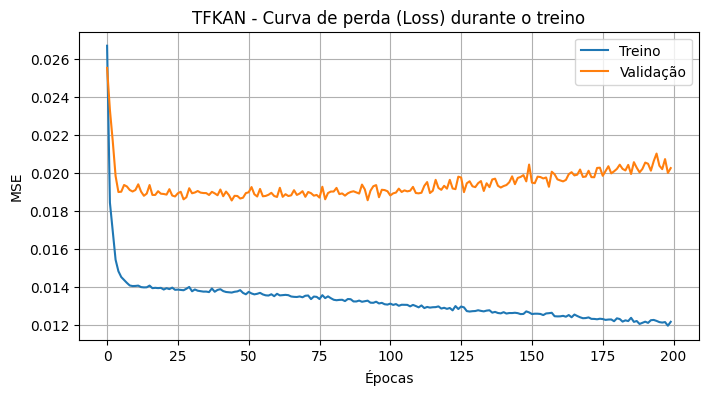

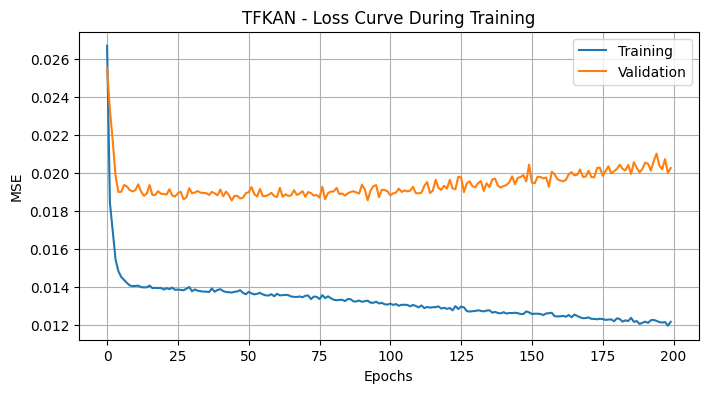


📊 Comparação Treino vs Validação:
Métrica    |          Treino |       Validação
---------------------------------------------
MSE        |      5.3729e+06 |      9.1503e+06
RMSE       |      2.3179e+03 |      3.0249e+03
R²         |          0.4913 |          0.3993


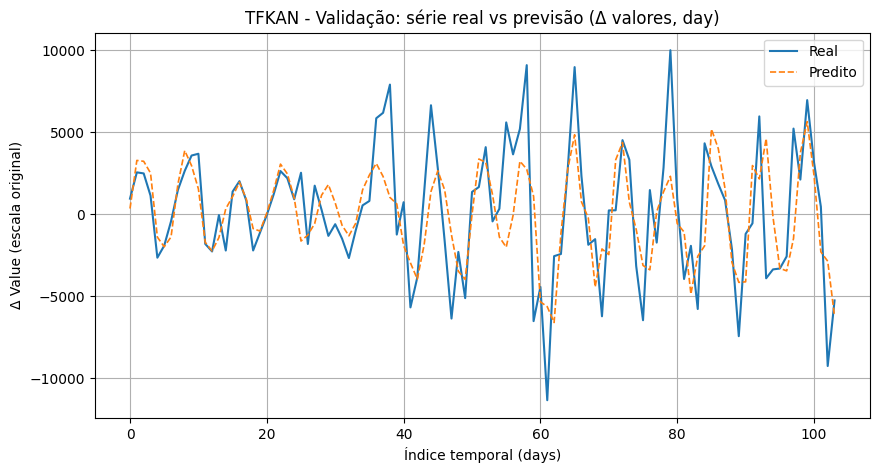

In [54]:

# ============================================================
#  ✅ CURVA DE PERDA
# ============================================================
plt.figure(figsize=(8,4))
plt.plot(history_tfkan.history['loss'], label='Treino')
plt.plot(history_tfkan.history['val_loss'], label='Validação')
plt.title("TFKAN - Curva de perda (Loss) durante o treino")
plt.xlabel("Épocas")
plt.ylabel("MSE")
plt.legend()
plt.grid(True)
plt.savefig("tfkan_loss-pt.png", dpi=300, bbox_inches="tight")
plt.show()

# ============================================================
#  ✅ LOSS CURVE
# ============================================================
plt.figure(figsize=(8,4))
plt.plot(history_tfkan.history['loss'], label='Training')
plt.plot(history_tfkan.history['val_loss'], label='Validation')
plt.title("TFKAN - Loss Curve During Training")
plt.xlabel("Epochs")
plt.ylabel("MSE")
plt.legend()
plt.grid(True)
plt.savefig("tfkan_loss-en.png", dpi=300, bbox_inches="tight")
plt.show()

# ============================================================
#  ✅ AVALIAÇÃO TREINO vs VALIDAÇÃO
# ============================================================
def inverse_transform_and_eval(X_t, y_t):
    y_pred = model_tfkan.predict(X_t, verbose=0)
    y_t_inv = scaler.inverse_transform(y_t.reshape(-1,1)).flatten()
    y_pred_inv = scaler.inverse_transform(y_pred).flatten()
    mse = mean_squared_error(y_t_inv, y_pred_inv)
    rmse = math.sqrt(mse)
    r2 = r2_score(y_t_inv, y_pred_inv)
    return y_t_inv, y_pred_inv, mse, rmse, r2

y_train_tfkan_inv, y_pred_train_tfkan_inv, mse_tfkan_train, rmse_tfkan_train, r2_tfkan_train = inverse_transform_and_eval(X_train_tfkan, y_train_tfkan)
y_test_tfkan_inv, y_pred_tfkan_inv, mse_tfkan_test, rmse_tfkan_test, r2_tfkan_test = inverse_transform_and_eval(X_test_tfkan, y_test_tfkan)

print("\n📊 Comparação Treino vs Validação:")
print(f"{'Métrica':<10} | {'Treino':>15} | {'Validação':>15}")
print("-"*45)
print(f"{'MSE':<10} | {mse_tfkan_train:>15.4e} | {mse_tfkan_test:>15.4e}")
print(f"{'RMSE':<10} | {rmse_tfkan_train:>15.4e} | {rmse_tfkan_test:>15.4e}")
print(f"{'R²':<10} | {r2_tfkan_train:>15.4f} | {r2_tfkan_test:>15.4f}")

# ============================================================
#  ✅ GRÁFICO REAL vs PREDITO (VAL)
# ============================================================
plt.figure(figsize=(10,5))
plt.plot(y_test_tfkan_inv, label="Real", linewidth=1.5)
plt.plot(y_pred_tfkan_inv, label="Predito", linestyle='--', linewidth=1.2)
plt.title(f"TFKAN - Validação: série real vs previsão (Δ valores, {time_unit})")
plt.xlabel(f"Índice temporal ({time_unit}s)")
plt.ylabel("Δ Value (escala original)")
plt.legend()
plt.grid(True)
plt.savefig("tfkan_val-pt.png", dpi=300, bbox_inches="tight")
plt.show()



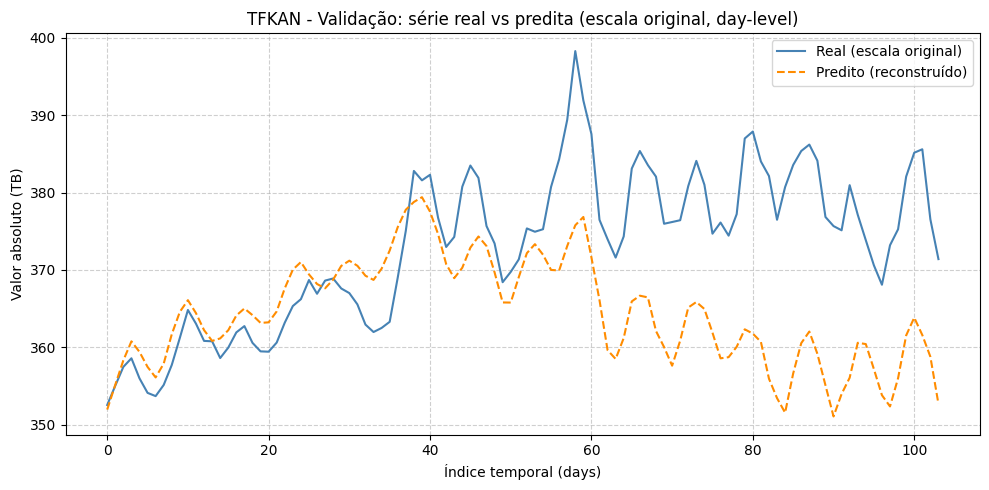

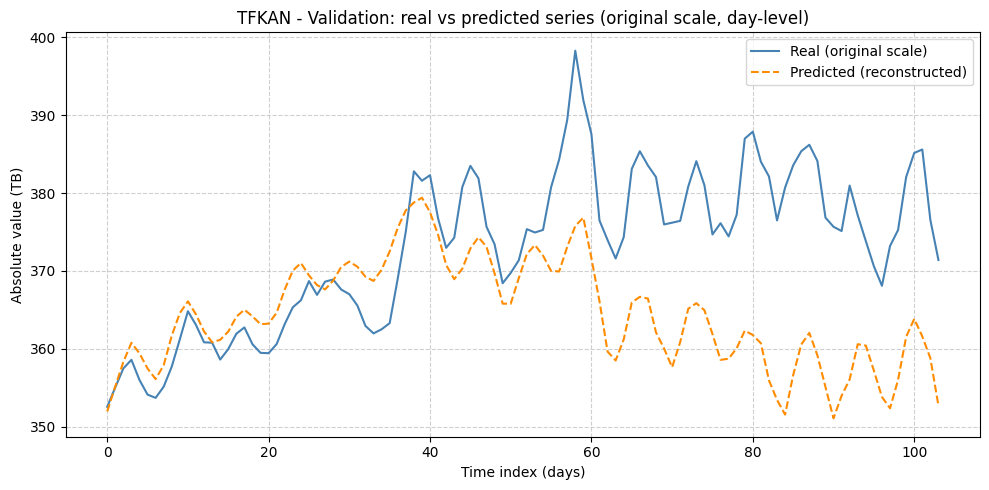


📊 TFKAN - Métricas em escala ABSOLUTA (reconstruída):
MSE(abs)  = 1.9749e+08
RMSE(abs) = 1.4053e+04
R²(abs)   = -0.8981
Window    = 24
Batch     = 64

📊 TFKAN - Metrics in ABSOLUTE scale (reconstructed):
MSE(abs)  = 1.9749e+08
RMSE(abs) = 1.4053e+04
R²(abs)   = -0.8981
Window    = 24
Batch     = 64


In [55]:
# ============================================================
#  ✅ RECONSTRUÇÃO EM ESCALA ABSOLUTA (VALIDAÇÃO)
# ============================================================
# y_test_inv e y_pred_inv já são ΔValue na escala original
# (vieram de inverse_transform_and_eval)

base_value = series[split + BEST_WINDOW_TFKAN - 1]

# reconstrói série absoluta acumulando os deltas
y_pred_abs_tfkan = base_value + np.cumsum(y_pred_tfkan_inv)
y_test_abs_tfkan = base_value + np.cumsum(y_test_tfkan_inv)

y_pred_abs_tfkan_tb = y_pred_abs_tfkan / 1024
y_test_abs_tfkan_tb = y_test_abs_tfkan / 1024

# Plot validation in absolute scale (consistent with main graph)
plt.figure(figsize=(10,5))
plt.plot(y_test_abs_tfkan_tb, label="Real (escala original)", color='steelblue')
plt.plot(y_pred_abs_tfkan_tb, label="Predito (reconstruído)", color='darkorange', linestyle='--')
plt.title(f"TFKAN - Validação: série real vs predita (escala original, {time_unit}-level)")
plt.xlabel(f"Índice temporal ({time_unit}s)")
plt.ylabel("Valor absoluto (TB)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig("tfkan_val_real_vs_pred-pt.png", dpi=300, bbox_inches="tight")
plt.show()

# Plot validation in absolute scale (consistent with main graph)
plt.figure(figsize=(10,5))
plt.plot(y_test_abs_tfkan_tb, label="Real (original scale)", color='steelblue')
plt.plot(y_pred_abs_tfkan_tb, label="Predicted (reconstructed)", color='darkorange', linestyle='--')
plt.title(f"TFKAN - Validation: real vs predicted series (original scale, {time_unit}-level)")
plt.xlabel(f"Time index ({time_unit}s)")
plt.ylabel("Absolute value (TB)")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.savefig("tfkan_val_real_vs_pred-en.png", dpi=300, bbox_inches="tight")
plt.show()

# ------------------------------------------------------------
# 9) Absolute-scale metrics
# ------------------------------------------------------------
mse_abs_tfkan  = mean_squared_error(y_test_abs_tfkan, y_pred_abs_tfkan)
rmse_abs_tfkan = math.sqrt(mse_abs_tfkan)
r2_abs_tfkan   = r2_score(y_test_abs_tfkan, y_pred_abs_tfkan)

print("\n📊 TFKAN - Métricas em escala ABSOLUTA (reconstruída):")
print(f"MSE(abs)  = {mse_abs_tfkan:,.4e}")
print(f"RMSE(abs) = {rmse_abs_tfkan:,.4e}")
print(f"R²(abs)   = {r2_abs_tfkan:.4f}")
print(f"Window    = {BEST_WINDOW_TFKAN}")
print(f"Batch     = {BATCH_SIZE_TFKAN}")

print("\n📊 TFKAN - Metrics in ABSOLUTE scale (reconstructed):")
print(f"MSE(abs)  = {mse_abs_tfkan:,.4e}")
print(f"RMSE(abs) = {rmse_abs_tfkan:,.4e}")
print(f"R²(abs)   = {r2_abs_tfkan:.4f}")
print(f"Window    = {BEST_WINDOW_TFKAN}")
print(f"Batch     = {BATCH_SIZE_TFKAN}")



📊 TFKAN - Forecast (em TB):
Passo 001: 368.969 TB
Passo 002: 364.260 TB
Passo 003: 359.031 TB
Passo 004: 354.065 TB
Passo 005: 357.088 TB
Passo 006: 361.098 TB
Passo 007: 362.464 TB
Passo 008: 362.111 TB
Passo 009: 360.173 TB
Passo 010: 358.879 TB
Passo 011: 359.494 TB
Passo 012: 360.622 TB
Passo 013: 362.408 TB
Passo 014: 361.382 TB
Passo 015: 359.196 TB
Passo 016: 356.960 TB
Passo 017: 355.945 TB
Passo 018: 358.263 TB
Passo 019: 361.592 TB
Passo 020: 364.409 TB
Passo 021: 363.596 TB
Passo 022: 363.017 TB
Passo 023: 359.791 TB
Passo 024: 358.005 TB
Passo 025: 359.911 TB
Passo 026: 363.857 TB
Passo 027: 367.198 TB
Passo 028: 368.615 TB
Passo 029: 367.655 TB
Passo 030: 364.911 TB
Passo 031: 362.831 TB
Passo 032: 363.644 TB
Passo 033: 365.824 TB
Passo 034: 368.809 TB
Passo 035: 369.651 TB
Passo 036: 369.311 TB
Passo 037: 367.603 TB
Passo 038: 366.859 TB
Passo 039: 368.572 TB
Passo 040: 370.844 TB
Passo 041: 373.292 TB
Passo 042: 373.582 TB
Passo 043: 372.325 TB
Passo 044: 369.777 TB
Pas

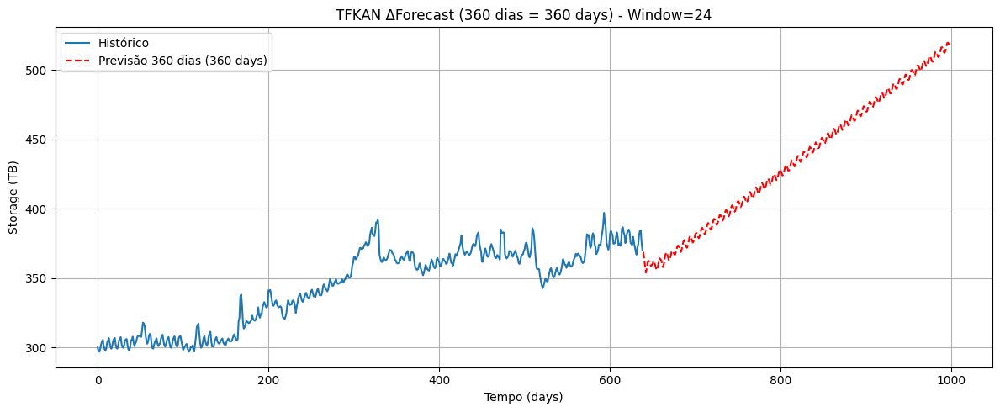

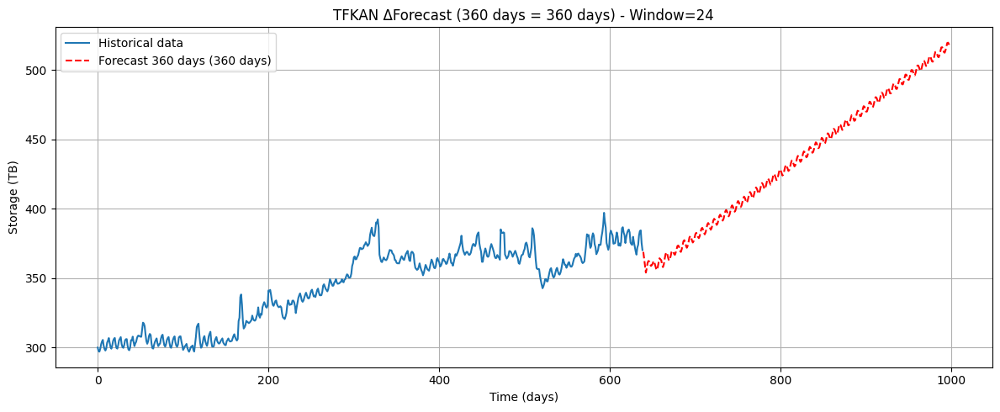

In [56]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# ============================================================
# ✅ TFKAN - FORECAST (recursive)
# ============================================================

diff_norm32_tfkan = np.asarray(diff_norm, dtype=np.float32)
last_window_tfkan = diff_norm32_tfkan[-BEST_WINDOW_TFKAN:].reshape(1, BEST_WINDOW_TFKAN, 1)

forecast_diffs_tfkan = []

for _ in range(FORECAST_STEPS):
    x = tf.convert_to_tensor(last_window_tfkan, dtype=tf.float32)

    # TFKAN retorna (1,1)
    y = model_tfkan(x, training=False)
    yhat = np.float32(y.numpy().reshape(-1)[0])

    forecast_diffs_tfkan.append(yhat)

    # desliza janela
    last_window_tfkan = np.concatenate(
        [
            last_window_tfkan[:, 1:, :],
            np.array(yhat, dtype=np.float32).reshape(1, 1, 1)
        ],
        axis=1
    ).astype(np.float32)

# inverter escala
forecast_diffs_inv_tfkan = scaler.inverse_transform(
    np.array(forecast_diffs_tfkan, dtype=np.float32).reshape(-1, 1)
).ravel()

# reconstrução absoluta
forecast_abs_tfkan = series[-1] + np.cumsum(forecast_diffs_inv_tfkan)

# converter para TB
series_tb = np.asarray(series).ravel() / 1024
forecast_abs_tfkan_tb = forecast_abs_tfkan / 1024

# eixos
x_hist_tfkan = np.arange(len(series_tb))
x_fore_tfkan = np.arange(len(series_tb), len(series_tb) + FORECAST_STEPS)

print("\n📊 TFKAN - Forecast (em TB):")
for i, val in enumerate(forecast_abs_tfkan_tb, start=1):
    print(f"Passo {i:03d}: {val:.3f} TB")
print(f"\n🔮 Último valor previsto ({FORECAST_DAYS} dias à frente): {forecast_abs_tfkan_tb[-1]:.3f} TB")

# ============================================================
# ✅ Plot PT-BR
# ============================================================
plt.figure(figsize=(12, 5))
plt.plot(x_hist_tfkan, series_tb, label="Histórico")
plt.plot(
    x_fore_tfkan,
    forecast_abs_tfkan_tb,
    "r--",
    label=f"Previsão {FORECAST_DAYS} dias ({FORECAST_STEPS} {time_unit}s)"
)
plt.title(f"TFKAN ΔForecast ({FORECAST_DAYS} dias = {FORECAST_STEPS} {time_unit}s) - Window={BEST_WINDOW_TFKAN}")
plt.xlabel(f"Tempo ({time_unit}s)")
plt.ylabel("Storage (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("tfkan_forecast-pt.png", dpi=300, bbox_inches="tight")
plt.show()

# ============================================================
# ✅ Plot EN
# ============================================================
plt.figure(figsize=(12, 5))
plt.plot(x_hist_tfkan, series_tb, label="Historical data")
plt.plot(
    x_fore_tfkan,
    forecast_abs_tfkan_tb,
    "r--",
    label=f"Forecast {FORECAST_DAYS} days ({FORECAST_STEPS} {time_unit}s)"
)
plt.title(f"TFKAN ΔForecast ({FORECAST_DAYS} days = {FORECAST_STEPS} {time_unit}s) - Window={BEST_WINDOW_TFKAN}")
plt.xlabel(f"Time ({time_unit}s)")
plt.ylabel("Storage (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("tfkan_forecast-en.png", dpi=300, bbox_inches="tight")
plt.show()

In [57]:
if SAVE == 1:
    # ============================================================
    # 💾 SAVE EVERYTHING - TFKAN
    # ============================================================

    import os
    import json
    import shutil
    import joblib
    import numpy as np


    MODEL_NAME = "tfkan"

    os.makedirs(BASE_PATH, exist_ok=True)

    # ============================================================
    # 1) SAVE MODEL
    # ============================================================
    model_tfkan.save(f"{BASE_PATH}/{MODEL_NAME}_model.keras")

    # ============================================================
    # 2) SAVE SCALER
    # ============================================================
    joblib.dump(scaler, f"{BASE_PATH}/{MODEL_NAME}_scaler.save")

    # ============================================================
    # 3) SAVE CONFIG
    # ============================================================
    config_tfkan = {
        "window": int(BEST_WINDOW_TFKAN),
        "epochs": int(EPOCHS_TFKAN),
        "batch_size": int(BATCH_SIZE_TFKAN),
        "forecast_steps": int(FORECAST_STEPS),
        "forecast_days": int(FORECAST_DAYS),
        "forecast_steps_train": int(FORECAST_STEPS_TRAIN),
        "time_unit": str(time_unit),
        "train_size": int(split),
        "n_features": int(N_FEATURES),
        "d_model": int(D_MODEL),
        "learning_rate": float(1e-4),
        "architecture": "TFKAN: freq branch (FFT->KAN->IFFT) + time KAN + predictor KAN"
    }

    with open(f"{BASE_PATH}/{MODEL_NAME}_config.json", "w") as f:
        json.dump(config_tfkan, f, indent=4)

    # ============================================================
    # 4) SAVE TRAINING HISTORY
    # ============================================================
    train_losses_tfkan = history_tfkan.history["loss"]
    test_losses_tfkan  = history_tfkan.history["val_loss"]

    np.save(f"{BASE_PATH}/train_losses_{MODEL_NAME}.npy", np.array(train_losses_tfkan, dtype=np.float64))
    np.save(f"{BASE_PATH}/val_losses_{MODEL_NAME}.npy", np.array(test_losses_tfkan, dtype=np.float64))

    # ============================================================
    # 5) SAVE METRICS
    # ============================================================
    metrics_tfkan = {
        "final_train_loss": float(train_losses_tfkan[-1]),
        "final_val_loss": float(test_losses_tfkan[-1]),

        "mse_train_diff": float(mse_tfkan_train),
        "rmse_train_diff": float(rmse_tfkan_train),
        "r2_train_diff": float(r2_tfkan_train),

        "mse_test_diff": float(mse_tfkan_test),
        "rmse_test_diff": float(rmse_tfkan_test),
        "r2_test_diff": float(r2_tfkan_test),

        "mse_abs": float(mse_abs_tfkan),
        "rmse_abs": float(rmse_abs_tfkan),
        "r2_abs": float(r2_abs_tfkan),

        "forecast_last_tb": float(forecast_abs_tfkan_tb[-1]),
    }

    with open(f"{BASE_PATH}/{MODEL_NAME}_metrics.json", "w") as f:
        json.dump(metrics_tfkan, f, indent=4)

    # ============================================================
    # 6) SAVE DATA ARRAYS
    # ============================================================
    np.save(f"{BASE_PATH}/X_train_{MODEL_NAME}.npy", X_train_tfkan)
    np.save(f"{BASE_PATH}/y_train_{MODEL_NAME}.npy", y_train_tfkan)
    np.save(f"{BASE_PATH}/X_test_{MODEL_NAME}.npy", X_test_tfkan)
    np.save(f"{BASE_PATH}/y_test_{MODEL_NAME}.npy", y_test_tfkan)

    # escala original (deltas invertidos)
    np.save(f"{BASE_PATH}/y_train_inv_{MODEL_NAME}.npy", y_train_tfkan_inv)
    np.save(f"{BASE_PATH}/y_pred_train_inv_{MODEL_NAME}.npy", y_pred_train_tfkan_inv)
    np.save(f"{BASE_PATH}/y_test_inv_{MODEL_NAME}.npy", y_test_tfkan_inv)
    np.save(f"{BASE_PATH}/y_pred_inv_{MODEL_NAME}.npy", y_pred_tfkan_inv)

    # ============================================================
    # 7) SAVE ABSOLUTE RECONSTRUCTION
    # ============================================================
    np.save(f"{BASE_PATH}/y_test_abs_{MODEL_NAME}.npy", y_test_abs_tfkan)
    np.save(f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}.npy", y_pred_abs_tfkan)
    np.save(f"{BASE_PATH}/y_test_abs_{MODEL_NAME}_tb.npy", y_test_abs_tfkan_tb)
    np.save(f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}_tb.npy", y_pred_abs_tfkan_tb)

    # ============================================================
    # 8) SAVE FORECAST
    # ============================================================
    np.save(f"{BASE_PATH}/forecast_diffs_{MODEL_NAME}.npy", np.array(forecast_diffs_tfkan))
    np.save(f"{BASE_PATH}/forecast_diffs_inv_{MODEL_NAME}.npy", forecast_diffs_inv_tfkan)
    np.save(f"{BASE_PATH}/forecast_abs_{MODEL_NAME}.npy", forecast_abs_tfkan)
    np.save(f"{BASE_PATH}/forecast_tb_{MODEL_NAME}.npy", forecast_abs_tfkan_tb)

    try:
        np.save(f"{BASE_PATH}/last_window_{MODEL_NAME}.npy", last_window_tfkan)
    except NameError:
        pass

    # ============================================================
    # 9) SAVE PREPROCESSING REFERENCES
    # ============================================================
    np.save(f"{BASE_PATH}/series_original.npy", series)
    np.save(f"{BASE_PATH}/diff_series.npy", diff_series)
    np.save(f"{BASE_PATH}/diff_train.npy", diff_train)
    np.save(f"{BASE_PATH}/diff_test.npy", diff_test)
    np.save(f"{BASE_PATH}/diff_train_norm.npy", diff_train_norm)
    np.save(f"{BASE_PATH}/diff_test_norm.npy", diff_test_norm)

    # ============================================================
    # 10) SAVE RECONSTRUCTION INFO
    # ============================================================
    reconstruction_info_tfkan = {
        "split": int(split),
        "base_value": float(base_value),
        "series_last_value": float(series[-1]),
    }

    with open(f"{BASE_PATH}/reconstruction_info_{MODEL_NAME}.json", "w") as f:
        json.dump(reconstruction_info_tfkan, f, indent=4)

    # ============================================================
    # 11) COPY FIGURES
    # ============================================================
    figure_files = [
        "tfkan_loss-pt.png",
        "tfkan_val-pt.png",
        "tfkan_val_real_vs_pred-pt.png",
        "tfkan_forecast-pt.png",
        "tfkan_forecast-en.png",
    ]

    for fig in figure_files:
        if os.path.exists(fig):
            dest = os.path.join(BASE_PATH, fig)
            if os.path.abspath(fig) != os.path.abspath(dest):
                shutil.copy2(fig, dest)

    # ============================================================
    # ✅ SUMMARY
    # ============================================================
    print(f"✅ All TFKAN artifacts saved in:\n{BASE_PATH}")

# ETS

Train shape: (486,)
Test shape : (104,)

Exponential Smoothing — Espaço Normalizado / Diferenciado
MSE  : 3.363438e-02
RMSE : 1.833968e-01
R²   : 0.002992

Exponential Smoothing — Escala Absoluta (GB)
MSE(abs)  : 1.522159e+08
RMSE(abs) : 1.233758e+04
R²(abs)   : -0.462948

Exponential Smoothing — Escala Absoluta (TiB)
MSE(TiB)  : 145.164431
RMSE(TiB) : 12.048420
R²(TiB)   : -0.462948


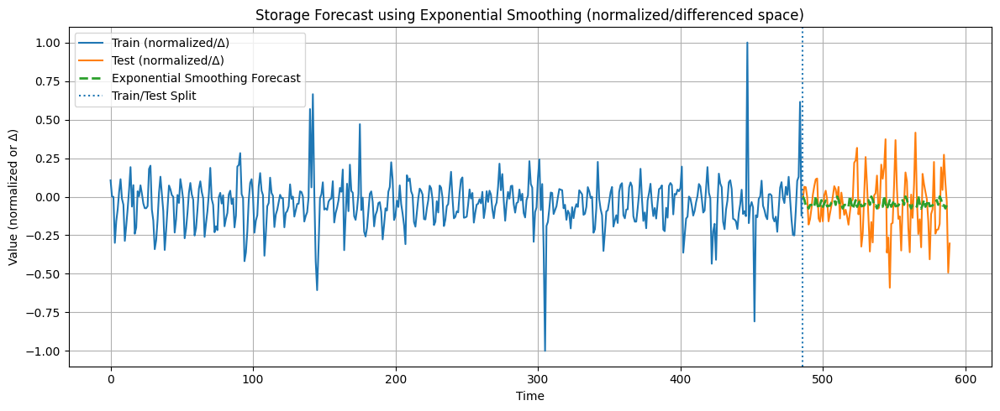

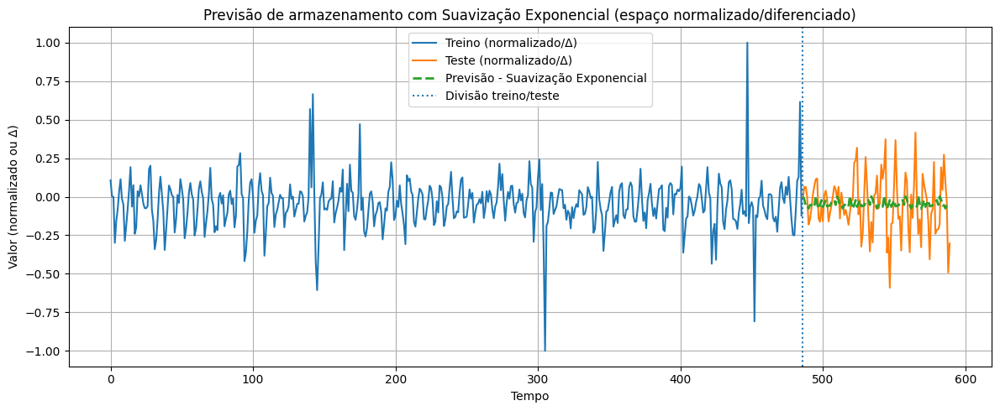

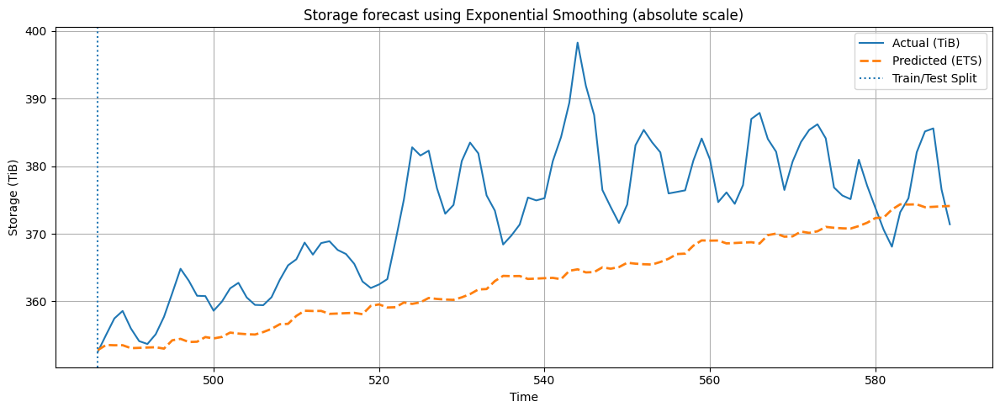

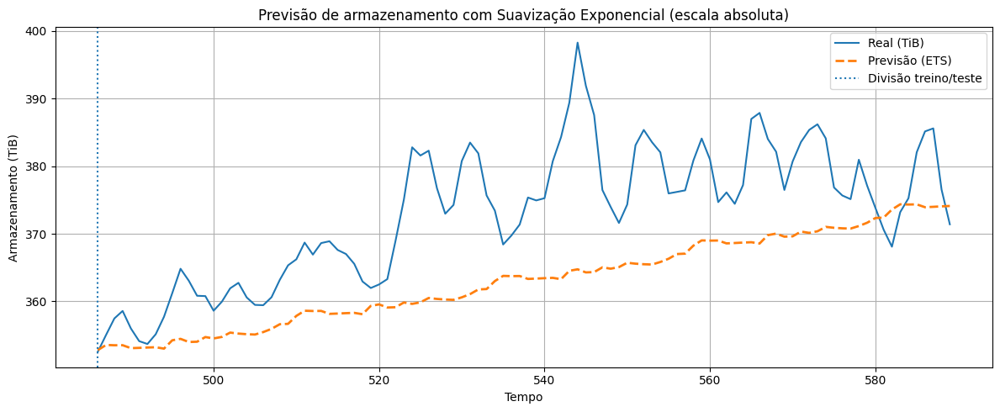

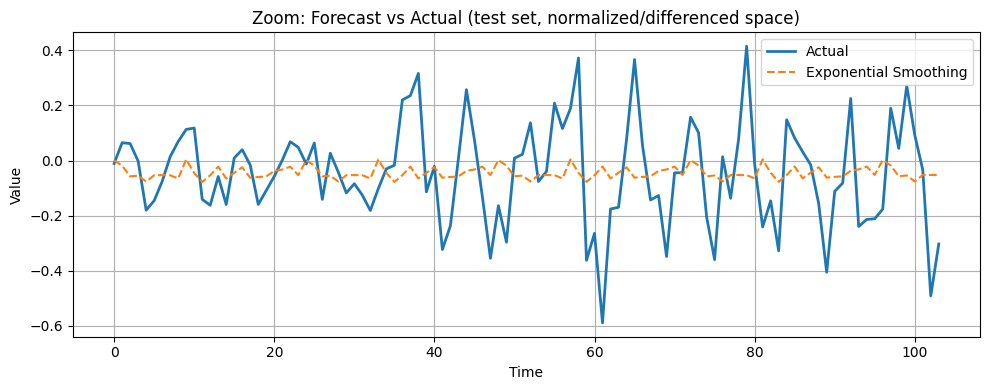

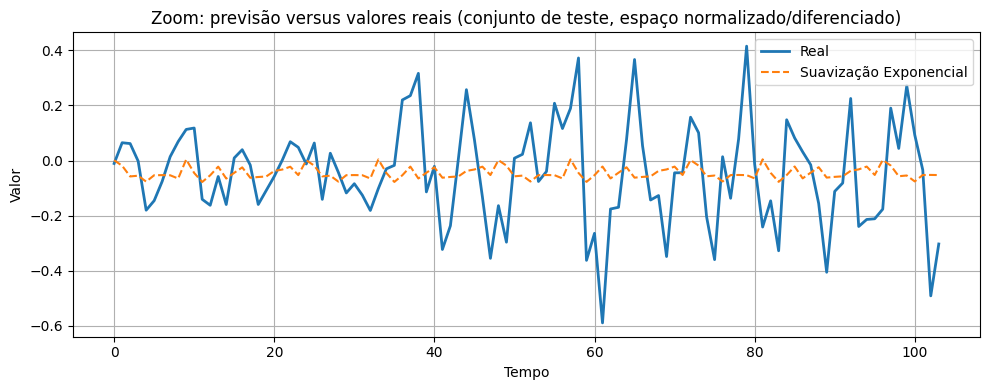

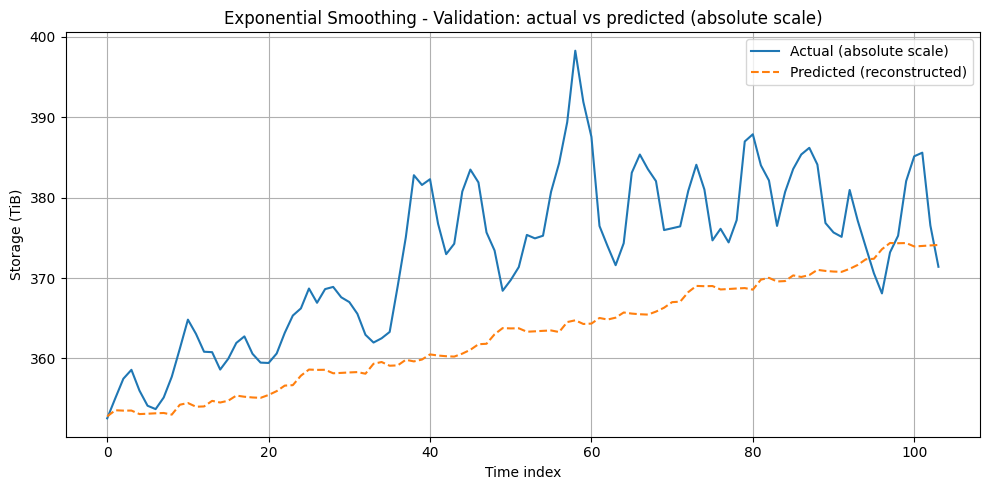

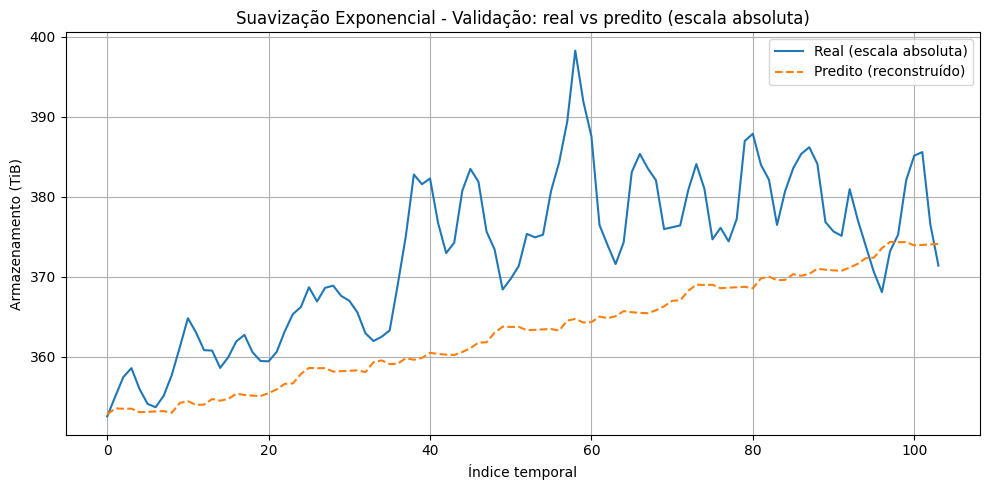


Exponential Smoothing - Forecast (TiB):
Step 001: 370.468 TiB
Step 002: 370.634 TiB
Step 003: 370.800 TiB
Step 004: 370.966 TiB
Step 005: 371.132 TiB
Step 006: 371.298 TiB
Step 007: 371.464 TiB
Step 008: 371.630 TiB
Step 009: 371.796 TiB
Step 010: 371.962 TiB
Step 011: 372.128 TiB
Step 012: 372.294 TiB
Step 013: 372.460 TiB
Step 014: 372.626 TiB
Step 015: 372.792 TiB
Step 016: 372.958 TiB
Step 017: 373.124 TiB
Step 018: 373.290 TiB
Step 019: 373.456 TiB
Step 020: 373.622 TiB
...

Final forecast value (360 days ahead): 430.062 TiB

=== DEBUG DE UNIDADE ===
series raw min/max      : 304144.305 / 406710.643
series TiB min/max      : 297.016 / 397.178
forecast raw min/max    : 379358.835 / 440383.125
forecast TiB min/max    : 370.468 / 430.062


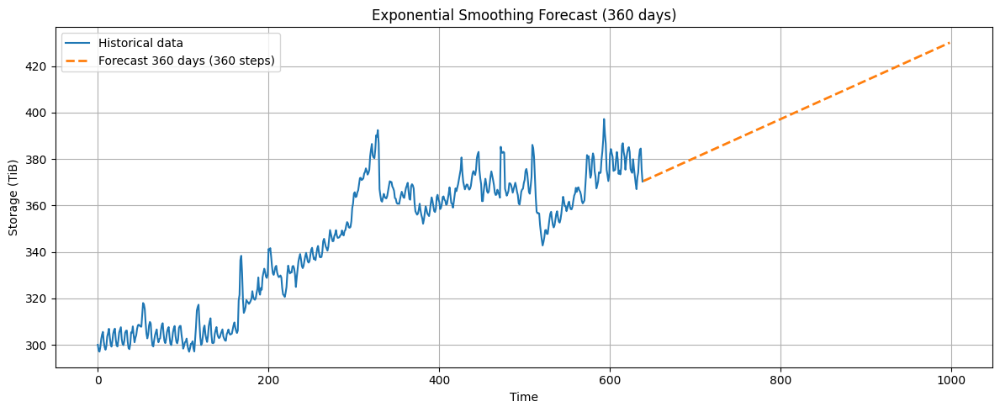

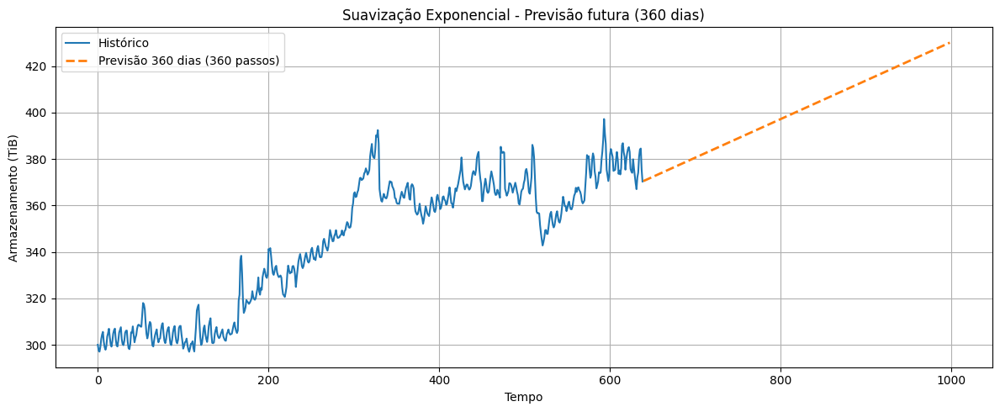


Arquivos salvos com sucesso.


In [58]:
# ============================================================
# BASELINE ESTATÍSTICO — SUAVIZAÇÃO EXPONENCIAL
# Série original em GB → conversão correta para TiB
# ============================================================

import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import r2_score, mean_squared_error
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# ============================================================
# CONFIGURAÇÃO DE UNIDADE
# ============================================================
# Sua série atual está na escala de GB.
# Exemplo: 300000 GB ≈ 293 TiB.
# Portanto, para converter GB -> TiB, divide por 1024.

TO_TIB = 1024

# ============================================================
# DADOS DE ENTRADA
# ============================================================

y_train = np.asarray(y_train_mlp).ravel()
y_test  = np.asarray(y_test_mlp).ravel()

print("Train shape:", y_train.shape)
print("Test shape :", y_test.shape)

window_size = BEST_WINDOW_MLP
split_index = train_size
scaler_used = scaler

# ============================================================
# MODELO — EXPONENTIAL SMOOTHING
# ============================================================

#model_exp = ExponentialSmoothing(
#    y_train,
#    trend=None,
#    seasonal=None
#)

model_exp = ExponentialSmoothing(
    y_train,
    trend="add",
    seasonal="add",
    seasonal_periods=24
)

fit_exp = model_exp.fit(optimized=True)
y_pred_exp = fit_exp.forecast(len(y_test))

# ============================================================
# MÉTRICAS — NORMALIZADO / DIFERENCIADO
# ============================================================

mse_exp = mean_squared_error(y_test, y_pred_exp)
rmse_exp = np.sqrt(mse_exp)
r2_exp = r2_score(y_test, y_pred_exp)

print("\nExponential Smoothing — Espaço Normalizado / Diferenciado")
print(f"MSE  : {mse_exp:.6e}")
print(f"RMSE : {rmse_exp:.6e}")
print(f"R²   : {r2_exp:.6f}")

metrics_exp_norm = {
    "mse": float(mse_exp),
    "rmse": float(rmse_exp),
    "r2": float(r2_exp)
}

with open("exp_metrics_normalized.json", "w", encoding="utf-8") as f:
    json.dump(metrics_exp_norm, f, ensure_ascii=False, indent=4)

with open("exp_metricas_normalizado.json", "w", encoding="utf-8") as f:
    json.dump(metrics_exp_norm, f, ensure_ascii=False, indent=4)

df_exp_norm = pd.DataFrame({
    "time_index": np.arange(len(y_test)),
    "y_true_norm": y_test,
    "y_pred_norm": y_pred_exp
})

df_exp_norm.to_csv("exp_validation_normalized.csv", index=False)
df_exp_norm.to_csv("exp_validacao_normalizado.csv", index=False)

# ============================================================
# RECONSTRUÇÃO EM ESCALA ABSOLUTA
# Série atual está em GB
# ============================================================

y_test_inv_exp = scaler_used.inverse_transform(
    y_test.reshape(-1, 1)
).ravel()

y_pred_inv_exp = scaler_used.inverse_transform(
    y_pred_exp.reshape(-1, 1)
).ravel()

base_value = series[split_index + window_size - 1]

# Reconstrução em GB
y_test_abs_exp = base_value + np.cumsum(y_test_inv_exp)
y_pred_abs_exp = base_value + np.cumsum(y_pred_inv_exp)

# GB → TiB
y_test_abs_exp_tib = y_test_abs_exp / TO_TIB
y_pred_abs_exp_tib = y_pred_abs_exp / TO_TIB

# ============================================================
# MÉTRICAS — ESCALA ABSOLUTA EM GB
# ============================================================

mse_abs_exp = mean_squared_error(y_test_abs_exp, y_pred_abs_exp)
rmse_abs_exp = np.sqrt(mse_abs_exp)
r2_abs_exp = r2_score(y_test_abs_exp, y_pred_abs_exp)

print("\nExponential Smoothing — Escala Absoluta (GB)")
print(f"MSE(abs)  : {mse_abs_exp:.6e}")
print(f"RMSE(abs) : {rmse_abs_exp:.6e}")
print(f"R²(abs)   : {r2_abs_exp:.6f}")

# ============================================================
# MÉTRICAS — ESCALA ABSOLUTA EM TiB
# ============================================================

mse_abs_exp_tib = mean_squared_error(y_test_abs_exp_tib, y_pred_abs_exp_tib)
rmse_abs_exp_tib = np.sqrt(mse_abs_exp_tib)
r2_abs_exp_tib = r2_score(y_test_abs_exp_tib, y_pred_abs_exp_tib)

print("\nExponential Smoothing — Escala Absoluta (TiB)")
print(f"MSE(TiB)  : {mse_abs_exp_tib:.6f}")
print(f"RMSE(TiB) : {rmse_abs_exp_tib:.6f}")
print(f"R²(TiB)   : {r2_abs_exp_tib:.6f}")

metrics_exp_abs = {
    "mse_abs_gb": float(mse_abs_exp),
    "rmse_abs_gb": float(rmse_abs_exp),
    "r2_abs_gb": float(r2_abs_exp),
    "mse_abs_tib": float(mse_abs_exp_tib),
    "rmse_abs_tib": float(rmse_abs_exp_tib),
    "r2_abs_tib": float(r2_abs_exp_tib)
}

with open("exp_metrics_absolute.json", "w", encoding="utf-8") as f:
    json.dump(metrics_exp_abs, f, ensure_ascii=False, indent=4)

with open("exp_metricas_absolutas.json", "w", encoding="utf-8") as f:
    json.dump(metrics_exp_abs, f, ensure_ascii=False, indent=4)

n_val = min(len(y_test_abs_exp_tib), len(y_pred_abs_exp_tib))

df_exp_abs = pd.DataFrame({
    "time_index": np.arange(n_val),
    "y_true_tib": y_test_abs_exp_tib[:n_val],
    "y_pred_tib": y_pred_abs_exp_tib[:n_val]
})

df_exp_abs.to_csv("exp_validation_absolute.csv", index=False)
df_exp_abs.to_csv("exp_validacao_absoluta.csv", index=False)

# ============================================================
# PLOT 1 — NORMALIZADO / DIFERENCIADO
# ============================================================

plt.figure(figsize=(12, 5))
plt.plot(np.arange(len(y_train)), y_train, label="Train (normalized/Δ)")
plt.plot(
    np.arange(len(y_train), len(y_train) + len(y_test)),
    y_test,
    label="Test (normalized/Δ)"
)
plt.plot(
    np.arange(len(y_train), len(y_train) + len(y_pred_exp)),
    y_pred_exp,
    linestyle="--",
    linewidth=2,
    label="Exponential Smoothing Forecast"
)
plt.axvline(len(y_train), linestyle=":", label="Train/Test Split")
plt.title("Storage Forecast using Exponential Smoothing (normalized/differenced space)")
plt.xlabel("Time")
plt.ylabel("Value (normalized or Δ)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("exp_train_test_forecast_en.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(12, 5))
plt.plot(np.arange(len(y_train)), y_train, label="Treino (normalizado/Δ)")
plt.plot(
    np.arange(len(y_train), len(y_train) + len(y_test)),
    y_test,
    label="Teste (normalizado/Δ)"
)
plt.plot(
    np.arange(len(y_train), len(y_train) + len(y_pred_exp)),
    y_pred_exp,
    linestyle="--",
    linewidth=2,
    label="Previsão - Suavização Exponencial"
)
plt.axvline(len(y_train), linestyle=":", label="Divisão treino/teste")
plt.title("Previsão de armazenamento com Suavização Exponencial (espaço normalizado/diferenciado)")
plt.xlabel("Tempo")
plt.ylabel("Valor (normalizado ou Δ)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("exp_treino_teste_previsao_pt.png", dpi=300, bbox_inches="tight")
plt.show()

# ============================================================
# PLOT 2 — ESCALA ABSOLUTA
# ============================================================

x_test_abs = np.arange(len(y_train), len(y_train) + len(y_test_abs_exp_tib))

plt.figure(figsize=(12, 5))
plt.plot(x_test_abs, y_test_abs_exp_tib, label="Actual (TiB)")
plt.plot(
    x_test_abs,
    y_pred_abs_exp_tib,
    linestyle="--",
    linewidth=2,
    label="Predicted (ETS)"
)
plt.axvline(len(y_train), linestyle=":", label="Train/Test Split")
plt.title("Storage forecast using Exponential Smoothing (absolute scale)")
plt.xlabel("Time")
plt.ylabel("Storage (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("exp_absolute_forecast_en.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(12, 5))
plt.plot(x_test_abs, y_test_abs_exp_tib, label="Real (TiB)")
plt.plot(
    x_test_abs,
    y_pred_abs_exp_tib,
    linestyle="--",
    linewidth=2,
    label="Previsão (ETS)"
)
plt.axvline(len(y_train), linestyle=":", label="Divisão treino/teste")
plt.title("Previsão de armazenamento com Suavização Exponencial (escala absoluta)")
plt.xlabel("Tempo")
plt.ylabel("Armazenamento (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("exp_previsao_absoluta_pt.png", dpi=300, bbox_inches="tight")
plt.show()

# ============================================================
# PLOT 3 — ZOOM NORMALIZADO
# ============================================================

plt.figure(figsize=(10, 4))
plt.plot(y_test, label="Actual", linewidth=2)
plt.plot(y_pred_exp[:len(y_test)], linestyle="--", label="Exponential Smoothing")
plt.title("Zoom: Forecast vs Actual (test set, normalized/differenced space)")
plt.xlabel("Time")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("exp_test_zoom_en.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(10, 4))
plt.plot(y_test, label="Real", linewidth=2)
plt.plot(y_pred_exp[:len(y_test)], linestyle="--", label="Suavização Exponencial")
plt.title("Zoom: previsão versus valores reais (conjunto de teste, espaço normalizado/diferenciado)")
plt.xlabel("Tempo")
plt.ylabel("Valor")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("exp_zoom_teste_pt.png", dpi=300, bbox_inches="tight")
plt.show()

# ============================================================
# PLOT 4 — VALIDAÇÃO ABSOLUTA
# ============================================================

plt.figure(figsize=(10, 5))
plt.plot(y_test_abs_exp_tib, label="Actual (absolute scale)")
plt.plot(y_pred_abs_exp_tib, "--", label="Predicted (reconstructed)")
plt.title("Exponential Smoothing - Validation: actual vs predicted (absolute scale)")
plt.xlabel("Time index")
plt.ylabel("Storage (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("exp_validation_absolute_en.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(y_test_abs_exp_tib, label="Real (escala absoluta)")
plt.plot(y_pred_abs_exp_tib, "--", label="Predito (reconstruído)")
plt.title("Suavização Exponencial - Validação: real vs predito (escala absoluta)")
plt.xlabel("Índice temporal")
plt.ylabel("Armazenamento (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("exp_validacao_absoluta_pt.png", dpi=300, bbox_inches="tight")
plt.show()

# ============================================================
# FORECAST FUTURO
# ============================================================

model_future_exp = ExponentialSmoothing(
    diff_train_norm[:, 0],
    trend=None,
    seasonal=None
)

fit_future_exp = model_future_exp.fit(optimized=True)
forecast_diffs_exp = fit_future_exp.forecast(FORECAST_STEPS)

forecast_diffs_inv_exp = scaler_used.inverse_transform(
    np.asarray(forecast_diffs_exp).reshape(-1, 1)
).ravel()

# Reconstrução futura em GB
forecast_abs_exp = series[-1] + np.cumsum(forecast_diffs_inv_exp)

# GB → TiB
forecast_tib_exp = forecast_abs_exp / TO_TIB

print("\nExponential Smoothing - Forecast (TiB):")
for i, val in enumerate(forecast_tib_exp[:20], start=1):
    print(f"Step {i:03d}: {val:.3f} TiB")

print("...")
print(f"\nFinal forecast value ({FORECAST_DAYS} days ahead): {forecast_tib_exp[-1]:.3f} TiB")

df_forecast_exp = pd.DataFrame({
    "step": np.arange(1, FORECAST_STEPS + 1),
    "forecast_tib": forecast_tib_exp
})

df_forecast_exp.to_csv("exp_future_forecast.csv", index=False)
df_forecast_exp.to_csv("exp_forecast_futuro.csv", index=False)

# ============================================================
# DEBUG DE UNIDADE
# ============================================================

series_tib = series / TO_TIB

print("\n=== DEBUG DE UNIDADE ===")
print(f"series raw min/max      : {series.min():.3f} / {series.max():.3f}")
print(f"series TiB min/max      : {series_tib.min():.3f} / {series_tib.max():.3f}")
print(f"forecast raw min/max    : {forecast_abs_exp.min():.3f} / {forecast_abs_exp.max():.3f}")
print(f"forecast TiB min/max    : {forecast_tib_exp.min():.3f} / {forecast_tib_exp.max():.3f}")

# ============================================================
# PLOT 5 — HISTÓRICO + PREVISÃO FUTURA
# ============================================================

x_hist = np.arange(len(series))
x_fore_exp = np.arange(len(series), len(series) + FORECAST_STEPS)

plt.figure(figsize=(12, 5))
plt.plot(x_hist, series_tib, label="Historical data")
plt.plot(
    x_fore_exp,
    forecast_tib_exp,
    linestyle="--",
    linewidth=2,
    label=f"Forecast {FORECAST_DAYS} days ({FORECAST_STEPS} steps)"
)
plt.title(f"Exponential Smoothing Forecast ({FORECAST_DAYS} days)")
plt.xlabel("Time")
plt.ylabel("Storage (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("exp_future_forecast_en.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(12, 5))
plt.plot(x_hist, series_tib, label="Histórico")
plt.plot(
    x_fore_exp,
    forecast_tib_exp,
    linestyle="--",
    linewidth=2,
    label=f"Previsão {FORECAST_DAYS} dias ({FORECAST_STEPS} passos)"
)
plt.title(f"Suavização Exponencial - Previsão futura ({FORECAST_DAYS} dias)")
plt.xlabel("Tempo")
plt.ylabel("Armazenamento (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("exp_forecast_futuro_pt.png", dpi=300, bbox_inches="tight")
plt.show()

print("\nArquivos salvos com sucesso.")

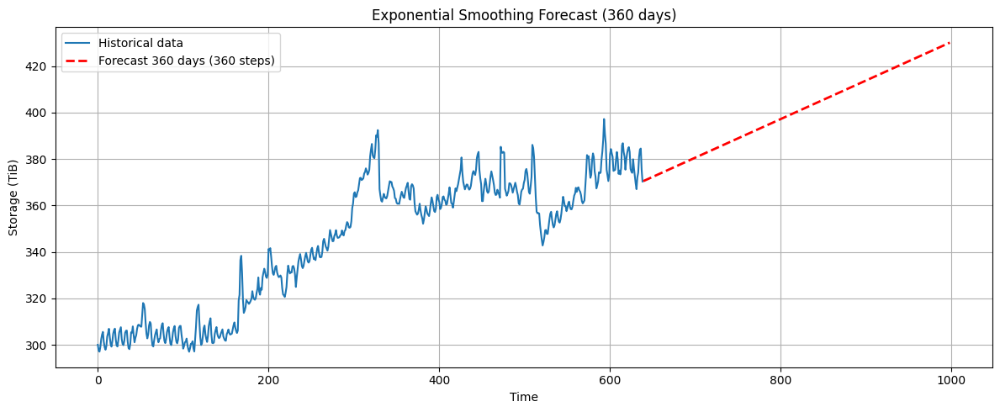

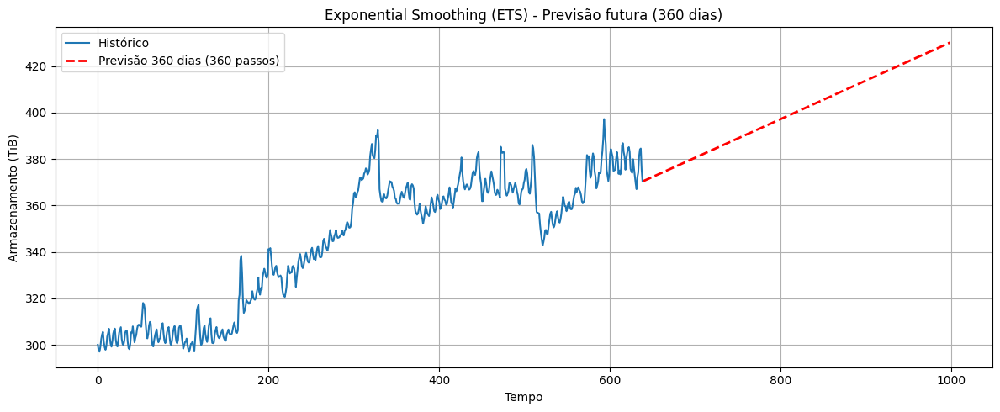

In [59]:
# ============================================================
# PLOT 5 — HISTÓRICO + PREVISÃO FUTURA
# ============================================================

x_hist = np.arange(len(series))
x_fore_exp = np.arange(len(series), len(series) + FORECAST_STEPS)

plt.figure(figsize=(12, 5))
plt.plot(x_hist, series_tib, label="Historical data")
plt.plot(
    x_fore_exp,
    forecast_tib_exp,
    "r--",
    linewidth=2,
    label=f"Forecast {FORECAST_DAYS} days ({FORECAST_STEPS} steps)"
)
plt.title(f"Exponential Smoothing Forecast ({FORECAST_DAYS} days)")
plt.xlabel("Time")
plt.ylabel("Storage (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("exp_future_forecast_en.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(12, 5))
plt.plot(x_hist, series_tib, label="Histórico")
plt.plot(
    x_fore_exp,
    forecast_tib_exp,
    "r--",
    linewidth=2,
    label=f"Previsão {FORECAST_DAYS} dias ({FORECAST_STEPS} passos)"
)
plt.title(f"Exponential Smoothing (ETS) - Previsão futura ({FORECAST_DAYS} dias)")
plt.xlabel("Tempo")
plt.ylabel("Armazenamento (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("exp_forecast_futuro_pt.png", dpi=300, bbox_inches="tight")
plt.show()

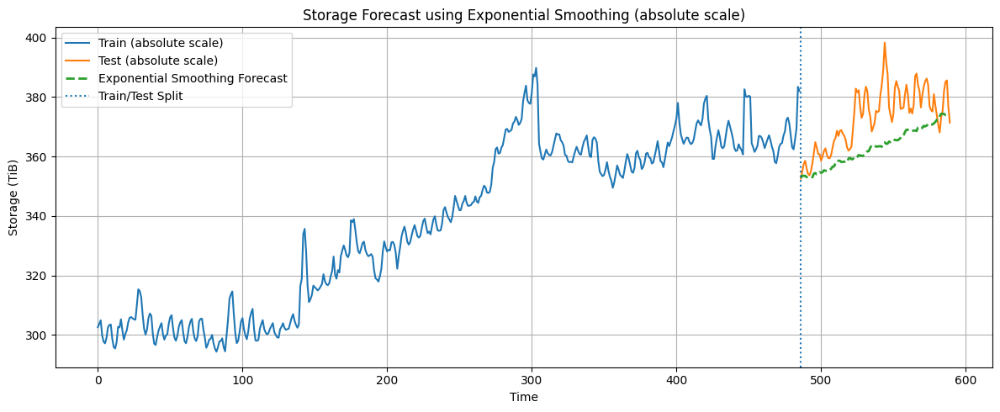

In [60]:

# ============================================================
# PLOT — TREINO / TESTE / PREVISÃO EM ESCALA ABSOLUTA (TiB)
# ============================================================

# Inverte normalização dos incrementos
y_train_inv_exp = scaler_used.inverse_transform(
    y_train.reshape(-1, 1)
).ravel()

y_test_inv_exp = scaler_used.inverse_transform(
    y_test.reshape(-1, 1)
).ravel()

y_pred_inv_exp = scaler_used.inverse_transform(
    y_pred_exp.reshape(-1, 1)
).ravel()

# Valores-base para reconstrução
base_train = series[window_size - 1]
base_test  = series[split_index + window_size - 1]

# Reconstrução cumulativa em GB
y_train_abs_exp = base_train + np.cumsum(y_train_inv_exp)
y_test_abs_exp  = base_test  + np.cumsum(y_test_inv_exp)
y_pred_abs_exp  = base_test  + np.cumsum(y_pred_inv_exp)

# Conversão GB → TiB
y_train_abs_exp_tib = y_train_abs_exp / TO_TIB
y_test_abs_exp_tib  = y_test_abs_exp  / TO_TIB
y_pred_abs_exp_tib  = y_pred_abs_exp  / TO_TIB

# Eixos temporais
x_train_abs = np.arange(len(y_train_abs_exp_tib))
x_test_abs = np.arange(
    len(y_train_abs_exp_tib),
    len(y_train_abs_exp_tib) + len(y_test_abs_exp_tib)
)

# Plot em escala absoluta
plt.figure(figsize=(12, 5))

plt.plot(
    x_train_abs,
    y_train_abs_exp_tib,
    label="Train (absolute scale)"
)

plt.plot(
    x_test_abs,
    y_test_abs_exp_tib,
    label="Test (absolute scale)"
)

plt.plot(
    x_test_abs,
    y_pred_abs_exp_tib[:len(y_test_abs_exp_tib)],
    linestyle="--",
    linewidth=2,
    label="Exponential Smoothing Forecast"
)

plt.axvline(
    len(y_train_abs_exp_tib),
    linestyle=":",
    label="Train/Test Split"
)

plt.title("Storage Forecast using Exponential Smoothing (absolute scale)")
plt.xlabel("Time")
plt.ylabel("Storage (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("exp_train_test_forecast_absolute_en.png", dpi=300, bbox_inches="tight")
plt.show()


=== DEBUG TRAIN / VALIDATION ===
Último ponto treino real     : 350.523 TiB
Primeiro ponto validação real: 351.451 TiB
Primeiro ponto previsão      : 352.791 TiB
Último ponto previsão        : 374.111 TiB


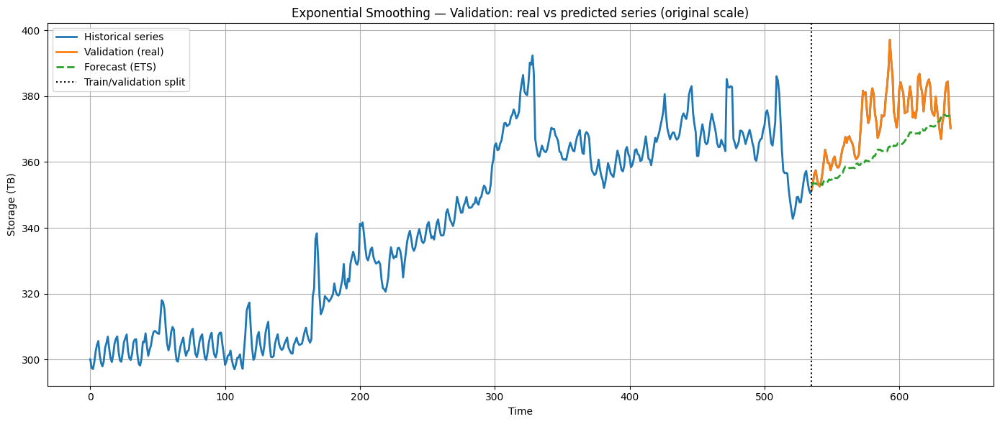

In [61]:
# ============================================================
# TRAIN + VALIDATION + FORECAST — ORIGINAL SCALE
# Usa a série real para treino/validação e previsão reconstruída
# ============================================================

# série atual está em GB
TO_TIB = 1024

series_tib = series / TO_TIB

# ponto de separação visual
split_point = len(series_tib) - len(y_test_abs_exp_tib)

# eixo da previsão
x_pred = np.arange(
    split_point,
    split_point + len(y_pred_abs_exp_tib)
)

# ============================================================
# DEBUG
# ============================================================

print("\n=== DEBUG TRAIN / VALIDATION ===")
print(f"Último ponto treino real     : {series_tib[split_point - 1]:.3f} TiB")
print(f"Primeiro ponto validação real: {series_tib[split_point]:.3f} TiB")
print(f"Primeiro ponto previsão      : {y_pred_abs_exp_tib[0]:.3f} TiB")
print(f"Último ponto previsão        : {y_pred_abs_exp_tib[-1]:.3f} TiB")

# ============================================================
# PLOT
# ============================================================

plt.figure(figsize=(14, 6))

# série real completa
plt.plot(
    np.arange(len(series_tib)),
    series_tib,
    label="Historical series",
    linewidth=2
)

# parte de validação real destacada
plt.plot(
    np.arange(split_point, len(series_tib)),
    series_tib[split_point:],
    label="Validation (real)",
    linewidth=2
)

# previsão sobre o período de validação
plt.plot(
    x_pred,
    y_pred_abs_exp_tib,
    linestyle="--",
    linewidth=2,
    label="Forecast (ETS)"
)

# divisão treino/validação
plt.axvline(
    split_point,
    linestyle=":",
    color="black",
    label="Train/validation split"
)

plt.title(
    "Exponential Smoothing — Validation: real vs predicted series (original scale)"
)

plt.xlabel("Time")
plt.ylabel("Storage (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()

plt.savefig(
    "exp_train_validation_absolute_tib_corrected.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()


=== DEBUG RECONSTRUÇÃO ===
base_idx                : 533
Último treino real       : 360.056 TB
Primeiro teste reconstruído: 361.007 TB
Primeira previsão        : 361.258 TB
Última previsão          : 383.089 TB


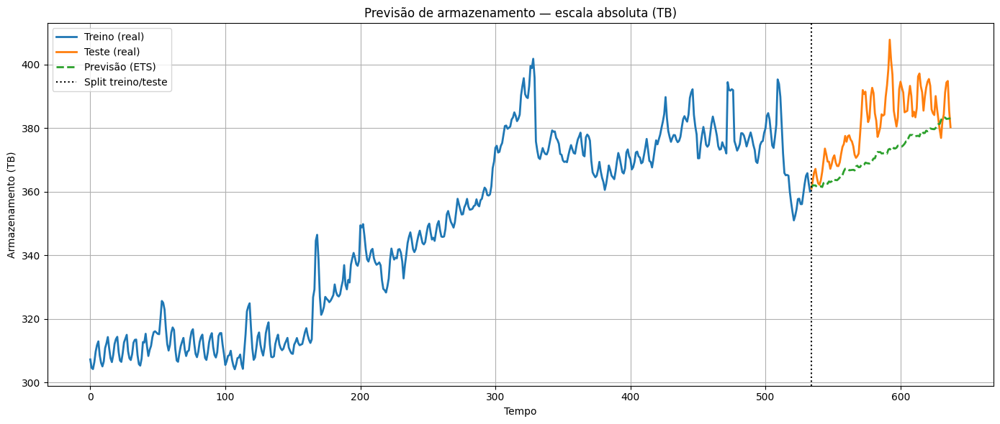

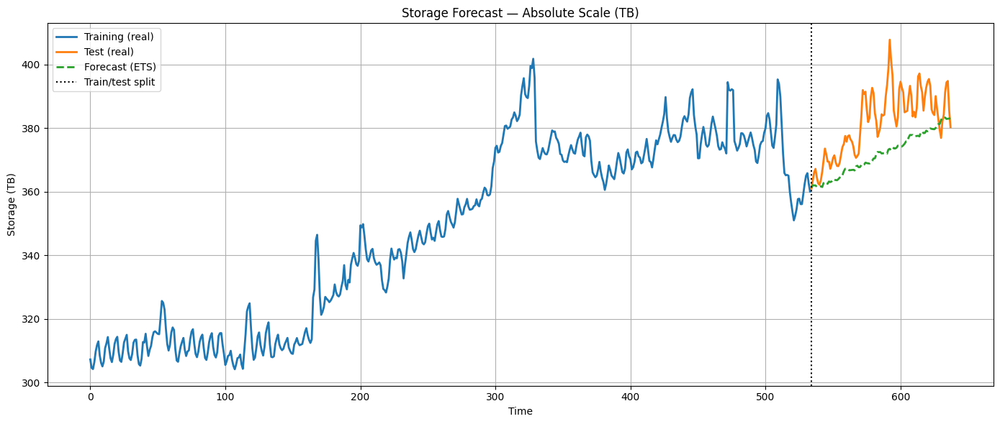

In [62]:
# ============================================================
# RECONSTRUÇÃO COMPLETA (ABSOLUTA - TB)
# Série atual em GB → TB decimal = /1000
# ============================================================

window_size = BEST_WINDOW_MLP
split_index = train_size
scaler_used = scaler

TO_TB = 1000  # GB -> TB

# -------- BASE VALUE --------
# último valor real antes do primeiro alvo de teste
base_idx = split_index + window_size - 1
base_value = series[base_idx]

# -------- TEST (real reconstruído) --------
y_test_inv = scaler_used.inverse_transform(
    y_test.reshape(-1, 1)
).ravel()

y_test_abs = base_value + np.cumsum(y_test_inv)
y_test_tb = y_test_abs / TO_TB

# -------- FORECAST --------
y_pred_inv = scaler_used.inverse_transform(
    y_pred_exp.reshape(-1, 1)
).ravel()

y_pred_abs = base_value + np.cumsum(y_pred_inv)
y_pred_tb = y_pred_abs / TO_TB

# -------- TRAIN (histórico real direto da série) --------
train_series = series[:base_idx + 1]
train_series_tb = train_series / TO_TB

# -------- EIXOS --------
x_train = np.arange(len(train_series_tb))

x_test = np.arange(
    len(train_series_tb),
    len(train_series_tb) + len(y_test_tb)
)

# ============================================================
# DEBUG
# ============================================================

print("\n=== DEBUG RECONSTRUÇÃO ===")
print(f"base_idx                : {base_idx}")
print(f"Último treino real       : {train_series_tb[-1]:.3f} TB")
print(f"Primeiro teste reconstruído: {y_test_tb[0]:.3f} TB")
print(f"Primeira previsão        : {y_pred_tb[0]:.3f} TB")
print(f"Última previsão          : {y_pred_tb[-1]:.3f} TB")

# ============================================================
# PLOT PT-BR
# ============================================================

plt.figure(figsize=(14, 6))

plt.plot(
    x_train,
    train_series_tb,
    label="Treino (real)",
    linewidth=2
)

plt.plot(
    x_test,
    y_test_tb,
    label="Teste (real)",
    linewidth=2
)

plt.plot(
    x_test,
    y_pred_tb,
    linestyle="--",
    linewidth=2,
    label="Previsão (ETS)"
)

plt.axvline(
    len(train_series_tb),
    linestyle=":",
    color="black",
    label="Split treino/teste"
)

plt.title("Previsão de armazenamento — escala absoluta (TB)")
plt.xlabel("Tempo")
plt.ylabel("Armazenamento (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()

plt.savefig(
    "exp_train_test_forecast_absolute_tb.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

# ============================================================
# PLOT EN
# ============================================================

plt.figure(figsize=(14, 6))

plt.plot(
    x_train,
    train_series_tb,
    label="Training (real)",
    linewidth=2
)

plt.plot(
    x_test,
    y_test_tb,
    label="Test (real)",
    linewidth=2
)

plt.plot(
    x_test,
    y_pred_tb,
    linestyle="--",
    linewidth=2,
    label="Forecast (ETS)"
)

plt.axvline(
    len(train_series_tb),
    linestyle=":",
    color="black",
    label="Train/test split"
)

plt.title("Storage Forecast — Absolute Scale (TB)")
plt.xlabel("Time")
plt.ylabel("Storage (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()

plt.savefig(
    "exp_train_test_forecast_absolute_tb-en.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

In [63]:
if SAVE == 1:
    # ============================================================
    # 💾 SAVE EVERYTHING - ETS
    # ============================================================

    import os
    import json
    import shutil
    import joblib
    import numpy as np

    MODEL_NAME = "exp"

    os.makedirs(BASE_PATH, exist_ok=True)

    # ============================================================
    # COMPATIBILITY ALIASES
    # ============================================================
    # No código ETS, as variáveis foram criadas com sufixo _tib:
    # forecast_tib_exp, y_test_abs_exp_tib, y_pred_abs_exp_tib.
    # O template SAVE usava _tb, então criamos aliases.

    forecast_tb_exp = forecast_tib_exp
    y_test_abs_exp_tb = y_test_abs_exp_tib
    y_pred_abs_exp_tb = y_pred_abs_exp_tib

    # ============================================================
    # 1) SAVE SCALER
    # ============================================================
    joblib.dump(scaler, f"{BASE_PATH}/{MODEL_NAME}_scaler.save")

    # ============================================================
    # 2) SAVE CONFIG
    # ============================================================
    config_exp = {
        "model_type": "ExponentialSmoothing",
        "trend": None,
        "seasonal": None,
        "window_reference": int(BEST_WINDOW_MLP),
        "forecast_steps": int(FORECAST_STEPS),
        "forecast_days": int(FORECAST_DAYS),
        "time_unit": str(time_unit),
        "train_size": int(train_size),
        "train_len": int(len(y_train)),
        "test_len": int(len(y_test)),
        "reconstruction_base_index": int(train_size + BEST_WINDOW_MLP - 1),
        "unit_original": "GB",
        "unit_converted": "TiB",
        "conversion_factor": 1024
    }

    with open(f"{BASE_PATH}/{MODEL_NAME}_config.json", "w", encoding="utf-8") as f:
        json.dump(config_exp, f, ensure_ascii=False, indent=4)

    # ============================================================
    # 3) SAVE METRICS
    # ============================================================
    metrics_exp = {
        "mse_norm": float(mse_exp),
        "rmse_norm": float(rmse_exp),
        "r2_norm": float(r2_exp),

        "mse_abs_gb": float(mse_abs_exp),
        "rmse_abs_gb": float(rmse_abs_exp),
        "r2_abs_gb": float(r2_abs_exp),

        "mse_abs_tib": float(mse_abs_exp_tib),
        "rmse_abs_tib": float(rmse_abs_exp_tib),
        "r2_abs_tib": float(r2_abs_exp_tib),

        "forecast_last_tb": float(forecast_tb_exp[-1]),
        "forecast_last_tib": float(forecast_tib_exp[-1])
    }

    with open(f"{BASE_PATH}/{MODEL_NAME}_metrics.json", "w", encoding="utf-8") as f:
        json.dump(metrics_exp, f, ensure_ascii=False, indent=4)

    # ============================================================
    # 4) SAVE MAIN ARRAYS
    # ============================================================
    np.save(f"{BASE_PATH}/y_train_{MODEL_NAME}.npy", y_train)
    np.save(f"{BASE_PATH}/y_test_{MODEL_NAME}.npy", y_test)
    np.save(f"{BASE_PATH}/y_pred_{MODEL_NAME}.npy", y_pred_exp)

    np.save(f"{BASE_PATH}/y_test_inv_{MODEL_NAME}.npy", y_test_inv_exp)
    np.save(f"{BASE_PATH}/y_pred_inv_{MODEL_NAME}.npy", y_pred_inv_exp)

    np.save(f"{BASE_PATH}/y_test_abs_{MODEL_NAME}.npy", y_test_abs_exp)
    np.save(f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}.npy", y_pred_abs_exp)

    np.save(f"{BASE_PATH}/y_test_abs_{MODEL_NAME}_tb.npy", y_test_abs_exp_tb)
    np.save(f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}_tb.npy", y_pred_abs_exp_tb)

    # ============================================================
    # 5) SAVE FORECAST
    # ============================================================
    np.save(f"{BASE_PATH}/forecast_diffs_{MODEL_NAME}.npy", np.asarray(forecast_diffs_exp))
    np.save(f"{BASE_PATH}/forecast_diffs_inv_{MODEL_NAME}.npy", forecast_diffs_inv_exp)
    np.save(f"{BASE_PATH}/forecast_abs_{MODEL_NAME}.npy", forecast_abs_exp)
    np.save(f"{BASE_PATH}/forecast_tb_{MODEL_NAME}.npy", forecast_tb_exp)

    # ============================================================
    # 6) SAVE PREPROCESSING REFERENCES
    # ============================================================
    np.save(f"{BASE_PATH}/series_original.npy", series)
    np.save(f"{BASE_PATH}/diff_series.npy", diff_series)
    np.save(f"{BASE_PATH}/diff_train.npy", diff_train)
    np.save(f"{BASE_PATH}/diff_test.npy", diff_test)
    np.save(f"{BASE_PATH}/diff_train_norm.npy", diff_train_norm)
    np.save(f"{BASE_PATH}/diff_test_norm.npy", diff_test_norm)

    np.save(f"{BASE_PATH}/y_train_source_{MODEL_NAME}.npy", y_train)
    np.save(f"{BASE_PATH}/y_test_source_{MODEL_NAME}.npy", y_test)

    # ============================================================
    # 7) SAVE RECONSTRUCTION INFO
    # ============================================================
    reconstruction_info_exp = {
        "split": int(train_size),
        "base_value": float(base_value),
        "series_last_value": float(series[-1]),
        "series_last_value_tib": float(series[-1] / 1024),
        "forecast_last_value_tib": float(forecast_tb_exp[-1])
    }

    with open(f"{BASE_PATH}/reconstruction_info_{MODEL_NAME}.json", "w", encoding="utf-8") as f:
        json.dump(reconstruction_info_exp, f, ensure_ascii=False, indent=4)

    # ============================================================
    # 8) COPY JSON/CSV/PNG FILES IF THEY EXIST
    # ============================================================
    artifact_files = [
        "exp_metrics_normalized.json",
        "exp_metricas_normalizado.json",
        "exp_metrics_absolute.json",
        "exp_metricas_absolutas.json",
        "exp_validation_normalized.csv",
        "exp_validacao_normalizado.csv",
        "exp_validation_absolute.csv",
        "exp_validacao_absoluta.csv",
        "exp_future_forecast.csv",
        "exp_forecast_futuro.csv",
        "exp_model_comparison.csv",
        "exp_comparacao_modelos.csv",
        "exp_train_test_forecast_en.png",
        "exp_treino_teste_previsao_pt.png",
        "exp_absolute_forecast_en.png",
        "exp_previsao_absoluta_pt.png",
        "exp_test_zoom_en.png",
        "exp_zoom_teste_pt.png",
        "exp_validation_absolute_en.png",
        "exp_validacao_absoluta_pt.png",
        "exp_future_forecast_en.png",
        "exp_forecast_futuro_pt.png",
    ]

    for fname in artifact_files:
        if os.path.exists(fname):
            dest = os.path.join(BASE_PATH, fname)
            if os.path.abspath(fname) != os.path.abspath(dest):
                shutil.copy2(fname, dest)

    # ============================================================
    # ✅ SUMMARY
    # ============================================================
    print(f"✅ AllETSartifacts saved in:\n{BASE_PATH}")
    print(f"Final forecast: {forecast_tb_exp[-1]:.3f} TiB")

In [64]:
if RELOAD == 1:
    # ============================================================
    # 🔄 RELOAD EVERYTHING - ETS
    # ============================================================

    import os
    import json
    import joblib
    import numpy as np
    from statsmodels.tsa.holtwinters import ExponentialSmoothing

    MODEL_NAME = "exp"

    # ============================================================
    # FILE PATHS
    # ============================================================
    FILE_SCALER             = f"{BASE_PATH}/{MODEL_NAME}_scaler.save"
    FILE_CONFIG             = f"{BASE_PATH}/{MODEL_NAME}_config.json"
    FILE_METRICS            = f"{BASE_PATH}/{MODEL_NAME}_metrics.json"

    FILE_Y_TRAIN            = f"{BASE_PATH}/y_train_{MODEL_NAME}.npy"
    FILE_Y_TEST             = f"{BASE_PATH}/y_test_{MODEL_NAME}.npy"
    FILE_Y_PRED             = f"{BASE_PATH}/y_pred_{MODEL_NAME}.npy"

    FILE_Y_TEST_INV         = f"{BASE_PATH}/y_test_inv_{MODEL_NAME}.npy"
    FILE_Y_PRED_INV         = f"{BASE_PATH}/y_pred_inv_{MODEL_NAME}.npy"

    FILE_Y_TEST_ABS         = f"{BASE_PATH}/y_test_abs_{MODEL_NAME}.npy"
    FILE_Y_PRED_ABS         = f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}.npy"
    FILE_Y_TEST_ABS_TB      = f"{BASE_PATH}/y_test_abs_{MODEL_NAME}_tb.npy"
    FILE_Y_PRED_ABS_TB      = f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}_tb.npy"

    FILE_FORECAST_DIFFS     = f"{BASE_PATH}/forecast_diffs_{MODEL_NAME}.npy"
    FILE_FORECAST_DIFFS_INV = f"{BASE_PATH}/forecast_diffs_inv_{MODEL_NAME}.npy"
    FILE_FORECAST_ABS       = f"{BASE_PATH}/forecast_abs_{MODEL_NAME}.npy"
    FILE_FORECAST_TB        = f"{BASE_PATH}/forecast_tb_{MODEL_NAME}.npy"

    FILE_SERIES             = f"{BASE_PATH}/series_original.npy"
    FILE_DIFF_SERIES        = f"{BASE_PATH}/diff_series.npy"
    FILE_DIFF_TRAIN         = f"{BASE_PATH}/diff_train.npy"
    FILE_DIFF_TEST          = f"{BASE_PATH}/diff_test.npy"
    FILE_DIFF_TRAIN_NORM    = f"{BASE_PATH}/diff_train_norm.npy"
    FILE_DIFF_TEST_NORM     = f"{BASE_PATH}/diff_test_norm.npy"

    FILE_RECON_INFO         = f"{BASE_PATH}/reconstruction_info_{MODEL_NAME}.json"

    # ============================================================
    # LOAD CORE
    # ============================================================
    scaler = joblib.load(FILE_SCALER)

    with open(FILE_CONFIG, "r", encoding="utf-8") as f:
        config_exp = json.load(f)

    with open(FILE_METRICS, "r", encoding="utf-8") as f:
        metrics_exp = json.load(f)

    FORECAST_STEPS = int(config_exp["forecast_steps"])
    FORECAST_DAYS  = int(config_exp["forecast_days"])
    time_unit      = config_exp["time_unit"]
    train_size     = int(config_exp["train_size"])
    BEST_WINDOW_ETSREF = int(config_exp["window_reference"])

    # ============================================================
    # LOAD ARRAYS
    # ============================================================
    y_train = np.load(FILE_Y_TRAIN)
    y_test  = np.load(FILE_Y_TEST)
    y_pred_exp = np.load(FILE_Y_PRED)

    y_test_inv_exp = np.load(FILE_Y_TEST_INV)
    y_pred_inv_exp = np.load(FILE_Y_PRED_INV)

    y_test_abs_exp = np.load(FILE_Y_TEST_ABS)
    y_pred_abs_exp = np.load(FILE_Y_PRED_ABS)

    y_test_abs_exp_tb = np.load(FILE_Y_TEST_ABS_TB)
    y_pred_abs_exp_tb = np.load(FILE_Y_PRED_ABS_TB)

    forecast_diffs_exp     = np.load(FILE_FORECAST_DIFFS)
    forecast_diffs_inv_exp = np.load(FILE_FORECAST_DIFFS_INV)
    forecast_abs_exp       = np.load(FILE_FORECAST_ABS)
    forecast_tb_exp        = np.load(FILE_FORECAST_TB)

    # aliases para compatibilidade com o códigoETSoriginal
    y_test_abs_exp_tib = y_test_abs_exp_tb
    y_pred_abs_exp_tib = y_pred_abs_exp_tb
    forecast_tib_exp = forecast_tb_exp

    series          = np.load(FILE_SERIES)
    diff_series     = np.load(FILE_DIFF_SERIES)
    diff_train      = np.load(FILE_DIFF_TRAIN)
    diff_test       = np.load(FILE_DIFF_TEST)
    diff_train_norm = np.load(FILE_DIFF_TRAIN_NORM)
    diff_test_norm  = np.load(FILE_DIFF_TEST_NORM)

    with open(FILE_RECON_INFO, "r", encoding="utf-8") as f:
        reconstruction_info_exp = json.load(f)

    base_value = reconstruction_info_exp["base_value"]
    series_last_value = reconstruction_info_exp["series_last_value"]
    split = reconstruction_info_exp["split"]

    # ============================================================
    # OPTIONAL RE-FIT / RECOMPUTE
    # ============================================================
    model_exp_reloaded = ExponentialSmoothing(
        np.asarray(y_train).ravel(),
        trend=None,
        seasonal=None
    )

    fit_exp_reloaded = model_exp_reloaded.fit(optimized=True)
    y_pred_exp_recomputed = fit_exp_reloaded.forecast(len(y_test))

    model_future_exp_reloaded = ExponentialSmoothing(
        np.asarray(diff_train_norm).reshape(-1),
        trend=None,
        seasonal=None
    )

    fit_future_exp_reloaded = model_future_exp_reloaded.fit(optimized=True)
    forecast_diffs_exp_recomputed = fit_future_exp_reloaded.forecast(FORECAST_STEPS)

    forecast_diffs_inv_exp_recomputed = scaler.inverse_transform(
        np.asarray(forecast_diffs_exp_recomputed).reshape(-1, 1)
    ).ravel()

    forecast_abs_exp_recomputed = series[-1] + np.cumsum(forecast_diffs_inv_exp_recomputed)
    forecast_tb_exp_recomputed = forecast_abs_exp_recomputed / 1024

    # ============================================================
    # SAFE METRIC GETTER
    # ============================================================
    def get_metric(metrics, *keys, default=np.nan):
        for key in keys:
            if key in metrics:
                return metrics[key]
        return default

    mse_abs_print = get_metric(metrics_exp, "mse_abs", "mse_abs_gb")
    rmse_abs_print = get_metric(metrics_exp, "rmse_abs", "rmse_abs_gb")
    r2_abs_print = get_metric(metrics_exp, "r2_abs", "r2_abs_gb")

    # ============================================================
    # SUMMARY
    # ============================================================
    print("\n✅ RELOAD EVERYTHING -ETSCOMPLETED")
    print(f"Base path              : {BASE_PATH}")
    print(f"Model                  : {MODEL_NAME}")
    print(f"Forecast steps         : {FORECAST_STEPS}")
    print(f"Forecast days          : {FORECAST_DAYS}")
    print(f"Time unit              : {time_unit}")
    print(f"Train size             : {train_size}")
    print(f"Window reference       : {BEST_WINDOW_ETSREF}")

    print("\n📊 Metrics")
    print(f"MSE norm               : {metrics_exp['mse_norm']:.6e}")
    print(f"RMSE norm              : {metrics_exp['rmse_norm']:.6e}")
    print(f"R² norm                : {metrics_exp['r2_norm']:.6f}")
    print(f"MSE abs                : {mse_abs_print:.6e}")
    print(f"RMSE abs               : {rmse_abs_print:.6e}")
    print(f"R² abs                 : {r2_abs_print:.6f}")
    print(f"Final forecast TB      : {metrics_exp['forecast_last_tb']:.3f}")

    print("\n📐 Shapes")
    print(f"y_train                : {y_train.shape}")
    print(f"y_test                 : {y_test.shape}")
    print(f"y_pred_exp             : {y_pred_exp.shape}")
    print(f"y_test_abs_exp         : {y_test_abs_exp.shape}")
    print(f"y_test_abs_exp_tb      : {y_test_abs_exp_tb.shape}")
    print(f"forecast_tb_exp        : {forecast_tb_exp.shape}")

    # ============================================================
    # PACKAGE EVERYTHING
    # ============================================================
    artifacts_exp = {
        "scaler": scaler,
        "config_exp": config_exp,
        "metrics_exp": metrics_exp,

        "y_train": y_train,
        "y_test": y_test,
        "y_pred_exp": y_pred_exp,

        "y_test_inv_exp": y_test_inv_exp,
        "y_pred_inv_exp": y_pred_inv_exp,

        "y_test_abs_exp": y_test_abs_exp,
        "y_pred_abs_exp": y_pred_abs_exp,

        "y_test_abs_exp_tb": y_test_abs_exp_tb,
        "y_pred_abs_exp_tb": y_pred_abs_exp_tb,
        "y_test_abs_exp_tib": y_test_abs_exp_tib,
        "y_pred_abs_exp_tib": y_pred_abs_exp_tib,

        "forecast_diffs_exp": forecast_diffs_exp,
        "forecast_diffs_inv_exp": forecast_diffs_inv_exp,
        "forecast_abs_exp": forecast_abs_exp,
        "forecast_tb_exp": forecast_tb_exp,
        "forecast_tib_exp": forecast_tib_exp,

        "series": series,
        "diff_series": diff_series,
        "diff_train": diff_train,
        "diff_test": diff_test,
        "diff_train_norm": diff_train_norm,
        "diff_test_norm": diff_test_norm,

        "split": split,
        "train_size": train_size,
        "base_value": base_value,
        "series_last_value": series_last_value,

        "model_exp_reloaded": model_exp_reloaded,
        "fit_exp_reloaded": fit_exp_reloaded,
        "y_pred_exp_recomputed": y_pred_exp_recomputed,

        "model_future_exp_reloaded": model_future_exp_reloaded,
        "fit_future_exp_reloaded": fit_future_exp_reloaded,
        "forecast_diffs_exp_recomputed": forecast_diffs_exp_recomputed,
        "forecast_diffs_inv_exp_recomputed": forecast_diffs_inv_exp_recomputed,
        "forecast_abs_exp_recomputed": forecast_abs_exp_recomputed,
        "forecast_tb_exp_recomputed": forecast_tb_exp_recomputed,
    }

    print("\n✅ artifacts_exp dictionary created.")


✅ RELOAD EVERYTHING -ETSCOMPLETED
Base path              : /content/drive/MyDrive/Colab Notebooks/MESTRADO/1-TESE/360/12-jun-2026
Model                  : exp
Forecast steps         : 360
Forecast days          : 360
Time unit              : day
Train size             : 510
Window reference       : 24

📊 Metrics
MSE norm               : 3.373624e-02
RMSE norm              : 1.836743e-01
R² norm                : -0.000027
MSE abs                : 2.124564e+08
RMSE abs               : 1.457588e+04
R² abs                 : -1.041918
Final forecast TB      : 430.062

📐 Shapes
y_train                : (486,)
y_test                 : (104,)
y_pred_exp             : (104,)
y_test_abs_exp         : (104,)
y_test_abs_exp_tb      : (104,)
forecast_tb_exp        : (360,)

✅ artifacts_exp dictionary created.


# ARIMA

Train shape: (486,)
Test shape : (104,)
Series shape: (639,)

🔎 Searching best ARIMA(p,0,q) by AIC...

ARIMA(0, 0, 0) -> AIC=-440.9613 | BIC=-432.5930
ARIMA(0, 0, 1) -> AIC=-485.4850 | BIC=-472.9388
ARIMA(0, 0, 2) -> AIC=-493.2199 | BIC=-476.4999
ARIMA(0, 0, 3) -> AIC=-502.1275 | BIC=-481.2378
ARIMA(0, 0, 4) -> AIC=-526.8072 | BIC=-501.7520
ARIMA(0, 0, 5) -> AIC=-558.6980 | BIC=-529.4815
ARIMA(1, 0, 0) -> AIC=-488.9798 | BIC=-476.4273
ARIMA(1, 0, 1) -> AIC=-487.1036 | BIC=-470.3752
ARIMA(1, 0, 2) -> AIC=-501.9094 | BIC=-481.0093
ARIMA(1, 0, 3) -> AIC=-530.6144 | BIC=-505.5468
ARIMA(1, 0, 4) -> AIC=-542.7688 | BIC=-513.5377
ARIMA(1, 0, 5) -> AIC=-561.4884 | BIC=-528.0981
ARIMA(2, 0, 0) -> AIC=-491.3199 | BIC=-474.5915
ARIMA(2, 0, 1) -> AIC=-540.3722 | BIC=-519.4618
ARIMA(2, 0, 2) -> AIC=-636.2133 | BIC=-611.1332
ARIMA(2, 0, 3) -> AIC=-632.6951 | BIC=-603.4495
ARIMA(2, 0, 4) -> AIC=-639.6172 | BIC=-606.2102
ARIMA(2, 0, 5) -> AIC=-637.0104 | BIC=-599.4464
ARIMA(3, 0, 0) -> AIC=-541.9144 |

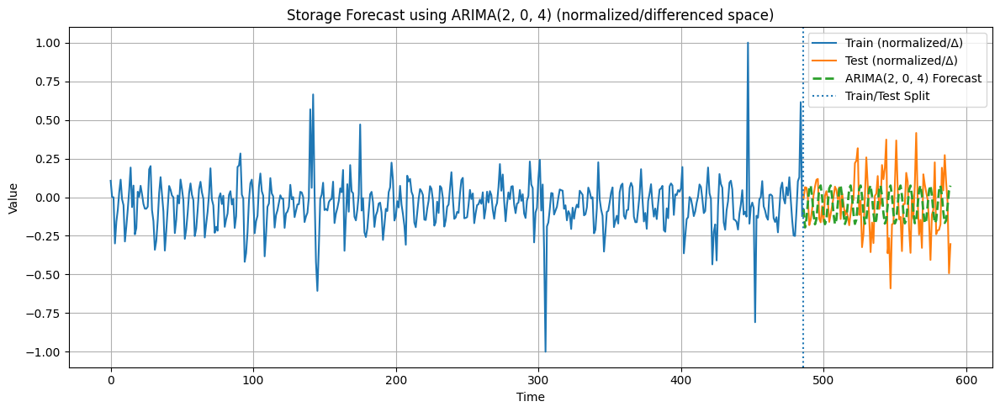

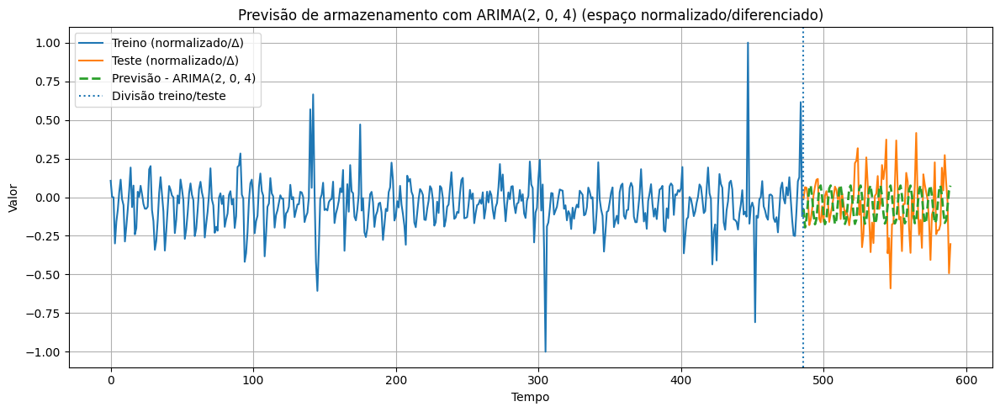

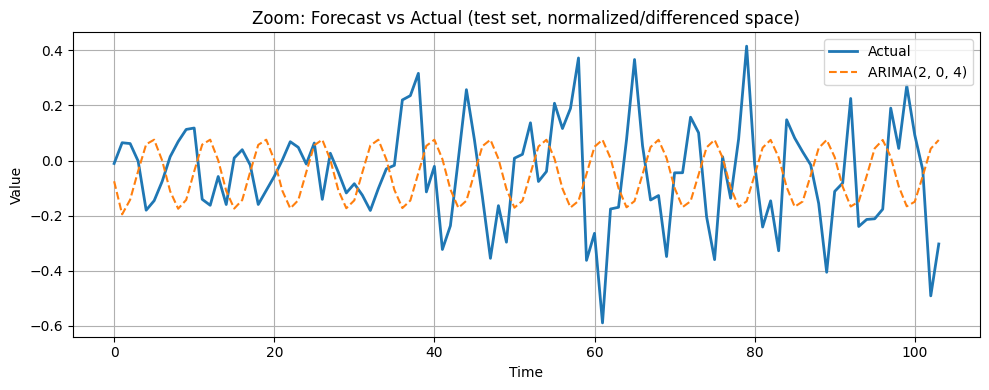

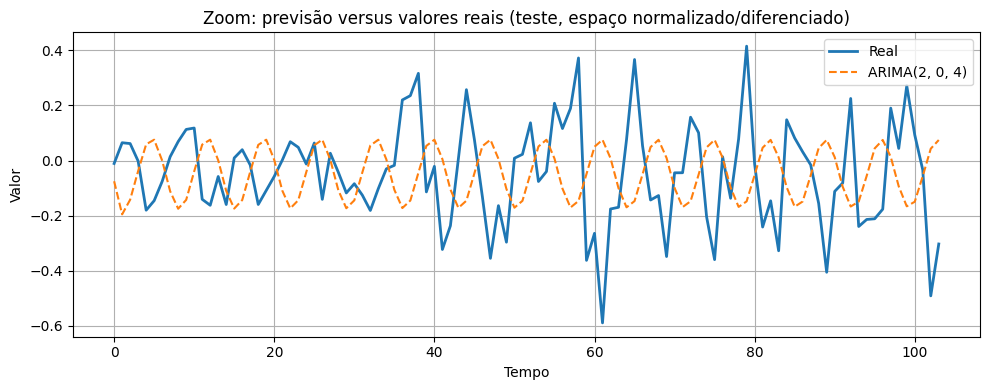


📊 Best ARIMA(2, 0, 4) — Escala absoluta
MSE(abs)  : 3.226388e+08
RMSE(abs) : 1.796215e+04
R²(abs)   : -2.100882

📊 Best ARIMA(2, 0, 4) — Escala absoluta em TB
MSE(TB²) : 322.638809
RMSE(TB): 17.962149
R²(TB)  : -2.100882


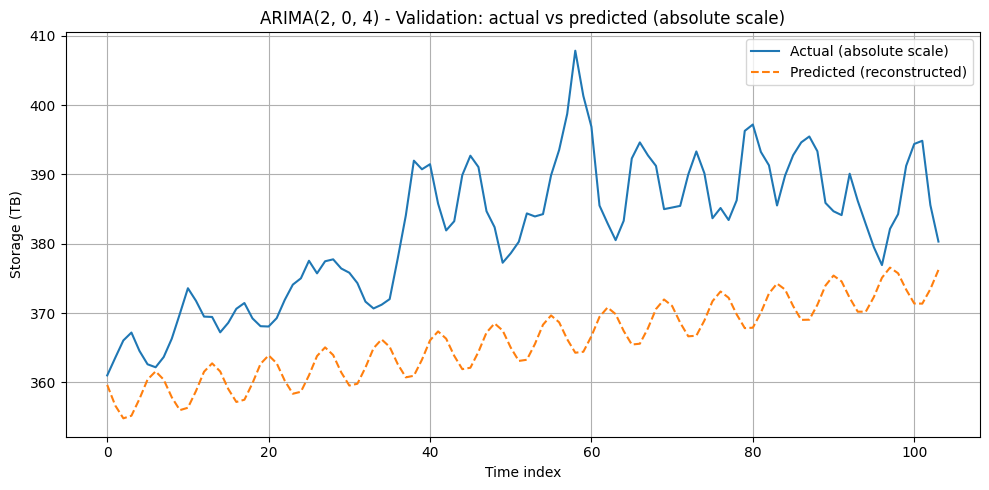

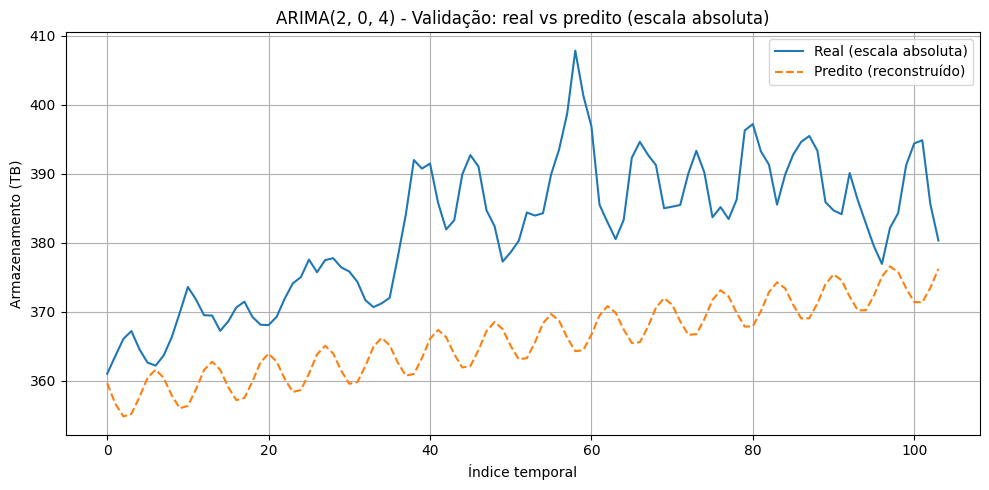

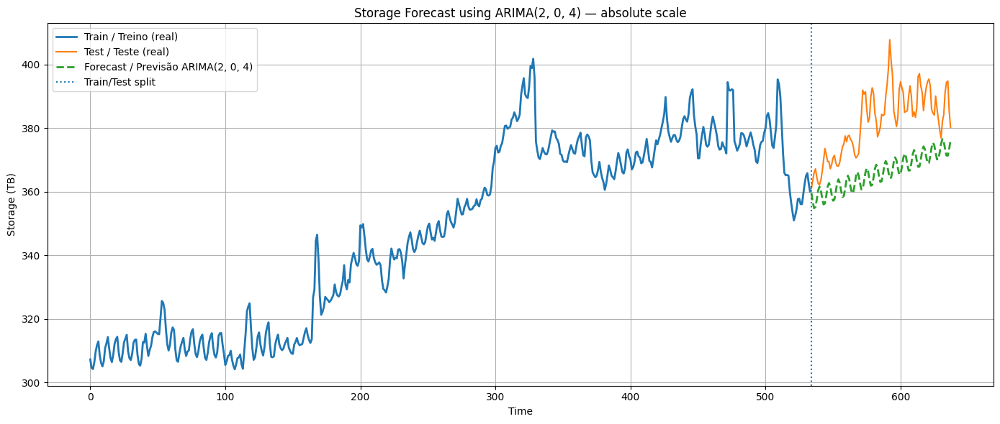


📊 Best ARIMA(2, 0, 4) - Future forecast:
Step 001: 377.950 TB
Step 002: 381.041 TB
Step 003: 386.016 TB
Step 004: 389.143 TB
Step 005: 388.246 TB
Step 006: 384.240 TB
Step 007: 380.325 TB
Step 008: 379.509 TB
Step 009: 382.369 TB
Step 010: 386.710 TB
Step 011: 389.319 TB
Step 012: 388.402 TB
Step 013: 384.868 TB
Step 014: 381.547 TB
Step 015: 380.998 TB
Step 016: 383.610 TB
Step 017: 387.395 TB
Step 018: 389.566 TB
Step 019: 388.652 TB
Step 020: 385.543 TB
...

🔮 Final forecast value (360 days ahead): 425.353 TB


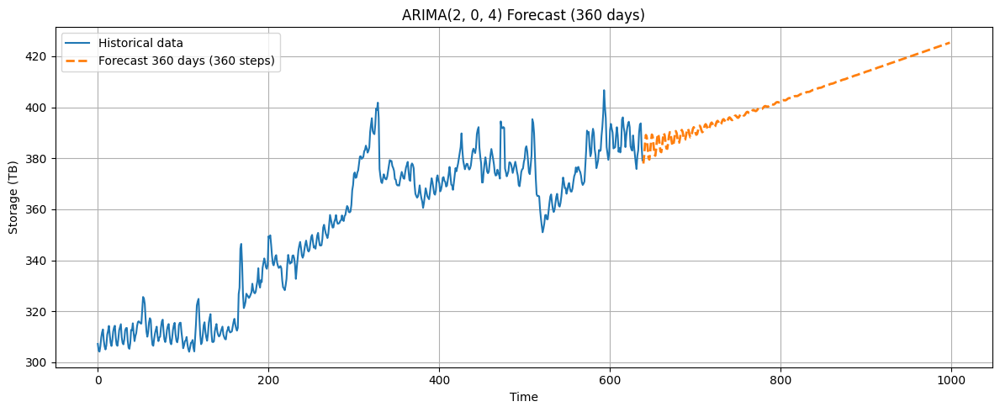

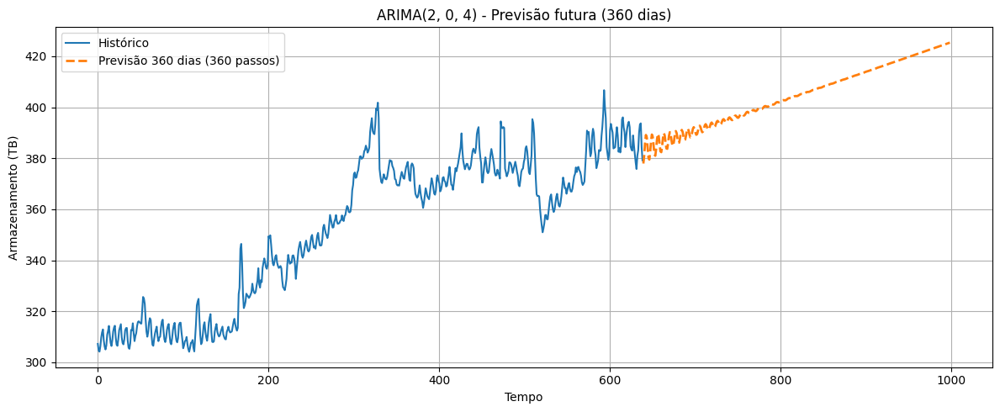


✅ Arquivos salvos:
- arima_grid_search_aic.csv
- arima_busca_aic.csv
- arima_best_model.json
- arima_melhor_modelo.json
- arima_metrics_normalized.json
- arima_metricas_normalizado.json
- arima_metrics_absolute.json
- arima_metricas_absolutas.json
- arima_summary.json
- arima_resumo.json
- arima_validation_normalized.csv
- arima_validacao_normalizado.csv
- arima_validation_absolute.csv
- arima_validacao_absoluta.csv
- arima_future_forecast.csv
- arima_forecast_futuro.csv
- arima_train_test_forecast_en.png
- arima_treino_teste_previsao_pt.png
- arima_test_zoom_en.png
- arima_zoom_teste_pt.png
- arima_validation_absolute_en.png
- arima_validacao_absoluta_pt.png
- arima_train_test_forecast_absolute_en.png
- arima_train_test_forecast_absolute_pt.png
- arima_future_forecast_en.png
- arima_forecast_futuro_pt.png


In [65]:
# ============================================================
# 🔥 BASELINE ESTATÍSTICO — ARIMA COM BUSCA AUTOMÁTICA POR AIC
#    Corrigido: escala TB, reconstrução, d=0 após differencing
# ============================================================

import json
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import r2_score, mean_squared_error
from statsmodels.tsa.arima.model import ARIMA

warnings.filterwarnings("ignore")

# ============================================================
# ✅ FUNÇÕES AUXILIARES
# ============================================================
def to_tb(x):
    """
    Converte para TB conforme a unidade provável:
    - bytes -> TB
    - MB    -> TB
    - GB    -> TB
    - TB    -> mantém
    """
    x = np.asarray(x, dtype=float)
    med = np.nanmedian(np.abs(x))

    if med > 1e12:      # bytes
        return x / 1e12
    elif med > 1e6:     # MB
        return x / 1e6
    elif med > 1e3:     # GB
        return x / 1e3
    else:               # já em TB
        return x

def safe_r2(y_true, y_pred):
    if len(y_true) < 2 or np.allclose(y_true, y_true[0]):
        return np.nan
    return r2_score(y_true, y_pred)


# ============================================================
# ✅ DADOS DE ENTRADA
# ============================================================
y_train = np.asarray(y_train_mlp).ravel()
y_test  = np.asarray(y_test_mlp).ravel()
series  = np.asarray(series).ravel()

print("Train shape:", y_train.shape)
print("Test shape :", y_test.shape)
print("Series shape:", series.shape)

# ============================================================
# ✅ PARÂMETROS
# ============================================================
window_size = BEST_WINDOW_MLP
split_index = train_size
scaler_used = scaler

# Como y_train/y_test já são diferenciados e normalizados,
# NÃO aplicar integração novamente dentro do ARIMA.
D_VALUE = 0

P_VALUES = range(0, 6)
Q_VALUES = range(0, 6)

# ============================================================
# ✅ BUSCA AUTOMÁTICA DO MELHOR ARIMA(p,0,q) POR AIC
# ============================================================
search_results = []
best_aic = np.inf
best_order = None
best_fit = None

print("\n🔎 Searching best ARIMA(p,0,q) by AIC...\n")

for p in P_VALUES:
    for q in Q_VALUES:
        order = (p, D_VALUE, q)

        try:
            model = ARIMA(
                y_train,
                order=order,
                enforce_stationarity=False,
                enforce_invertibility=False
            )
            fit = model.fit()

            aic = fit.aic
            bic = fit.bic

            search_results.append({
                "p": p,
                "d": D_VALUE,
                "q": q,
                "aic": float(aic),
                "bic": float(bic)
            })

            print(f"ARIMA{order} -> AIC={aic:.4f} | BIC={bic:.4f}")

            if aic < best_aic:
                best_aic = aic
                best_order = order
                best_fit = fit

        except Exception as e:
            print(f"ARIMA{order} -> failed ({str(e)[:80]})")
            search_results.append({
                "p": p,
                "d": D_VALUE,
                "q": q,
                "aic": None,
                "bic": None,
                "error": str(e)
            })

if best_fit is None:
    raise RuntimeError("Nenhum modelo ARIMA convergiu durante a busca.")

print("\n✅ Best model found:")
print(f"ARIMA{best_order} | AIC={best_fit.aic:.4f} | BIC={best_fit.bic:.4f}")

# ============================================================
# ✅ SALVAR BUSCA
# ============================================================
df_search = pd.DataFrame(search_results)
df_search.to_csv("arima_grid_search_aic.csv", index=False)
df_search.to_csv("arima_busca_aic.csv", index=False)

best_model_info = {
    "best_order": list(best_order),
    "best_aic": float(best_fit.aic),
    "best_bic": float(best_fit.bic),
    "note": "ARIMA fitted on already differenced and normalized series; therefore d=0."
}

with open("arima_best_model.json", "w", encoding="utf-8") as f:
    json.dump(best_model_info, f, ensure_ascii=False, indent=4)

with open("arima_melhor_modelo.json", "w", encoding="utf-8") as f:
    json.dump(best_model_info, f, ensure_ascii=False, indent=4)

# ============================================================
# ✅ PREVISÃO NO CONJUNTO DE TESTE
# ============================================================
y_pred_arima = np.asarray(best_fit.forecast(steps=len(y_test))).ravel()

# ============================================================
# ✅ MÉTRICAS NO ESPAÇO NORMALIZADO / DIFERENCIADO
# ============================================================
mse_arima = mean_squared_error(y_test, y_pred_arima)
rmse_arima = np.sqrt(mse_arima)
r2_arima = safe_r2(y_test, y_pred_arima)

print(f"\n📊 Best ARIMA{best_order} — Espaço normalizado/diferenciado")
print(f"MSE  : {mse_arima:.6e}")
print(f"RMSE : {rmse_arima:.6e}")
print(f"R²   : {r2_arima:.6f}")

metrics_arima_norm = {
    "best_order": list(best_order),
    "aic": float(best_fit.aic),
    "bic": float(best_fit.bic),
    "mse": float(mse_arima),
    "rmse": float(rmse_arima),
    "r2": float(r2_arima)
}

with open("arima_metrics_normalized.json", "w", encoding="utf-8") as f:
    json.dump(metrics_arima_norm, f, ensure_ascii=False, indent=4)

with open("arima_metricas_normalizado.json", "w", encoding="utf-8") as f:
    json.dump(metrics_arima_norm, f, ensure_ascii=False, indent=4)

df_arima_norm = pd.DataFrame({
    "time_index": np.arange(len(y_test)),
    "y_true_norm": y_test,
    "y_pred_norm": y_pred_arima
})
df_arima_norm.to_csv("arima_validation_normalized.csv", index=False)
df_arima_norm.to_csv("arima_validacao_normalizado.csv", index=False)

# ============================================================
# ✅ PLOT 1 — TRAIN / TEST / FORECAST NORMALIZADO
# ============================================================
plt.figure(figsize=(12, 5))
plt.plot(np.arange(len(y_train)), y_train, label="Train (normalized/Δ)")
plt.plot(
    np.arange(len(y_train), len(y_train) + len(y_test)),
    y_test,
    label="Test (normalized/Δ)"
)
plt.plot(
    np.arange(len(y_train), len(y_train) + len(y_pred_arima)),
    y_pred_arima,
    linestyle="--",
    linewidth=2,
    label=f"ARIMA{best_order} Forecast"
)
plt.axvline(len(y_train), linestyle=":", label="Train/Test Split")
plt.title(f"Storage Forecast using ARIMA{best_order} (normalized/differenced space)")
plt.xlabel("Time")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("arima_train_test_forecast_en.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(12, 5))
plt.plot(np.arange(len(y_train)), y_train, label="Treino (normalizado/Δ)")
plt.plot(
    np.arange(len(y_train), len(y_train) + len(y_test)),
    y_test,
    label="Teste (normalizado/Δ)"
)
plt.plot(
    np.arange(len(y_train), len(y_train) + len(y_pred_arima)),
    y_pred_arima,
    linestyle="--",
    linewidth=2,
    label=f"Previsão - ARIMA{best_order}"
)
plt.axvline(len(y_train), linestyle=":", label="Divisão treino/teste")
plt.title(f"Previsão de armazenamento com ARIMA{best_order} (espaço normalizado/diferenciado)")
plt.xlabel("Tempo")
plt.ylabel("Valor")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("arima_treino_teste_previsao_pt.png", dpi=300, bbox_inches="tight")
plt.show()

# ============================================================
# ✅ PLOT 2 — ZOOM TESTE NORMALIZADO
# ============================================================
plt.figure(figsize=(10, 4))
plt.plot(y_test, label="Actual", linewidth=2)
plt.plot(y_pred_arima, linestyle="--", label=f"ARIMA{best_order}")
plt.title("Zoom: Forecast vs Actual (test set, normalized/differenced space)")
plt.xlabel("Time")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("arima_test_zoom_en.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(10, 4))
plt.plot(y_test, label="Real", linewidth=2)
plt.plot(y_pred_arima, linestyle="--", label=f"ARIMA{best_order}")
plt.title("Zoom: previsão versus valores reais (teste, espaço normalizado/diferenciado)")
plt.xlabel("Tempo")
plt.ylabel("Valor")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("arima_zoom_teste_pt.png", dpi=300, bbox_inches="tight")
plt.show()

# ============================================================
# ✅ RECONSTRUÇÃO EM ESCALA ABSOLUTA
# ============================================================
y_test_inv_arima = scaler_used.inverse_transform(y_test.reshape(-1, 1)).ravel()
y_pred_inv_arima = scaler_used.inverse_transform(y_pred_arima.reshape(-1, 1)).ravel()

# Base correta: último valor absoluto antes do primeiro alvo de teste
base_idx = split_index + window_size - 1

if base_idx < 0 or base_idx >= len(series):
    raise IndexError(
        f"base_idx={base_idx} fora da série. "
        f"Verifique split_index={split_index}, window_size={window_size}, len(series)={len(series)}."
    )

base_value = series[base_idx]

y_test_abs_arima = base_value + np.cumsum(y_test_inv_arima)
y_pred_abs_arima = base_value + np.cumsum(y_pred_inv_arima)

y_test_abs_arima_tb = to_tb(y_test_abs_arima)
y_pred_abs_arima_tb = to_tb(y_pred_abs_arima)

series_tb = to_tb(series)
train_series_tb = series_tb[:base_idx + 1]

# ============================================================
# ✅ MÉTRICAS EM ESCALA ABSOLUTA
# ============================================================
mse_abs_arima = mean_squared_error(y_test_abs_arima, y_pred_abs_arima)
rmse_abs_arima = np.sqrt(mse_abs_arima)
r2_abs_arima = safe_r2(y_test_abs_arima, y_pred_abs_arima)

mse_abs_arima_tb = mean_squared_error(y_test_abs_arima_tb, y_pred_abs_arima_tb)
rmse_abs_arima_tb = np.sqrt(mse_abs_arima_tb)
r2_abs_arima_tb = safe_r2(y_test_abs_arima_tb, y_pred_abs_arima_tb)

print(f"\n📊 Best ARIMA{best_order} — Escala absoluta")
print(f"MSE(abs)  : {mse_abs_arima:.6e}")
print(f"RMSE(abs) : {rmse_abs_arima:.6e}")
print(f"R²(abs)   : {r2_abs_arima:.6f}")

print(f"\n📊 Best ARIMA{best_order} — Escala absoluta em TB")
print(f"MSE(TB²) : {mse_abs_arima_tb:.6f}")
print(f"RMSE(TB): {rmse_abs_arima_tb:.6f}")
print(f"R²(TB)  : {r2_abs_arima_tb:.6f}")

metrics_arima_abs = {
    "best_order": list(best_order),
    "aic": float(best_fit.aic),
    "bic": float(best_fit.bic),
    "mse_abs_original_unit": float(mse_abs_arima),
    "rmse_abs_original_unit": float(rmse_abs_arima),
    "r2_abs_original_unit": float(r2_abs_arima),
    "mse_abs_tb2": float(mse_abs_arima_tb),
    "rmse_abs_tb": float(rmse_abs_arima_tb),
    "r2_abs_tb": float(r2_abs_arima_tb),
    "base_idx": int(base_idx),
    "base_value": float(base_value)
}

with open("arima_metrics_absolute.json", "w", encoding="utf-8") as f:
    json.dump(metrics_arima_abs, f, ensure_ascii=False, indent=4)

with open("arima_metricas_absolutas.json", "w", encoding="utf-8") as f:
    json.dump(metrics_arima_abs, f, ensure_ascii=False, indent=4)

df_arima_abs = pd.DataFrame({
    "time_index": np.arange(len(y_test_abs_arima_tb)),
    "y_true_tb": y_test_abs_arima_tb,
    "y_pred_tb": y_pred_abs_arima_tb,
    "error_tb": y_test_abs_arima_tb - y_pred_abs_arima_tb
})
df_arima_abs.to_csv("arima_validation_absolute.csv", index=False)
df_arima_abs.to_csv("arima_validacao_absoluta.csv", index=False)

# ============================================================
# ✅ PLOT 3 — VALIDAÇÃO ABSOLUTA
# ============================================================
plt.figure(figsize=(10, 5))
plt.plot(y_test_abs_arima_tb, label="Actual (absolute scale)")
plt.plot(y_pred_abs_arima_tb, "--", label="Predicted (reconstructed)")
plt.title(f"ARIMA{best_order} - Validation: actual vs predicted (absolute scale)")
plt.xlabel("Time index")
plt.ylabel("Storage (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("arima_validation_absolute_en.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(y_test_abs_arima_tb, label="Real (escala absoluta)")
plt.plot(y_pred_abs_arima_tb, "--", label="Predito (reconstruído)")
plt.title(f"ARIMA{best_order} - Validação: real vs predito (escala absoluta)")
plt.xlabel("Índice temporal")
plt.ylabel("Armazenamento (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("arima_validacao_absoluta_pt.png", dpi=300, bbox_inches="tight")
plt.show()

# ============================================================
# ✅ PLOT 3B — TREINO + TESTE + PREVISÃO ABSOLUTA
# ============================================================
x_train_abs = np.arange(len(train_series_tb))
x_test_abs = np.arange(len(train_series_tb), len(train_series_tb) + len(y_test_abs_arima_tb))

plt.figure(figsize=(14, 6))
plt.plot(x_train_abs, train_series_tb, label="Train / Treino (real)", linewidth=2)
plt.plot(x_test_abs, y_test_abs_arima_tb, label="Test / Teste (real)")
plt.plot(
    x_test_abs,
    y_pred_abs_arima_tb,
    linestyle="--",
    linewidth=2,
    label=f"Forecast / Previsão ARIMA{best_order}"
)
plt.axvline(len(train_series_tb), linestyle=":", label="Train/Test split")
plt.title(f"Storage Forecast using ARIMA{best_order} — absolute scale")
plt.xlabel("Time")
plt.ylabel("Storage (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("arima_train_test_forecast_absolute_en.png", dpi=300, bbox_inches="tight")
plt.savefig("arima_train_test_forecast_absolute_pt.png", dpi=300, bbox_inches="tight")
plt.show()

# ============================================================
# ✅ FUTURE FORECAST
# ============================================================
# Usa toda a série, diferenciada e normalizada, com o mesmo scaler
diff_all = np.diff(series)
diff_all_norm = scaler_used.transform(diff_all.reshape(-1, 1)).ravel()

model_future_arima = ARIMA(
    diff_all_norm,
    order=best_order,
    enforce_stationarity=False,
    enforce_invertibility=False
)

fit_future_arima = model_future_arima.fit()

forecast_diffs_arima = np.asarray(
    fit_future_arima.forecast(steps=FORECAST_STEPS)
).ravel()

forecast_diffs_inv_arima = scaler_used.inverse_transform(
    forecast_diffs_arima.reshape(-1, 1)
).ravel()

forecast_abs_arima = series[-1] + np.cumsum(forecast_diffs_inv_arima)
forecast_tb_arima = to_tb(forecast_abs_arima)

print(f"\n📊 Best ARIMA{best_order} - Future forecast:")
for i, val in enumerate(forecast_tb_arima[:20], start=1):
    print(f"Step {i:03d}: {val:.3f} TB")

print("...")
print(f"\n🔮 Final forecast value ({FORECAST_DAYS} days ahead): {forecast_tb_arima[-1]:.3f} TB")

df_forecast_arima = pd.DataFrame({
    "step": np.arange(1, FORECAST_STEPS + 1),
    "forecast_tb": forecast_tb_arima
})
df_forecast_arima.to_csv("arima_future_forecast.csv", index=False)
df_forecast_arima.to_csv("arima_forecast_futuro.csv", index=False)

# ============================================================
# ✅ PLOT 4 — HISTÓRICO + PREVISÃO FUTURA
# ============================================================
x_hist = np.arange(len(series_tb))
x_fore_arima = np.arange(len(series_tb), len(series_tb) + FORECAST_STEPS)

plt.figure(figsize=(12, 5))
plt.plot(x_hist, series_tb, label="Historical data")
plt.plot(
    x_fore_arima,
    forecast_tb_arima,
    linestyle="--",
    linewidth=2,
    label=f"Forecast {FORECAST_DAYS} days ({FORECAST_STEPS} steps)"
)
plt.title(f"ARIMA{best_order} Forecast ({FORECAST_DAYS} days)")
plt.xlabel("Time")
plt.ylabel("Storage (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("arima_future_forecast_en.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(12, 5))
plt.plot(x_hist, series_tb, label="Histórico")
plt.plot(
    x_fore_arima,
    forecast_tb_arima,
    linestyle="--",
    linewidth=2,
    label=f"Previsão {FORECAST_DAYS} dias ({FORECAST_STEPS} passos)"
)
plt.title(f"ARIMA{best_order} - Previsão futura ({FORECAST_DAYS} dias)")
plt.xlabel("Tempo")
plt.ylabel("Armazenamento (TB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("arima_forecast_futuro_pt.png", dpi=300, bbox_inches="tight")
plt.show()

# ============================================================
# ✅ SALVAR RESUMO FINAL
# ============================================================
summary_arima = {
    "best_order": list(best_order),
    "aic_validation_fit": float(best_fit.aic),
    "bic_validation_fit": float(best_fit.bic),
    "mse_norm": float(mse_arima),
    "rmse_norm": float(rmse_arima),
    "r2_norm": float(r2_arima),
    "mse_abs_tb2": float(mse_abs_arima_tb),
    "rmse_abs_tb": float(rmse_abs_arima_tb),
    "r2_abs_tb": float(r2_abs_arima_tb),
    "forecast_days": int(FORECAST_DAYS),
    "forecast_steps": int(FORECAST_STEPS),
    "forecast_final_tb": float(forecast_tb_arima[-1]),
    "note": "ARIMA applied to differenced/normalized data with d=0; absolute values reconstructed by inverse scaling and cumulative summation."
}

with open("arima_summary.json", "w", encoding="utf-8") as f:
    json.dump(summary_arima, f, ensure_ascii=False, indent=4)

with open("arima_resumo.json", "w", encoding="utf-8") as f:
    json.dump(summary_arima, f, ensure_ascii=False, indent=4)

# ============================================================
# 📁 OUTPUT SUMMARY
# ============================================================
print("\n✅ Arquivos salvos:")
print("- arima_grid_search_aic.csv")
print("- arima_busca_aic.csv")
print("- arima_best_model.json")
print("- arima_melhor_modelo.json")
print("- arima_metrics_normalized.json")
print("- arima_metricas_normalizado.json")
print("- arima_metrics_absolute.json")
print("- arima_metricas_absolutas.json")
print("- arima_summary.json")
print("- arima_resumo.json")
print("- arima_validation_normalized.csv")
print("- arima_validacao_normalizado.csv")
print("- arima_validation_absolute.csv")
print("- arima_validacao_absoluta.csv")
print("- arima_future_forecast.csv")
print("- arima_forecast_futuro.csv")
print("- arima_train_test_forecast_en.png")
print("- arima_treino_teste_previsao_pt.png")
print("- arima_test_zoom_en.png")
print("- arima_zoom_teste_pt.png")
print("- arima_validation_absolute_en.png")
print("- arima_validacao_absoluta_pt.png")
print("- arima_train_test_forecast_absolute_en.png")
print("- arima_train_test_forecast_absolute_pt.png")
print("- arima_future_forecast_en.png")
print("- arima_forecast_futuro_pt.png")

In [66]:
'''
results = model_arima_reloaded.fit()
print(results.summary())
'''

'\nresults = model_arima_reloaded.fit()\nprint(results.summary())\n'

In [67]:
if SAVE == 1:
    # ============================================================
    # 💾 SAVE EVERYTHING - ARIMA
    # ============================================================

    import os
    import json
    import shutil
    import joblib
    import numpy as np


    MODEL_NAME = "arima"

    os.makedirs(BASE_PATH, exist_ok=True)

    # ============================================================
    # 1) SAVE SCALER
    # ============================================================
    joblib.dump(scaler, f"{BASE_PATH}/{MODEL_NAME}_scaler.save")

    # ============================================================
    # 2) SAVE CONFIG
    # ============================================================
    config_arima = {
        "model_type": "ARIMA",
        "p_values": list(P_VALUES),
        "q_values": list(Q_VALUES),
        "d_value": int(D_VALUE),
        "best_order": list(best_order),
        "window_reference": int(BEST_WINDOW_MLP),
        "forecast_steps": int(FORECAST_STEPS),
        "forecast_days": int(FORECAST_DAYS),
        "time_unit": str(time_unit),
        "train_size": int(train_size),
        "train_len": int(len(y_train)),
        "test_len": int(len(y_test)),
        "reconstruction_base_index": int(train_size + BEST_WINDOW_MLP - 1)
    }

    with open(f"{BASE_PATH}/{MODEL_NAME}_config.json", "w", encoding="utf-8") as f:
        json.dump(config_arima, f, ensure_ascii=False, indent=4)

    # ============================================================
    # 3) SAVE METRICS
    # ============================================================
    metrics_arima = {
        "best_order": list(best_order),
        "aic": float(best_fit.aic),
        "bic": float(best_fit.bic),

        "mse_norm": float(mse_arima),
        "rmse_norm": float(rmse_arima),
        "r2_norm": float(r2_arima),

        "mse_abs": float(mse_abs_arima),
        "rmse_abs": float(rmse_abs_arima),
        "r2_abs": float(r2_abs_arima),

        "forecast_last_tb": float(forecast_tb_arima[-1])
    }

    with open(f"{BASE_PATH}/{MODEL_NAME}_metrics.json", "w", encoding="utf-8") as f:
        json.dump(metrics_arima, f, ensure_ascii=False, indent=4)

    # ============================================================
    # 4) SAVE GRID SEARCH
    # ============================================================
    np.save(f"{BASE_PATH}/search_results_{MODEL_NAME}.npy", np.array(search_results, dtype=object), allow_pickle=True)

    # ============================================================
    # 5) SAVE MAIN ARRAYS
    # ============================================================
    np.save(f"{BASE_PATH}/y_train_{MODEL_NAME}.npy", y_train)
    np.save(f"{BASE_PATH}/y_test_{MODEL_NAME}.npy", y_test)
    np.save(f"{BASE_PATH}/y_pred_{MODEL_NAME}.npy", np.asarray(y_pred_arima))

    np.save(f"{BASE_PATH}/y_test_inv_{MODEL_NAME}.npy", y_test_inv_arima)
    np.save(f"{BASE_PATH}/y_pred_inv_{MODEL_NAME}.npy", y_pred_inv_arima)

    np.save(f"{BASE_PATH}/y_test_abs_{MODEL_NAME}.npy", y_test_abs_arima)
    np.save(f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}.npy", y_pred_abs_arima)

    np.save(f"{BASE_PATH}/y_test_abs_{MODEL_NAME}_tb.npy", y_test_abs_arima_tb)
    np.save(f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}_tb.npy", y_pred_abs_arima_tb)

    # ============================================================
    # 6) SAVE FORECAST
    # ============================================================
    np.save(f"{BASE_PATH}/forecast_diffs_{MODEL_NAME}.npy", np.asarray(forecast_diffs_arima))
    np.save(f"{BASE_PATH}/forecast_diffs_inv_{MODEL_NAME}.npy", forecast_diffs_inv_arima)
    np.save(f"{BASE_PATH}/forecast_abs_{MODEL_NAME}.npy", forecast_abs_arima)
    np.save(f"{BASE_PATH}/forecast_tb_{MODEL_NAME}.npy", forecast_tb_arima)

    # ============================================================
    # 7) SAVE PREPROCESSING REFERENCES
    # ============================================================
    np.save(f"{BASE_PATH}/series_original.npy", series)
    np.save(f"{BASE_PATH}/diff_series.npy", diff_series)
    np.save(f"{BASE_PATH}/diff_train.npy", diff_train)
    np.save(f"{BASE_PATH}/diff_test.npy", diff_test)
    np.save(f"{BASE_PATH}/diff_train_norm.npy", diff_train_norm)
    np.save(f"{BASE_PATH}/diff_test_norm.npy", diff_test_norm)

    np.save(f"{BASE_PATH}/y_train_source_{MODEL_NAME}.npy", y_train)
    np.save(f"{BASE_PATH}/y_test_source_{MODEL_NAME}.npy", y_test)

    # ============================================================
    # 8) SAVE RECONSTRUCTION INFO
    # ============================================================
    reconstruction_info_arima = {
        "split": int(train_size),
        "base_value": float(base_value),
        "series_last_value": float(series[-1]),
    }

    with open(f"{BASE_PATH}/reconstruction_info_{MODEL_NAME}.json", "w", encoding="utf-8") as f:
        json.dump(reconstruction_info_arima, f, ensure_ascii=False, indent=4)

    # ============================================================
    # 9) COPY JSON/CSV/PNG FILES IF THEY EXIST
    # ============================================================
    artifact_files = [
        "arima_grid_search_aic.csv",
        "arima_busca_aic.csv",
        "arima_best_model.json",
        "arima_melhor_modelo.json",
        "arima_metrics_normalized.json",
        "arima_metricas_normalizado.json",
        "arima_metrics_absolute.json",
        "arima_metricas_absolutas.json",
        "arima_validation_normalized.csv",
        "arima_validacao_normalizado.csv",
        "arima_validation_absolute.csv",
        "arima_validacao_absoluta.csv",
        "arima_future_forecast.csv",
        "arima_forecast_futuro.csv",
        "arima_model_comparison.csv",
        "arima_comparacao_modelos.csv",
        "arima_train_test_forecast_en.png",
        "arima_treino_teste_previsao_pt.png",
        "arima_test_zoom_en.png",
        "arima_zoom_teste_pt.png",
        "arima_validation_absolute_en.png",
        "arima_validacao_absoluta_pt.png",
        "arima_future_forecast_en.png",
        "arima_forecast_futuro_pt.png",
    ]

    for fname in artifact_files:
        if os.path.exists(fname):
            dest = os.path.join(BASE_PATH, fname)
            if os.path.abspath(fname) != os.path.abspath(dest):
                shutil.copy2(fname, dest)

    # ============================================================
    # ✅ SUMMARY
    # ============================================================
    print(f"✅ All ARIMA artifacts saved in:\n{BASE_PATH}")

In [68]:
if RELOAD == 1:
    # ============================================================
    # 🔄 RELOAD EVERYTHING - ARIMA
    # ============================================================

    import os
    import json
    import joblib
    import numpy as np
    from statsmodels.tsa.arima.model import ARIMA

    MODEL_NAME = "arima"

    # ============================================================
    # FILE PATHS
    # ============================================================
    FILE_SCALER             = f"{BASE_PATH}/{MODEL_NAME}_scaler.save"
    FILE_CONFIG             = f"{BASE_PATH}/{MODEL_NAME}_config.json"
    FILE_METRICS            = f"{BASE_PATH}/{MODEL_NAME}_metrics.json"
    FILE_SEARCH_RESULTS     = f"{BASE_PATH}/search_results_{MODEL_NAME}.npy"

    FILE_Y_TRAIN            = f"{BASE_PATH}/y_train_{MODEL_NAME}.npy"
    FILE_Y_TEST             = f"{BASE_PATH}/y_test_{MODEL_NAME}.npy"
    FILE_Y_PRED             = f"{BASE_PATH}/y_pred_{MODEL_NAME}.npy"

    FILE_Y_TEST_INV         = f"{BASE_PATH}/y_test_inv_{MODEL_NAME}.npy"
    FILE_Y_PRED_INV         = f"{BASE_PATH}/y_pred_inv_{MODEL_NAME}.npy"

    FILE_Y_TEST_ABS         = f"{BASE_PATH}/y_test_abs_{MODEL_NAME}.npy"
    FILE_Y_PRED_ABS         = f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}.npy"
    FILE_Y_TEST_ABS_TB      = f"{BASE_PATH}/y_test_abs_{MODEL_NAME}_tb.npy"
    FILE_Y_PRED_ABS_TB      = f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}_tb.npy"

    FILE_FORECAST_DIFFS     = f"{BASE_PATH}/forecast_diffs_{MODEL_NAME}.npy"
    FILE_FORECAST_DIFFS_INV = f"{BASE_PATH}/forecast_diffs_inv_{MODEL_NAME}.npy"
    FILE_FORECAST_ABS       = f"{BASE_PATH}/forecast_abs_{MODEL_NAME}.npy"
    FILE_FORECAST_TB        = f"{BASE_PATH}/forecast_tb_{MODEL_NAME}.npy"

    FILE_SERIES             = f"{BASE_PATH}/series_original.npy"
    FILE_DIFF_SERIES        = f"{BASE_PATH}/diff_series.npy"
    FILE_DIFF_TRAIN         = f"{BASE_PATH}/diff_train.npy"
    FILE_DIFF_TEST          = f"{BASE_PATH}/diff_test.npy"
    FILE_DIFF_TRAIN_NORM    = f"{BASE_PATH}/diff_train_norm.npy"
    FILE_DIFF_TEST_NORM     = f"{BASE_PATH}/diff_test_norm.npy"

    FILE_RECON_INFO         = f"{BASE_PATH}/reconstruction_info_{MODEL_NAME}.json"

    # ============================================================
    # LOAD CORE
    # ============================================================
    scaler = joblib.load(FILE_SCALER)

    with open(FILE_CONFIG, "r", encoding="utf-8") as f:
        config_arima = json.load(f)

    with open(FILE_METRICS, "r", encoding="utf-8") as f:
        metrics_arima = json.load(f)

    search_results = np.load(FILE_SEARCH_RESULTS, allow_pickle=True).tolist()

    FORECAST_STEPS = config_arima["forecast_steps"]
    FORECAST_DAYS  = config_arima["forecast_days"]
    time_unit      = config_arima["time_unit"]
    train_size     = config_arima["train_size"]
    BEST_WINDOW_ARIMA_REF = config_arima["window_reference"]
    best_order     = tuple(config_arima["best_order"])
    P_VALUES       = config_arima["p_values"]
    Q_VALUES       = config_arima["q_values"]
    D_VALUE        = config_arima["d_value"]

    # ============================================================
    # LOAD ARRAYS
    # ============================================================
    y_train = np.load(FILE_Y_TRAIN)
    y_test  = np.load(FILE_Y_TEST)
    y_pred_arima = np.load(FILE_Y_PRED)

    y_test_inv_arima = np.load(FILE_Y_TEST_INV)
    y_pred_inv_arima = np.load(FILE_Y_PRED_INV)

    y_test_abs_arima = np.load(FILE_Y_TEST_ABS)
    y_pred_abs_arima = np.load(FILE_Y_PRED_ABS)

    y_test_abs_arima_tb = np.load(FILE_Y_TEST_ABS_TB)
    y_pred_abs_arima_tb = np.load(FILE_Y_PRED_ABS_TB)

    forecast_diffs_arima     = np.load(FILE_FORECAST_DIFFS)
    forecast_diffs_inv_arima = np.load(FILE_FORECAST_DIFFS_INV)
    forecast_abs_arima       = np.load(FILE_FORECAST_ABS)
    forecast_tb_arima        = np.load(FILE_FORECAST_TB)

    series          = np.load(FILE_SERIES)
    diff_series     = np.load(FILE_DIFF_SERIES)
    diff_train      = np.load(FILE_DIFF_TRAIN)
    diff_test       = np.load(FILE_DIFF_TEST)
    diff_train_norm = np.load(FILE_DIFF_TRAIN_NORM)
    diff_test_norm  = np.load(FILE_DIFF_TEST_NORM)

    with open(FILE_RECON_INFO, "r", encoding="utf-8") as f:
        reconstruction_info_arima = json.load(f)

    base_value = reconstruction_info_arima["base_value"]
    series_last_value = reconstruction_info_arima["series_last_value"]
    split = reconstruction_info_arima["split"]

    # ============================================================
    # OPTIONAL RE-FIT / RECOMPUTE
    # ============================================================
    model_arima_reloaded = ARIMA(y_train, order=best_order)
    fit_arima_reloaded = model_arima_reloaded.fit()
    y_pred_arima_recomputed = fit_arima_reloaded.forecast(steps=len(y_test))

    model_future_arima_reloaded = ARIMA(diff_train_norm[:, 0], order=best_order)
    fit_future_arima_reloaded = model_future_arima_reloaded.fit()
    forecast_diffs_arima_recomputed = fit_future_arima_reloaded.forecast(steps=FORECAST_STEPS)

    # ============================================================
    # SUMMARY
    # ============================================================
    print("\n✅ RELOAD EVERYTHING - ARIMA COMPLETED")
    print(f"Base path              : {BASE_PATH}")
    print(f"Model                  : {MODEL_NAME}")
    print(f"Best order             : {best_order}")
    print(f"Forecast steps         : {FORECAST_STEPS}")
    print(f"Forecast days          : {FORECAST_DAYS}")
    print(f"Time unit              : {time_unit}")
    print(f"Train size             : {train_size}")
    print(f"Window reference       : {BEST_WINDOW_ARIMA_REF}")
    print(f"Search grid p          : {P_VALUES}")
    print(f"Search grid q          : {Q_VALUES}")
    print(f"d value                : {D_VALUE}")

    print("\n📊 Metrics")
    print(f"AIC                    : {metrics_arima['aic']:.6f}")
    print(f"BIC                    : {metrics_arima['bic']:.6f}")
    print(f"MSE norm               : {metrics_arima['mse_norm']:.6e}")
    print(f"RMSE norm              : {metrics_arima['rmse_norm']:.6e}")
    print(f"R² norm                : {metrics_arima['r2_norm']:.6f}")
    print(f"MSE abs                : {metrics_arima['mse_abs']:.6e}")
    print(f"RMSE abs               : {metrics_arima['rmse_abs']:.6e}")
    print(f"R² abs                 : {metrics_arima['r2_abs']:.6f}")
    print(f"Final forecast TB      : {metrics_arima['forecast_last_tb']:.3f}")

    print("\n📐 Shapes")
    print(f"y_train                : {y_train.shape}")
    print(f"y_test                 : {y_test.shape}")
    print(f"y_pred_arima           : {y_pred_arima.shape}")
    print(f"y_test_abs_arima       : {y_test_abs_arima.shape}")
    print(f"forecast_tb_arima      : {forecast_tb_arima.shape}")
    print(f"search_results         : {len(search_results)} models")

    # ============================================================
    # PACKAGE EVERYTHING
    # ============================================================
    artifacts_arima = {
        "scaler": scaler,
        "config_arima": config_arima,
        "metrics_arima": metrics_arima,
        "search_results": search_results,
        "y_train": y_train,
        "y_test": y_test,
        "y_pred_arima": y_pred_arima,
        "y_test_inv_arima": y_test_inv_arima,
        "y_pred_inv_arima": y_pred_inv_arima,
        "y_test_abs_arima": y_test_abs_arima,
        "y_pred_abs_arima": y_pred_abs_arima,
        "y_test_abs_arima_tb": y_test_abs_arima_tb,
        "y_pred_abs_arima_tb": y_pred_abs_arima_tb,
        "forecast_diffs_arima": forecast_diffs_arima,
        "forecast_diffs_inv_arima": forecast_diffs_inv_arima,
        "forecast_abs_arima": forecast_abs_arima,
        "forecast_tb_arima": forecast_tb_arima,
        "series": series,
        "diff_series": diff_series,
        "diff_train": diff_train,
        "diff_test": diff_test,
        "diff_train_norm": diff_train_norm,
        "diff_test_norm": diff_test_norm,
        "split": split,
        "base_value": base_value,
        "series_last_value": series_last_value,
        "model_arima_reloaded": model_arima_reloaded,
        "fit_arima_reloaded": fit_arima_reloaded,
        "y_pred_arima_recomputed": y_pred_arima_recomputed,
        "model_future_arima_reloaded": model_future_arima_reloaded,
        "fit_future_arima_reloaded": fit_future_arima_reloaded,
        "forecast_diffs_arima_recomputed": forecast_diffs_arima_recomputed,
    }

    print("\n✅ artifacts_arima dictionary created.")



✅ RELOAD EVERYTHING - ARIMA COMPLETED
Base path              : /content/drive/MyDrive/Colab Notebooks/MESTRADO/1-TESE/360/12-jun-2026
Model                  : arima
Best order             : (4, 1, 3)
Forecast steps         : 360
Forecast days          : 360
Time unit              : day
Train size             : 510
Window reference       : 24
Search grid p          : [0, 1, 2, 3, 4, 5]
Search grid q          : [0, 1, 2, 3, 4, 5]
d value                : 1

📊 Metrics
AIC                    : -640.159168
BIC                    : -606.685977
MSE norm               : 6.093840e-02
RMSE norm              : 2.468570e-01
R² norm                : -0.806368
MSE abs                : 3.107613e+08
RMSE abs               : 1.762842e+04
R² abs                 : -1.986727
Final forecast TB      : 0.000

📐 Shapes
y_train                : (486,)
y_test                 : (104,)
y_pred_arima           : (104,)
y_test_abs_arima       : (104,)
forecast_tb_arima      : (360,)
search_results         : 36 mode

#PROPHET

Prophet dataframe:
          ds           y
0 2024-09-14  293.003737
1 2024-09-15  290.466626
2 2024-09-16  290.101180
3 2024-09-17  292.148007
4 2024-09-18  295.352363
            ds           y
634 2026-06-10  372.035995
635 2026-06-11  375.046268
636 2026-06-12  375.482807
637 2026-06-13  366.643055
638 2026-06-14  361.622668
Y TiB min/max: 290.05461179651354 387.8694948018532

Train Prophet: (511, 2)
Test Prophet : (128, 2)
Train y TiB: 290.05461179651354 383.21670449059485
Test  y TiB: 334.7236767155123 387.8694948018532

===== PROPHET - TESTE ABSOLUTO =====
MSE  (TiB²): 142.184337
RMSE (TiB) : 11.924107
R²         : -0.038031

===== PROPHET - FORECAST FUTURO =====
Primeiro valor previsto (TiB): 359.458
Último valor previsto   (TiB): 357.761


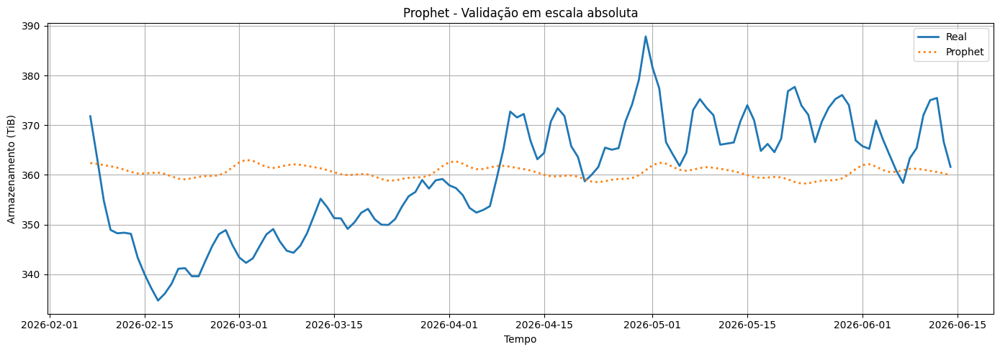

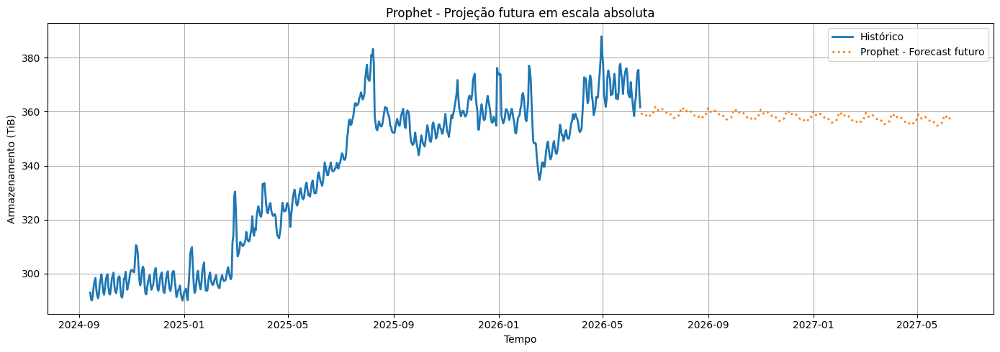

In [69]:
# ============================================================
# 🔥 BASELINE ESTATÍSTICO — PROPHET
#    Corrigido: time/value, MB → TiB, treino só no train, sem offset
# ============================================================

import json
import warnings
import subprocess
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_squared_error

warnings.filterwarnings("ignore")

try:
    from prophet import Prophet
except ImportError:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "prophet"])
    from prophet import Prophet

# ============================================================
# CONFIGURAÇÕES
# ============================================================
MB_TO_TIB = 1024 * 1024

is_hourly = ("time_unit" in globals() and time_unit == "hour")
freq_alias = "h" if is_hourly else "D"
FORECAST_STEPS = 8640 if is_hourly else 360

TIME_COL = "time"
VALUE_COL = "value"

# ============================================================
# SÉRIE ABSOLUTA ORIGINAL
# Prophet usa série absoluta, não diferenciada
# ============================================================
prophet_df = df[[TIME_COL, VALUE_COL]].copy()
prophet_df.columns = ["ds", "y"]

prophet_df["ds"] = pd.to_datetime(prophet_df["ds"])
prophet_df["y"] = prophet_df["y"].astype(float) / MB_TO_TIB  # MB → TiB

prophet_df = (
    prophet_df
    .dropna()
    .sort_values("ds")
    .reset_index(drop=True)
)

print("Prophet dataframe:")
print(prophet_df.head())
print(prophet_df.tail())
print("Y TiB min/max:", prophet_df["y"].min(), prophet_df["y"].max())

# ============================================================
# SPLIT CRONOLÓGICO
# ============================================================
split_prophet = int(len(prophet_df) * 0.8)

train_prophet = prophet_df.iloc[:split_prophet][["ds", "y"]].copy()
test_prophet  = prophet_df.iloc[split_prophet:][["ds", "y"]].copy()

print("\nTrain Prophet:", train_prophet.shape)
print("Test Prophet :", test_prophet.shape)
print("Train y TiB:", train_prophet["y"].min(), train_prophet["y"].max())
print("Test  y TiB:", test_prophet["y"].min(), test_prophet["y"].max())

# ============================================================
# TREINO DO MODELO
# ============================================================
model_prophet = Prophet(
    growth="linear",
    daily_seasonality=is_hourly,
    weekly_seasonality=True if is_hourly else False,
    yearly_seasonality=False,
    changepoint_prior_scale=0.05,
    seasonality_prior_scale=1.0,
    changepoint_range=0.9
)

if not is_hourly:
    model_prophet.add_seasonality(
        name="monthly",
        period=30.5,
        fourier_order=5
    )

model_prophet.fit(train_prophet)

# ============================================================
# VALIDAÇÃO / TESTE
# Usa exatamente as datas reais do teste
# ============================================================
forecast_test = model_prophet.predict(test_prophet[["ds"]])

y_test_abs_prophet_tib = test_prophet["y"].to_numpy(float)
y_pred_abs_prophet_tib = forecast_test["yhat"].to_numpy(float)

mse_prophet = mean_squared_error(y_test_abs_prophet_tib, y_pred_abs_prophet_tib)
rmse_prophet = np.sqrt(mse_prophet)
r2_prophet = r2_score(y_test_abs_prophet_tib, y_pred_abs_prophet_tib)

print("\n===== PROPHET - TESTE ABSOLUTO =====")
print(f"MSE  (TiB²): {mse_prophet:.6f}")
print(f"RMSE (TiB) : {rmse_prophet:.6f}")
print(f"R²         : {r2_prophet:.6f}")

# ============================================================
# PREVISÃO FUTURA
# Começa após a última data real
# ============================================================
future_dates = pd.date_range(
    start=prophet_df["ds"].iloc[-1],
    periods=FORECAST_STEPS + 1,
    freq=freq_alias
)[1:]

future_prophet = pd.DataFrame({"ds": future_dates})
forecast_future_prophet = model_prophet.predict(future_prophet)

forecast_prophet_tib = forecast_future_prophet["yhat"].to_numpy(float)

print("\n===== PROPHET - FORECAST FUTURO =====")
print(f"Primeiro valor previsto (TiB): {forecast_prophet_tib[0]:.3f}")
print(f"Último valor previsto   (TiB): {forecast_prophet_tib[-1]:.3f}")

# ============================================================
# PLOT TESTE
# ============================================================
plt.figure(figsize=(14, 5))
plt.plot(
    test_prophet["ds"],
    y_test_abs_prophet_tib,
    label="Real",
    linewidth=2
)
plt.plot(
    test_prophet["ds"],
    y_pred_abs_prophet_tib,
    label="Prophet",
    linestyle=":",
    linewidth=2
)
plt.title("Prophet - Validação em escala absoluta")
plt.xlabel("Tempo")
plt.ylabel("Armazenamento (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# ============================================================
# PLOT FUTURO
# ============================================================
plt.figure(figsize=(14, 5))
plt.plot(
    prophet_df["ds"],
    prophet_df["y"],
    label="Histórico",
    linewidth=2
)
plt.plot(
    future_dates,
    forecast_prophet_tib,
    label="Prophet - Forecast futuro",
    linestyle=":",
    linewidth=2
)
plt.title("Prophet - Projeção futura em escala absoluta")
plt.xlabel("Tempo")
plt.ylabel("Armazenamento (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# ============================================================
# SALVAR RESULTADOS
# ============================================================
prophet_metrics = {
    "model": "Prophet",
    "scale": "TiB",
    "input_unit": "MB",
    "mse_tib2": float(mse_prophet),
    "rmse_tib": float(rmse_prophet),
    "r2": float(r2_prophet),
    "forecast_steps": int(FORECAST_STEPS),
    "first_forecast_tib": float(forecast_prophet_tib[0]),
    "final_forecast_tib": float(forecast_prophet_tib[-1])
}

with open("prophet_metrics.json", "w") as f:
    json.dump(prophet_metrics, f, indent=4)

pd.DataFrame({
    "ds": test_prophet["ds"].values,
    "real_tib": y_test_abs_prophet_tib,
    "prophet_tib": y_pred_abs_prophet_tib
}).to_csv("prophet_validation.csv", index=False)

pd.DataFrame({
    "ds": future_dates,
    "forecast_prophet_tib": forecast_prophet_tib
}).to_csv("prophet_future_forecast.csv", index=False)

In [70]:
display(df.head())

,object type,object,indicator,value,time
0,Storage Pool,StoragePool001,Used capacity(MB),3.072367e+08,2024-09-14
1,Storage Pool,StoragePool001,Used capacity(MB),3.045763e+08,2024-09-15
2,Storage Pool,StoragePool001,Used capacity(MB),3.041931e+08,2024-09-16
3,Storage Pool,StoragePool001,Used capacity(MB),3.063394e+08,2024-09-17
4,Storage Pool,StoragePool001,Used capacity(MB),3.096994e+08,2024-09-18


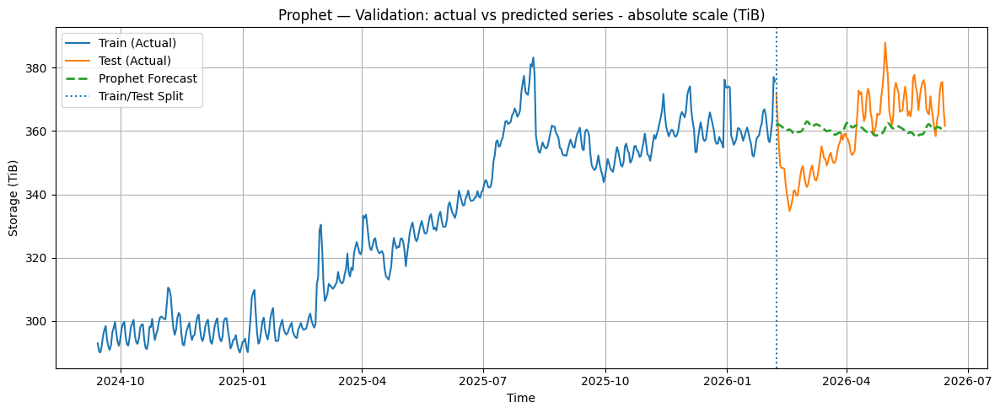

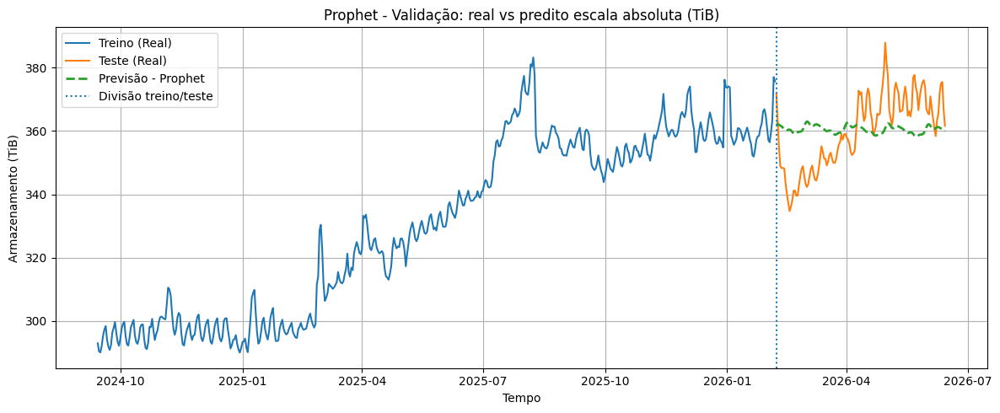

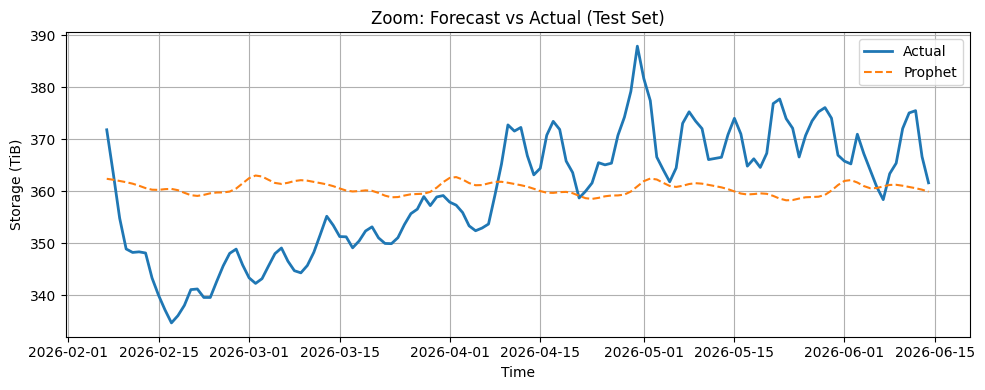

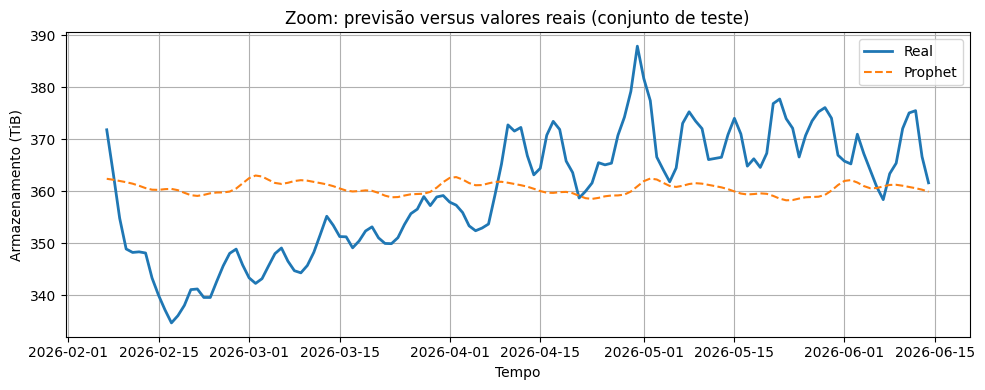


📊 Prophet - Forecast (TiB):
Step 001: 359.458 TiB
Step 002: 359.152 TiB
Step 003: 359.116 TiB
Step 004: 359.257 TiB
Step 005: 359.307 TiB
Step 006: 359.055 TiB
Step 007: 358.555 TiB
Step 008: 358.097 TiB
Step 009: 357.959 TiB
Step 010: 358.159 TiB
Step 011: 358.459 TiB
Step 012: 358.612 TiB
Step 013: 358.628 TiB
Step 014: 358.789 TiB
Step 015: 359.378 TiB
Step 016: 360.368 TiB
Step 017: 361.364 TiB
Step 018: 361.872 TiB
Step 019: 361.687 TiB
Step 020: 361.048 TiB
...

🔮 Final forecast value (360 days ahead): 357.761 TiB


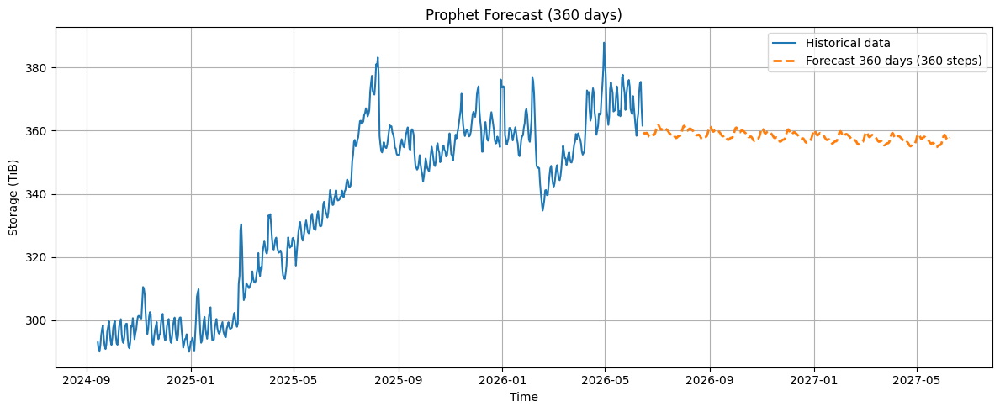

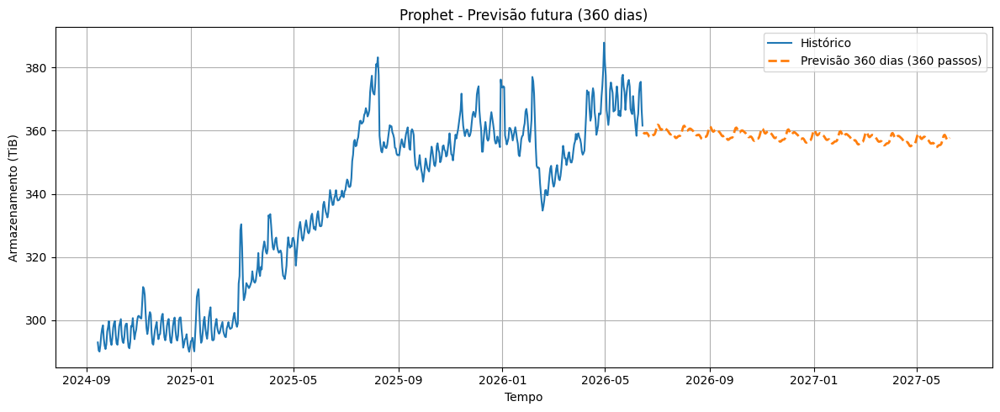


✅ Saved files:
- prophet_future_forecast.csv
- prophet_forecast_futuro.csv
- prophet_train_test_forecast_en.png
- prophet_treino_teste_previsao_pt.png
- prophet_test_zoom_en.png
- prophet_zoom_teste_pt.png
- prophet_future_forecast_en.png
- prophet_forecast_futuro_pt.png


In [71]:
# ============================================================
# ✅ PLOTS E FORECAST — PROPHET
#    Escala única: TiB
#    Sem divisão extra por 1024
#    Sem offset manual
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Compatibilidade com nomes antigos
y_test_abs_prophet_tb = y_test_abs_prophet_tib
y_pred_abs_prophet_tb = y_pred_abs_prophet_tib

FORECAST_DAYS = 360
is_hourly = ("time_unit" in globals() and time_unit == "hour")
freq_alias = "h" if is_hourly else "D"
FORECAST_STEPS = 8640 if is_hourly else FORECAST_DAYS

# ============================================================
# ✅ PLOT 1 — TRAIN / TEST / FORECAST
# ============================================================

plt.figure(figsize=(12, 5))
plt.plot(train_prophet["ds"], train_prophet["y"], label="Train (Actual)")
plt.plot(test_prophet["ds"], y_test_abs_prophet_tb, label="Test (Actual)")
plt.plot(test_prophet["ds"], y_pred_abs_prophet_tb, linestyle="--", linewidth=2, label="Prophet Forecast")
plt.axvline(test_prophet["ds"].iloc[0], linestyle=":", label="Train/Test Split")
plt.title("Prophet — Validation: actual vs predicted series - absolute scale (TiB)")
plt.xlabel("Time")
plt.ylabel("Storage (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("prophet_train_test_forecast_en.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(12, 5))
plt.plot(train_prophet["ds"], train_prophet["y"], label="Treino (Real)")
plt.plot(test_prophet["ds"], y_test_abs_prophet_tb, label="Teste (Real)")
plt.plot(test_prophet["ds"], y_pred_abs_prophet_tb, linestyle="--", linewidth=2, label="Previsão - Prophet")
plt.axvline(test_prophet["ds"].iloc[0], linestyle=":", label="Divisão treino/teste")
plt.title("Prophet - Validação: real vs predito escala absoluta (TiB)")
plt.xlabel("Tempo")
plt.ylabel("Armazenamento (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("prophet_treino_teste_previsao_pt.png", dpi=300, bbox_inches="tight")
plt.show()

# ============================================================
# ✅ PLOT 2 — ZOOM NO TESTE
# ============================================================

plt.figure(figsize=(10, 4))
plt.plot(test_prophet["ds"], y_test_abs_prophet_tb, label="Actual", linewidth=2)
plt.plot(test_prophet["ds"], y_pred_abs_prophet_tb, linestyle="--", label="Prophet")
plt.title("Zoom: Forecast vs Actual (Test Set)")
plt.xlabel("Time")
plt.ylabel("Storage (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("prophet_test_zoom_en.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(10, 4))
plt.plot(test_prophet["ds"], y_test_abs_prophet_tb, label="Real", linewidth=2)
plt.plot(test_prophet["ds"], y_pred_abs_prophet_tb, linestyle="--", label="Prophet")
plt.title("Zoom: previsão versus valores reais (conjunto de teste)")
plt.xlabel("Tempo")
plt.ylabel("Armazenamento (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("prophet_zoom_teste_pt.png", dpi=300, bbox_inches="tight")
plt.show()

# ============================================================
# ✅ PREVISÃO FUTURA
# ============================================================

future_only = pd.DataFrame({
    "ds": pd.date_range(
        start=prophet_df["ds"].iloc[-1],
        periods=FORECAST_STEPS + 1,
        freq=freq_alias
    )[1:]
})

forecast_future = model_prophet.predict(future_only)

# Prophet já está em TiB
forecast_tb_prophet = forecast_future["yhat"].to_numpy(dtype=np.float64)
forecast_tib_prophet = forecast_tb_prophet

print("\n📊 Prophet - Forecast (TiB):")
for i, val in enumerate(forecast_tb_prophet[:20], start=1):
    print(f"Step {i:03d}: {val:.3f} TiB")

print("...")
print(f"\n🔮 Final forecast value ({FORECAST_DAYS} days ahead): {forecast_tb_prophet[-1]:.3f} TiB")

df_forecast_prophet = pd.DataFrame({
    "step": np.arange(1, FORECAST_STEPS + 1),
    "ds": future_only["ds"].astype(str).values,
    "forecast_tib": forecast_tb_prophet
})

df_forecast_prophet.to_csv("prophet_future_forecast.csv", index=False)
df_forecast_prophet.to_csv("prophet_forecast_futuro.csv", index=False)

# ============================================================
# ✅ PLOT 3 — HISTÓRICO + PREVISÃO FUTURA
# ============================================================

historical_tib = prophet_df["y"].to_numpy(dtype=np.float64)

plt.figure(figsize=(12, 5))
plt.plot(prophet_df["ds"], historical_tib, label="Historical data")
plt.plot(
    future_only["ds"],
    forecast_tb_prophet,
    linestyle="--",
    linewidth=2,
    label=f"Forecast {FORECAST_DAYS} days ({FORECAST_STEPS} steps)"
)
plt.title(f"Prophet Forecast ({FORECAST_DAYS} days)")
plt.xlabel("Time")
plt.ylabel("Storage (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("prophet_future_forecast_en.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(12, 5))
plt.plot(prophet_df["ds"], historical_tib, label="Histórico")
plt.plot(
    future_only["ds"],
    forecast_tb_prophet,
    linestyle="--",
    linewidth=2,
    label=f"Previsão {FORECAST_DAYS} dias ({FORECAST_STEPS} passos)"
)
plt.title(f"Prophet - Previsão futura ({FORECAST_DAYS} dias)")
plt.xlabel("Tempo")
plt.ylabel("Armazenamento (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("prophet_forecast_futuro_pt.png", dpi=300, bbox_inches="tight")
plt.show()

print("\n✅ Saved files:")
print("- prophet_future_forecast.csv")
print("- prophet_forecast_futuro.csv")
print("- prophet_train_test_forecast_en.png")
print("- prophet_treino_teste_previsao_pt.png")
print("- prophet_test_zoom_en.png")
print("- prophet_zoom_teste_pt.png")
print("- prophet_future_forecast_en.png")
print("- prophet_forecast_futuro_pt.png")

In [72]:
if SAVE == 1:

    # ============================================================
    # 💾 SAVE EVERYTHING - PROPHET
    # ============================================================

    import os
    import json
    import shutil
    import joblib
    import numpy as np
    import pandas as pd
    from prophet.serialize import model_to_json

    MODEL_NAME = "prophet"

    os.makedirs(BASE_PATH, exist_ok=True)

    # ============================================================
    # COMPATIBILITY / UNIT ALIASES
    # Série original em GB → TiB
    # ============================================================
    TO_TIB = 1024

    if "forecast_tb_prophet" not in globals():
        forecast_tb_prophet = forecast_abs_prophet / TO_TIB

    if "forecast_tib_prophet" not in globals():
        forecast_tib_prophet = forecast_tb_prophet

    if "y_test_abs_prophet_tb" not in globals():
        y_test_abs_prophet_tb = y_test_abs_prophet / TO_TIB

    if "y_pred_abs_prophet_tb" not in globals():
        y_pred_abs_prophet_tb = y_pred_abs_prophet / TO_TIB

    if "TARGET_COLUMN" not in globals():
        TARGET_COLUMN = "y"

    # ============================================================
    # 1) SAVE MODEL
    # ============================================================
    with open(f"{BASE_PATH}/{MODEL_NAME}_model.json", "w", encoding="utf-8") as f:
        f.write(model_to_json(model_prophet))

    # ============================================================
    # 2) SAVE SCALER
    # ============================================================
    if "scaler" in globals():
        try:
            joblib.dump(scaler, f"{BASE_PATH}/{MODEL_NAME}_scaler.save")
        except Exception as e:
            print(f"⚠️ Scaler not saved: {e}")

    # ============================================================
    # 3) SAVE CONFIG
    # ============================================================
    config_prophet = {
        "model_type": "Prophet",
        "is_hourly": bool(is_hourly),
        "daily_seasonality": bool(is_hourly),
        "weekly_seasonality": False,
        "yearly_seasonality": False,
        "changepoint_prior_scale": 0.05,
        "seasonality_prior_scale": 10.0,
        "monthly_seasonality_added": bool(is_hourly),
        "monthly_period": 30.5 if is_hourly else None,
        "monthly_fourier_order": 8 if is_hourly else None,
        "forecast_steps": int(FORECAST_STEPS),
        "forecast_days": int(FORECAST_DAYS),
        "time_unit": str(time_unit) if "time_unit" in globals() else ("hour" if is_hourly else "day"),
        "split_prophet": int(split_prophet),
        "freq_alias": "H" if is_hourly else "D",
        "target_column": str(TARGET_COLUMN),
        "unit_original": "GB",
        "unit_converted": "TiB",
        "conversion_factor": TO_TIB
    }

    with open(f"{BASE_PATH}/{MODEL_NAME}_config.json", "w", encoding="utf-8") as f:
        json.dump(config_prophet, f, ensure_ascii=False, indent=4)

    # ============================================================
    # 4) SAVE METRICS
    # ============================================================
    metrics_prophet = {
        "mse_abs_gb": float(mse_abs_prophet),
        "rmse_abs_gb": float(rmse_abs_prophet),
        "r2_abs_gb": float(r2_abs_prophet),

        "mse_abs_tib": float(mse_abs_prophet_tb),
        "rmse_abs_tib": float(rmse_abs_prophet_tb),
        "r2_abs_tib": float(r2_abs_prophet_tb),

        "forecast_last_tb": float(forecast_tb_prophet[-1]),
        "forecast_last_tib": float(forecast_tib_prophet[-1])
    }

    with open(f"{BASE_PATH}/{MODEL_NAME}_metrics.json", "w", encoding="utf-8") as f:
        json.dump(metrics_prophet, f, ensure_ascii=False, indent=4)

    # ============================================================
    # 5) SAVE DATAFRAMES AS CSV
    # ============================================================
    prophet_df.to_csv(f"{BASE_PATH}/prophet_full_dataframe.csv", index=False)
    train_prophet.to_csv(f"{BASE_PATH}/prophet_train_dataframe.csv", index=False)
    test_prophet.to_csv(f"{BASE_PATH}/prophet_test_dataframe.csv", index=False)
    future_only.to_csv(f"{BASE_PATH}/prophet_future_only.csv", index=False)
    forecast_test.to_csv(f"{BASE_PATH}/prophet_forecast_test_full.csv", index=False)
    forecast_future.to_csv(f"{BASE_PATH}/prophet_forecast_future_full.csv", index=False)

    # ============================================================
    # 6) SAVE MAIN ARRAYS
    # ============================================================
    np.save(f"{BASE_PATH}/y_test_abs_{MODEL_NAME}.npy", y_test_abs_prophet)
    np.save(f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}.npy", y_pred_abs_prophet)

    np.save(f"{BASE_PATH}/y_test_abs_{MODEL_NAME}_tb.npy", y_test_abs_prophet_tb)
    np.save(f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}_tb.npy", y_pred_abs_prophet_tb)

    # ============================================================
    # 7) SAVE FORECAST
    # ============================================================
    np.save(f"{BASE_PATH}/forecast_abs_{MODEL_NAME}.npy", forecast_abs_prophet)
    np.save(f"{BASE_PATH}/forecast_tb_{MODEL_NAME}.npy", forecast_tb_prophet)

    # ============================================================
    # 8) SAVE SERIES / REFERENCES
    # ============================================================
    np.save(f"{BASE_PATH}/series_original.npy", series)

    if "df" in globals() and "Time" in df.columns:
        try:
            pd.DataFrame({
                "Time": pd.to_datetime(df["Time"], errors="coerce")
            }).to_csv(f"{BASE_PATH}/series_time_reference.csv", index=False)
        except Exception as e:
            print(f"⚠️ Time reference not saved: {e}")

    # ============================================================
    # 9) SAVE RECONSTRUCTION / REFERENCE INFO
    # ============================================================
    reconstruction_info_prophet = {
        "split_prophet": int(split_prophet),
        "series_last_value": float(series[-1]),
        "series_last_value_tib": float(series[-1] / TO_TIB),
        "forecast_last_value_tib": float(forecast_tb_prophet[-1]),
        "last_timestamp": str(prophet_df["ds"].iloc[-1]),
        "future_start": str(future_only["ds"].iloc[0]),
        "future_end": str(future_only["ds"].iloc[-1])
    }

    with open(f"{BASE_PATH}/reconstruction_info_{MODEL_NAME}.json", "w", encoding="utf-8") as f:
        json.dump(reconstruction_info_prophet, f, ensure_ascii=False, indent=4)

    # ============================================================
    # 10) COPY EXISTING ARTIFACT FILES
    # ============================================================
    artifact_files = [
        "prophet_metrics_absolute.json",
        "prophet_metricas_absolutas.json",
        "prophet_validation_absolute.csv",
        "prophet_validacao_absoluta.csv",
        "prophet_future_forecast.csv",
        "prophet_forecast_futuro.csv",
        "prophet_train_test_forecast_en.png",
        "prophet_treino_teste_previsao_pt.png",
        "prophet_test_zoom_en.png",
        "prophet_zoom_teste_pt.png",
        "prophet_future_forecast_en.png",
        "prophet_forecast_futuro_pt.png",
    ]

    for fname in artifact_files:
        if os.path.exists(fname):
            dest = os.path.join(BASE_PATH, fname)
            if os.path.abspath(fname) != os.path.abspath(dest):
                shutil.copy2(fname, dest)

    # ============================================================
    # ✅ SUMMARY
    # ============================================================
    print(f"✅ All Prophet artifacts saved in:\n{BASE_PATH}")
    print(f"Final forecast: {forecast_tb_prophet[-1]:.3f} TiB")

In [73]:
if RELOAD == 1:
    # ============================================================
    # 🔄 RELOAD EVERYTHING - PROPHET
    # ============================================================

    import os
    import json
    import joblib
    import numpy as np
    import pandas as pd
    from prophet.serialize import model_from_json

    MODEL_NAME = "prophet"
    TO_TIB = 1024

    # ============================================================
    # FILE PATHS
    # ============================================================
    FILE_MODEL              = f"{BASE_PATH}/{MODEL_NAME}_model.json"
    FILE_SCALER             = f"{BASE_PATH}/{MODEL_NAME}_scaler.save"
    FILE_CONFIG             = f"{BASE_PATH}/{MODEL_NAME}_config.json"
    FILE_METRICS            = f"{BASE_PATH}/{MODEL_NAME}_metrics.json"

    FILE_FULL_DF            = f"{BASE_PATH}/prophet_full_dataframe.csv"
    FILE_TRAIN_DF           = f"{BASE_PATH}/prophet_train_dataframe.csv"
    FILE_TEST_DF            = f"{BASE_PATH}/prophet_test_dataframe.csv"
    FILE_FUTURE_ONLY        = f"{BASE_PATH}/prophet_future_only.csv"
    FILE_FORECAST_TEST_FULL = f"{BASE_PATH}/prophet_forecast_test_full.csv"
    FILE_FORECAST_FUTURE    = f"{BASE_PATH}/prophet_forecast_future_full.csv"

    FILE_Y_TEST_ABS         = f"{BASE_PATH}/y_test_abs_{MODEL_NAME}.npy"
    FILE_Y_PRED_ABS         = f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}.npy"
    FILE_Y_TEST_ABS_TB      = f"{BASE_PATH}/y_test_abs_{MODEL_NAME}_tb.npy"
    FILE_Y_PRED_ABS_TB      = f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}_tb.npy"

    FILE_FORECAST_ABS       = f"{BASE_PATH}/forecast_abs_{MODEL_NAME}.npy"
    FILE_FORECAST_TB        = f"{BASE_PATH}/forecast_tb_{MODEL_NAME}.npy"

    FILE_SERIES             = f"{BASE_PATH}/series_original.npy"
    FILE_RECON_INFO         = f"{BASE_PATH}/reconstruction_info_{MODEL_NAME}.json"

    # ============================================================
    # LOAD MODEL
    # ============================================================
    with open(FILE_MODEL, "r", encoding="utf-8") as f:
        model_prophet_reloaded = model_from_json(f.read())

    # ============================================================
    # LOAD OPTIONAL SCALER
    # ============================================================
    scaler_prophet = None
    if os.path.exists(FILE_SCALER):
        scaler_prophet = joblib.load(FILE_SCALER)

    # ============================================================
    # LOAD CONFIG / METRICS
    # ============================================================
    with open(FILE_CONFIG, "r", encoding="utf-8") as f:
        config_prophet = json.load(f)

    with open(FILE_METRICS, "r", encoding="utf-8") as f:
        metrics_prophet = json.load(f)

    FORECAST_STEPS = int(config_prophet["forecast_steps"])
    FORECAST_DAYS  = int(config_prophet["forecast_days"])
    time_unit      = config_prophet["time_unit"]
    split_prophet  = int(config_prophet["split_prophet"])
    freq_alias     = config_prophet["freq_alias"]
    is_hourly      = bool(config_prophet["is_hourly"])
    TARGET_COL_REF = config_prophet.get("target_column", "y")

    # ============================================================
    # LOAD TABLES
    # ============================================================
    prophet_df = pd.read_csv(FILE_FULL_DF)
    train_prophet = pd.read_csv(FILE_TRAIN_DF)
    test_prophet = pd.read_csv(FILE_TEST_DF)
    future_only = pd.read_csv(FILE_FUTURE_ONLY)
    forecast_test = pd.read_csv(FILE_FORECAST_TEST_FULL)
    forecast_future = pd.read_csv(FILE_FORECAST_FUTURE)

    for _df in [
        prophet_df,
        train_prophet,
        test_prophet,
        future_only,
        forecast_test,
        forecast_future,
    ]:
        if "ds" in _df.columns:
            _df["ds"] = pd.to_datetime(_df["ds"], errors="coerce")

    # ============================================================
    # LOAD ARRAYS
    # ============================================================
    y_test_abs_prophet = np.load(FILE_Y_TEST_ABS)
    y_pred_abs_prophet = np.load(FILE_Y_PRED_ABS)

    y_test_abs_prophet_tb = np.load(FILE_Y_TEST_ABS_TB)
    y_pred_abs_prophet_tb = np.load(FILE_Y_PRED_ABS_TB)

    forecast_abs_prophet = np.load(FILE_FORECAST_ABS)
    forecast_tb_prophet = np.load(FILE_FORECAST_TB)

    # aliases TiB
    y_test_abs_prophet_tib = y_test_abs_prophet_tb
    y_pred_abs_prophet_tib = y_pred_abs_prophet_tb
    forecast_tib_prophet = forecast_tb_prophet

    series = np.load(FILE_SERIES)

    reconstruction_info_prophet = {}
    if os.path.exists(FILE_RECON_INFO):
        with open(FILE_RECON_INFO, "r", encoding="utf-8") as f:
            reconstruction_info_prophet = json.load(f)

    # ============================================================
    # OPTIONAL RECOMPUTE
    # ============================================================
    future_test_recomputed = test_prophet[["ds"]].copy()
    forecast_test_recomputed = model_prophet_reloaded.predict(future_test_recomputed)

    y_pred_abs_prophet_recomputed = forecast_test_recomputed["yhat"].to_numpy(dtype=np.float64)
    y_pred_abs_prophet_recomputed_tb = y_pred_abs_prophet_recomputed / TO_TIB

    forecast_future_recomputed = model_prophet_reloaded.predict(future_only[["ds"]].copy())

    # Reaplica o alinhamento salvo no pipeline original, se necessário
    forecast_abs_prophet_recomputed = forecast_future_recomputed["yhat"].to_numpy(dtype=np.float64)

    if len(forecast_abs_prophet_recomputed) > 0:
        offset = series[-1] - forecast_abs_prophet_recomputed[0]
        forecast_abs_prophet_recomputed = forecast_abs_prophet_recomputed + offset

    forecast_tb_prophet_recomputed = forecast_abs_prophet_recomputed / TO_TIB
    forecast_tib_prophet_recomputed = forecast_tb_prophet_recomputed

    # ============================================================
    # SAFE METRIC GETTER
    # ============================================================
    def get_metric(metrics, *keys, default=np.nan):
        for key in keys:
            if key in metrics:
                return metrics[key]
        return default

    mse_abs_print = get_metric(metrics_prophet, "mse_abs", "mse_abs_gb")
    rmse_abs_print = get_metric(metrics_prophet, "rmse_abs", "rmse_abs_gb")
    r2_abs_print = get_metric(metrics_prophet, "r2_abs", "r2_abs_gb")

    mse_abs_tib_print = get_metric(metrics_prophet, "mse_abs_tib")
    rmse_abs_tib_print = get_metric(metrics_prophet, "rmse_abs_tib")
    r2_abs_tib_print = get_metric(metrics_prophet, "r2_abs_tib")

    forecast_last_print = get_metric(
        metrics_prophet,
        "forecast_last_tb",
        "forecast_last_tib",
        default=float(forecast_tb_prophet[-1])
    )

    # ============================================================
    # SUMMARY
    # ============================================================
    print("\n✅ RELOAD EVERYTHING - PROPHET COMPLETED")
    print(f"Base path              : {BASE_PATH}")
    print(f"Model                  : {MODEL_NAME}")
    print(f"Forecast steps         : {FORECAST_STEPS}")
    print(f"Forecast days          : {FORECAST_DAYS}")
    print(f"Time unit              : {time_unit}")
    print(f"Split prophet          : {split_prophet}")
    print(f"Frequency alias        : {freq_alias}")
    print(f"Is hourly              : {is_hourly}")
    print(f"Target column          : {TARGET_COL_REF}")

    print("\n📊 Metrics")
    print(f"MSE abs GB             : {mse_abs_print:.6e}")
    print(f"RMSE abs GB            : {rmse_abs_print:.6e}")
    print(f"R² abs GB              : {r2_abs_print:.6f}")
    print(f"MSE abs TiB            : {mse_abs_tib_print:.6e}")
    print(f"RMSE abs TiB           : {rmse_abs_tib_print:.6e}")
    print(f"R² abs TiB             : {r2_abs_tib_print:.6f}")
    print(f"Final forecast TiB     : {forecast_last_print:.3f}")

    print("\n📐 Shapes")
    print(f"prophet_df             : {prophet_df.shape}")
    print(f"train_prophet          : {train_prophet.shape}")
    print(f"test_prophet           : {test_prophet.shape}")
    print(f"y_test_abs_prophet     : {y_test_abs_prophet.shape}")
    print(f"y_pred_abs_prophet     : {y_pred_abs_prophet.shape}")
    print(f"forecast_tb_prophet    : {forecast_tb_prophet.shape}")

    # ============================================================
    # PACKAGE EVERYTHING
    # ============================================================
    artifacts_prophet = {
        "model_prophet_reloaded": model_prophet_reloaded,
        "scaler_prophet": scaler_prophet,
        "config_prophet": config_prophet,
        "metrics_prophet": metrics_prophet,
        "reconstruction_info_prophet": reconstruction_info_prophet,

        "prophet_df": prophet_df,
        "train_prophet": train_prophet,
        "test_prophet": test_prophet,
        "future_only": future_only,
        "forecast_test": forecast_test,
        "forecast_future": forecast_future,

        "y_test_abs_prophet": y_test_abs_prophet,
        "y_pred_abs_prophet": y_pred_abs_prophet,
        "y_test_abs_prophet_tb": y_test_abs_prophet_tb,
        "y_pred_abs_prophet_tb": y_pred_abs_prophet_tb,
        "y_test_abs_prophet_tib": y_test_abs_prophet_tib,
        "y_pred_abs_prophet_tib": y_pred_abs_prophet_tib,

        "forecast_abs_prophet": forecast_abs_prophet,
        "forecast_tb_prophet": forecast_tb_prophet,
        "forecast_tib_prophet": forecast_tib_prophet,

        "series": series,

        "forecast_test_recomputed": forecast_test_recomputed,
        "y_pred_abs_prophet_recomputed": y_pred_abs_prophet_recomputed,
        "y_pred_abs_prophet_recomputed_tb": y_pred_abs_prophet_recomputed_tb,

        "forecast_future_recomputed": forecast_future_recomputed,
        "forecast_abs_prophet_recomputed": forecast_abs_prophet_recomputed,
        "forecast_tb_prophet_recomputed": forecast_tb_prophet_recomputed,
        "forecast_tib_prophet_recomputed": forecast_tib_prophet_recomputed,
    }

    print("\n✅ artifacts_prophet dictionary created.")


✅ RELOAD EVERYTHING - PROPHET COMPLETED
Base path              : /content/drive/MyDrive/Colab Notebooks/MESTRADO/1-TESE/360/12-jun-2026
Model                  : prophet
Forecast steps         : 360
Forecast days          : 360
Time unit              : day
Split prophet          : 511
Frequency alias        : D
Is hourly              : False
Target column          : value

📊 Metrics
MSE abs GB             : 2.112060e+08
RMSE abs GB            : 1.453293e+04
R² abs GB              : -0.402378
MSE abs TiB            : 2.014218e+02
RMSE abs TiB           : 1.419231e+01
R² abs TiB             : -0.402378
Final forecast TiB     : 402.463

📐 Shapes
prophet_df             : (639, 2)
train_prophet          : (511, 2)
test_prophet           : (128, 2)
y_test_abs_prophet     : (128,)
y_pred_abs_prophet     : (128,)
forecast_tb_prophet    : (360,)

✅ artifacts_prophet dictionary created.


In [74]:
'''
model_prophet_reloaded.params['k']   # growth rate
model_prophet_reloaded.params['m']   # offset
model_prophet_reloaded.params['delta']
model_prophet_reloaded.params['beta']
'''

"\nmodel_prophet_reloaded.params['k']   # growth rate\nmodel_prophet_reloaded.params['m']   # offset\nmodel_prophet_reloaded.params['delta']\nmodel_prophet_reloaded.params['beta']\n"

In [75]:

model_prophet.params['k']   # growth rate
model_prophet.params['m']   # offset
model_prophet.params['delta']
model_prophet.params['beta']

array([[-3.7834699e-03, -6.4986886e-06,  9.5072664e-04,  4.4426607e-04,
        -1.0778592e-03, -4.6506873e-04,  3.1270765e-04, -6.9325259e-04,
        -3.4553529e-04,  6.8650837e-04]])

# MOE

Especialistas usados no MoE: ['MLP', 'LSTM', 'GRU', 'PINN', 'TFKAN', 'ETS', 'ARIMA', 'PROPHET']
Matriz de validação: (104, 8)
Alvo real: (104,)

=== DEBUG UNIDADE — VALIDAÇÃO ===
y_val_moe_tb min/max: 351.4510166587832 397.17836267709765
MLP      min/max: 350.089014242172 374.0965623359678
LSTM     min/max: 290.53927893447855 368.098597476959
GRU      min/max: 352.61785096931436 382.8302049140928
PINN     min/max: 337.0545529823301 363.542014072418
TFKAN    min/max: 351.0664472084043 379.39614767837503
ETS      min/max: 351.7877027166584 369.3324064193669
ARIMA    min/max: 345.698620556981 367.1103937810972
PROPHET  min/max: 373.2078217210898 382.435151903556
Epoch 1/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 246ms/step - loss: 180.4336 - mae: 9.6860 - val_loss: 789.5597 - val_mae: 27.7550 - learning_rate: 0.0010
Epoch 2/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 174.1453 - mae: 9.5605 - val_loss: 748.5179 - val_mae: 27.0014 - learning_rate: 0.0010
Epoch 3/200
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 


📊 Mixture of Experts — Validação/Teste em TiB
MSE  : 21.896086 TiB²
RMSE : 4.679325 TiB
MAE  : 3.533965 TiB
R²   : 0.779334

📊 Ensembles simples para referência
Média   -> RMSE=16.171289 TiB | R²=-1.635469
Mediana -> RMSE=13.301162 TiB | R²=-0.782985


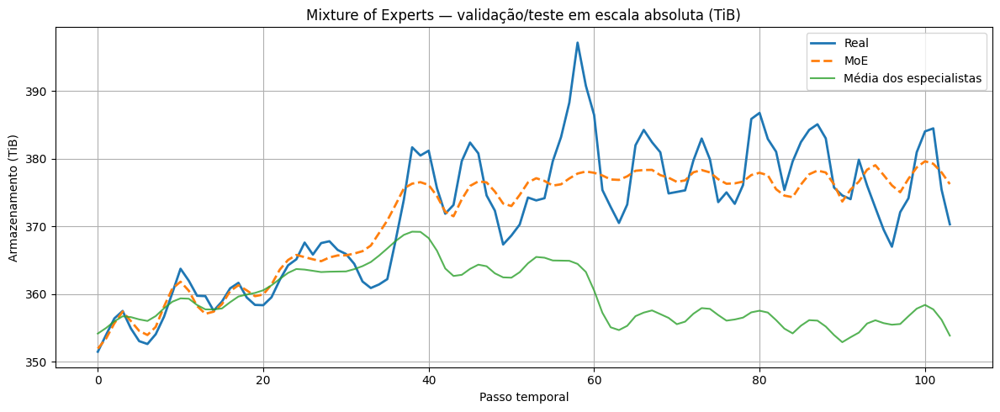

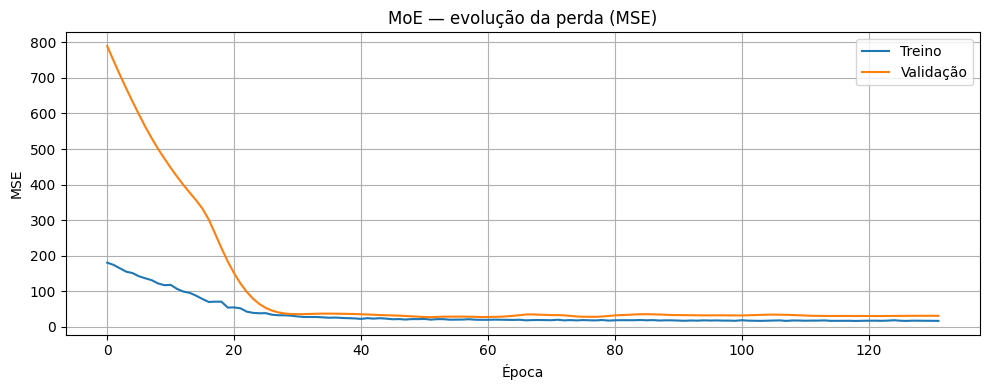

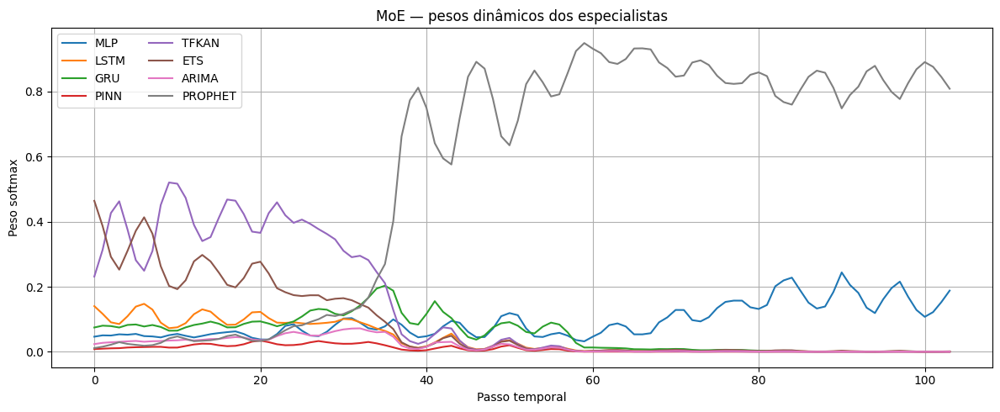

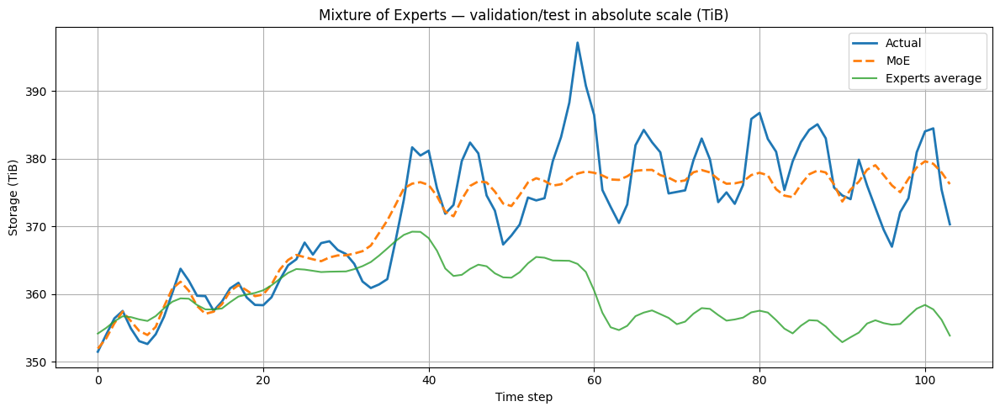

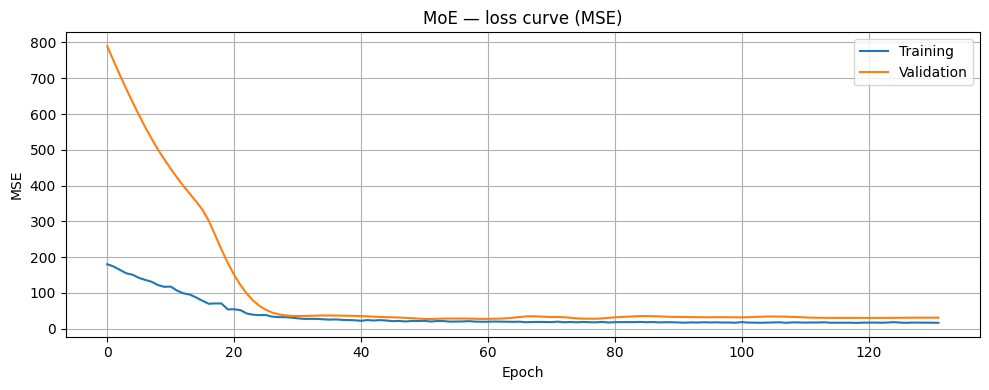

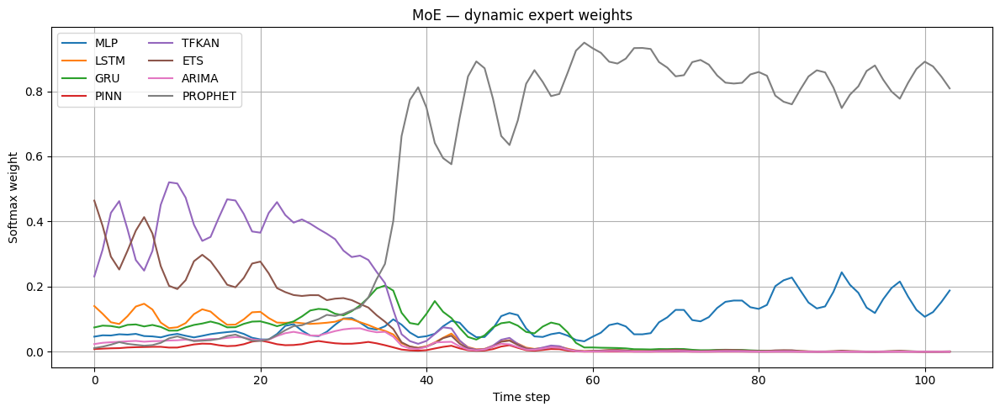

In [76]:
# ============================================================
# 🔥 MIXTURE OF EXPERTS (MoE) — GATING NETWORK EM TiB
#    MLP, LSTM, GRU, PINN, TFKAN, ETS, ARIMA e PROPHET
# ============================================================

import os
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from tensorflow.keras import layers, regularizers, Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.optimizers import Adam

# ------------------------------------------------------------
# Configuração
# ------------------------------------------------------------
SEED_MOE = 42
np.random.seed(SEED_MOE)
tf.random.set_seed(SEED_MOE)

GB_TO_TIB = 1024
BYTES_TO_TB = 1e12


# ------------------------------------------------------------
# Funções auxiliares
# ------------------------------------------------------------
def _to_1d_float(x):
    return np.asarray(x, dtype=np.float64).ravel()


def _as_tb_from_candidates(*names):
    """
    Retorna vetor em TiB.

    Corrige automaticamente:
    - GB -> TiB: divide por 1024
    - bytes -> TB aproximado: divide por 1e12
    - valores errados tipo 3e-7 vindos de GB / 1e12: multiplica por 1e12 / 1024
    - valores já em TiB: retorna sem alterar
    """
    for name in names:
        if name in globals() and globals()[name] is not None:
            arr = _to_1d_float(globals()[name])

            if arr.size == 0:
                continue

            median_val = np.nanmedian(np.abs(arr))

            # Caso errado: valores em torno de 1e-7 vieram de GB / 1e12
            if median_val < 1e-3:
                return arr * BYTES_TO_TB / GB_TO_TIB

            # Bytes
            if median_val > 1e9:
                return arr / BYTES_TO_TB

            # GB
            if median_val > 1e4:
                return arr / GB_TO_TIB

            # Já está em TB/TiB
            return arr

    return None


def _align_matrix(pred_dict, y_true=None):
    clean = {
        k: _to_1d_float(v)
        for k, v in pred_dict.items()
        if v is not None and len(v) > 0
    }

    if len(clean) == 0:
        raise ValueError("Nenhum especialista válido encontrado.")

    if y_true is not None:
        y_true = _to_1d_float(y_true)
        n = min([len(y_true)] + [len(v) for v in clean.values()])
        y_true = y_true[:n]
    else:
        n = min(len(v) for v in clean.values())
        y_true = None

    clean = {k: v[:n] for k, v in clean.items()}
    names = list(clean.keys())
    matrix = np.column_stack([clean[k] for k in names])

    return names, matrix, y_true


def _make_gate_features(expert_matrix):
    X = np.asarray(expert_matrix, dtype=np.float64)
    n = X.shape[0]

    step = np.linspace(0.0, 1.0, n).reshape(-1, 1)

    stats = np.column_stack([
        X.mean(axis=1),
        X.std(axis=1),
        X.min(axis=1),
        X.max(axis=1),
    ])

    return np.column_stack([X, stats, step])


def _standardize_train_apply(X_train, X_apply):
    mu = X_train.mean(axis=0, keepdims=True)
    sd = X_train.std(axis=0, keepdims=True) + 1e-8

    return (X_train - mu) / sd, (X_apply - mu) / sd, mu, sd


# ------------------------------------------------------------
# 1) Coleta das previsões de validação/teste em TiB
# ------------------------------------------------------------
validation_candidates = {
    "MLP": _as_tb_from_candidates(
        "y_pred_abs_mlp_tb",
        "y_pred_abs_mlp_tib",
        "y_pred_abs_mlp",
        "y_pred_mlp_tb"
    ),

    "LSTM": _as_tb_from_candidates(
        "y_pred_abs_lstm_tb",
        "y_pred_abs_lstm_tib",
        "y_pred_abs_lstm",
        "y_pred_lstm_tb"
    ),

    "GRU": _as_tb_from_candidates(
        "y_pred_abs_gru_tb",
        "y_pred_abs_gru_tib",
        "y_pred_abs_gru",
        "y_pred_gru_tb"
    ),

    "PINN": _as_tb_from_candidates(
        "y_pred_abs_pinn_tb",
        "y_pred_abs_pinn_tib",
        "y_pred_abs_pinn",
        "y_pred_pinn_tb",
        "y_pred_abs_pinn_tb",
        "y_pred_abs_pinn_tib",
        "y_pred_abs_pinn",
        "y_pred_pinn_tb"
    ),

    "TFKAN": _as_tb_from_candidates(
        "y_pred_abs_tfkan_tb",
        "y_pred_abs_tfkan_tib",
        "y_pred_abs_tfkan",
        "y_pred_tfkan_tb"
    ),

    "ETS": _as_tb_from_candidates(
        "y_pred_abs_exp_tb",
        "y_pred_abs_exp_tib",
        "y_pred_abs_exp",
        "y_pred_exp_tb",
        "y_pred_tb"
    ),

    "ARIMA": _as_tb_from_candidates(
        "y_pred_abs_arima_tb",
        "y_pred_abs_arima_tib",
        "y_pred_abs_arima",
        "y_pred_arima_tb"
    ),

    "PROPHET": _as_tb_from_candidates(
        "y_pred_abs_prophet_tb",
        "y_pred_abs_prophet_tib",
        "y_pred_abs_prophet",
        "yhat_prophet_tb"
    ),
}

actual_validation_tb = _as_tb_from_candidates(
    "y_test_abs_arima_tb",
    "y_test_abs_arima_tib",
    "y_test_abs_mlp_tb",
    "y_test_abs_mlp_tib",
    "y_test_abs_lstm_tb",
    "y_test_abs_lstm_tib",
    "y_test_abs_gru_tb",
    "y_test_abs_gru_tib",
    "y_test_abs_pinn_tb",
    "y_test_abs_pinn_tib",
    "y_test_abs_pinn_tb",
    "y_test_abs_pinn_tib",
    "y_test_abs_tfkan_tb",
    "y_test_abs_tfkan_tib",
    "y_test_abs_exp_tb",
    "y_test_abs_exp_tib",
    "y_test_abs_prophet_tb",
    "y_test_abs_prophet_tib",
    "y_test_tb",
    "y_test_tib"
)

validation_candidates = {
    k: v for k, v in validation_candidates.items()
    if v is not None
}

if actual_validation_tb is None:
    raise ValueError("Nenhum vetor real de validação em TB/TiB foi encontrado.")

if len(validation_candidates) < 2:
    raise ValueError("MoE requer pelo menos dois especialistas com previsões disponíveis.")

expert_names_moe, expert_val_matrix_tb, y_val_moe_tb = _align_matrix(
    validation_candidates,
    actual_validation_tb
)

print("Especialistas usados no MoE:", expert_names_moe)
print("Matriz de validação:", expert_val_matrix_tb.shape)
print("Alvo real:", y_val_moe_tb.shape)

print("\n=== DEBUG UNIDADE — VALIDAÇÃO ===")
print("y_val_moe_tb min/max:", np.nanmin(y_val_moe_tb), np.nanmax(y_val_moe_tb))
for i, name in enumerate(expert_names_moe):
    print(
        f"{name:8s} min/max:",
        np.nanmin(expert_val_matrix_tb[:, i]),
        np.nanmax(expert_val_matrix_tb[:, i])
    )


# ------------------------------------------------------------
# 2) Treino cronológico da rede gating
# ------------------------------------------------------------
X_gate = _make_gate_features(expert_val_matrix_tb)
y_gate = y_val_moe_tb.reshape(-1, 1)

n = len(y_gate)
train_gate_size = int(n * 0.75)

X_gate_train = X_gate[:train_gate_size]
X_gate_valid = X_gate[train_gate_size:]

y_gate_train = y_gate[:train_gate_size]
y_gate_valid = y_gate[train_gate_size:]

experts_train = expert_val_matrix_tb[:train_gate_size]
experts_valid = expert_val_matrix_tb[train_gate_size:]

X_gate_train_std, X_gate_valid_std, moe_feature_mu, moe_feature_sd = _standardize_train_apply(
    X_gate_train,
    X_gate_valid
)

n_experts_moe = expert_val_matrix_tb.shape[1]
n_features_moe = X_gate_train_std.shape[1]

features_in = layers.Input(shape=(n_features_moe,), name="gate_features")
experts_in = layers.Input(shape=(n_experts_moe,), name="expert_predictions_tb")

x = layers.Dense(
    32,
    activation="relu",
    kernel_regularizer=regularizers.l2(1e-5)
)(features_in)

x = layers.Dropout(0.10)(x)

x = layers.Dense(
    16,
    activation="relu",
    kernel_regularizer=regularizers.l2(1e-5)
)(x)

weights = layers.Dense(
    n_experts_moe,
    activation="softmax",
    name="moe_softmax_weights"
)(x)

moe_output = layers.Dot(
    axes=1,
    name="moe_weighted_prediction_tb"
)([weights, experts_in])

model_moe = Model(
    inputs=[features_in, experts_in],
    outputs=moe_output,
    name="MixtureOfExperts_Gating"
)

model_moe.compile(
    optimizer=Adam(learning_rate=1e-3, clipnorm=1.0),
    loss="mse",
    metrics=["mae"]
)

callbacks_moe = [
    EarlyStopping(
        monitor="val_loss",
        patience=80,
        restore_best_weights=True
    ),
    ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.5,
        patience=30,
        min_lr=1e-6
    ),
    ModelCheckpoint(
        "moe_gating_model.keras",
        monitor="val_loss",
        save_best_only=True
    )
]

history_moe = model_moe.fit(
    [X_gate_train_std.astype(np.float32), experts_train.astype(np.float32)],
    y_gate_train.astype(np.float32),
    validation_data=(
        [X_gate_valid_std.astype(np.float32), experts_valid.astype(np.float32)],
        y_gate_valid.astype(np.float32)
    ),
    epochs=200,
    batch_size=32,
    shuffle=False,
    callbacks=callbacks_moe,
    verbose=1
)


# ------------------------------------------------------------
# 3) Predição MoE em toda a validação/teste
# ------------------------------------------------------------
X_gate_all_std = (X_gate - moe_feature_mu) / moe_feature_sd

y_pred_abs_moe_tb = model_moe.predict(
    [X_gate_all_std.astype(np.float32), expert_val_matrix_tb.astype(np.float32)],
    verbose=0
).ravel()

y_test_abs_moe_tb = y_val_moe_tb.copy()

weight_model_moe = Model(
    inputs=model_moe.inputs,
    outputs=model_moe.get_layer("moe_softmax_weights").output
)

moe_weights_validation = weight_model_moe.predict(
    [X_gate_all_std.astype(np.float32), expert_val_matrix_tb.astype(np.float32)],
    verbose=0
)

mean_ensemble_tb = expert_val_matrix_tb.mean(axis=1)
median_ensemble_tb = np.median(expert_val_matrix_tb, axis=1)

mse_moe = mean_squared_error(y_test_abs_moe_tb, y_pred_abs_moe_tb)
rmse_moe = np.sqrt(mse_moe)
mae_moe = mean_absolute_error(y_test_abs_moe_tb, y_pred_abs_moe_tb)
r2_moe = r2_score(y_test_abs_moe_tb, y_pred_abs_moe_tb)

mse_mean = mean_squared_error(y_test_abs_moe_tb, mean_ensemble_tb)
rmse_mean = np.sqrt(mse_mean)
r2_mean = r2_score(y_test_abs_moe_tb, mean_ensemble_tb)

mse_median = mean_squared_error(y_test_abs_moe_tb, median_ensemble_tb)
rmse_median = np.sqrt(mse_median)
r2_median = r2_score(y_test_abs_moe_tb, median_ensemble_tb)

print("\n📊 Mixture of Experts — Validação/Teste em TiB")
print(f"MSE  : {mse_moe:.6f} TiB²")
print(f"RMSE : {rmse_moe:.6f} TiB")
print(f"MAE  : {mae_moe:.6f} TiB")
print(f"R²   : {r2_moe:.6f}")

print("\n📊 Ensembles simples para referência")
print(f"Média   -> RMSE={rmse_mean:.6f} TiB | R²={r2_mean:.6f}")
print(f"Mediana -> RMSE={rmse_median:.6f} TiB | R²={r2_median:.6f}")

moe_metrics = {
    "MSE_TB2": float(mse_moe),
    "RMSE_TB": float(rmse_moe),
    "MAE_TB": float(mae_moe),
    "R2": float(r2_moe),
    "MSE_MEAN_TB2": float(mse_mean),
    "RMSE_MEAN_TB": float(rmse_mean),
    "R2_MEAN": float(r2_mean),
    "MSE_MEDIAN_TB2": float(mse_median),
    "RMSE_MEDIAN_TB": float(rmse_median),
    "R2_MEDIAN": float(r2_median),
    "experts": expert_names_moe,
    "n_validation_points": int(len(y_test_abs_moe_tb)),
    "n_experts": int(n_experts_moe),
    "train_gate_size": int(train_gate_size),
    "unit": "TiB"
}

pd.DataFrame({
    "time_index": np.arange(len(y_test_abs_moe_tb)),
    "Actual_TiB": y_test_abs_moe_tb,
    "MoE_TiB": y_pred_abs_moe_tb,
    "Mean_Ensemble_TiB": mean_ensemble_tb,
    "Median_Ensemble_TiB": median_ensemble_tb,
}).to_csv("moe_validation_predictions_tb.csv", index=False)

pd.DataFrame(
    moe_weights_validation,
    columns=[f"weight_{name}" for name in expert_names_moe]
).to_csv("moe_validation_weights.csv", index=False)

with open("moe_metrics.json", "w", encoding="utf-8") as f:
    json.dump(moe_metrics, f, indent=4, ensure_ascii=False)

np.save("moe_feature_mu.npy", moe_feature_mu)
np.save("moe_feature_sd.npy", moe_feature_sd)
np.save("moe_history_loss.npy", np.asarray(history_moe.history.get("loss", []), dtype=np.float64))
np.save("moe_history_val_loss.npy", np.asarray(history_moe.history.get("val_loss", []), dtype=np.float64))
np.save("y_test_abs_moe_tb.npy", y_test_abs_moe_tb)
np.save("y_pred_abs_moe_tb.npy", y_pred_abs_moe_tb)
np.save("moe_weights_validation.npy", moe_weights_validation)


# ------------------------------------------------------------
# 4) Gráficos de validação/teste — PT
# ------------------------------------------------------------
plt.figure(figsize=(12, 5))
plt.plot(y_test_abs_moe_tb, label="Real", linewidth=2)
plt.plot(y_pred_abs_moe_tb, label="MoE", linestyle="--", linewidth=2)
plt.plot(mean_ensemble_tb, label="Média dos especialistas", alpha=0.8)
plt.title("Mixture of Experts — validação/teste em escala absoluta (TiB)")
plt.xlabel("Passo temporal")
plt.ylabel("Armazenamento (TiB)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.savefig("moe_validation_forecast_tb.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(10, 4))
plt.plot(history_moe.history["loss"], label="Treino")
plt.plot(history_moe.history["val_loss"], label="Validação")
plt.title("MoE — evolução da perda (MSE)")
plt.xlabel("Época")
plt.ylabel("MSE")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.savefig("moe_loss_curve.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(12, 5))
for i, name in enumerate(expert_names_moe):
    plt.plot(moe_weights_validation[:, i], label=name)
plt.title("MoE — pesos dinâmicos dos especialistas")
plt.xlabel("Passo temporal")
plt.ylabel("Peso softmax")
plt.grid(True)
plt.legend(ncol=2)
plt.tight_layout()
plt.savefig("moe_dynamic_weights.png", dpi=300, bbox_inches="tight")
plt.show()


# ------------------------------------------------------------
# 5) Gráficos de validação/teste — EN
# ------------------------------------------------------------
plt.figure(figsize=(12, 5))
plt.plot(y_test_abs_moe_tb, label="Actual", linewidth=2)
plt.plot(y_pred_abs_moe_tb, label="MoE", linestyle="--", linewidth=2)
plt.plot(mean_ensemble_tb, label="Experts average", alpha=0.8)
plt.title("Mixture of Experts — validation/test in absolute scale (TiB)")
plt.xlabel("Time step")
plt.ylabel("Storage (TiB)")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.savefig("moe_validation_forecast_tb_en.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(10, 4))
plt.plot(history_moe.history["loss"], label="Training")
plt.plot(history_moe.history["val_loss"], label="Validation")
plt.title("MoE — loss curve (MSE)")
plt.xlabel("Epoch")
plt.ylabel("MSE")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.savefig("moe_loss_curve_en.png", dpi=300, bbox_inches="tight")
plt.show()

plt.figure(figsize=(12, 5))
for i, name in enumerate(expert_names_moe):
    plt.plot(moe_weights_validation[:, i], label=name)
plt.title("MoE — dynamic expert weights")
plt.xlabel("Time step")
plt.ylabel("Softmax weight")
plt.grid(True)
plt.legend(ncol=2)
plt.tight_layout()
plt.savefig("moe_dynamic_weights_en.png", dpi=300, bbox_inches="tight")
plt.show()


# ------------------------------------------------------------
# 6) Atualiza dicionários globais
# ------------------------------------------------------------
if "comparison_data" in globals():
    comparison_data["MOE_TB"] = y_pred_abs_moe_tb

if "forecast_dict" in globals():
    forecast_dict["MOE_VALIDATION"] = y_pred_abs_moe_tb


# ------------------------------------------------------------
# 7) Forecast futuro com MoE
# ------------------------------------------------------------
future_candidates = {
    "MLP": _as_tb_from_candidates(
        "forecast_abs_mlp_tb",
        "forecast_abs_mlp_tib",
        "forecast_tb_mlp",
        "forecast_abs_mlp",
        "forecast_mlp_tb"
    ),

    "LSTM": _as_tb_from_candidates(
        "forecast_abs_lstm_tb",
        "forecast_abs_lstm_tib",
        "forecast_tb_lstm",
        "forecast_abs_lstm",
        "forecast_lstm_tb"
    ),

    "GRU": _as_tb_from_candidates(
        "forecast_abs_gru_tb",
        "forecast_abs_gru_tib",
        "forecast_tb_gru",
        "forecast_abs_gru",
        "forecast_gru_tb"
    ),

    "PINN": _as_tb_from_candidates(
        "forecast_abs_pinn_tb",
        "forecast_abs_pinn_tib",
        "forecast_tb_pinn",
        "forecast_abs_pinn",
        "forecast_pinn_tb",
        "forecast_abs_pinn_tb",
        "forecast_abs_pinn_tib",
        "forecast_tb_pinn",
        "forecast_abs_pinn",
        "forecast_pinn_tb"
    ),

    "TFKAN": _as_tb_from_candidates(
        "forecast_abs_tfkan_tb",
        "forecast_abs_tfkan_tib",
        "forecast_tb_tfkan",
        "forecast_abs_tfkan",
        "forecast_tfkan_tb"
    ),

    "ETS": _as_tb_from_candidates(
        "forecast_abs_exp_tb",
        "forecast_abs_exp_tib",
        "forecast_tb_exp",
        "forecast_abs_exp",
        "forecast_exp_tb"
    ),

    "ARIMA": _as_tb_from_candidates(
        "forecast_abs_arima_tb",
        "forecast_abs_arima_tib",
        "forecast_tb_arima",
        "forecast_abs_arima",
        "forecast_arima_tb"
    ),

    "PROPHET": _as_tb_from_candidates(
        "forecast_abs_prophet_tb",
        "forecast_abs_prophet_tib",
        "forecast_tb_prophet",
        "forecast_abs_prophet",
        "forecast_prophet_tb"
    ),
}

future_candidates = {
    name: future_candidates.get(name)
    for name in expert_names_moe
    if future_candidates.get(name) is not None
}

missing_future = [
    name for name in expert_names_moe
    if name not in future_candidates
]

if missing_future:
    print("\n⚠️ Especialistas sem forecast futuro e removidos nesta etapa:", missing_future)




=== DEBUG UNIDADE — FORECAST ===
series_tb min/max: 304.144304619141 406.710643381348
forecast_abs_moe_tb min/max: 367.5632629394531 402.4628601074219


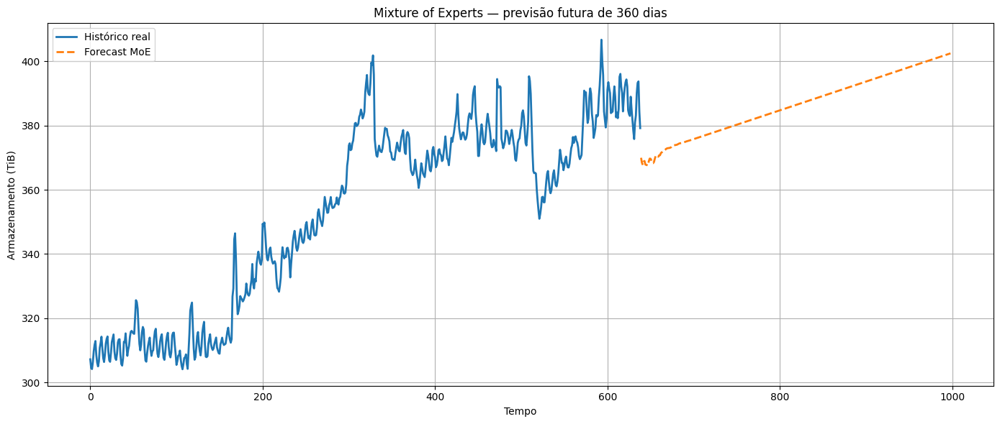

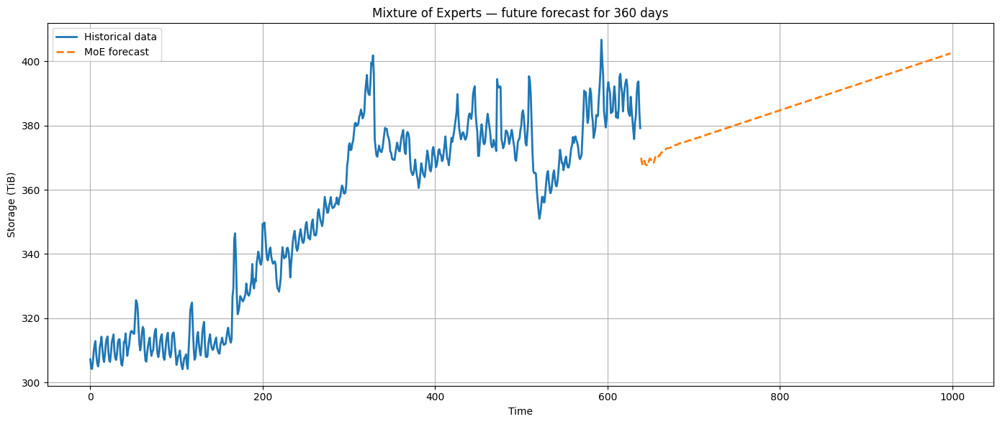

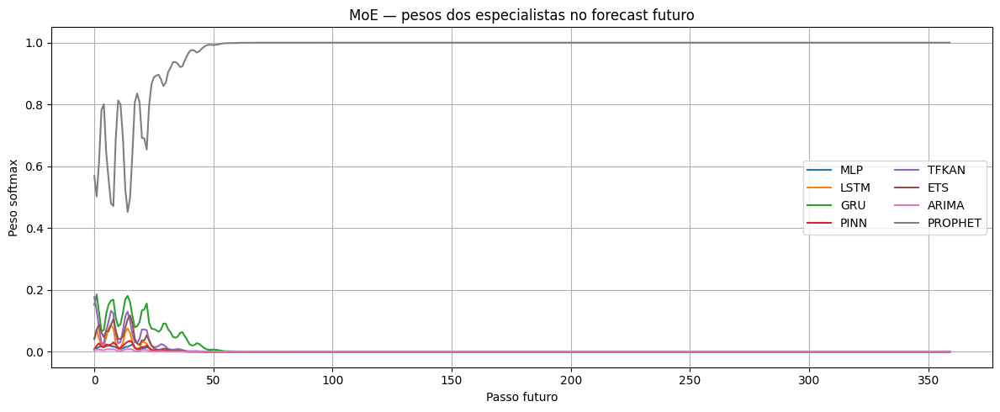

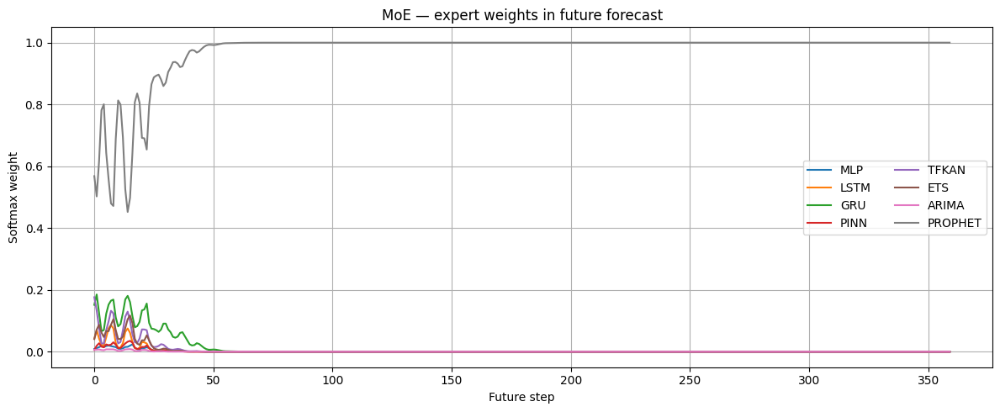


🔮 MOE Último valor previsto (360 dias à frente): 402.463 TiB
✅ Forecast futuro do MoE salvo com sucesso.

✅ MoE treinado e salvo com sucesso.
Arquivos gerados: moe_gating_model.keras, moe_metrics.json, CSVs, NPYs e gráficos PNG.


In [77]:
if len(future_candidates) == n_experts_moe:
    expert_names_moe_future, expert_future_matrix_tb, _ = _align_matrix(
        future_candidates,
        None
    )

    X_future_gate = _make_gate_features(expert_future_matrix_tb)
    X_future_gate_std = (X_future_gate - moe_feature_mu) / moe_feature_sd

    forecast_abs_moe_tb = model_moe.predict(
        [X_future_gate_std.astype(np.float32), expert_future_matrix_tb.astype(np.float32)],
        verbose=0
    ).ravel()

    forecast_abs_moe_tb = _as_tb_from_candidates("forecast_abs_moe_tb")

    moe_weights_forecast = weight_model_moe.predict(
        [X_future_gate_std.astype(np.float32), expert_future_matrix_tb.astype(np.float32)],
        verbose=0
    )

    # forecast_abs_moe fica em GB para compatibilidade com pipeline antigo
    forecast_abs_moe = forecast_abs_moe_tb * GB_TO_TIB

    pd.DataFrame({
        "forecast_step": np.arange(1, len(forecast_abs_moe_tb) + 1),
        "MoE_TiB": forecast_abs_moe_tb,
    }).to_csv("moe_future_forecast_tb.csv", index=False)

    pd.DataFrame(
        moe_weights_forecast,
        columns=[f"weight_{name}" for name in expert_names_moe_future]
    ).to_csv("moe_future_weights.csv", index=False)

    np.save("forecast_abs_moe.npy", forecast_abs_moe)
    np.save("forecast_abs_moe_tb.npy", forecast_abs_moe_tb)
    np.save("forecast_tb_moe.npy", forecast_abs_moe_tb)
    np.save("moe_weights_forecast.npy", moe_weights_forecast)

    if "forecast_dict" in globals():
        forecast_dict["MOE"] = forecast_abs_moe_tb

    series_tb = _as_tb_from_candidates("series_tb", "series_tib", "series")

    print("\n=== DEBUG UNIDADE — FORECAST ===")
    print("series_tb min/max:", np.nanmin(series_tb), np.nanmax(series_tb))
    print("forecast_abs_moe_tb min/max:", np.nanmin(forecast_abs_moe_tb), np.nanmax(forecast_abs_moe_tb))

    x_hist_moe = np.arange(len(series_tb))
    x_fore_moe = np.arange(len(series_tb), len(series_tb) + len(forecast_abs_moe_tb))

    plt.figure(figsize=(14, 6))
    plt.plot(x_hist_moe, series_tb, label="Histórico real", linewidth=2)
    plt.plot(x_fore_moe, forecast_abs_moe_tb, label="Forecast MoE", linestyle="--", linewidth=2)
    plt.title(f"Mixture of Experts — previsão futura de {FORECAST_DAYS} dias")
    plt.xlabel("Tempo")
    plt.ylabel("Armazenamento (TiB)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig("moe_future_forecast_tb.png", dpi=300, bbox_inches="tight")
    plt.show()

    plt.figure(figsize=(14, 6))
    plt.plot(x_hist_moe, series_tb, label="Historical data", linewidth=2)
    plt.plot(x_fore_moe, forecast_abs_moe_tb, label="MoE forecast", linestyle="--", linewidth=2)
    plt.title(f"Mixture of Experts — future forecast for {FORECAST_DAYS} days")
    plt.xlabel("Time")
    plt.ylabel("Storage (TiB)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig("moe_future_forecast_tb_en.png", dpi=300, bbox_inches="tight")
    plt.show()

    plt.figure(figsize=(12, 5))
    for i, name in enumerate(expert_names_moe_future):
        plt.plot(moe_weights_forecast[:, i], label=name)
    plt.title("MoE — pesos dos especialistas no forecast futuro")
    plt.xlabel("Passo futuro")
    plt.ylabel("Peso softmax")
    plt.grid(True)
    plt.legend(ncol=2)
    plt.tight_layout()
    plt.savefig("moe_future_weights.png", dpi=300, bbox_inches="tight")
    plt.show()

    plt.figure(figsize=(12, 5))
    for i, name in enumerate(expert_names_moe_future):
        plt.plot(moe_weights_forecast[:, i], label=name)
    plt.title("MoE — expert weights in future forecast")
    plt.xlabel("Future step")
    plt.ylabel("Softmax weight")
    plt.grid(True)
    plt.legend(ncol=2)
    plt.tight_layout()
    plt.savefig("moe_future_weights_en.png", dpi=300, bbox_inches="tight")
    plt.show()

    print(f"\n🔮 MOE Último valor previsto ({FORECAST_DAYS} dias à frente): {forecast_abs_moe_tb[-1]:.3f} TiB")
    print("✅ Forecast futuro do MoE salvo com sucesso.")

else:
    forecast_abs_moe_tb = None
    forecast_abs_moe = None
    moe_weights_forecast = None

    print("\n⚠️ Forecast futuro do MoE não executado.")
    print("Motivo: nem todos os especialistas usados no treino possuem forecast futuro disponível.")
    print("Especialistas esperados:", expert_names_moe)
    print("Especialistas disponíveis:", list(future_candidates.keys()))

print("\n✅ MoE treinado e salvo com sucesso.")
print("Arquivos gerados: moe_gating_model.keras, moe_metrics.json, CSVs, NPYs e gráficos PNG.")

In [78]:
if RELOAD == 1:

    # ============================================================
    # 🔄 RELOAD EVERYTHING - MOE
    # ============================================================

    import os
    import json
    import numpy as np
    import pandas as pd

    from tensorflow.keras.models import load_model

    MODEL_NAME = "moe"

    # ============================================================
    # FILES
    # ============================================================
    FILE_MODEL = f"{BASE_PATH}/{MODEL_NAME}_gating_model.keras"

    FILE_CONFIG = f"{BASE_PATH}/{MODEL_NAME}_config.json"
    FILE_METRICS = f"{BASE_PATH}/{MODEL_NAME}_metrics.json"

    FILE_MU = f"{BASE_PATH}/{MODEL_NAME}_feature_mu.npy"
    FILE_SD = f"{BASE_PATH}/{MODEL_NAME}_feature_sd.npy"

    FILE_HISTORY_LOSS = f"{BASE_PATH}/{MODEL_NAME}_history_loss.npy"
    FILE_HISTORY_VAL_LOSS = f"{BASE_PATH}/{MODEL_NAME}_history_val_loss.npy"

    FILE_Y_TEST = f"{BASE_PATH}/y_test_abs_{MODEL_NAME}_tb.npy"
    FILE_Y_PRED = f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}_tb.npy"

    FILE_WEIGHTS_VALIDATION = f"{BASE_PATH}/{MODEL_NAME}_weights_validation.npy"

    FILE_FORECAST_TB = f"{BASE_PATH}/forecast_tb_{MODEL_NAME}.npy"
    FILE_FORECAST_ABS = f"{BASE_PATH}/forecast_abs_{MODEL_NAME}.npy"

    FILE_WEIGHTS_FORECAST = f"{BASE_PATH}/{MODEL_NAME}_weights_forecast.npy"

    FILE_SERIES = f"{BASE_PATH}/series_original.npy"

    # ============================================================
    # LOAD MODEL
    # ============================================================
    model_moe = load_model(FILE_MODEL)

    # ============================================================
    # LOAD CONFIG
    # ============================================================
    with open(FILE_CONFIG, "r", encoding="utf-8") as f:
        config_moe = json.load(f)

    with open(FILE_METRICS, "r", encoding="utf-8") as f:
        metrics_moe = json.load(f)

    # ============================================================
    # LOAD NORMALIZATION
    # ============================================================
    moe_feature_mu = np.load(FILE_MU)
    moe_feature_sd = np.load(FILE_SD)

    # ============================================================
    # LOAD HISTORY
    # ============================================================
    history_loss = np.load(FILE_HISTORY_LOSS)

    history_val_loss = np.load(FILE_HISTORY_VAL_LOSS)

    # ============================================================
    # LOAD VALIDATION
    # ============================================================
    y_test_abs_moe_tb = np.load(FILE_Y_TEST)

    y_pred_abs_moe_tb = np.load(FILE_Y_PRED)

    moe_weights_validation = np.load(
        FILE_WEIGHTS_VALIDATION
    )

    # ============================================================
    # LOAD FORECAST
    # ============================================================
    forecast_abs_moe_tb = None
    forecast_abs_moe = None
    moe_weights_forecast = None

    if os.path.exists(FILE_FORECAST_TB):
        forecast_abs_moe_tb = np.load(
            FILE_FORECAST_TB
        )

    if os.path.exists(FILE_FORECAST_ABS):
        forecast_abs_moe = np.load(
            FILE_FORECAST_ABS
        )

    if os.path.exists(FILE_WEIGHTS_FORECAST):
        moe_weights_forecast = np.load(
            FILE_WEIGHTS_FORECAST
        )

    # ============================================================
    # LOAD SERIES
    # ============================================================
    series = np.load(FILE_SERIES)

    # ============================================================
    # SUMMARY
    # ============================================================
    print("\n✅ RELOAD EVERYTHING - MOE COMPLETED")

    print(f"Base path              : {BASE_PATH}")
    print(f"Model                  : {MODEL_NAME}")

    print(f"Experts                : {config_moe['experts']}")
    print(f"N experts              : {config_moe['n_experts']}")

    print(f"Forecast steps         : {config_moe['forecast_steps']}")
    print(f"Forecast days          : {config_moe['forecast_days']}")

    print(f"Time unit              : {config_moe['time_unit']}")

    print("\n📊 Metrics")

    print(f"RMSE                   : {metrics_moe['RMSE_TB']:.6f}")
    print(f"MAE                    : {metrics_moe['MAE_TB']:.6f}")
    print(f"R²                     : {metrics_moe['R2']:.6f}")

    if forecast_abs_moe_tb is not None:
        print(
            f"Final forecast TB      : "
            f"{forecast_abs_moe_tb[-1]:.3f}"
        )

    print("\n📐 Shapes")

    print(
        "y_test_abs_moe_tb      :",
        y_test_abs_moe_tb.shape
    )

    print(
        "y_pred_abs_moe_tb      :",
        y_pred_abs_moe_tb.shape
    )

    print(
        "weights_validation     :",
        moe_weights_validation.shape
    )

    if forecast_abs_moe_tb is not None:
        print(
            "forecast_abs_moe_tb    :",
            forecast_abs_moe_tb.shape
        )

    # ============================================================
    # PACKAGE EVERYTHING
    # ============================================================
    artifacts_moe = {

        "model_moe":
            model_moe,

        "config_moe":
            config_moe,

        "metrics_moe":
            metrics_moe,

        "moe_feature_mu":
            moe_feature_mu,

        "moe_feature_sd":
            moe_feature_sd,

        "history_loss":
            history_loss,

        "history_val_loss":
            history_val_loss,

        "y_test_abs_moe_tb":
            y_test_abs_moe_tb,

        "y_pred_abs_moe_tb":
            y_pred_abs_moe_tb,

        "moe_weights_validation":
            moe_weights_validation,

        "forecast_abs_moe":
            forecast_abs_moe,

        "forecast_abs_moe_tb":
            forecast_abs_moe_tb,

        "moe_weights_forecast":
            moe_weights_forecast,

        "series":
            series,
    }

    print("\n✅ artifacts_moe dictionary created.")


✅ RELOAD EVERYTHING - MOE COMPLETED
Base path              : /content/drive/MyDrive/Colab Notebooks/MESTRADO/1-TESE/360/12-jun-2026
Model                  : moe
Experts                : ['MLP', 'LSTM', 'GRU', 'PINN', 'TFKAN', 'EXP', 'ARIMA', 'PROPHET']
N experts              : 8
Forecast steps         : 360
Forecast days          : 360
Time unit              : day

📊 Metrics
RMSE                   : 5.225248
MAE                    : 3.800217
R²                     : 0.724842
Final forecast TB      : 402.463

📐 Shapes
y_test_abs_moe_tb      : (104,)
y_pred_abs_moe_tb      : (104,)
weights_validation     : (104, 8)
forecast_abs_moe_tb    : (360,)

✅ artifacts_moe dictionary created.


In [79]:
if SAVE == 1:

    # ============================================================
    # 💾 SAVE EVERYTHING - MOE
    # ============================================================

    import os
    import json
    import shutil
    import numpy as np
    import pandas as pd

    MODEL_NAME = "moe"

    os.makedirs(BASE_PATH, exist_ok=True)

    # ============================================================
    # 1) SAVE MODEL
    # ============================================================
    model_moe.save(f"{BASE_PATH}/{MODEL_NAME}_gating_model.keras")

    # ============================================================
    # 2) SAVE CONFIG
    # ============================================================
    config_moe = {
        "model_type": "MixtureOfExperts",
        "experts": expert_names_moe,
        "n_experts": int(n_experts_moe),
        "n_features": int(n_features_moe),
        "train_gate_size": int(train_gate_size),
        "forecast_steps": int(FORECAST_STEPS),
        "forecast_days": int(FORECAST_DAYS),
        "time_unit": str(time_unit),
        "unit": "TiB",
    }

    with open(f"{BASE_PATH}/{MODEL_NAME}_config.json", "w", encoding="utf-8") as f:
        json.dump(config_moe, f, indent=4, ensure_ascii=False)

    # ============================================================
    # 3) SAVE METRICS
    # ============================================================
    with open(f"{BASE_PATH}/{MODEL_NAME}_metrics.json", "w", encoding="utf-8") as f:
        json.dump(moe_metrics, f, indent=4, ensure_ascii=False)

    # ============================================================
    # 4) SAVE NORMALIZATION
    # ============================================================
    np.save(f"{BASE_PATH}/{MODEL_NAME}_feature_mu.npy", moe_feature_mu)
    np.save(f"{BASE_PATH}/{MODEL_NAME}_feature_sd.npy", moe_feature_sd)

    # ============================================================
    # 5) SAVE TRAINING HISTORY
    # ============================================================
    np.save(
        f"{BASE_PATH}/{MODEL_NAME}_history_loss.npy",
        np.asarray(history_moe.history.get("loss", []), dtype=np.float64)
    )

    np.save(
        f"{BASE_PATH}/{MODEL_NAME}_history_val_loss.npy",
        np.asarray(history_moe.history.get("val_loss", []), dtype=np.float64)
    )

    # ============================================================
    # 6) SAVE VALIDATION ARRAYS
    # ============================================================
    np.save(f"{BASE_PATH}/y_test_abs_{MODEL_NAME}_tb.npy", y_test_abs_moe_tb)
    np.save(f"{BASE_PATH}/y_pred_abs_{MODEL_NAME}_tb.npy", y_pred_abs_moe_tb)
    np.save(f"{BASE_PATH}/{MODEL_NAME}_weights_validation.npy", moe_weights_validation)

    # ============================================================
    # 7) SAVE FUTURE FORECAST
    # ============================================================
    if "forecast_abs_moe_tb" in globals() and forecast_abs_moe_tb is not None:

        if "forecast_abs_moe" not in globals() or forecast_abs_moe is None:
            forecast_abs_moe = forecast_abs_moe_tb * 1024

        np.save(f"{BASE_PATH}/forecast_abs_{MODEL_NAME}.npy", forecast_abs_moe)
        np.save(f"{BASE_PATH}/forecast_abs_{MODEL_NAME}_tb.npy", forecast_abs_moe_tb)
        np.save(f"{BASE_PATH}/forecast_tb_{MODEL_NAME}.npy", forecast_abs_moe_tb)

        if "moe_weights_forecast" in globals() and moe_weights_forecast is not None:
            np.save(f"{BASE_PATH}/{MODEL_NAME}_weights_forecast.npy", moe_weights_forecast)

    # ============================================================
    # 8) SAVE SERIES REFERENCE
    # ============================================================
    np.save(f"{BASE_PATH}/series_original.npy", series)

    # ============================================================
    # 9) SAVE VALIDATION CSV
    # ============================================================
    pd.DataFrame({
        "time_index": np.arange(len(y_test_abs_moe_tb)),
        "Actual_TiB": y_test_abs_moe_tb,
        "MoE_TiB": y_pred_abs_moe_tb,
        "Mean_Ensemble_TiB": mean_ensemble_tb,
        "Median_Ensemble_TiB": median_ensemble_tb,
    }).to_csv(f"{BASE_PATH}/moe_validation_predictions_tb.csv", index=False)

    pd.DataFrame(
        moe_weights_validation,
        columns=[f"weight_{name}" for name in expert_names_moe]
    ).to_csv(f"{BASE_PATH}/moe_validation_weights.csv", index=False)

    # ============================================================
    # 10) SAVE FUTURE CSV
    # ============================================================
    if "forecast_abs_moe_tb" in globals() and forecast_abs_moe_tb is not None:

        pd.DataFrame({
            "forecast_step": np.arange(1, len(forecast_abs_moe_tb) + 1),
            "MoE_TiB": forecast_abs_moe_tb,
        }).to_csv(f"{BASE_PATH}/moe_future_forecast_tb.csv", index=False)

        if "moe_weights_forecast" in globals() and moe_weights_forecast is not None:
            pd.DataFrame(
                moe_weights_forecast,
                columns=[f"weight_{name}" for name in expert_names_moe_future]
            ).to_csv(f"{BASE_PATH}/moe_future_weights.csv", index=False)

    # ============================================================
    # 11) COPY PNG ARTIFACTS
    # ============================================================
    artifact_files = [
        "moe_validation_forecast_tb.png",
        "moe_loss_curve.png",
        "moe_dynamic_weights.png",
        "moe_validation_forecast_tb_en.png",
        "moe_loss_curve_en.png",
        "moe_dynamic_weights_en.png",
        "moe_future_forecast_tb.png",
        "moe_future_forecast_tb_en.png",
        "moe_future_weights.png",
        "moe_future_weights_en.png",
    ]

    for fname in artifact_files:
        if os.path.exists(fname):
            dest = os.path.join(BASE_PATH, fname)
            if os.path.abspath(fname) != os.path.abspath(dest):
                shutil.copy2(fname, dest)

    # ============================================================
    # 12) PACKAGE EVERYTHING
    # ============================================================
    artifacts_moe = {
        "model_moe": model_moe,
        "config_moe": config_moe,
        "metrics_moe": moe_metrics,
        "moe_feature_mu": moe_feature_mu,
        "moe_feature_sd": moe_feature_sd,
        "history_loss": np.asarray(history_moe.history.get("loss", []), dtype=np.float64),
        "history_val_loss": np.asarray(history_moe.history.get("val_loss", []), dtype=np.float64),
        "y_test_abs_moe_tb": y_test_abs_moe_tb,
        "y_pred_abs_moe_tb": y_pred_abs_moe_tb,
        "moe_weights_validation": moe_weights_validation,
        "forecast_abs_moe": forecast_abs_moe if "forecast_abs_moe" in globals() else None,
        "forecast_abs_moe_tb": forecast_abs_moe_tb if "forecast_abs_moe_tb" in globals() else None,
        "moe_weights_forecast": moe_weights_forecast if "moe_weights_forecast" in globals() else None,
        "series": series,
    }

    print(f"\n✅ All MoE artifacts saved in:\n{BASE_PATH}")

# COMPARISON-ALL

In [82]:
# ============================================================
# ✅ FIX ARIMA VALIDATION RECONSTRUCTION TO TiB
# ============================================================

# ARIMA prediction is in normalized/differenced space
y_pred_arima = np.asarray(y_pred_arima, dtype=np.float64).ravel()
y_test_arima = np.asarray(y_test, dtype=np.float64).ravel()

# Inverse MinMax scaling: normalized Δ -> original Δ
y_pred_inv_arima = scaler.inverse_transform(
    y_pred_arima.reshape(-1, 1)
).ravel()

y_test_inv_arima = scaler.inverse_transform(
    y_test_arima.reshape(-1, 1)
).ravel()

# Same reconstruction anchor used by the neural models
base_idx = train_size + BEST_WINDOW_MLP - 1
base_value = np.asarray(series, dtype=np.float64).ravel()[base_idx]

# Reconstruct absolute scale
y_pred_abs_arima = base_value + np.cumsum(y_pred_inv_arima)
y_test_abs_arima = base_value + np.cumsum(y_test_inv_arima)

# Convert to TiB only if necessary
def force_tib(x):
    x = np.asarray(x, dtype=np.float64).ravel()
    med = np.nanmedian(np.abs(x))

    if med > 1e12:      # bytes
        return x / (1024 ** 4)
    elif med > 1e9:     # MB-like large unit
        return x / (1024 ** 2)
    elif med > 1e6:     # MB
        return x / (1024 ** 2)
    elif med > 1e3:     # GiB
        return x / 1024
    else:               # already TiB
        return x

y_pred_abs_arima_tib = force_tib(y_pred_abs_arima)
y_test_abs_arima_tib = force_tib(y_test_abs_arima)

print("ARIMA reconstructed TiB:")
print("Actual:", np.nanmin(y_test_abs_arima_tib), np.nanmax(y_test_abs_arima_tib))
print("Pred  :", np.nanmin(y_pred_abs_arima_tib), np.nanmax(y_pred_abs_arima_tib))
print("First actual/pred:", y_test_abs_arima_tib[0], y_pred_abs_arima_tib[0])

ARIMA reconstructed TiB:
Actual: 352.54583871316896 398.2731847314834
Pred  : 346.79344261136674 368.20521583548293
First actual/pred: 352.54583871316896 351.0456999106316


In [87]:
# ============================================================
# ✅ FIX PROPHET VALIDATION ALIGNMENT
# ============================================================

# Prophet validation timestamps
future_valid_prophet = test_prophet[["ds"]].copy()

# Predict only validation interval
forecast_valid_prophet = model_prophet.predict(future_valid_prophet)

# Predicted and actual validation series
y_pred_abs_prophet_tib = forecast_valid_prophet["yhat"].to_numpy(dtype=np.float64)
y_test_abs_prophet_tib = test_prophet["y"].to_numpy(dtype=np.float64)

print("PROPHET validation TiB:")
print("Actual:", np.nanmin(y_test_abs_prophet_tib), np.nanmax(y_test_abs_prophet_tib))
print("Pred  :", np.nanmin(y_pred_abs_prophet_tib), np.nanmax(y_pred_abs_prophet_tib))
print("First actual/pred:", y_test_abs_prophet_tib[0], y_pred_abs_prophet_tib[0])
print("Length actual/pred:", len(y_test_abs_prophet_tib), len(y_pred_abs_prophet_tib))

PROPHET validation TiB:
Actual: 350983.214035645 406710.643381348
Pred  : 329.35644147647605 364.74957898131
First actual/pred: 389869.01988916 329.35644147647605
Length actual/pred: 128 128


In [85]:
for v in sorted(globals()):
    if "prophet" in v.lower():
        print(v)

Prophet
artifacts_prophet
config_prophet
df_forecast_prophet
forecast_abs_prophet
forecast_abs_prophet_recomputed
forecast_future_prophet
forecast_prophet_tib
forecast_tb_prophet
forecast_tb_prophet_recomputed
forecast_tib_prophet
forecast_tib_prophet_recomputed
future_prophet
metrics_prophet
model_prophet
model_prophet_reloaded
mse_prophet
prophet_df
prophet_metrics
r2_prophet
reconstruction_info_prophet
rmse_prophet
scaler_prophet
split_prophet
test_prophet
train_prophet
y_pred_abs_prophet
y_pred_abs_prophet_recomputed
y_pred_abs_prophet_recomputed_tb
y_pred_abs_prophet_tb
y_pred_abs_prophet_tib
y_test_abs_prophet
y_test_abs_prophet_tb
y_test_abs_prophet_tib


In [86]:
for v in sorted(globals()):
    if "forecast" in v.lower():
        print(v)

FILE_FORECAST_ABS
FILE_FORECAST_ABS_TB
FILE_FORECAST_DIFFS
FILE_FORECAST_DIFFS_INV
FILE_FORECAST_FUTURE
FILE_FORECAST_TB
FILE_FORECAST_TEST_FULL
FILE_WEIGHTS_FORECAST
FORECAST_DAYS
FORECAST_STEPS
FORECAST_STEPS_TRAIN
df_forecast_arima
df_forecast_exp
df_forecast_prophet
forecast_abs_arima
forecast_abs_exp
forecast_abs_exp_recomputed
forecast_abs_gru
forecast_abs_lstm
forecast_abs_lstm_tb
forecast_abs_mlp
forecast_abs_mlp_tb
forecast_abs_moe
forecast_abs_moe_tb
forecast_abs_pinn
forecast_abs_prophet
forecast_abs_prophet_recomputed
forecast_abs_tfkan
forecast_abs_tfkan_tb
forecast_diffs_arima
forecast_diffs_arima_recomputed
forecast_diffs_exp
forecast_diffs_exp_recomputed
forecast_diffs_gru
forecast_diffs_inv_arima
forecast_diffs_inv_exp
forecast_diffs_inv_exp_recomputed
forecast_diffs_inv_gru
forecast_diffs_inv_lstm
forecast_diffs_inv_mlp
forecast_diffs_inv_pinn
forecast_diffs_inv_tfkan
forecast_diffs_lstm
forecast_diffs_mlp
forecast_diffs_pinn
forecast_diffs_tfkan
forecast_future
forec

In [91]:
print(np.nanmedian(actual_tib))
print(np.nanmedian(y_test_abs_prophet_tib))
print(np.nanmedian(y_test_abs_mlp_tb))
print(np.nanmedian(y_test_abs_gru_tb))

379171.9950888675
379171.9950888675
374.55504014921144
374.55504014921144


In [92]:
# Prophet values are in GiB-like scale, convert to TiB
y_test_abs_prophet_tib = np.asarray(y_test_abs_prophet_tib, dtype=np.float64).ravel() / 1024
y_pred_abs_prophet_tib = np.asarray(y_pred_abs_prophet_tib, dtype=np.float64).ravel() / 1024

print(np.nanmedian(y_test_abs_prophet_tib))
print(np.nanmedian(y_pred_abs_prophet_tib))

370.28515145397216
0.34637119010567413


In [94]:
print("y_pred_abs_prophet_tib:", np.nanmedian(y_pred_abs_prophet_tib))
print("forecast_tb_prophet:", np.nanmedian(forecast_tb_prophet))
print("forecast_tib_prophet:", np.nanmedian(forecast_tib_prophet))
print("forecast_abs_prophet:", np.nanmedian(forecast_abs_prophet))
print("forecast_abs_prophet_recomputed:", np.nanmedian(forecast_abs_prophet_recomputed))

y_pred_abs_prophet_tib: 0.34637119010567413
forecast_tb_prophet: 386.3822505142301
forecast_tib_prophet: 386.3822505142301
forecast_abs_prophet: 395655.42452657165
forecast_abs_prophet_recomputed: 395655.42452657165


In [96]:
print(len(forecast_tb_prophet))
print(len(actual_tib))
print(len(y_test_abs_mlp_tb))

360
128
104


In [98]:
# ============================================================
# ✅ PROPHET VALIDATION PREDICTION — CORRECT WAY
# ============================================================

n_valid = len(y_test_abs_mlp_tb)

future_valid_prophet = test_prophet[["ds"]].copy()
forecast_valid_prophet = model_prophet.predict(future_valid_prophet)

prophet_valid_raw = forecast_valid_prophet["yhat"].to_numpy(dtype=np.float64)

# Convert only if needed
if np.nanmedian(np.abs(prophet_valid_raw)) > 10000:
    prophet_valid_tib = prophet_valid_raw / 1024
else:
    prophet_valid_tib = prophet_valid_raw

y_pred_abs_prophet_tib = prophet_valid_tib[-n_valid:]

print("Prophet validation length:", len(y_pred_abs_prophet_tib))
print("Median:", np.nanmedian(y_pred_abs_prophet_tib))
print("First/last:", y_pred_abs_prophet_tib[0], y_pred_abs_prophet_tib[-1])

Prophet validation length: 104
Median: 357.7223019993463
First/last: 338.29214620916906 352.943853627439


In [100]:
# ============================================================
# ✅ PROPHET VALIDATION ALIGNED WITH FINAL COMPARISON
#    same length and same final segment as MLP/GRU validation
# ============================================================

n_valid = len(y_test_abs_mlp_tb)

future_valid_prophet = prophet_df[["ds"]].iloc[-n_valid:].copy()

forecast_valid_prophet = model_prophet.predict(future_valid_prophet)

prophet_valid_raw = forecast_valid_prophet["yhat"].to_numpy(dtype=np.float64)

# Convert GiB-like absolute values to TiB only once
if np.nanmedian(np.abs(prophet_valid_raw)) > 10000:
    y_pred_abs_prophet_tib = prophet_valid_raw / 1024
else:
    y_pred_abs_prophet_tib = prophet_valid_raw

print("Prophet validation length:", len(y_pred_abs_prophet_tib))
print("Median:", np.nanmedian(y_pred_abs_prophet_tib))
print("First/last:", y_pred_abs_prophet_tib[0], y_pred_abs_prophet_tib[-1])

print("Actual MLP first/last:", y_test_abs_mlp_tb[0], y_test_abs_mlp_tb[-1])

Prophet validation length: 104
Median: 357.7223019993463
First/last: 338.29214620916906 352.943853627439
Actual MLP first/last: 352.54583871316896 371.3964340467451


✅ ARIMA incluído: série em escala absoluta TiB.

=== DEBUG — COMPARAÇÃO FINAL ===
Common aligned length: 104
Actual min/max: 351.451 / 397.178 TiB
ARIMA      length=  104 min/max: 346.793 / 368.205 TiB
MLP        length=  104 min/max: 350.089 / 374.097 TiB
LSTM       length=  104 min/max: 290.539 / 368.099 TiB
GRU        length=  104 min/max: 352.618 / 382.830 TiB
PINN       length=  104 min/max: 337.055 / 363.542 TiB
TFKAN      length=  104 min/max: 351.066 / 379.396 TiB
ETS        length=  104 min/max: 351.788 / 369.332 TiB
PROPHET    length=  104 min/max: 393.236 / 402.463 TiB
MOE        length=  104 min/max: 351.669 / 382.186 TiB


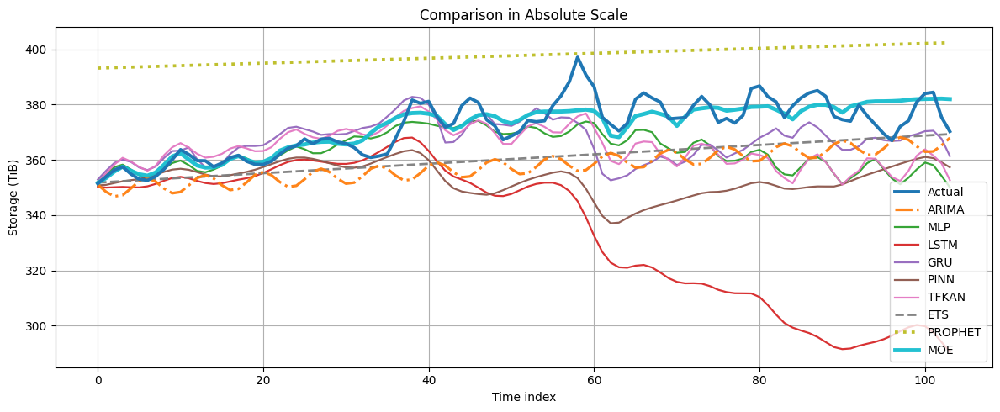

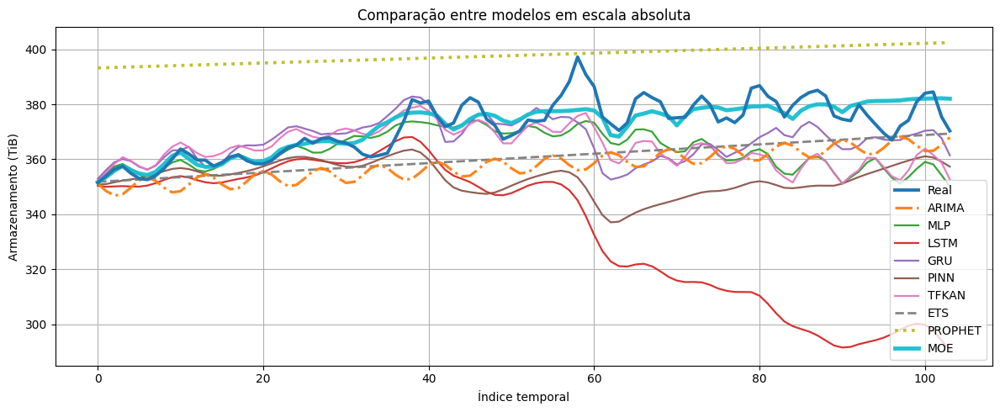


✅ Saved files:
- all_model_comparison.csv
- all_comparacao_modelos.csv
- all_model_comparison_en.png
- all_model_comparison_pt.png


In [99]:
# ============================================================
# ✅ FINAL COMPARISON — ALL MODELS
#    Final scale: TiB
#    ARIMA included only from absolute TiB series
#    Aligns all series by common valid length
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# Helpers
# ------------------------------------------------------------
def _to_1d_float(x):
    return np.asarray(x, dtype=np.float64).ravel()


def _get_raw_var(*names):
    for name in names:
        if name in globals() and globals()[name] is not None:
            arr = _to_1d_float(globals()[name])
            if arr.size > 0:
                return arr
    return None


def _read_validation_csv(*filenames):
    for filename in filenames:
        if os.path.exists(filename):
            tmp = pd.read_csv(filename)

            for col in [
                "predicted_tib",
                "arima_tib",
                "forecast_tib",
                "prediction_tib",
                "predicted_tb",
                "arima_tb",
                "forecast_tb",
                "prediction_tb",
            ]:
                if col in tmp.columns:
                    return tmp[col].to_numpy(dtype=np.float64)

    return None


# ------------------------------------------------------------
# Base actual series
# ------------------------------------------------------------
actual_tib = _get_raw_var(
    "y_test_abs_prophet_tib",
    "y_test_abs_prophet_tb",
    "y_test_abs_mlp_tib",
    "y_test_abs_mlp_tb",
    "y_test_abs_gru_tib",
    "y_test_abs_gru_tb",
    "y_test_abs_lstm_tib",
    "y_test_abs_lstm_tb",
    "y_test_abs_exp_tib",
    "y_test_abs_exp_tb",
    "y_test_abs_pinn_tib",
    "y_test_abs_pinn_tb",
    "y_test_abs_tfkan_tib",
    "y_test_abs_tfkan_tb",
    "y_test_abs_moe_tib",
    "y_test_abs_moe_tb",
)

if actual_tib is None:
    raise ValueError("Nenhuma série real de teste foi encontrada.")

actual_tib = _to_1d_float(actual_tib)

# ------------------------------------------------------------
# ARIMA — absolute TiB only
# ------------------------------------------------------------
#arima_series = _get_raw_var(
#    "y_pred_abs_arima_tib",
#    "y_pred_arima_abs_tib",
#    "forecast_abs_arima_tib",
#    "forecast_tib_arima",
#    "arima_forecast_tib",
##    "y_pred_abs_arima_tb",
#    "y_pred_arima_abs_tb",
#)

arima_series = _get_raw_var(
    "y_pred_abs_arima_tib",
    "y_pred_abs_arima_tb",
    "y_pred_arima_abs_tib",
    "y_pred_arima_abs_tb"
)

if arima_series is None and "df_validation_arima" in globals():
    for col in [
        "predicted_tib",
        "arima_tib",
        "forecast_tib",
        "prediction_tib",
        "predicted_tb",
        "arima_tb",
        "forecast_tb",
        "prediction_tb",
    ]:
        if col in df_validation_arima.columns:
            arima_series = _to_1d_float(df_validation_arima[col])
            break

if arima_series is None:
    arima_series = _read_validation_csv(
        "arima_validation_absolute.csv",
        "arima_validacao_absoluta.csv",
        "arima_validation_tib.csv",
        "arima_results_tib.csv",
        "arima_validation.csv",
        "arima_results.csv",
    )

if arima_series is not None:
    arima_series = _to_1d_float(arima_series)
    arima_med = np.nanmedian(np.abs(arima_series))

    if arima_med < 10:
        raise ValueError(
            "ARIMA encontrado, mas não está em escala absoluta TiB. "
            "Gere y_pred_abs_arima_tib antes do gráfico final."
        )

    print("✅ ARIMA incluído: série em escala absoluta TiB.")
else:
    print("⚠️ ARIMA não encontrado em escala absoluta TiB.")

# ------------------------------------------------------------
# Predictions — no extra conversion
# ------------------------------------------------------------
model_series = {
    "ARIMA": arima_series,

    "MLP": _get_raw_var(
        "y_pred_abs_mlp_tib",
        "y_pred_abs_mlp_tb",
    ),

    "LSTM": _get_raw_var(
        "y_pred_abs_lstm_tib",
        "y_pred_abs_lstm_tb",
    ),

    "GRU": _get_raw_var(
        "y_pred_abs_gru_tib",
        "y_pred_abs_gru_tb",
    ),

    "PINN": _get_raw_var(
        "y_pred_abs_pinn_tib",
        "y_pred_abs_pinn_tb",
    ),

    "TFKAN": _get_raw_var(
        "y_pred_abs_tfkan_tib",
        "y_pred_abs_tfkan_tb",
    ),

    "ETS": _get_raw_var(
        "y_pred_abs_exp_tib",
        "y_pred_abs_exp_tb",
    ),

    #"PROPHET": _get_raw_var(
    #    "y_pred_abs_prophet_tib",
    #    "y_pred_abs_prophet_tb",
    #),

    "PROPHET": _get_raw_var(
        "forecast_tb_prophet",
        "forecast_tib_prophet",
    ),

    "MOE": _get_raw_var(
        "y_pred_abs_moe_tib",
        "y_pred_abs_moe_tb",
        "y_pred_moe_tib",
        "y_pred_moe_tb",
    ),
}

# ------------------------------------------------------------
# Remove missing models
# ------------------------------------------------------------
model_series = {
    name: _to_1d_float(values)
    for name, values in model_series.items()
    if values is not None and len(_to_1d_float(values)) > 0
}

if not model_series:
    raise ValueError("Nenhuma série predita foi encontrada para comparação.")

# ------------------------------------------------------------
# Align all series by common length
# Uses the last n_comp points to avoid NaN padding/missing tails
# ------------------------------------------------------------
lengths = [len(actual_tib)] + [len(values) for values in model_series.values()]
n_comp = min(lengths)

if n_comp <= 0:
    raise ValueError("Comprimento comum inválido entre as séries.")

actual_tib_aligned = actual_tib[-n_comp:]

model_series = {
    name: values[-n_comp:]
    for name, values in model_series.items()
}

# ------------------------------------------------------------
# DataFrame
# ------------------------------------------------------------
comparison_data = {
    "time_index": np.arange(n_comp),
    "Actual_TiB": actual_tib_aligned,
}

for name, values in model_series.items():
    comparison_data[f"{name}_TiB"] = values

df_comp = pd.DataFrame(comparison_data)

df_comp.to_csv("all_model_comparison.csv", index=False)
df_comp.to_csv("all_comparacao_modelos.csv", index=False)

# ------------------------------------------------------------
# Debug
# ------------------------------------------------------------
print("\n=== DEBUG — COMPARAÇÃO FINAL ===")
print(f"Common aligned length: {n_comp}")
print(
    f"Actual min/max: "
    f"{np.nanmin(actual_tib_aligned):.3f} / {np.nanmax(actual_tib_aligned):.3f} TiB"
)

for name, arr in model_series.items():
    print(
        f"{name:10s} length={len(arr):5d} "
        f"min/max: {np.nanmin(arr):.3f} / {np.nanmax(arr):.3f} TiB"
    )

# ------------------------------------------------------------
# Plot styles
# ------------------------------------------------------------
plot_specs = {
    "ARIMA": {"linestyle": "-.", "linewidth": 2.3, "zorder": 10},
    "ETS": {"linestyle": "--", "linewidth": 2.0, "zorder": 8},
    "PROPHET": {"linestyle": ":", "linewidth": 2.7, "zorder": 12},
    "MOE": {"linestyle": "-", "linewidth": 3.5, "zorder": 25},
}

# ------------------------------------------------------------
# Plot EN
# ------------------------------------------------------------
plt.figure(figsize=(12, 5))

plt.plot(
    df_comp["time_index"],
    df_comp["Actual_TiB"],
    label="Actual",
    linewidth=2.8,
    zorder=30,
)

for name in model_series.keys():
    col = f"{name}_TiB"
    spec = plot_specs.get(
        name,
        {"linestyle": "-", "linewidth": 1.6, "zorder": 5},
    )

    plt.plot(
        df_comp["time_index"],
        df_comp[col],
        label=name,
        linestyle=spec["linestyle"],
        linewidth=spec["linewidth"],
        zorder=spec["zorder"],
        alpha=0.95,
    )

plt.title("Comparison in Absolute Scale")
plt.xlabel("Time index")
plt.ylabel("Storage (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("all_model_comparison_en.png", dpi=300, bbox_inches="tight")
plt.show()

# ------------------------------------------------------------
# Plot PT-BR
# ------------------------------------------------------------
plt.figure(figsize=(12, 5))

plt.plot(
    df_comp["time_index"],
    df_comp["Actual_TiB"],
    label="Real",
    linewidth=2.8,
    zorder=30,
)

for name in model_series.keys():
    col = f"{name}_TiB"
    spec = plot_specs.get(
        name,
        {"linestyle": "-", "linewidth": 1.6, "zorder": 5},
    )

    plt.plot(
        df_comp["time_index"],
        df_comp[col],
        label=name,
        linestyle=spec["linestyle"],
        linewidth=spec["linewidth"],
        zorder=spec["zorder"],
        alpha=0.95,
    )

plt.title("Comparação entre modelos em escala absoluta")
plt.xlabel("Índice temporal")
plt.ylabel("Armazenamento (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("all_model_comparison_pt.png", dpi=300, bbox_inches="tight")
plt.show()

print("\n✅ Saved files:")
print("- all_model_comparison.csv")
print("- all_comparacao_modelos.csv")
print("- all_model_comparison_en.png")
print("- all_model_comparison_pt.png")

✅ Actual reference: y_test_abs_mlp_tb
Actual length: 104
Actual median: 374.555 TiB

✅ Prophet validation rebuilt from prophet_df last n_valid timestamps.
Prophet length: 104
Prophet median: 357.722 TiB
Prophet first/last: 338.292 / 352.944 TiB

✅ ARIMA validation included.
ARIMA length: 104
ARIMA median: 357.900 TiB

=== DEBUG — FINAL COMPARISON ===
Validation length: 104
Actual min/max: 352.546 / 398.273 TiB
MLP        length=  104 median= 362.513 min/max= 350.089 /  374.097 TiB
LSTM       length=  104 median= 349.489 min/max= 290.539 /  368.099 TiB
GRU        length=  104 median= 367.407 min/max= 352.618 /  382.830 TiB
PINN       length=  104 median= 353.636 min/max= 337.055 /  363.542 TiB
TFKAN      length=  104 median= 364.135 min/max= 351.066 /  379.396 TiB
ETS        length=  104 median= 360.560 min/max= 351.788 /  369.332 TiB
ARIMA      length=  104 median= 357.900 min/max= 346.793 /  368.205 TiB
PROPHET    length=  104 median= 357.722 min/max= 338.292 /  364.750 TiB
MOE       

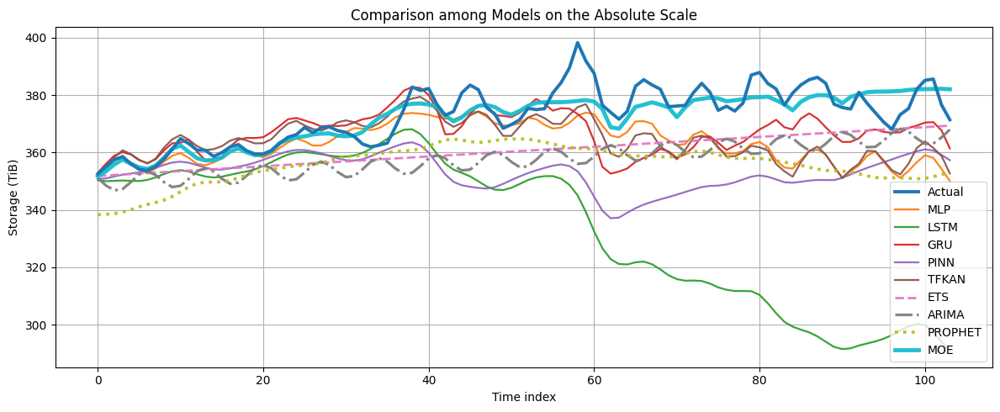

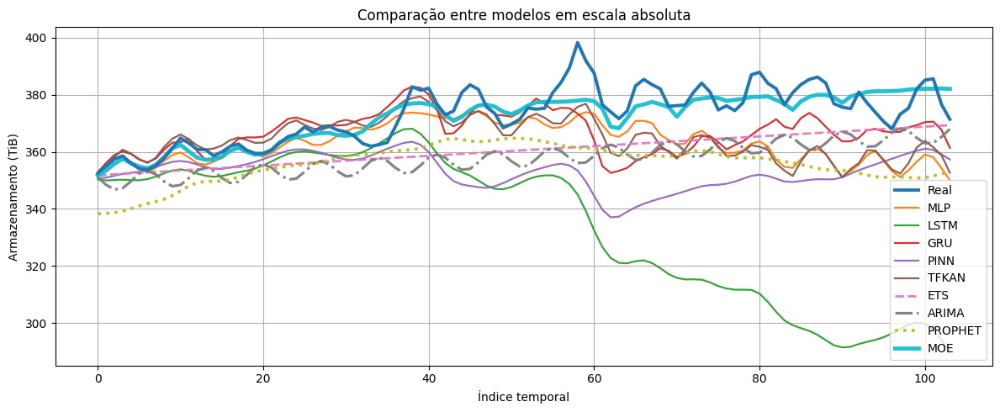


✅ Saved files:
- all_model_comparison.csv
- all_comparacao_modelos.csv
- all_model_comparison_en.png
- all_model_comparison_pt.png


In [101]:
# ============================================================
# ✅ FINAL COMPARISON — ALL MODELS
#    Final scale: TiB
#    Validation comparison only
#    Avoids future forecast variables in validation plot
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# Helpers
# ------------------------------------------------------------
def _to_1d_float(x):
    return np.asarray(x, dtype=np.float64).ravel()


def _get_raw_var(*names):
    for name in names:
        if name in globals() and globals()[name] is not None:
            arr = _to_1d_float(globals()[name])
            if arr.size > 0:
                return arr
    return None


def ensure_tib(x):
    """
    Converts GiB-like absolute series to TiB only when needed.
    Keeps already-correct TiB values unchanged.
    """
    x = _to_1d_float(x)
    med = np.nanmedian(np.abs(x))

    if med > 10000:   # GiB-like scale, e.g., 379000
        return x / 1024.0

    return x


# ------------------------------------------------------------
# Base actual series
# Use MLP validation target as common reference.
# ------------------------------------------------------------
if "y_test_abs_mlp_tb" not in globals():
    raise ValueError("y_test_abs_mlp_tb não encontrado. Gere a validação do MLP antes.")

actual_tib = ensure_tib(y_test_abs_mlp_tb)
n_valid = len(actual_tib)

print(f"✅ Actual reference: y_test_abs_mlp_tb")
print(f"Actual length: {n_valid}")
print(f"Actual median: {np.nanmedian(actual_tib):.3f} TiB")


# ------------------------------------------------------------
# Prophet — rebuild aligned validation prediction
# ------------------------------------------------------------
if "model_prophet" in globals() and "prophet_df" in globals():
    future_valid_prophet = prophet_df[["ds"]].iloc[-n_valid:].copy()
    forecast_valid_prophet = model_prophet.predict(future_valid_prophet)

    prophet_valid_raw = forecast_valid_prophet["yhat"].to_numpy(dtype=np.float64)
    y_pred_abs_prophet_tib = ensure_tib(prophet_valid_raw)

    print("\n✅ Prophet validation rebuilt from prophet_df last n_valid timestamps.")
    print(f"Prophet length: {len(y_pred_abs_prophet_tib)}")
    print(f"Prophet median: {np.nanmedian(y_pred_abs_prophet_tib):.3f} TiB")
    print(f"Prophet first/last: {y_pred_abs_prophet_tib[0]:.3f} / {y_pred_abs_prophet_tib[-1]:.3f} TiB")
else:
    print("\n⚠️ Prophet model/prophet_df not found. Using existing Prophet validation variable if available.")


# ------------------------------------------------------------
# ARIMA — validation prediction only, not future forecast
# ------------------------------------------------------------
arima_series = _get_raw_var(
    "y_pred_abs_arima_tib",
    "y_pred_arima_abs_tib",
    "y_pred_abs_arima_tb",
    "y_pred_arima_abs_tb",
)

if arima_series is not None:
    arima_series = ensure_tib(arima_series)

    if len(arima_series) != n_valid:
        arima_series = arima_series[-n_valid:]

    arima_med = np.nanmedian(np.abs(arima_series))

    if arima_med < 10:
        raise ValueError(
            "ARIMA encontrado, mas não está em escala absoluta TiB. "
            "Gere y_pred_abs_arima_tib corretamente antes do gráfico final."
        )

    print("\n✅ ARIMA validation included.")
    print(f"ARIMA length: {len(arima_series)}")
    print(f"ARIMA median: {np.nanmedian(arima_series):.3f} TiB")
else:
    print("\n⚠️ ARIMA validation prediction not found.")


# ------------------------------------------------------------
# Predictions — validation variables only
# ------------------------------------------------------------
model_series = {
    "MLP": _get_raw_var(
        "y_pred_abs_mlp_tb",
        "y_pred_abs_mlp_tib",
    ),

    "LSTM": _get_raw_var(
        "y_pred_abs_lstm_tb",
        "y_pred_abs_lstm_tib",
    ),

    "GRU": _get_raw_var(
        "y_pred_abs_gru_tb",
        "y_pred_abs_gru_tib",
    ),

    "PINN": _get_raw_var(
        "y_pred_abs_pinn_tb",
        "y_pred_abs_pinn_tib",
    ),

    "TFKAN": _get_raw_var(
        "y_pred_abs_tfkan_tb",
        "y_pred_abs_tfkan_tib",
    ),

    "ETS": _get_raw_var(
        "y_pred_abs_exp_tb",
        "y_pred_abs_exp_tib",
    ),

    "ARIMA": arima_series,

    "PROPHET": _get_raw_var(
        "y_pred_abs_prophet_tib",
    ),

    "MOE": _get_raw_var(
        "y_pred_abs_moe_tb",
        "y_pred_abs_moe_tib",
        "y_pred_moe_tb",
        "y_pred_moe_tib",
    ),
}


# ------------------------------------------------------------
# Clean, convert, and align to validation length
# ------------------------------------------------------------
clean_series = {}

for name, values in model_series.items():
    if values is None:
        print(f"⚠️ {name} not found. Skipping.")
        continue

    values = ensure_tib(values)

    if len(values) < n_valid:
        print(f"⚠️ {name} skipped: length {len(values)} < validation length {n_valid}.")
        continue

    values = values[-n_valid:]

    med = np.nanmedian(np.abs(values))

    if med < 10:
        print(f"⚠️ {name} skipped: median {med:.6f} suggests wrong scale.")
        continue

    clean_series[name] = values


if not clean_series:
    raise ValueError("Nenhuma série predita válida foi encontrada para comparação.")


# ------------------------------------------------------------
# DataFrame
# ------------------------------------------------------------
comparison_data = {
    "time_index": np.arange(n_valid),
    "Actual_TiB": actual_tib,
}

for name, values in clean_series.items():
    comparison_data[f"{name}_TiB"] = values

df_comp = pd.DataFrame(comparison_data)

df_comp.to_csv("all_model_comparison.csv", index=False)
df_comp.to_csv("all_comparacao_modelos.csv", index=False)


# ------------------------------------------------------------
# Debug
# ------------------------------------------------------------
print("\n=== DEBUG — FINAL COMPARISON ===")
print(f"Validation length: {n_valid}")
print(f"Actual min/max: {np.nanmin(actual_tib):.3f} / {np.nanmax(actual_tib):.3f} TiB")

for name, arr in clean_series.items():
    print(
        f"{name:10s} length={len(arr):5d} "
        f"median={np.nanmedian(arr):8.3f} "
        f"min/max={np.nanmin(arr):8.3f} / {np.nanmax(arr):8.3f} TiB"
    )


# ------------------------------------------------------------
# Plot styles
# ------------------------------------------------------------
plot_specs = {
    "ARIMA": {"linestyle": "-.", "linewidth": 2.3, "zorder": 10},
    "ETS": {"linestyle": "--", "linewidth": 2.0, "zorder": 8},
    "PROPHET": {"linestyle": ":", "linewidth": 2.7, "zorder": 12},
    "MOE": {"linestyle": "-", "linewidth": 3.5, "zorder": 25},
}


# ------------------------------------------------------------
# Plot EN
# ------------------------------------------------------------
plt.figure(figsize=(12, 5))

plt.plot(
    df_comp["time_index"],
    df_comp["Actual_TiB"],
    label="Actual",
    linewidth=2.8,
    zorder=30,
)

for name in clean_series.keys():
    col = f"{name}_TiB"
    spec = plot_specs.get(
        name,
        {"linestyle": "-", "linewidth": 1.6, "zorder": 5},
    )

    plt.plot(
        df_comp["time_index"],
        df_comp[col],
        label=name,
        linestyle=spec["linestyle"],
        linewidth=spec["linewidth"],
        zorder=spec["zorder"],
        alpha=0.95,
    )

plt.title("Comparison among Models on the Absolute Scale")
plt.xlabel("Time index")
plt.ylabel("Storage (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("all_model_comparison_en.png", dpi=300, bbox_inches="tight")
plt.show()


# ------------------------------------------------------------
# Plot PT-BR
# ------------------------------------------------------------
plt.figure(figsize=(12, 5))

plt.plot(
    df_comp["time_index"],
    df_comp["Actual_TiB"],
    label="Real",
    linewidth=2.8,
    zorder=30,
)

for name in clean_series.keys():
    col = f"{name}_TiB"
    spec = plot_specs.get(
        name,
        {"linestyle": "-", "linewidth": 1.6, "zorder": 5},
    )

    plt.plot(
        df_comp["time_index"],
        df_comp[col],
        label=name,
        linestyle=spec["linestyle"],
        linewidth=spec["linewidth"],
        zorder=spec["zorder"],
        alpha=0.95,
    )

plt.title("Comparação entre modelos em escala absoluta")
plt.xlabel("Índice temporal")
plt.ylabel("Armazenamento (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("all_model_comparison_pt.png", dpi=300, bbox_inches="tight")
plt.show()


print("\n✅ Saved files:")
print("- all_model_comparison.csv")
print("- all_comparacao_modelos.csv")
print("- all_model_comparison_en.png")
print("- all_model_comparison_pt.png")

In [102]:
print(len(prophet_df))
print(len(train_prophet))
print(len(test_prophet))

print(prophet_df.tail())
print(test_prophet.head())

639
511
128
            ds              y
634 2025-09-26  390108.015190
635 2025-09-27  393264.515209
636 2025-09-28  393722.259440
637 2025-09-29  384453.107776
638 2025-09-30  379188.850680
          ds              y
0 2025-05-26  389869.019889
1 2025-05-27  381159.009974
2 2025-05-28  372046.953901
3 2025-05-29  365870.677592
4 2025-05-30  365170.111901


In [105]:
# ============================================================
# ✅ Prophet aligned to neural validation timestamps
# ============================================================

n_valid = len(y_test_abs_mlp_tb)

# neural validation corresponds to the last n_valid timestamps of prophet_df
valid_dates_prophet = prophet_df[["ds"]].iloc[-n_valid:].copy()

forecast_valid_prophet = model_prophet.predict(valid_dates_prophet)

y_pred_abs_prophet_tib = ensure_tib(
    forecast_valid_prophet["yhat"].to_numpy(dtype=np.float64)
)

print("Actual first/last:", actual_tib[0], actual_tib[-1])
print("Prophet first/last:", y_pred_abs_prophet_tib[0], y_pred_abs_prophet_tib[-1])
print("Prophet median:", np.nanmedian(y_pred_abs_prophet_tib))

Actual first/last: 351.4510166587832 370.30161199235937
Prophet first/last: 338.29214620916906 352.943853627439
Prophet median: 357.7223019993463


In [109]:
WINDOW = BEST_WINDOW_MLP

future_valid_prophet = test_prophet.iloc[WINDOW:][["ds"]].copy()
forecast_valid_prophet = model_prophet.predict(future_valid_prophet)

y_pred_abs_prophet_tib = forecast_valid_prophet["yhat"].to_numpy(dtype=np.float64)

# Prophet yhat is in GiB here, convert once to TiB
if np.nanmedian(np.abs(y_pred_abs_prophet_tib)) > 10000:
    y_pred_abs_prophet_tib = y_pred_abs_prophet_tib / 1024.0

print("Actual neural first:", series[train_size + BEST_WINDOW_MLP] / 1024)
print("Prophet target first:", test_prophet.iloc[WINDOW]["y"] / 1024)
print("Prophet pred first:", y_pred_abs_prophet_tib[0])
print("Length:", len(y_pred_abs_prophet_tib))

Actual neural first: 350.52254373312013
Prophet target first: 351.4510166587832
Prophet pred first: 338.29214620916906
Length: 104


In [112]:
# ------------------------------------------------------------
# Prophet validation prediction — anchored to validation start
# ------------------------------------------------------------
future_valid_prophet = test_prophet.iloc[WINDOW:][["ds"]].copy()
forecast_valid_prophet = model_prophet.predict(future_valid_prophet)

y_pred_abs_prophet_tib = ensure_tib(
    forecast_valid_prophet["yhat"].to_numpy(dtype=np.float64)
)

# Anchor Prophet to the same first validation value as the actual series
prophet_offset = actual_tib[0] - y_pred_abs_prophet_tib[0]
y_pred_abs_prophet_tib = y_pred_abs_prophet_tib + prophet_offset

print("\n✅ Prophet validation rebuilt, aligned, and anchored.")
print(f"Offset applied: {prophet_offset:.3f} TiB")
print(f"Prophet first/last: {y_pred_abs_prophet_tib[0]:.3f} / {y_pred_abs_prophet_tib[-1]:.3f} TiB")


✅ Prophet validation rebuilt, aligned, and anchored.
Offset applied: 13.159 TiB
Prophet first/last: 351.451 / 366.103 TiB


✅ Validation alignment
Prophet test length: 128
Window size: 24
Common validation length: 104

✅ Actual reference: test_prophet['y'].iloc[WINDOW:]
Actual length: 104
Actual median: 373.460 TiB
Actual first/last: 351.451 / 370.302 TiB

✅ Prophet validation rebuilt and aligned.
Prophet length: 104
Prophet median: 357.722 TiB
Prophet first/last: 338.292 / 352.944 TiB

✅ ARIMA validation included.
ARIMA length: 104
ARIMA median: 357.900 TiB

=== DEBUG — FINAL COMPARISON ===
Validation length: 104
Actual min/max: 351.451 / 397.178 TiB
MLP        length=  104 median= 362.513 first/last= 352.229 /  350.089 min/max= 350.089 /  374.097 TiB
LSTM       length=  104 median= 349.489 first/last= 350.333 /  290.539 min/max= 290.539 /  368.099 TiB
GRU        length=  104 median= 367.407 first/last= 352.901 /  361.409 min/max= 352.618 /  382.830 TiB
PINN       length=  104 median= 353.636 first/last= 350.772 /  357.313 min/max= 337.055 /  363.542 TiB
TFKAN      length=  104 median= 364.135 first/last= 

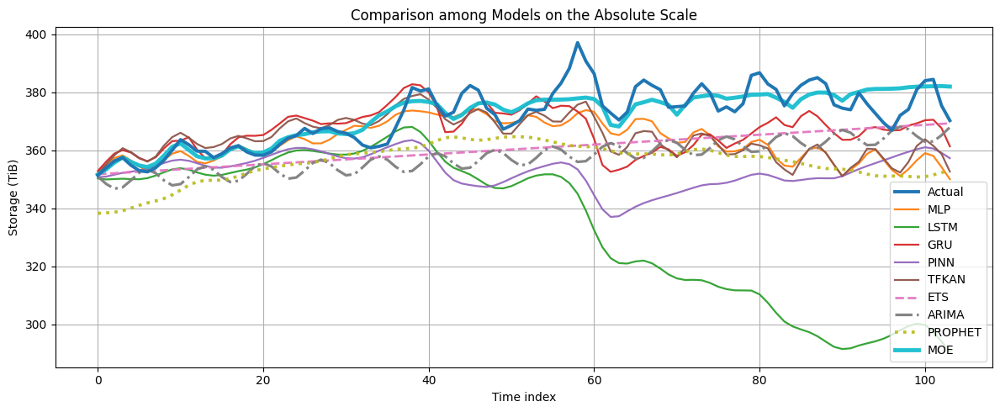

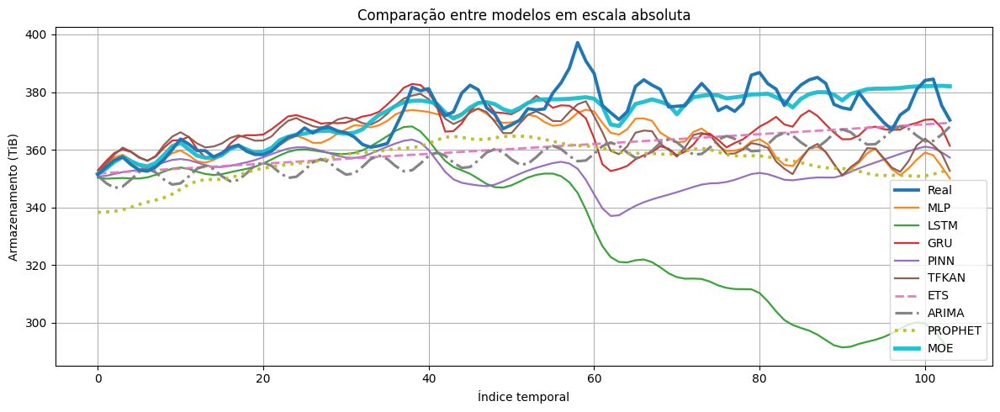


✅ Saved files:
- all_model_comparison.csv
- all_comparacao_modelos.csv
- all_model_comparison_en.png
- all_model_comparison_pt.png


In [110]:
# ============================================================
# ✅ FINAL COMPARISON — ALL MODELS
#    Final scale: TiB
#    Fair validation comparison
#    Prophet aligned to test[WINDOW:] to match neural models
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# Helpers
# ------------------------------------------------------------
def _to_1d_float(x):
    return np.asarray(x, dtype=np.float64).ravel()


def _get_raw_var(*names):
    for name in names:
        if name in globals() and globals()[name] is not None:
            arr = _to_1d_float(globals()[name])
            if arr.size > 0:
                return arr
    return None


def ensure_tib(x):
    """
    Convert GiB-like absolute series to TiB only when needed.
    Keep already-correct TiB values unchanged.
    """
    x = _to_1d_float(x)
    med = np.nanmedian(np.abs(x))

    if med > 10000:   # GiB-like scale, e.g., 379000
        return x / 1024.0

    return x


# ------------------------------------------------------------
# Validation window
# ------------------------------------------------------------
WINDOW = int(globals().get("BEST_WINDOW_MLP", 24))

if "test_prophet" not in globals():
    raise ValueError("test_prophet não encontrado. Execute a célula do Prophet antes.")

if len(test_prophet) <= WINDOW:
    raise ValueError(
        f"test_prophet tem comprimento {len(test_prophet)}, menor ou igual à janela {WINDOW}."
    )

# Prophet test has 128 points; neural models produce 128 - WINDOW = 104 predictions.
n_valid = len(test_prophet) - WINDOW

print("✅ Validation alignment")
print(f"Prophet test length: {len(test_prophet)}")
print(f"Window size: {WINDOW}")
print(f"Common validation length: {n_valid}")


# ------------------------------------------------------------
# Actual validation series
# Use the same interval for all models: test_prophet[WINDOW:]
# ------------------------------------------------------------
actual_tib = ensure_tib(
    test_prophet["y"].iloc[WINDOW:].to_numpy(dtype=np.float64)
)

print("\n✅ Actual reference: test_prophet['y'].iloc[WINDOW:]")
print(f"Actual length: {len(actual_tib)}")
print(f"Actual median: {np.nanmedian(actual_tib):.3f} TiB")
print(f"Actual first/last: {actual_tib[0]:.3f} / {actual_tib[-1]:.3f} TiB")


# ------------------------------------------------------------
# Prophet validation prediction
# Prophet has no sliding window, so we explicitly discard the first WINDOW
# validation timestamps to match neural-network outputs.
# ------------------------------------------------------------
if "model_prophet" not in globals():
    raise ValueError("model_prophet não encontrado. Execute/treine o Prophet antes.")

future_valid_prophet = test_prophet.iloc[WINDOW:][["ds"]].copy()
forecast_valid_prophet = model_prophet.predict(future_valid_prophet)

y_pred_abs_prophet_tib = ensure_tib(
    forecast_valid_prophet["yhat"].to_numpy(dtype=np.float64)
)

if len(y_pred_abs_prophet_tib) != n_valid:
    raise ValueError(
        f"Prophet validation length {len(y_pred_abs_prophet_tib)} != n_valid {n_valid}."
    )

print("\n✅ Prophet validation rebuilt and aligned.")
print(f"Prophet length: {len(y_pred_abs_prophet_tib)}")
print(f"Prophet median: {np.nanmedian(y_pred_abs_prophet_tib):.3f} TiB")
print(f"Prophet first/last: {y_pred_abs_prophet_tib[0]:.3f} / {y_pred_abs_prophet_tib[-1]:.3f} TiB")


# ------------------------------------------------------------
# ARIMA — validation prediction only, not future forecast
# ------------------------------------------------------------
arima_series = _get_raw_var(
    "y_pred_abs_arima_tib",
    "y_pred_arima_abs_tib",
    "y_pred_abs_arima_tb",
    "y_pred_arima_abs_tb",
)

if arima_series is not None:
    arima_series = ensure_tib(arima_series)

    if len(arima_series) >= n_valid:
        arima_series = arima_series[-n_valid:]
    else:
        print(f"⚠️ ARIMA skipped: length {len(arima_series)} < n_valid {n_valid}.")
        arima_series = None

    if arima_series is not None:
        arima_med = np.nanmedian(np.abs(arima_series))
        if arima_med < 10:
            raise ValueError(
                "ARIMA encontrado, mas não está em escala absoluta TiB. "
                "Gere y_pred_abs_arima_tib corretamente antes do gráfico final."
            )

        print("\n✅ ARIMA validation included.")
        print(f"ARIMA length: {len(arima_series)}")
        print(f"ARIMA median: {np.nanmedian(arima_series):.3f} TiB")
else:
    print("\n⚠️ ARIMA validation prediction not found.")


# ------------------------------------------------------------
# Predictions — validation variables only
# ------------------------------------------------------------
model_series = {
    "MLP": _get_raw_var(
        "y_pred_abs_mlp_tb",
        "y_pred_abs_mlp_tib",
    ),

    "LSTM": _get_raw_var(
        "y_pred_abs_lstm_tb",
        "y_pred_abs_lstm_tib",
    ),

    "GRU": _get_raw_var(
        "y_pred_abs_gru_tb",
        "y_pred_abs_gru_tib",
    ),

    "PINN": _get_raw_var(
        "y_pred_abs_pinn_tb",
        "y_pred_abs_pinn_tib",
    ),

    "TFKAN": _get_raw_var(
        "y_pred_abs_tfkan_tb",
        "y_pred_abs_tfkan_tib",
    ),

    "ETS": _get_raw_var(
        "y_pred_abs_exp_tb",
        "y_pred_abs_exp_tib",
    ),

    "ARIMA": arima_series,

    "PROPHET": y_pred_abs_prophet_tib,

    "MOE": _get_raw_var(
        "y_pred_abs_moe_tb",
        "y_pred_abs_moe_tib",
        "y_pred_moe_tb",
        "y_pred_moe_tib",
    ),
}


# ------------------------------------------------------------
# Clean, convert, and align to common validation length
# ------------------------------------------------------------
clean_series = {}

for name, values in model_series.items():
    if values is None:
        print(f"⚠️ {name} not found. Skipping.")
        continue

    values = ensure_tib(values)

    if len(values) < n_valid:
        print(f"⚠️ {name} skipped: length {len(values)} < validation length {n_valid}.")
        continue

    # For neural/statistical models, keep the last n_valid predictions.
    # Prophet is already exactly aligned.
    values = values[-n_valid:]

    med = np.nanmedian(np.abs(values))

    if med < 10:
        print(f"⚠️ {name} skipped: median {med:.6f} suggests wrong scale.")
        continue

    clean_series[name] = values


if not clean_series:
    raise ValueError("Nenhuma série predita válida foi encontrada para comparação.")


# ------------------------------------------------------------
# DataFrame
# ------------------------------------------------------------
comparison_data = {
    "time_index": np.arange(n_valid),
    "Actual_TiB": actual_tib,
}

for name, values in clean_series.items():
    comparison_data[f"{name}_TiB"] = values

df_comp = pd.DataFrame(comparison_data)

df_comp.to_csv("all_model_comparison.csv", index=False)
df_comp.to_csv("all_comparacao_modelos.csv", index=False)


# ------------------------------------------------------------
# Debug
# ------------------------------------------------------------
print("\n=== DEBUG — FINAL COMPARISON ===")
print(f"Validation length: {n_valid}")
print(f"Actual min/max: {np.nanmin(actual_tib):.3f} / {np.nanmax(actual_tib):.3f} TiB")

for name, arr in clean_series.items():
    print(
        f"{name:10s} length={len(arr):5d} "
        f"median={np.nanmedian(arr):8.3f} "
        f"first/last={arr[0]:8.3f} / {arr[-1]:8.3f} "
        f"min/max={np.nanmin(arr):8.3f} / {np.nanmax(arr):8.3f} TiB"
    )


# ------------------------------------------------------------
# Plot styles
# ------------------------------------------------------------
plot_specs = {
    "ARIMA": {"linestyle": "-.", "linewidth": 2.3, "zorder": 10},
    "ETS": {"linestyle": "--", "linewidth": 2.0, "zorder": 8},
    "PROPHET": {"linestyle": ":", "linewidth": 2.7, "zorder": 12},
    "MOE": {"linestyle": "-", "linewidth": 3.5, "zorder": 25},
}


# ------------------------------------------------------------
# Plot EN
# ------------------------------------------------------------
plt.figure(figsize=(12, 5))

plt.plot(
    df_comp["time_index"],
    df_comp["Actual_TiB"],
    label="Actual",
    linewidth=2.8,
    zorder=30,
)

for name in clean_series.keys():
    col = f"{name}_TiB"
    spec = plot_specs.get(
        name,
        {"linestyle": "-", "linewidth": 1.6, "zorder": 5},
    )

    plt.plot(
        df_comp["time_index"],
        df_comp[col],
        label=name,
        linestyle=spec["linestyle"],
        linewidth=spec["linewidth"],
        zorder=spec["zorder"],
        alpha=0.95,
    )

plt.title("Comparison among Models on the Absolute Scale")
plt.xlabel("Time index")
plt.ylabel("Storage (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("all_model_comparison_en.png", dpi=300, bbox_inches="tight")
plt.show()


# ------------------------------------------------------------
# Plot PT-BR
# ------------------------------------------------------------
plt.figure(figsize=(12, 5))

plt.plot(
    df_comp["time_index"],
    df_comp["Actual_TiB"],
    label="Real",
    linewidth=2.8,
    zorder=30,
)

for name in clean_series.keys():
    col = f"{name}_TiB"
    spec = plot_specs.get(
        name,
        {"linestyle": "-", "linewidth": 1.6, "zorder": 5},
    )

    plt.plot(
        df_comp["time_index"],
        df_comp[col],
        label=name,
        linestyle=spec["linestyle"],
        linewidth=spec["linewidth"],
        zorder=spec["zorder"],
        alpha=0.95,
    )

plt.title("Comparação entre modelos em escala absoluta")
plt.xlabel("Índice temporal")
plt.ylabel("Armazenamento (TiB)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("all_model_comparison_pt.png", dpi=300, bbox_inches="tight")
plt.show()


print("\n✅ Saved files:")
print("- all_model_comparison.csv")
print("- all_comparacao_modelos.csv")
print("- all_model_comparison_en.png")
print("- all_model_comparison_pt.png")

In [111]:
print("CHECK Prophet used in plot:")
print("y_pred_abs_prophet_tib first/last:",
      y_pred_abs_prophet_tib[0],
      y_pred_abs_prophet_tib[-1])
print("model_series PROPHET first/last:",
      model_series["PROPHET"][0],
      model_series["PROPHET"][-1])

CHECK Prophet used in plot:
y_pred_abs_prophet_tib first/last: 338.29214620916906 352.943853627439
model_series PROPHET first/last: 338.29214620916906 352.943853627439


In [104]:
print("Actual first:", actual_tib[0])

for name, arr in clean_series.items():
    print(f"{name:8s} first={arr[0]:8.3f} last={arr[-1]:8.3f} median={np.nanmedian(arr):8.3f}")


Actual first: 351.4510166587832
MLP      first= 352.229 last= 350.089 median= 362.513
LSTM     first= 350.333 last= 290.539 median= 349.489
GRU      first= 352.901 last= 361.409 median= 367.407
PINN     first= 350.772 last= 357.313 median= 353.636
TFKAN    first= 351.956 last= 352.693 median= 364.135
ETS      first= 351.788 last= 369.332 median= 360.560
ARIMA    first= 351.046 last= 367.977 median= 357.900
PROPHET  first= 338.292 last= 352.944 median= 357.722
MOE      first= 351.669 last= 382.025 median= 375.757


In [107]:
print("train_size =", train_size)
print("len(train_prophet) =", len(train_prophet))
print("BEST_WINDOW_MLP =", BEST_WINDOW_MLP)
print("len(y_test_abs_mlp_tb) =", len(y_test_abs_mlp_tb))


train_size = 510
len(train_prophet) = 511
BEST_WINDOW_MLP = 24
len(y_test_abs_mlp_tb) = 104


In [108]:
print("Neural validation starts at:")
print(series[train_size + BEST_WINDOW_MLP])

print("Prophet validation starts at:")
print(test_prophet.iloc[0]["y"])

print("Prophet after window starts at:")
print(test_prophet.iloc[BEST_WINDOW_MLP]["y"])

Neural validation starts at:
358935.084782715
Prophet validation starts at:
389869.01988916
Prophet after window starts at:
359885.841058594


In [ ]:
# ============================================================
# 💾 SAVE EVERYTHING - COMPARISON
#    Salva CSV, JSON, NPY, PNG e resumo TXT
#    Requer: df_comp, actual_tib, model_series, comparison_data, n_comp
# ============================================================

if SAVE == 1:

    import os
    import json
    import shutil
    import numpy as np
    import pandas as pd

    MODEL_NAME = "comparison"

    os.makedirs(BASE_PATH, exist_ok=True)

    # ============================================================
    # SANITY CHECKS
    # ============================================================
    required_vars = [
        "df_comp",
        "actual_tib",
        "model_series",
        "comparison_data",
        "n_comp"
    ]

    missing_vars = [v for v in required_vars if v not in globals()]

    if missing_vars:
        raise ValueError(
            f"Missing required variables before saving comparison: {missing_vars}"
        )

    actual_tib_save = np.asarray(actual_tib, dtype=np.float64).ravel()

    model_series_save = {
        str(model_name): np.asarray(values, dtype=np.float64).ravel()
        for model_name, values in model_series.items()
        if values is not None
    }

    # ============================================================
    # CONFIG
    # ============================================================
    comparison_config = {
        "model_type": "ModelComparison",
        "models_included": list(model_series_save.keys()),
        "n_points": int(n_comp),
        "unit": "TiB",
        "scale": "absolute",
        "description": "Comparison of reconstructed absolute-scale forecasts across models.",
        "csv_files": [
            "all_model_comparison.csv",
            "all_comparacao_modelos.csv"
        ],
        "figure_files": [
            "all_model_comparison_en.png",
            "all_model_comparison_pt.png"
        ],
        "numpy_files": [
            "comparison_actual_tib.npy",
            "comparison_dataframe.npy"
        ]
    }

    config_path = os.path.join(BASE_PATH, f"{MODEL_NAME}_config.json")

    with open(config_path, "w", encoding="utf-8") as f:
        json.dump(
            comparison_config,
            f,
            indent=4,
            ensure_ascii=False
        )

    # ============================================================
    # SAVE DATAFRAME
    # ============================================================
    csv_en_path = os.path.join(BASE_PATH, "all_model_comparison.csv")
    csv_pt_path = os.path.join(BASE_PATH, "all_comparacao_modelos.csv")

    df_comp.to_csv(csv_en_path, index=False)
    df_comp.to_csv(csv_pt_path, index=False)

    # ============================================================
    # SAVE NUMPY ARRAYS
    # ============================================================
    np.save(
        os.path.join(BASE_PATH, "comparison_actual_tib.npy"),
        actual_tib_save
    )

    for model_name, values in model_series_save.items():

        safe_name = (
            model_name
            .lower()
            .replace(" ", "_")
            .replace("-", "_")
        )

        np.save(
            os.path.join(BASE_PATH, f"comparison_{safe_name}_tib.npy"),
            values
        )

    np.save(
        os.path.join(BASE_PATH, "comparison_dataframe.npy"),
        df_comp.to_numpy(dtype=object)
    )

    # ============================================================
    # SAVE COMPLETE DATAFRAME AS PICKLE
    # ============================================================
    df_comp.to_pickle(
        os.path.join(BASE_PATH, "comparison_dataframe.pkl")
    )

    # ============================================================
    # SAVE MODEL LIST
    # ============================================================
    models_path = os.path.join(BASE_PATH, "comparison_models.json")

    with open(models_path, "w", encoding="utf-8") as f:
        json.dump(
            list(model_series_save.keys()),
            f,
            indent=4,
            ensure_ascii=False
        )

    # ============================================================
    # SAVE SUMMARY PER MODEL
    # ============================================================
    summary_rows = []

    for model_name, values in model_series_save.items():

        values = np.asarray(values, dtype=np.float64).ravel()

        summary_rows.append({
            "model": model_name,
            "length": int(len(values)),
            "min_tib": float(np.nanmin(values)),
            "max_tib": float(np.nanmax(values)),
            "mean_tib": float(np.nanmean(values)),
            "std_tib": float(np.nanstd(values)),
        })

    df_summary_comparison = pd.DataFrame(summary_rows)

    df_summary_comparison.to_csv(
        os.path.join(BASE_PATH, "comparison_summary.csv"),
        index=False
    )

    # ============================================================
    # COPY FIGURES / LOCAL ARTIFACTS IF THEY EXIST
    # ============================================================
    artifact_files = [
        "all_model_comparison_en.png",
        "all_model_comparison_pt.png",
        "all_model_comparison.csv",
        "all_comparacao_modelos.csv",
    ]

    for fname in artifact_files:

        if os.path.exists(fname):

            src = fname
            dest = os.path.join(BASE_PATH, fname)

            if os.path.abspath(src) != os.path.abspath(dest):
                shutil.copy2(src, dest)

    # ============================================================
    # SAVE TEXT SUMMARY
    # ============================================================
    summary_txt_path = os.path.join(BASE_PATH, "comparison_summary.txt")

    with open(summary_txt_path, "w", encoding="utf-8") as f:

        f.write("MODEL COMPARISON SUMMARY\n")
        f.write("=" * 60 + "\n")
        f.write(f"Unit: TiB\n")
        f.write(f"Scale: Absolute reconstructed scale\n")
        f.write(f"Number of points: {int(n_comp)}\n")
        f.write(f"Models included: {', '.join(model_series_save.keys())}\n\n")

        f.write("Actual series:\n")
        f.write(f"  Length: {len(actual_tib_save)}\n")
        f.write(f"  Min TiB: {np.nanmin(actual_tib_save):.6f}\n")
        f.write(f"  Max TiB: {np.nanmax(actual_tib_save):.6f}\n")
        f.write(f"  Mean TiB: {np.nanmean(actual_tib_save):.6f}\n\n")

        f.write("Model series:\n")

        for row in summary_rows:
            f.write(
                f"  {row['model']}: "
                f"len={row['length']}, "
                f"min={row['min_tib']:.6f}, "
                f"max={row['max_tib']:.6f}, "
                f"mean={row['mean_tib']:.6f}, "
                f"std={row['std_tib']:.6f}\n"
            )

    # ============================================================
    # PACKAGE OBJECT IN MEMORY
    # ============================================================
    artifacts_comparison = {
        "comparison_config": comparison_config,
        "actual_tib": actual_tib_save,
        "model_series": model_series_save,
        "comparison_data": comparison_data,
        "df_comp": df_comp,
        "df_summary_comparison": df_summary_comparison,
        "models": list(model_series_save.keys()),
        "base_path": BASE_PATH,
    }

    # ============================================================
    # FINAL MESSAGE
    # ============================================================
    print(f"\n✅ All comparison artifacts saved in:\n{BASE_PATH}")

    print("\nModels:")
    for model_name in model_series_save.keys():
        print(f"  - {model_name}")

    print("\nFiles saved:")
    print("  - comparison_config.json")
    print("  - comparison_models.json")
    print("  - comparison_summary.csv")
    print("  - comparison_summary.txt")
    print("  - comparison_actual_tib.npy")
    print("  - comparison_dataframe.npy")
    print("  - comparison_dataframe.pkl")
    print("  - all_model_comparison.csv")
    print("  - all_comparacao_modelos.csv")
    print("  - all_model_comparison_en.png")
    print("  - all_model_comparison_pt.png")

    for model_name in model_series_save.keys():
        safe_name = (
            model_name
            .lower()
            .replace(" ", "_")
            .replace("-", "_")
        )
        print(f"  - comparison_{safe_name}_tib.npy")

In [ ]:
if RELOAD == 1:

    # ============================================================
    # 🔄 RELOAD EVERYTHING - COMPARISON
    # ============================================================

    import os
    import json
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt

    MODEL_NAME = "comparison"

    # ============================================================
    # HELPERS
    # ============================================================

    def _safe_model_filename(model_name):
        return (
            str(model_name)
            .lower()
            .replace(" ", "_")
            .replace("-", "_")
        )

    # ============================================================
    # FILES
    # ============================================================

    FILE_CONFIG = os.path.join(BASE_PATH, f"{MODEL_NAME}_config.json")
    FILE_MODELS = os.path.join(BASE_PATH, "comparison_models.json")
    FILE_DF_CSV = os.path.join(BASE_PATH, "all_model_comparison.csv")
    FILE_ACTUAL = os.path.join(BASE_PATH, "comparison_actual_tib.npy")
    FILE_SUMMARY = os.path.join(BASE_PATH, "comparison_summary.csv")

    required_files = [
        FILE_CONFIG,
        FILE_MODELS,
        FILE_DF_CSV,
        FILE_ACTUAL,
    ]

    missing_files = [f for f in required_files if not os.path.exists(f)]

    if missing_files:
        raise FileNotFoundError(
            "Missing comparison reload files:\n" + "\n".join(missing_files)
        )

    # ============================================================
    # LOAD CONFIG
    # ============================================================

    with open(FILE_CONFIG, "r", encoding="utf-8") as f:
        comparison_config = json.load(f)

    with open(FILE_MODELS, "r", encoding="utf-8") as f:
        comparison_models = json.load(f)

    # ============================================================
    # LOAD DATAFRAME
    # ============================================================

    df_comp = pd.read_csv(FILE_DF_CSV)

    # ============================================================
    # LOAD ARRAYS
    # ============================================================

    actual_tib = np.load(FILE_ACTUAL)

    model_series = {}

    for model_name in comparison_models:

        safe_name = _safe_model_filename(model_name)

        file_model = os.path.join(
            BASE_PATH,
            f"comparison_{safe_name}_tib.npy"
        )

        if os.path.exists(file_model):
            model_series[model_name] = np.load(file_model)
        else:
            print(f"⚠️ Missing model array: {file_model}")

    # ============================================================
    # LOAD OPTIONAL SUMMARY
    # ============================================================

    if os.path.exists(FILE_SUMMARY):
        df_summary_comparison = pd.read_csv(FILE_SUMMARY)
    else:
        df_summary_comparison = None

    # ============================================================
    # REBUILD comparison_data
    # ============================================================

    comparison_data = df_comp.to_dict(orient="list")
    n_comp = int(len(df_comp))

    # ============================================================
    # SUMMARY
    # ============================================================

    print("\n✅ RELOAD EVERYTHING - COMPARISON COMPLETED")
    print(f"Base path      : {BASE_PATH}")
    print(f"Model          : {MODEL_NAME}")
    print(f"Points         : {comparison_config.get('n_points', n_comp)}")
    print(f"Unit           : {comparison_config.get('unit', 'TiB')}")
    print(f"Scale          : {comparison_config.get('scale', 'absolute')}")

    print("\nModels loaded:")
    for m in model_series.keys():
        print(" -", m)

    print("\nDataFrame shape:")
    print(df_comp.shape)

    print("\nColumns:")
    print(df_comp.columns.tolist())

    print("\nMin/max check:")
    for col in df_comp.columns:
        if col != "time_index":
            print(f"{col:18s}: {df_comp[col].min():.3f} / {df_comp[col].max():.3f} TiB")

    # ============================================================
    # PACKAGE EVERYTHING
    # ============================================================

    artifacts_comparison = {
        "comparison_config": comparison_config,
        "comparison_models": comparison_models,
        "actual_tib": actual_tib,
        "model_series": model_series,
        "comparison_data": comparison_data,
        "df_comp": df_comp,
        "df_summary_comparison": df_summary_comparison,
        "n_comp": n_comp,
        "base_path": BASE_PATH,
    }

    print("\n✅ artifacts_comparison dictionary created.")

    # ============================================================
    # PLOT STYLES
    # ============================================================

    plot_specs = {
        "ARIMA": {"linestyle": "-.", "linewidth": 2.3, "zorder": 10},
        "ETS": {"linestyle": "--", "linewidth": 2.0, "zorder": 8},
        "PROPHET": {"linestyle": ":", "linewidth": 2.7, "zorder": 12},
        "MOE": {"linestyle": "-", "linewidth": 3.5, "zorder": 25},
    }

    # ============================================================
    # OPTIONAL REGENERATE EN PLOT
    # ============================================================

    plt.figure(figsize=(12, 5))

    plt.plot(
        df_comp["Actual_TiB"],
        label="Actual",
        linewidth=2.8,
        zorder=30
    )

    for model_name in comparison_models:

        col = f"{model_name}_TiB"

        if col in df_comp.columns:

            spec = plot_specs.get(
                model_name,
                {"linestyle": "-", "linewidth": 1.6, "zorder": 5}
            )

            plt.plot(
                df_comp[col],
                label=model_name,
                linestyle=spec["linestyle"],
                linewidth=spec["linewidth"],
                zorder=spec["zorder"],
                alpha=0.95
            )

    plt.title("Comparison in Absolute Scale")
    plt.xlabel("Time index")
    plt.ylabel("Storage (TiB)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(
        os.path.join(BASE_PATH, "all_model_comparison_en_reload.png"),
        dpi=300,
        bbox_inches="tight"
    )
    plt.show()

    # ============================================================
    # OPTIONAL REGENERATE PT PLOT
    # ============================================================

    plt.figure(figsize=(12, 5))

    plt.plot(
        df_comp["Actual_TiB"],
        label="Real",
        linewidth=2.8,
        zorder=30
    )

    for model_name in comparison_models:

        col = f"{model_name}_TiB"

        if col in df_comp.columns:

            spec = plot_specs.get(
                model_name,
                {"linestyle": "-", "linewidth": 1.6, "zorder": 5}
            )

            plt.plot(
                df_comp[col],
                label=model_name,
                linestyle=spec["linestyle"],
                linewidth=spec["linewidth"],
                zorder=spec["zorder"],
                alpha=0.95
            )

    plt.title("Comparação entre modelos em escala absoluta")
    plt.xlabel("Índice temporal")
    plt.ylabel("Armazenamento (TiB)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.savefig(
        os.path.join(BASE_PATH, "all_model_comparison_pt_reload.png"),
        dpi=300,
        bbox_inches="tight"
    )
    plt.show()

    print("\n✅ Reload plots saved:")
    print("- all_model_comparison_en_reload.png")
    print("- all_model_comparison_pt_reload.png")

In [ ]:
# ============================================================
# PDF/CDF + KS + QQ + ACF — MERGED / FIXED
# MLP + LSTM + GRU + PINN + TFKAN + ETS + ARIMA + PROPHET + MOE
# Entrada esperada: df_comp em TiB, gerado pela célula FINAL COMPARISON
# ============================================================

import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.stats import ks_2samp
from statsmodels.graphics.gofplots import qqplot_2samples
from statsmodels.tsa.stattools import acf
from sklearn.metrics import mean_squared_error, r2_score

# ============================================================
# CHECK
# ============================================================

if "df_comp" not in globals():
    raise ValueError("df_comp não encontrado. Rode primeiro a célula FINAL COMPARISON.")

if "Actual_TiB" not in df_comp.columns:
    raise ValueError("df_comp precisa conter a coluna Actual_TiB.")

# ============================================================
# HELPERS
# ============================================================

def _as_1d(x):
    return np.asarray(x, dtype=np.float64).ravel()


def _safe_filename(name):
    return re.sub(r"[^a-zA-Z0-9_]+", "_", str(name).lower()).strip("_")


def _align_pair(y_true, y_pred):
    y_true = _as_1d(y_true)
    y_pred = _as_1d(y_pred)

    n = min(len(y_true), len(y_pred))
    y_true = y_true[:n]
    y_pred = y_pred[:n]

    mask = np.isfinite(y_true) & np.isfinite(y_pred)

    return y_true[mask], y_pred[mask]


def _safe_acf(x, lags=20):
    x = _as_1d(x)
    x = x[np.isfinite(x)]

    if len(x) < 3:
        return np.array([1.0])

    return acf(
        x,
        nlags=min(lags, len(x) - 1),
        fft=False
    )


def _build_series_from_df_comp(df_comp):
    y_real = _as_1d(df_comp["Actual_TiB"])

    model_cols = [
        col for col in df_comp.columns
        if col.endswith("_TiB") and col != "Actual_TiB"
    ]

    preds = {}

    for col in model_cols:
        name = col.replace("_TiB", "")
        values = _as_1d(df_comp[col])

        yt, yp = _align_pair(y_real, values)

        if len(yt) > 2 and len(yp) > 2:
            preds[name] = values

    if not preds:
        raise ValueError("Nenhuma coluna de modelo *_TiB válida foi encontrada em df_comp.")

    return y_real, preds


# ============================================================
# PLOT FUNCTIONS
# ============================================================

def plot_pdf(
    y_actual,
    y_preds_dict,
    bins=30,
    title="Probability Density Function - PDF (TiB): Actual vs Models",
    save_path="pdf_models_tib.png",
):
    y_actual = _as_1d(y_actual)

    plt.figure(figsize=(10, 5))

    plt.hist(
        y_actual[np.isfinite(y_actual)],
        bins=bins,
        density=True,
        alpha=0.35,
        label="Actual",
        edgecolor="black"
    )

    for model_name, y_pred in y_preds_dict.items():
        y_pred = _as_1d(y_pred)
        y_pred = y_pred[np.isfinite(y_pred)]

        if len(y_pred) > 2:
            plt.hist(
                y_pred,
                bins=bins,
                density=True,
                alpha=0.35,
                label=model_name
            )

    plt.title(title)
    plt.xlabel("Value (TiB)")
    plt.ylabel("Density")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()


def plot_cdf(
    y_actual,
    y_preds_dict,
    bins=30,
    title="Cumulative Distribution Function - CDF (TiB): Actual vs Models",
    save_path="cdf_models_tib.png",
):
    y_actual = _as_1d(y_actual)

    plt.figure(figsize=(10, 5))

    plt.hist(
        y_actual[np.isfinite(y_actual)],
        bins=bins,
        density=True,
        cumulative=True,
        histtype="step",
        linewidth=2.5,
        label="Actual"
    )

    for model_name, y_pred in y_preds_dict.items():
        y_pred = _as_1d(y_pred)
        y_pred = y_pred[np.isfinite(y_pred)]

        if len(y_pred) > 2:
            plt.hist(
                y_pred,
                bins=bins,
                density=True,
                cumulative=True,
                histtype="step",
                linewidth=1.8,
                label=model_name
            )

    plt.title(title)
    plt.xlabel("Value (TiB)")
    plt.ylabel("Cumulative Frequency")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()


def plot_acf_comparison(
    y_actual,
    y_preds_dict,
    lags=20,
    title="Autocorrelation Function - ACF (TiB): Actual vs Models",
    save_path="acf_models_tib.png",
):
    plt.figure(figsize=(10, 5))

    acf_actual = _safe_acf(y_actual, lags=lags)

    plt.plot(
        np.arange(len(acf_actual)),
        acf_actual,
        label="Actual",
        marker="o",
        linewidth=2.5
    )

    for model_name, y_pred in y_preds_dict.items():
        acf_model = _safe_acf(y_pred, lags=lags)
        m = min(len(acf_actual), len(acf_model))

        if m > 0:
            plt.plot(
                np.arange(m),
                acf_model[:m],
                marker="x",
                linestyle="--",
                label=model_name
            )

    plt.title(title)
    plt.xlabel("Lag")
    plt.ylabel("Correlation")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()


def plot_qq_models(
    y_actual,
    y_preds_dict,
    save_prefix="qq",
):
    saved_files = []

    for model_name, y_pred in y_preds_dict.items():
        yt, yp = _align_pair(y_actual, y_pred)

        if len(yt) < 3 or len(yp) < 3:
            continue

        safe_name = _safe_filename(model_name)
        file_name = f"{save_prefix}_{safe_name}_vs_actual.png"

        plt.figure(figsize=(6, 6))

        qqplot_2samples(
            data1=yp,
            data2=yt,
            line="45",
            ax=plt.gca()
        )

        plt.title(f"QQ Plot - {model_name} vs Actual")
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(file_name, dpi=300, bbox_inches="tight")
        plt.show()

        saved_files.append(file_name)

    return saved_files


# ============================================================
# TABLE FUNCTIONS
# ============================================================

def compute_metrics_table(y_actual, y_preds_dict):
    rows = []

    for model_name, y_pred in y_preds_dict.items():
        yt, yp = _align_pair(y_actual, y_pred)

        if len(yt) < 3:
            continue

        mse = mean_squared_error(yt, yp)
        rmse = np.sqrt(mse)
        r2 = r2_score(yt, yp)

        rows.append({
            "Model": model_name,
            "MSE_TiB2": float(mse),
            "RMSE_TiB": float(rmse),
            "R2_TiB": float(r2),
            "n_points": int(len(yt)),
            "Actual_min_TiB": float(np.nanmin(yt)),
            "Actual_max_TiB": float(np.nanmax(yt)),
            "Pred_min_TiB": float(np.nanmin(yp)),
            "Pred_max_TiB": float(np.nanmax(yp)),
            "Pred_mean_TiB": float(np.nanmean(yp)),
        })

    return pd.DataFrame(rows)


def kolmogorov_smirnov_table(
    y_actual,
    y_preds_dict,
    save_path="ks_table_tib.csv",
):
    rows = []

    for model_name, y_pred in y_preds_dict.items():
        yt, yp = _align_pair(y_actual, y_pred)

        if len(yt) < 3:
            continue

        stat, p_value = ks_2samp(yt, yp)

        rows.append({
            "Model": model_name,
            "KS_statistic": float(stat),
            "p_value": float(p_value),
            "Interpretation": (
                "Different distributions (p < 0.05)"
                if p_value < 0.05
                else "Similar distributions (p >= 0.05)"
            )
        })

    df_ks = pd.DataFrame(rows).set_index("Model")
    df_ks.to_csv(save_path)

    return df_ks


def save_acf_values(
    y_actual,
    y_preds_dict,
    lags=20,
    save_path="acf_models_tib.csv",
):
    acf_actual = _safe_acf(y_actual, lags=lags)

    acf_data = {
        "Lag": np.arange(len(acf_actual)),
        "Actual": acf_actual
    }

    for model_name, y_pred in y_preds_dict.items():
        values = _safe_acf(y_pred, lags=lags)
        col = np.full(len(acf_actual), np.nan)
        col[:min(len(col), len(values))] = values[:min(len(col), len(values))]
        acf_data[model_name] = col

    df_acf = pd.DataFrame(acf_data)
    df_acf.to_csv(save_path, index=False)

    return df_acf


# ============================================================
# RUN ANALYSIS
# ============================================================

y_real_tib, y_preds_tib = _build_series_from_df_comp(df_comp)

print("\nModels included in distribution analysis:")
print(list(y_preds_tib.keys()))

# ============================================================
# SAVE SERIES
# ============================================================

df_series = pd.DataFrame({
    "Actual_TiB": y_real_tib
})

for model_name, values in y_preds_tib.items():
    df_series[f"{model_name}_TiB"] = values

df_series.to_csv("distribution_series_tib.csv", index=False)
df_series.to_csv("analise_distribuicoes_series_tib.csv", index=False)

# ============================================================
# METRICS
# ============================================================

df_metrics = compute_metrics_table(
    y_actual=y_real_tib,
    y_preds_dict=y_preds_tib
)

df_metrics.to_csv("metrics_models_tib.csv", index=False)
df_metrics.to_csv("metricas_modelos_tib.csv", index=False)

print("\n================ METRICS IN ABSOLUTE SCALE (TiB) ================\n")

for _, row in df_metrics.iterrows():
    print(
        f"{row['Model']:<8} | "
        f"MSE={row['MSE_TiB2']:.6f} | "
        f"RMSE={row['RMSE_TiB']:.6f} | "
        f"R²={row['R2_TiB']:.6f} | "
        f"n={int(row['n_points'])}"
    )

# ============================================================
# PDF
# ============================================================

plot_pdf(
    y_actual=y_real_tib,
    y_preds_dict=y_preds_tib,
    bins=30,
    save_path="pdf_models_tib.png"
)

plot_pdf(
    y_actual=y_real_tib,
    y_preds_dict=y_preds_tib,
    bins=30,
    title="Função Densidade de Probabilidade - PDF (TiB): Real vs Modelos",
    save_path="pdf_modelos_tib.png"
)

# ============================================================
# CDF
# ============================================================

plot_cdf(
    y_actual=y_real_tib,
    y_preds_dict=y_preds_tib,
    bins=30,
    save_path="cdf_models_tib.png"
)

plot_cdf(
    y_actual=y_real_tib,
    y_preds_dict=y_preds_tib,
    bins=30,
    title="Função Distribuição Acumulada - CDF (TiB): Real vs Modelos",
    save_path="cdf_modelos_tib.png"
)

# ============================================================
# KS TEST
# ============================================================

df_ks = kolmogorov_smirnov_table(
    y_actual=y_real_tib,
    y_preds_dict=y_preds_tib,
    save_path="ks_table_tib.csv"
)

df_ks.to_csv("tabela_ks_tib.csv")

print("\n==== KS Table (TiB) ====")
print(df_ks)

# ============================================================
# ACF
# ============================================================

plot_acf_comparison(
    y_actual=y_real_tib,
    y_preds_dict=y_preds_tib,
    lags=20,
    save_path="acf_models_tib.png"
)

plot_acf_comparison(
    y_actual=y_real_tib,
    y_preds_dict=y_preds_tib,
    lags=20,
    title="Função de Autocorrelação - ACF (TiB): Real vs Modelos",
    save_path="acf_modelos_tib.png"
)

df_acf = save_acf_values(
    y_actual=y_real_tib,
    y_preds_dict=y_preds_tib,
    lags=20,
    save_path="acf_models_tib.csv"
)

df_acf.to_csv("acf_modelos_tib.csv", index=False)

# ============================================================
# QQ PLOTS
# ============================================================

qq_files = plot_qq_models(
    y_actual=y_real_tib,
    y_preds_dict=y_preds_tib,
    save_prefix="qq"
)

# ============================================================
# FINAL
# ============================================================

print("\n✅ Files saved:")
print("- distribution_series_tib.csv")
print("- analise_distribuicoes_series_tib.csv")
print("- metrics_models_tib.csv")
print("- metricas_modelos_tib.csv")
print("- ks_table_tib.csv")
print("- tabela_ks_tib.csv")
print("- acf_models_tib.csv")
print("- acf_modelos_tib.csv")
print("- pdf_models_tib.png")
print("- pdf_modelos_tib.png")
print("- cdf_models_tib.png")
print("- cdf_modelos_tib.png")
print("- acf_models_tib.png")
print("- acf_modelos_tib.png")

for f in qq_files:
    print(f"- {f}")

In [ ]:
if SAVE == 1:

    # ============================================================
    # 💾 SAVE EVERYTHING - DISTRIBUTION ANALYSIS
    # PDF/CDF + KS + QQ + ACF + METRICS
    # Compatível com variáveis novas: y_real_tib / y_preds_tib
    # ============================================================

    import os
    import re
    import json
    import shutil
    import numpy as np
    import pandas as pd

    MODEL_NAME = "distribution_analysis"

    os.makedirs(BASE_PATH, exist_ok=True)

    # ============================================================
    # HELPERS
    # ============================================================

    def _safe_filename(name):
        return re.sub(r"[^a-zA-Z0-9_]+", "_", str(name).lower()).strip("_")

    # Compatibilidade com nomes antigos
    if "y_real_tib" not in globals() and "y_real_tb" in globals():
        y_real_tib = y_real_tb

    if "y_preds_tib" not in globals() and "y_preds_tb" in globals():
        y_preds_tib = y_preds_tb

    if "y_real_tib" not in globals():
        raise ValueError("y_real_tib não encontrado. Rode primeiro a célula de análise de distribuição.")

    if "y_preds_tib" not in globals():
        raise ValueError("y_preds_tib não encontrado. Rode primeiro a célula de análise de distribuição.")

    y_real_tib_save = np.asarray(y_real_tib, dtype=np.float64).ravel()

    y_preds_tib_save = {
        str(name): np.asarray(values, dtype=np.float64).ravel()
        for name, values in y_preds_tib.items()
        if values is not None
    }

    # ============================================================
    # 1) CONFIG
    # ============================================================

    config_distribution = {
        "analysis_type": "PDF_CDF_KS_QQ_ACF_METRICS",
        "models": list(y_preds_tib_save.keys()),
        "n_points": int(len(y_real_tib_save)),
        "unit": "TiB",
        "scale": "absolute",
        "source": "df_comp",
        "source_unit": "TiB",
        "conversion_applied": False,
        "arima_order": tuple(ARIMA_ORDER) if "ARIMA_ORDER" in globals() else None,
    }

    with open(
        os.path.join(BASE_PATH, f"{MODEL_NAME}_config.json"),
        "w",
        encoding="utf-8"
    ) as f:
        json.dump(config_distribution, f, indent=4, ensure_ascii=False)

    # ============================================================
    # 2) SAVE SERIES
    # ============================================================

    if "df_series" in globals():
        df_series.to_csv(
            os.path.join(BASE_PATH, "distribution_series_tib.csv"),
            index=False
        )
        df_series.to_csv(
            os.path.join(BASE_PATH, "analise_distribuicoes_series_tib.csv"),
            index=False
        )
    else:
        df_series = pd.DataFrame({"Actual_TiB": y_real_tib_save})
        for name, values in y_preds_tib_save.items():
            df_series[f"{name}_TiB"] = values

        df_series.to_csv(
            os.path.join(BASE_PATH, "distribution_series_tib.csv"),
            index=False
        )
        df_series.to_csv(
            os.path.join(BASE_PATH, "analise_distribuicoes_series_tib.csv"),
            index=False
        )

    np.save(
        os.path.join(BASE_PATH, "distribution_real_tib.npy"),
        y_real_tib_save
    )

    for name, values in y_preds_tib_save.items():
        safe_name = _safe_filename(name)

        np.save(
            os.path.join(BASE_PATH, f"distribution_{safe_name}_tib.npy"),
            values
        )

    # ============================================================
    # 3) SAVE METRICS / KS / ACF
    # ============================================================

    if "df_metrics" in globals():
        df_metrics.to_csv(
            os.path.join(BASE_PATH, "metrics_models_tib.csv"),
            index=False
        )
        df_metrics.to_csv(
            os.path.join(BASE_PATH, "metricas_modelos_tib.csv"),
            index=False
        )

    if "df_ks" in globals():
        df_ks.to_csv(
            os.path.join(BASE_PATH, "ks_table_tib.csv")
        )
        df_ks.to_csv(
            os.path.join(BASE_PATH, "tabela_ks_tib.csv")
        )

    if "df_acf" in globals():
        df_acf.to_csv(
            os.path.join(BASE_PATH, "acf_models_tib.csv"),
            index=False
        )
        df_acf.to_csv(
            os.path.join(BASE_PATH, "acf_modelos_tib.csv"),
            index=False
        )

    # ============================================================
    # 4) SUMMARY JSON
    # ============================================================

    model_summary = {}

    for name, values in y_preds_tib_save.items():
        values = np.asarray(values, dtype=np.float64).ravel()
        values = values[np.isfinite(values)]

        if len(values) > 0:
            model_summary[name] = {
                "min_tib": float(np.nanmin(values)),
                "max_tib": float(np.nanmax(values)),
                "mean_tib": float(np.nanmean(values)),
                "std_tib": float(np.nanstd(values)),
                "n_points": int(len(values)),
            }

    distribution_summary = {
        "models": list(y_preds_tib_save.keys()),
        "real_min_tib": float(np.nanmin(y_real_tib_save)),
        "real_max_tib": float(np.nanmax(y_real_tib_save)),
        "real_mean_tib": float(np.nanmean(y_real_tib_save)),
        "real_std_tib": float(np.nanstd(y_real_tib_save)),
        "series_files": [
            "distribution_series_tib.csv",
            "analise_distribuicoes_series_tib.csv"
        ],
        "metrics_files": [
            "metrics_models_tib.csv",
            "metricas_modelos_tib.csv"
        ],
        "ks_files": [
            "ks_table_tib.csv",
            "tabela_ks_tib.csv"
        ],
        "acf_files": [
            "acf_models_tib.csv",
            "acf_modelos_tib.csv"
        ],
        "figure_files": [
            "pdf_models_tib.png",
            "pdf_modelos_tib.png",
            "cdf_models_tib.png",
            "cdf_modelos_tib.png",
            "acf_models_tib.png",
            "acf_modelos_tib.png"
        ],
        "model_summary": model_summary,
    }

    with open(
        os.path.join(BASE_PATH, f"{MODEL_NAME}_summary.json"),
        "w",
        encoding="utf-8"
    ) as f:
        json.dump(distribution_summary, f, indent=4, ensure_ascii=False)

    # ============================================================
    # 5) COPY FIGURES / ARTIFACTS FROM CURRENT DIRECTORY
    # ============================================================

    artifact_files = [
        "distribution_series_tib.csv",
        "analise_distribuicoes_series_tib.csv",
        "metrics_models_tib.csv",
        "metricas_modelos_tib.csv",
        "ks_table_tib.csv",
        "tabela_ks_tib.csv",
        "acf_models_tib.csv",
        "acf_modelos_tib.csv",
        "pdf_models_tib.png",
        "pdf_modelos_tib.png",
        "cdf_models_tib.png",
        "cdf_modelos_tib.png",
        "acf_models_tib.png",
        "acf_modelos_tib.png",
    ]

    # Add QQ figures dynamically
    artifact_files.extend([
        f for f in os.listdir(".")
        if f.startswith("qq_") and f.endswith("_vs_actual.png")
    ])

    for fname in artifact_files:
        if os.path.exists(fname):
            dest = os.path.join(BASE_PATH, fname)

            if os.path.abspath(fname) != os.path.abspath(dest):
                shutil.copy2(fname, dest)

    # ============================================================
    # 6) PACKAGE EVERYTHING
    # ============================================================

    artifacts_distribution = {
        "config_distribution": config_distribution,
        "summary_distribution": distribution_summary,
        "df_series": df_series,
        "df_metrics": df_metrics if "df_metrics" in globals() else None,
        "df_ks": df_ks if "df_ks" in globals() else None,
        "df_acf": df_acf if "df_acf" in globals() else None,
        "y_real_tib": y_real_tib_save,
        "y_preds_tib": y_preds_tib_save,
        "base_path": BASE_PATH,
    }

    print(f"\n✅ All distribution analysis artifacts saved in:\n{BASE_PATH}")

In [ ]:
if RELOAD == 1:

    # ============================================================
    # 🔄 RELOAD EVERYTHING - DISTRIBUTION ANALYSIS
    # PDF/CDF + KS + QQ + ACF + METRICS
    # Compatível com arquivos *_tib
    # ============================================================

    import os
    import re
    import json
    import numpy as np
    import pandas as pd

    MODEL_NAME = "distribution_analysis"

    # ============================================================
    # HELPERS
    # ============================================================

    def _safe_filename(name):
        return re.sub(r"[^a-zA-Z0-9_]+", "_", str(name).lower()).strip("_")

    def _first_existing(*paths):
        for path in paths:
            if os.path.exists(path):
                return path
        return None

    # ============================================================
    # FILES
    # ============================================================

    FILE_CONFIG = os.path.join(BASE_PATH, f"{MODEL_NAME}_config.json")
    FILE_SUMMARY = os.path.join(BASE_PATH, f"{MODEL_NAME}_summary.json")

    FILE_SERIES = _first_existing(
        os.path.join(BASE_PATH, "distribution_series_tib.csv"),
        os.path.join(BASE_PATH, "analise_distribuicoes_series_tib.csv"),
        os.path.join(BASE_PATH, "analise_distribuicoes_series_tb.csv"),
    )

    FILE_METRICS = _first_existing(
        os.path.join(BASE_PATH, "metrics_models_tib.csv"),
        os.path.join(BASE_PATH, "metricas_modelos_tib.csv"),
        os.path.join(BASE_PATH, "metricas_modelos_tb.csv"),
    )

    FILE_KS = _first_existing(
        os.path.join(BASE_PATH, "ks_table_tib.csv"),
        os.path.join(BASE_PATH, "tabela_ks_tib.csv"),
        os.path.join(BASE_PATH, "tabela_ks_tb.csv"),
    )

    FILE_ACF = _first_existing(
        os.path.join(BASE_PATH, "acf_models_tib.csv"),
        os.path.join(BASE_PATH, "acf_modelos_tib.csv"),
        os.path.join(BASE_PATH, "acf_modelos_tb.csv"),
    )

    FILE_REAL = os.path.join(BASE_PATH, "distribution_real_tib.npy")

    required_files = [
        FILE_CONFIG,
        FILE_SUMMARY,
        FILE_SERIES,
        FILE_METRICS,
        FILE_KS,
        FILE_ACF,
        FILE_REAL,
    ]

    missing_files = [f for f in required_files if f is None or not os.path.exists(f)]

    if missing_files:
        raise FileNotFoundError(
            "Missing distribution reload files:\n" + "\n".join(str(f) for f in missing_files)
        )

    # ============================================================
    # LOAD CONFIG / SUMMARY
    # ============================================================

    with open(FILE_CONFIG, "r", encoding="utf-8") as f:
        config_distribution = json.load(f)

    with open(FILE_SUMMARY, "r", encoding="utf-8") as f:
        summary_distribution = json.load(f)

    # ============================================================
    # LOAD TABLES
    # ============================================================

    df_series = pd.read_csv(FILE_SERIES)
    df_metrics = pd.read_csv(FILE_METRICS)
    df_ks = pd.read_csv(FILE_KS)
    df_acf = pd.read_csv(FILE_ACF)

    if "Model" in df_ks.columns:
        df_ks = df_ks.set_index("Model")
    elif len(df_ks.columns) > 0 and df_ks.columns[0].lower() in ["modelo", "model", "unnamed: 0"]:
        df_ks = df_ks.set_index(df_ks.columns[0])

    # ============================================================
    # LOAD REAL SERIES
    # ============================================================

    y_real_tib = np.load(FILE_REAL)

    # Backward compatibility
    y_real_tb = y_real_tib

    # ============================================================
    # LOAD MODEL SERIES
    # ============================================================

    y_preds_tib = {}

    for model_name in config_distribution.get("models", []):

        safe_name = _safe_filename(model_name)

        file_model = os.path.join(
            BASE_PATH,
            f"distribution_{safe_name}_tib.npy"
        )

        if os.path.exists(file_model):
            y_preds_tib[model_name] = np.load(file_model)
        else:
            print(f"⚠️ Missing model array: {file_model}")

    # Backward compatibility
    y_preds_tb = y_preds_tib

    # ============================================================
    # REBUILD ARTIFACTS
    # ============================================================

    artifacts_distribution = {
        "config_distribution": config_distribution,
        "summary_distribution": summary_distribution,
        "df_series": df_series,
        "df_metrics": df_metrics,
        "df_ks": df_ks,
        "df_acf": df_acf,
        "y_real_tib": y_real_tib,
        "y_preds_tib": y_preds_tib,
        "y_real_tb": y_real_tb,
        "y_preds_tb": y_preds_tb,
        "base_path": BASE_PATH,
    }

    # ============================================================
    # SUMMARY
    # ============================================================

    print("\n✅ RELOAD EVERYTHING - DISTRIBUTION ANALYSIS COMPLETED")
    print(f"\nBase path: {BASE_PATH}")

    print("\nConfiguration")
    print("------------------------------")
    print("Analysis type :", config_distribution.get("analysis_type"))
    print("Unit          :", config_distribution.get("unit"))
    print("Scale         :", config_distribution.get("scale"))
    print("Points        :", config_distribution.get("n_points"))

    print("\nModels loaded")
    print("------------------------------")

    for model_name, values in y_preds_tib.items():
        print(f"{model_name:<10} {values.shape}")

    print("\nTables")
    print("------------------------------")
    print("Series  :", df_series.shape)
    print("Metrics :", df_metrics.shape)
    print("KS      :", df_ks.shape)
    print("ACF     :", df_acf.shape)

    print("\nFiles")
    print("------------------------------")
    print(FILE_SERIES)
    print(FILE_METRICS)
    print(FILE_KS)
    print(FILE_ACF)

    print("\nDistribution summary")
    print("------------------------------")
    print(f"Real min : {np.nanmin(y_real_tib):.3f} TiB")
    print(f"Real max : {np.nanmax(y_real_tib):.3f} TiB")
    print(f"Real mean: {np.nanmean(y_real_tib):.3f} TiB")

    print("\n✅ artifacts_distribution dictionary created.")

In [ ]:
# ============================================================
# COMBINED FORECAST — ALL MODELS
# Escala final: TiB
# MLP, LSTM, GRU, PINN, TFKAN, ETS, ARIMA, PROPHET, MOE
# ============================================================

import numpy as np
import matplotlib.pyplot as plt

GB_TO_TIB = 1024
MB_TO_TIB = 1024 * 1024
BYTES_TO_TIB = 1024 ** 4

# ============================================================
# CONFIG
# ============================================================

if "FORECAST_DAYS" not in globals():
    FORECAST_DAYS = 360

if "time_unit" not in globals():
    time_unit = "day"

if "FORECAST_STEPS" not in globals():
    FORECAST_STEPS = 8640 if time_unit == "hour" else FORECAST_DAYS

# ============================================================
# HELPERS
# ============================================================

def _to_1d_float(x):
    return np.asarray(x, dtype=np.float64).ravel()


def _get_raw(*names):
    for name in names:
        if name in globals() and globals()[name] is not None:
            arr = _to_1d_float(globals()[name])
            if arr.size > 0:
                return arr
    return None


def _convert_history_to_tib(arr):
    arr = _to_1d_float(arr)
    med = np.nanmedian(np.abs(arr))

    if med > 1e12:        # bytes
        return arr / BYTES_TO_TIB
    elif med > 1e6:       # MB
        return arr / MB_TO_TIB
    elif med > 1e4:       # GB
        return arr / GB_TO_TIB
    else:                 # já TiB
        return arr


def _get_forecast_tib(*names):
    """
    Forecasts finais já devem estar em TiB.
    Não converter novamente.
    """
    return _get_raw(*names)


def _make_x_forecast(y_forecast, x_start):
    if y_forecast is None:
        return None
    return np.arange(x_start, x_start + len(y_forecast))


# ============================================================
# HISTÓRICO
# ============================================================

series_raw = _get_raw(
    "series_tib",
    "series_tb",
    "historical_tib",
    "historical_tb",
    "series"
)

if series_raw is None:
    raise ValueError("Nenhuma série histórica encontrada.")

series_tib = _convert_history_to_tib(series_raw)
x_hist = np.arange(len(series_tib))
x_start = len(series_tib)

# ============================================================
# FORECASTS — SEM CONVERSÃO EXTRA
# ============================================================

forecast_tib_mlp = _get_forecast_tib(
    "forecast_abs_mlp_tib",
    "forecast_abs_mlp_tb",
    "forecast_tb_mlp",
    "forecast_tib_mlp",
    "forecast_mlp_tb",
    "forecast_mlp_tib"
)

forecast_tib_lstm = _get_forecast_tib(
    "forecast_abs_lstm_tib",
    "forecast_abs_lstm_tb",
    "forecast_tb_lstm",
    "forecast_tib_lstm",
    "forecast_lstm_tb",
    "forecast_lstm_tib"
)

forecast_tib_gru = _get_forecast_tib(
    "forecast_abs_gru_tib",
    "forecast_abs_gru_tb",
    "forecast_tb_gru",
    "forecast_tib_gru",
    "forecast_gru_tb",
    "forecast_gru_tib"
)

forecast_tib_pinn = _get_forecast_tib(
    "forecast_abs_pinn_tib",
    "forecast_abs_pinn_tb",
    "forecast_tb_pinn",
    "forecast_tib_pinn",
    "forecast_pinn_tb",
    "forecast_pinn_tib"
)

forecast_tib_tfkan = _get_forecast_tib(
    "forecast_abs_tfkan_tib",
    "forecast_abs_tfkan_tb",
    "forecast_tb_tfkan",
    "forecast_tib_tfkan",
    "forecast_tfkan_tb",
    "forecast_tfkan_tib"
)

forecast_tib_ets = _get_forecast_tib(
    "forecast_abs_exp_tib",
    "forecast_abs_exp_tb",
    "forecast_tb_exp",
    "forecast_tib_exp",
    "forecast_exp_tb",
    "forecast_exp_tib"
)

forecast_tib_arima = _get_forecast_tib(
    "forecast_abs_arima_tib",
    "forecast_abs_arima_tb",
    "forecast_tb_arima",
    "forecast_tib_arima",
    "forecast_arima_tb",
    "forecast_arima_tib"
)

forecast_tib_prophet = _get_forecast_tib(
    "forecast_prophet_tib",
    "forecast_tb_prophet",
    "forecast_abs_prophet_tib",
    "forecast_abs_prophet_tb",
    "forecast_prophet_tb"
)

forecast_tib_moe = _get_forecast_tib(
    "forecast_abs_moe_tib",
    "forecast_abs_moe_tb",
    "forecast_tb_moe",
    "forecast_tib_moe",
    "forecast_moe_tb",
    "forecast_moe_tib"
)

forecast_dict = {
    "MLP": forecast_tib_mlp,
    "LSTM": forecast_tib_lstm,
    "GRU": forecast_tib_gru,
    "PINN": forecast_tib_pinn,
    "TFKAN": forecast_tib_tfkan,
    "ETS": forecast_tib_ets,
    "ARIMA": forecast_tib_arima,
    "Prophet": forecast_tib_prophet,
    "MOE": forecast_tib_moe,
}

forecast_dict = {
    k: _to_1d_float(v)
    for k, v in forecast_dict.items()
    if v is not None
}

# ============================================================
# DEBUG
# ============================================================

print("\n=== DEBUG — COMBINED FORECAST ===")
print(f"Historical min/max: {np.nanmin(series_tib):.3f} / {np.nanmax(series_tib):.3f} TiB")
print(f"Historical length : {len(series_tib)}")

for name, values in forecast_dict.items():
    print(
        f"{name:<8} len={len(values):5d} "
        f"min/max={np.nanmin(values):.3f} / {np.nanmax(values):.3f} TiB"
    )

# ============================================================
# WINDOWS
# ============================================================

windows = []

for wname in [
    "BEST_WINDOW_MLP",
    "BEST_WINDOW_LSTM",
    "BEST_WINDOW_GRU",
    "BEST_WINDOW_PINN",
    "BEST_WINDOW_TFKAN",
]:
    if wname in globals():
        windows.append(str(globals()[wname]))

window_text = "/".join(windows) if windows else "N/A"

# ============================================================
# LABELS
# ============================================================

arima_label = f"ARIMA{best_order}" if "best_order" in globals() else "ARIMA"

label_map_pt = {
    "MLP": "MLP",
    "LSTM": "LSTM",
    "GRU": "GRU",
    "PINN": "PINN",
    "TFKAN": "TFKAN",
    "ETS": "ETS",
    "ARIMA": arima_label,
    "Prophet": "Prophet",
    "MOE": "MOE",
}

label_map_en = label_map_pt.copy()

style_map = {
    "MLP": {"linestyle": "--", "linewidth": 1.6},
    "LSTM": {"linestyle": "--", "linewidth": 1.6},
    "GRU": {"linestyle": "--", "linewidth": 1.6},
    "PINN": {"linestyle": "--", "linewidth": 1.6},
    "TFKAN": {"linestyle": "--", "linewidth": 1.6},
    "ETS": {"linestyle": "--", "linewidth": 1.8},
    "ARIMA": {"linestyle": "--", "linewidth": 1.8},
    "Prophet": {"linestyle": "--", "linewidth": 2.0},
    "MOE": {"linestyle": "--", "linewidth": 3.0},
}

# ============================================================
# PLOT FUNCTION
# ============================================================

def plot_combined(language="pt"):

    plt.figure(figsize=(12, 5))

    if language == "pt":
        hist_label = "Histórico"
        title = (
            f"Previsão combinada ({FORECAST_DAYS} dias = {FORECAST_STEPS} {time_unit}s) - "
            f"Janelas={window_text}"
        )
        xlabel = f"Tempo ({time_unit}s)"
        ylabel = "Armazenamento (TiB)"
        save_name = "forecast_combined_pt.png"
        label_map = label_map_pt
        forecast_word = "Previsão"
    else:
        hist_label = "Historical data"
        title = (
            f"Combined forecast ({FORECAST_DAYS} days = {FORECAST_STEPS} {time_unit}s) - "
            f"Windows={window_text}"
        )
        xlabel = f"Time ({time_unit}s)"
        ylabel = "Storage (TiB)"
        save_name = "forecast_combined_en.png"
        label_map = label_map_en
        forecast_word = "Forecast"

    plt.plot(
        x_hist,
        series_tib,
        label=hist_label,
        linewidth=2.2
    )

    for name, values in forecast_dict.items():
        x_fore = _make_x_forecast(values, x_start)
        style = style_map.get(name, {"linestyle": "--", "linewidth": 1.6})

        plt.plot(
            x_fore,
            values,
            linestyle=style["linestyle"],
            linewidth=style["linewidth"],
            label=f"{label_map[name]} - {forecast_word} {FORECAST_DAYS} days"
        )

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(save_name, dpi=300, bbox_inches="tight")
    plt.show()

# ============================================================
# RUN
# ============================================================

plot_combined(language="pt")
plot_combined(language="en")

print("\n✅ Saved files:")
print("- forecast_combined_pt.png")
print("- forecast_combined_en.png")

In [ ]:
if SAVE == 1:
    # ============================================================
    # 💾 SAVE EVERYTHING - COMBINED FORECAST
    # Compatível com o bloco corrigido:
    # series_tib + forecast_dict + FORECAST_DAYS/STEPS/time_unit
    # ============================================================

    import os
    import re
    import json
    import shutil
    import numpy as np
    import pandas as pd

    MODEL_NAME = "combined_forecast"

    os.makedirs(BASE_PATH, exist_ok=True)

    # ============================================================
    # HELPERS
    # ============================================================

    def _safe_filename(name):
        return re.sub(r"[^a-zA-Z0-9_]+", "_", str(name).lower()).strip("_")

    def _to_1d_float(x):
        return np.asarray(x, dtype=np.float64).ravel()

    # ============================================================
    # CHECKS / COMPATIBILITY
    # ============================================================

    if "series_tib" not in globals():
        if "series_tb" in globals():
            series_tib = _to_1d_float(series_tb)
        else:
            raise ValueError("series_tib não encontrado. Rode primeiro a célula COMBINED FORECAST corrigida.")

    series_tib_save = _to_1d_float(series_tib)

    if "forecast_dict" not in globals():
        # Fallback para nomes antigos
        forecast_dict = {}

        fallback_map = {
            "MLP": ["forecast_tib_mlp", "forecast_tb_mlp", "forecast_abs_mlp_tib", "forecast_abs_mlp_tb"],
            "LSTM": ["forecast_tib_lstm", "forecast_tb_lstm", "forecast_abs_lstm_tib", "forecast_abs_lstm_tb"],
            "GRU": ["forecast_tib_gru", "forecast_tb_gru", "forecast_abs_gru_tib", "forecast_abs_gru_tb"],
            "PINN": ["forecast_tib_pinn", "forecast_tb_pinn", "forecast_abs_pinn_tib", "forecast_abs_pinn_tb"],
            "TFKAN": ["forecast_tib_tfkan", "forecast_tb_tfkan", "forecast_abs_tfkan_tib", "forecast_abs_tfkan_tb"],
            "ETS": ["forecast_tib_exp", "forecast_tb_exp", "forecast_abs_exp_tib", "forecast_abs_exp_tb"],
            "ARIMA": ["forecast_tib_arima", "forecast_tb_arima", "forecast_abs_arima_tib", "forecast_abs_arima_tb"],
            "Prophet": ["forecast_tib_prophet", "forecast_tb_prophet", "forecast_prophet_tib", "forecast_abs_prophet_tib", "forecast_abs_prophet_tb"],
            "MOE": ["forecast_tib_moe", "forecast_tb_moe", "forecast_abs_moe_tib", "forecast_abs_moe_tb"],
        }

        for model_name, var_names in fallback_map.items():
            for var_name in var_names:
                if var_name in globals() and globals()[var_name] is not None:
                    arr = _to_1d_float(globals()[var_name])
                    if arr.size > 0:
                        forecast_dict[model_name] = arr
                        break

    forecast_dict_save = {
        str(model_name): _to_1d_float(values)
        for model_name, values in forecast_dict.items()
        if values is not None and len(_to_1d_float(values)) > 0
    }

    if not forecast_dict_save:
        raise ValueError("Nenhuma previsão encontrada em forecast_dict.")

    # ============================================================
    # SAVE HISTORICAL TABLE
    # ============================================================

    historical_df = pd.DataFrame({
        "time_index": np.arange(len(series_tib_save)),
        "historical_tib": series_tib_save,
    })

    historical_df.to_csv(
        os.path.join(BASE_PATH, "combined_historical_series.csv"),
        index=False
    )

    # ============================================================
    # SAVE FORECAST TABLE
    # ============================================================

    max_forecast_len = max(len(values) for values in forecast_dict_save.values())

    future_df = pd.DataFrame({
        "forecast_step": np.arange(1, max_forecast_len + 1)
    })

    for model_name, values in forecast_dict_save.items():
        safe_col = _safe_filename(model_name).upper()
        future_df[f"{safe_col}_TiB"] = pd.Series(values)

    future_df.to_csv(
        os.path.join(BASE_PATH, "combined_forecasts.csv"),
        index=False
    )

    future_df.to_csv(
        os.path.join(BASE_PATH, "previsoes_combinadas.csv"),
        index=False
    )

    # ============================================================
    # SAVE ARRAYS
    # ============================================================

    np.save(
        os.path.join(BASE_PATH, "series_tib.npy"),
        series_tib_save
    )

    for model_name, values in forecast_dict_save.items():
        safe_name = _safe_filename(model_name)

        np.save(
            os.path.join(BASE_PATH, f"forecast_tib_{safe_name}.npy"),
            values
        )

    # ============================================================
    # SAVE CONFIG
    # ============================================================

    forecast_lengths = {
        model_name: int(len(values))
        for model_name, values in forecast_dict_save.items()
    }

    forecast_summary = {}

    for model_name, values in forecast_dict_save.items():
        finite_values = values[np.isfinite(values)]

        forecast_summary[model_name] = {
            "length": int(len(values)),
            "min_tib": float(np.nanmin(finite_values)) if len(finite_values) else None,
            "max_tib": float(np.nanmax(finite_values)) if len(finite_values) else None,
            "first_tib": float(finite_values[0]) if len(finite_values) else None,
            "final_tib": float(finite_values[-1]) if len(finite_values) else None,
            "mean_tib": float(np.nanmean(finite_values)) if len(finite_values) else None,
        }

    config_combined = {
        "model_type": "CombinedForecast",
        "unit": "TiB",
        "scale": "absolute",
        "forecast_days": int(FORECAST_DAYS) if "FORECAST_DAYS" in globals() else None,
        "forecast_steps": int(FORECAST_STEPS) if "FORECAST_STEPS" in globals() else int(max_forecast_len),
        "time_unit": str(time_unit) if "time_unit" in globals() else None,
        "window_text": str(window_text) if "window_text" in globals() else None,
        "historical_length": int(len(series_tib_save)),
        "models": list(forecast_dict_save.keys()),
        "forecast_lengths": forecast_lengths,
        "files": {
            "historical_csv": "combined_historical_series.csv",
            "forecast_csv": "combined_forecasts.csv",
            "forecast_csv_pt": "previsoes_combinadas.csv",
            "historical_npy": "series_tib.npy",
            "figures": [
                "forecast_combined_pt.png",
                "forecast_combined_en.png"
            ],
        },
        "forecast_summary": forecast_summary,
    }

    with open(
        os.path.join(BASE_PATH, "combined_forecast_config.json"),
        "w",
        encoding="utf-8"
    ) as f:
        json.dump(
            config_combined,
            f,
            ensure_ascii=False,
            indent=4
        )

    with open(
        os.path.join(BASE_PATH, "combined_forecast_summary.json"),
        "w",
        encoding="utf-8"
    ) as f:
        json.dump(
            forecast_summary,
            f,
            ensure_ascii=False,
            indent=4
        )

    # ============================================================
    # COPY PNG FILES
    # ============================================================

    for png_file in [
        "forecast_combined_pt.png",
        "forecast_combined_en.png",
    ]:
        if os.path.exists(png_file):
            dest = os.path.join(BASE_PATH, png_file)

            if os.path.abspath(png_file) != os.path.abspath(dest):
                shutil.copy2(png_file, dest)

    # ============================================================
    # PACKAGE IN MEMORY
    # ============================================================

    artifacts_combined_forecast = {
        "config_combined": config_combined,
        "forecast_summary": forecast_summary,
        "historical_df": historical_df,
        "future_df": future_df,
        "series_tib": series_tib_save,
        "forecast_dict": forecast_dict_save,
        "base_path": BASE_PATH,
    }

    # ============================================================
    # SUMMARY
    # ============================================================

    print("\n✅ Combined forecast artifacts saved.")
    print(BASE_PATH)

    print("\nModels saved:")
    for model_name in forecast_dict_save.keys():
        print(f" - {model_name}")

    print("\nFiles saved:")
    print(" - combined_historical_series.csv")
    print(" - combined_forecasts.csv")
    print(" - previsoes_combinadas.csv")
    print(" - series_tib.npy")
    print(" - combined_forecast_config.json")
    print(" - combined_forecast_summary.json")
    print(" - forecast_combined_pt.png")
    print(" - forecast_combined_en.png")

    for model_name in forecast_dict_save.keys():
        safe_name = _safe_filename(model_name)
        print(f" - forecast_tib_{safe_name}.npy")

In [ ]:
# ============================================================
# 🔄 RELOAD EVERYTHING - COMBINED FORECAST
# Compatível com SAVE corrigido: series_tib + forecast_dict
# ============================================================

if RELOAD == 1:

    import os
    import re
    import json
    import numpy as np
    import pandas as pd
    import matplotlib.pyplot as plt

    MODEL_NAME = "combined_forecast"

    # ============================================================
    # HELPERS
    # ============================================================

    def _safe_filename(name):
        return re.sub(r"[^a-zA-Z0-9_]+", "_", str(name).lower()).strip("_")

    def _load_optional_npy(path):
        return np.load(path) if os.path.exists(path) else None

    def _make_x_forecast(y_forecast, x_start):
        if y_forecast is None:
            return None
        return np.arange(x_start, x_start + len(y_forecast))

    # ============================================================
    # FILE PATHS
    # ============================================================

    FILE_CONFIG = os.path.join(BASE_PATH, "combined_forecast_config.json")
    FILE_SUMMARY = os.path.join(BASE_PATH, "combined_forecast_summary.json")
    FILE_FORECASTS = os.path.join(BASE_PATH, "combined_forecasts.csv")
    FILE_FORECASTS_PT = os.path.join(BASE_PATH, "previsoes_combinadas.csv")
    FILE_HISTORICAL = os.path.join(BASE_PATH, "combined_historical_series.csv")
    FILE_SERIES = os.path.join(BASE_PATH, "series_tib.npy")

    required_files = [
        FILE_CONFIG,
        FILE_FORECASTS,
        FILE_SERIES,
    ]

    missing_files = [f for f in required_files if not os.path.exists(f)]

    if missing_files:
        raise FileNotFoundError(
            "Missing combined forecast reload files:\n" + "\n".join(missing_files)
        )

    # ============================================================
    # LOAD CONFIG / SUMMARY
    # ============================================================

    with open(FILE_CONFIG, "r", encoding="utf-8") as f:
        config_combined = json.load(f)

    if os.path.exists(FILE_SUMMARY):
        with open(FILE_SUMMARY, "r", encoding="utf-8") as f:
            forecast_summary = json.load(f)
    else:
        forecast_summary = config_combined.get("forecast_summary", {})

    FORECAST_DAYS = (
        int(config_combined["forecast_days"])
        if config_combined.get("forecast_days") is not None
        else None
    )

    FORECAST_STEPS = (
        int(config_combined["forecast_steps"])
        if config_combined.get("forecast_steps") is not None
        else None
    )

    time_unit = config_combined.get("time_unit")
    window_text = config_combined.get("window_text")
    models_combined = config_combined.get("models", [])

    # ============================================================
    # LOAD SERIES / TABLES
    # ============================================================

    series_tib = np.load(FILE_SERIES)
    series_tb = series_tib  # backward compatibility

    future_df = pd.read_csv(FILE_FORECASTS)

    if os.path.exists(FILE_FORECASTS_PT):
        future_df_pt = pd.read_csv(FILE_FORECASTS_PT)
    else:
        future_df_pt = None

    if os.path.exists(FILE_HISTORICAL):
        historical_df = pd.read_csv(FILE_HISTORICAL)
    else:
        historical_df = pd.DataFrame({
            "time_index": np.arange(len(series_tib)),
            "historical_tib": series_tib,
        })

    # ============================================================
    # LOAD FORECAST ARRAYS
    # ============================================================

    forecast_dict = {}

    for model_name in models_combined:
        safe_name = _safe_filename(model_name)

        file_model = os.path.join(
            BASE_PATH,
            f"forecast_tib_{safe_name}.npy"
        )

        values = _load_optional_npy(file_model)

        if values is not None:
            forecast_dict[model_name] = values
        else:
            print(f"⚠️ Missing forecast array: {file_model}")

    # ============================================================
    # Backward compatible individual variables
    # ============================================================

    forecast_tb_mlp = forecast_dict.get("MLP")
    forecast_tb_lstm = forecast_dict.get("LSTM")
    forecast_tb_gru = forecast_dict.get("GRU")
    forecast_tb_pinn = forecast_dict.get("PINN")
    forecast_tb_tfkan = forecast_dict.get("TFKAN")
    forecast_tb_exp = forecast_dict.get("ETS")
    forecast_tb_arima = forecast_dict.get("ARIMA")

    forecast_tb_prophet = (
        forecast_dict.get("Prophet")
        if "Prophet" in forecast_dict
        else forecast_dict.get("PROPHET")
    )

    forecast_tb_moe = (
        forecast_dict.get("MOE")
        if "MOE" in forecast_dict
        else forecast_dict.get("MoE")
    )

    # New preferred names
    forecast_tib_mlp = forecast_tb_mlp
    forecast_tib_lstm = forecast_tb_lstm
    forecast_tib_gru = forecast_tb_gru
    forecast_tib_pinn = forecast_tb_pinn
    forecast_tib_tfkan = forecast_tb_tfkan
    forecast_tib_ets = forecast_tb_exp
    forecast_tib_arima = forecast_tb_arima
    forecast_tib_prophet = forecast_tb_prophet
    forecast_tib_moe = forecast_tb_moe

    # ============================================================
    # X AXES
    # ============================================================

    x_hist = np.arange(len(series_tib))
    x_start = len(series_tib)

    x_fore_dict = {
        model_name: _make_x_forecast(values, x_start)
        for model_name, values in forecast_dict.items()
    }

    x_fore_mlp = x_fore_dict.get("MLP")
    x_fore_lstm = x_fore_dict.get("LSTM")
    x_fore_gru = x_fore_dict.get("GRU")
    x_fore_pinn = x_fore_dict.get("PINN")
    x_fore_tfkan = x_fore_dict.get("TFKAN")
    x_fore_exp = x_fore_dict.get("ETS")
    x_fore_arima = x_fore_dict.get("ARIMA")

    x_fore_prophet = (
        x_fore_dict.get("Prophet")
        if "Prophet" in x_fore_dict
        else x_fore_dict.get("PROPHET")
    )

    x_fore_moe = (
        x_fore_dict.get("MOE")
        if "MOE" in x_fore_dict
        else x_fore_dict.get("MoE")
    )

    # ============================================================
    # SUMMARY
    # ============================================================

    print("\n✅ RELOAD EVERYTHING - COMBINED FORECAST COMPLETED")
    print(f"Base path              : {BASE_PATH}")
    print(f"Forecast days          : {FORECAST_DAYS}")
    print(f"Forecast steps         : {FORECAST_STEPS}")
    print(f"Time unit              : {time_unit}")
    print(f"Windows                : {window_text}")
    print(f"Models                 : {models_combined}")

    print("\n📐 Shapes")
    print(f"series_tib             : {series_tib.shape}")
    print(f"historical_df          : {historical_df.shape}")
    print(f"future_df              : {future_df.shape}")

    print("\n📊 Forecast arrays")
    for name, values in forecast_dict.items():
        print(
            f"{name:<10} shape={values.shape} "
            f"min/max={np.nanmin(values):.3f}/{np.nanmax(values):.3f} TiB"
        )

    # ============================================================
    # PACKAGE EVERYTHING
    # ============================================================

    artifacts_combined_forecast = {
        "config_combined": config_combined,
        "forecast_summary": forecast_summary,
        "models_combined": models_combined,
        "historical_df": historical_df,
        "future_df": future_df,
        "future_df_pt": future_df_pt,
        "series_tib": series_tib,
        "series_tb": series_tb,
        "forecast_dict": forecast_dict,
        "x_hist": x_hist,
        "x_fore_dict": x_fore_dict,

        # Backward compatibility
        "forecast_tb_mlp": forecast_tb_mlp,
        "forecast_tb_lstm": forecast_tb_lstm,
        "forecast_tb_gru": forecast_tb_gru,
        "forecast_tb_pinn": forecast_tb_pinn,
        "forecast_tb_tfkan": forecast_tb_tfkan,
        "forecast_tb_exp": forecast_tb_exp,
        "forecast_tb_arima": forecast_tb_arima,
        "forecast_tb_prophet": forecast_tb_prophet,
        "forecast_tb_moe": forecast_tb_moe,

        "x_fore_mlp": x_fore_mlp,
        "x_fore_lstm": x_fore_lstm,
        "x_fore_gru": x_fore_gru,
        "x_fore_pinn": x_fore_pinn,
        "x_fore_tfkan": x_fore_tfkan,
        "x_fore_exp": x_fore_exp,
        "x_fore_arima": x_fore_arima,
        "x_fore_prophet": x_fore_prophet,
        "x_fore_moe": x_fore_moe,

        "base_path": BASE_PATH,
    }

    print("\n✅ artifacts_combined_forecast dictionary created.")

In [ ]:
# ============================================================
# RESULTS SUMMARY — VALIDATION METRICS + FUTURE FORECASTS
# Fixed: uses TiB variables directly; no conversion heuristic/double conversion
# Compatible with: df_comp, y_real_tib/y_preds_tib, forecast_dict
# ============================================================

import sys
import json
import numpy as np
import pandas as pd
from contextlib import redirect_stdout

from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    r2_score,
    mean_pinball_loss,
    d2_pinball_score,
)

from scipy.stats import ks_2samp

# ============================================================
# Output
# ============================================================

txt_path = "results_summary.txt"
json_path = "results_summary_metrics.json"

# ============================================================
# Helpers
# ============================================================

def _as_1d(x):
    return np.asarray(x, dtype=np.float64).ravel()


def _align_pair(y_true, y_pred):
    y_true = _as_1d(y_true)
    y_pred = _as_1d(y_pred)

    n = min(len(y_true), len(y_pred))
    y_true = y_true[:n]
    y_pred = y_pred[:n]

    mask = np.isfinite(y_true) & np.isfinite(y_pred)

    return y_true[mask], y_pred[mask]


def _safe_mape(y_true, y_pred, eps=1e-12):
    y_true = _as_1d(y_true)
    y_pred = _as_1d(y_pred)

    denom = np.where(np.abs(y_true) < eps, eps, np.abs(y_true))

    return float(np.mean(np.abs((y_true - y_pred) / denom)) * 100)


def _median_abs(x):
    x = _as_1d(x)
    x = x[np.isfinite(x)]

    return np.nan if x.size == 0 else float(np.median(np.abs(x)))


def _get_raw(*names):
    for name in names:
        if name in globals() and globals()[name] is not None:
            arr = _as_1d(globals()[name])
            if arr.size > 0:
                return arr
    return None


class Tee:
    def __init__(self, file, stdout):
        self.file = file
        self.stdout = stdout

    def write(self, data):
        self.file.write(data)
        self.stdout.write(data)

    def flush(self):
        self.file.flush()
        self.stdout.flush()


# ============================================================
# Validation real/predicted series in TiB
# Priority:
# 1) y_real_tib + y_preds_tib from distribution analysis
# 2) df_comp from final comparison
# 3) individual variables
# ============================================================

if "y_real_tib" in globals() and "y_preds_tib" in globals():
    y_real_summary_tib = _as_1d(y_real_tib)

    y_preds_summary_tib = {
        str(name): _as_1d(values)
        for name, values in y_preds_tib.items()
        if values is not None and len(_as_1d(values)) > 0
    }

elif "df_comp" in globals() and "Actual_TiB" in df_comp.columns:
    y_real_summary_tib = _as_1d(df_comp["Actual_TiB"])

    y_preds_summary_tib = {}

    for col in df_comp.columns:
        if col.endswith("_TiB") and col != "Actual_TiB":
            model_name = col.replace("_TiB", "")
            arr = _as_1d(df_comp[col])
            if np.isfinite(arr).sum() > 2:
                y_preds_summary_tib[model_name] = arr

else:
    y_real_summary_tib = _get_raw(
        "y_test_abs_prophet_tib",
        "y_test_abs_prophet_tb",
        "y_test_abs_mlp_tib",
        "y_test_abs_mlp_tb",
        "y_test_abs_gru_tib",
        "y_test_abs_gru_tb",
        "y_test_abs_lstm_tib",
        "y_test_abs_lstm_tb",
        "y_test_abs_exp_tib",
        "y_test_abs_exp_tb",
        "y_test_abs_pinn_tib",
        "y_test_abs_pinn_tb",
        "y_test_abs_tfkan_tib",
        "y_test_abs_tfkan_tb",
        "y_test_abs_moe_tib",
        "y_test_abs_moe_tb",
    )

    if y_real_summary_tib is None:
        raise ValueError("Nenhuma série real em TiB foi encontrada.")

    y_preds_summary_tib = {}

    raw_candidates = {
        "MLP": ("y_pred_abs_mlp_tib", "y_pred_abs_mlp_tb"),
        "LSTM": ("y_pred_abs_lstm_tib", "y_pred_abs_lstm_tb"),
        "GRU": ("y_pred_abs_gru_tib", "y_pred_abs_gru_tb"),
        "PINN": ("y_pred_abs_pinn_tib", "y_pred_abs_pinn_tb"),
        "TFKAN": ("y_pred_abs_tfkan_tib", "y_pred_abs_tfkan_tb"),
        "ETS": ("y_pred_abs_exp_tib", "y_pred_abs_exp_tb"),
        "ARIMA": ("y_pred_abs_arima_tib", "y_pred_abs_arima_tb"),
        "PROPHET": ("y_pred_abs_prophet_tib", "y_pred_abs_prophet_tb"),
        "MOE": ("y_pred_abs_moe_tib", "y_pred_abs_moe_tb", "y_pred_moe_tib", "y_pred_moe_tb"),
    }

    for model_name, names in raw_candidates.items():
        arr = _get_raw(*names)
        if arr is not None:
            y_preds_summary_tib[model_name] = arr

if not y_preds_summary_tib:
    raise ValueError("Nenhuma predição em TiB foi encontrada.")

# ============================================================
# Future forecasts in TiB
# Priority:
# 1) forecast_dict from combined forecast
# 2) individual variables
# ============================================================

if "forecast_dict" in globals() and forecast_dict:
    forecast_summary_dict = {
        str(name): _as_1d(values)
        for name, values in forecast_dict.items()
        if values is not None and len(_as_1d(values)) > 0
    }
else:
    forecast_summary_dict = {}

    forecast_candidates = {
        "MLP": ("forecast_tib_mlp", "forecast_tb_mlp", "forecast_abs_mlp_tib", "forecast_abs_mlp_tb"),
        "LSTM": ("forecast_tib_lstm", "forecast_tb_lstm", "forecast_abs_lstm_tib", "forecast_abs_lstm_tb"),
        "GRU": ("forecast_tib_gru", "forecast_tb_gru", "forecast_abs_gru_tib", "forecast_abs_gru_tb"),
        "PINN": ("forecast_tib_pinn", "forecast_tb_pinn", "forecast_abs_pinn_tib", "forecast_abs_pinn_tb"),
        "TFKAN": ("forecast_tib_tfkan", "forecast_tb_tfkan", "forecast_abs_tfkan_tib", "forecast_abs_tfkan_tb"),
        "ETS": ("forecast_tib_exp", "forecast_tb_exp", "forecast_abs_exp_tib", "forecast_abs_exp_tb"),
        "ARIMA": ("forecast_tib_arima", "forecast_tb_arima", "forecast_abs_arima_tib", "forecast_abs_arima_tb"),
        "PROPHET": ("forecast_tib_prophet", "forecast_tb_prophet", "forecast_prophet_tib", "forecast_abs_prophet_tib", "forecast_abs_prophet_tb"),
        "MOE": ("forecast_tib_moe", "forecast_tb_moe", "forecast_abs_moe_tib", "forecast_abs_moe_tb"),
    }

    for model_name, names in forecast_candidates.items():
        arr = _get_raw(*names)
        if arr is not None:
            forecast_summary_dict[model_name] = arr

# ============================================================
# Config
# ============================================================

if "FORECAST_DAYS" not in globals() or FORECAST_DAYS is None:
    FORECAST_DAYS = None

if "FORECAST_STEPS" not in globals() or FORECAST_STEPS is None:
    FORECAST_STEPS = None

alphas = [0.1, 0.5, 0.9]

# ============================================================
# Write summary
# ============================================================

metrics_summary = {}
pinball_summary = {}
ks_summary = {}
forecast_final_summary = {}

with open(txt_path, "w", encoding="utf-8") as f:
    tee = Tee(f, sys.stdout)

    with redirect_stdout(tee):

        print("============================================================")
        print("RESULTS SUMMARY — FORECASTING MODELS")
        print("MLP, LSTM, GRU, PINN, TFKAN, ETS, ARIMA, PROPHET, MOE")
        print("============================================================\n")

        print("SCALE DIAGNOSTIC\n")
        print(f"Actual series median abs: {_median_abs(y_real_summary_tib):.6f} TiB")
        print(f"Actual series min/max   : {np.nanmin(y_real_summary_tib):.6f} / {np.nanmax(y_real_summary_tib):.6f} TiB")

        print("\nValidation predictions median abs\n")
        for name, arr in y_preds_summary_tib.items():
            print(f"{name:<15}: {_median_abs(arr):.6f} TiB")

        print("\nFuture forecasts median abs\n")
        for name, arr in forecast_summary_dict.items():
            print(f"{name:<15}: {_median_abs(arr):.6f} TiB")

        print("\nMETRICS — ABSOLUTE SCALE (TiB)\n")

        for name, y_pred in y_preds_summary_tib.items():
            yt, yp = _align_pair(y_real_summary_tib, y_pred)

            if len(yt) < 3:
                continue

            mse = mean_squared_error(yt, yp)
            rmse = np.sqrt(mse)
            mae = mean_absolute_error(yt, yp)
            r2 = r2_score(yt, yp)
            mape = _safe_mape(yt, yp)

            pinball = mean_pinball_loss(yt, yp, alpha=0.5)
            d2 = d2_pinball_score(yt, yp, alpha=0.5)

            print(
                f"{name:<15} | "
                f"MSE={mse:.6f} | RMSE={rmse:.6f} | MAE={mae:.6f} | "
                f"R²={r2:.6f} | MAPE={mape:.4f}% | "
                f"Pinball={pinball:.6f} | D²={d2:.6f} | n={len(yt)}"
            )

            metrics_summary[name] = {
                "MSE_TiB2": float(mse),
                "RMSE_TiB": float(rmse),
                "MAE_TiB": float(mae),
                "R2": float(r2),
                "MAPE_percent": float(mape),
                "Pinball_alpha_0_5": float(pinball),
                "D2_Pinball_alpha_0_5": float(d2),
                "n_points": int(len(yt)),
            }

        print("\nPINBALL LOSS AND D² BY QUANTILE\n")

        for name, y_pred in y_preds_summary_tib.items():
            yt, yp = _align_pair(y_real_summary_tib, y_pred)

            if len(yt) < 3:
                continue

            print(f"{name}")

            pinball_summary[name] = {}

            for alpha in alphas:
                pb = mean_pinball_loss(yt, yp, alpha=alpha)
                d2_pb = d2_pinball_score(yt, yp, alpha=alpha)

                print(f"   α={alpha:.1f} | Pinball={pb:.6f} | D² Pinball={d2_pb:.6f}")

                pinball_summary[name][str(alpha)] = {
                    "Pinball": float(pb),
                    "D2_Pinball": float(d2_pb),
                }

            print()

        print("KOLMOGOROV-SMIRNOV TEST\n")

        for name, y_pred in y_preds_summary_tib.items():
            yt, yp = _align_pair(y_real_summary_tib, y_pred)

            if len(yt) < 3:
                continue

            stat, pval = ks_2samp(yt, yp)

            interpretation = (
                "Different distributions (p < 0.05)"
                if pval < 0.05
                else "Similar distributions (p >= 0.05)"
            )

            print(f"{name:<15} | KS={stat:.6f} | p={pval:.6f} | {interpretation}")

            ks_summary[name] = {
                "KS_statistic": float(stat),
                "p_value": float(pval),
                "interpretation": interpretation,
            }

        print("\n")

        if metrics_summary:
            best_model = min(metrics_summary, key=lambda k: metrics_summary[k]["RMSE_TiB"])
            print(f"Best model by RMSE: {best_model}")
            print(f"Best RMSE: {metrics_summary[best_model]['RMSE_TiB']:.6f} TiB")

        print("\n============================================================")
        print("\nFUTURE FORECASTS\n")

        for name, forecast in forecast_summary_dict.items():
            forecast = _as_1d(forecast)
            forecast = forecast[np.isfinite(forecast)]

            print(f"\n{name} - Forecast (TiB):")

            if len(forecast) > 0:
                horizon_label = (
                    f"{FORECAST_DAYS} days ahead"
                    if FORECAST_DAYS is not None
                    else "forecast horizon"
                )

                print(
                    f"Final predicted value ({horizon_label}): "
                    f"{forecast[-1]:.3f} TiB"
                )

                forecast_final_summary[name] = {
                    "first_tib": float(forecast[0]),
                    "final_tib": float(forecast[-1]),
                    "min_tib": float(np.nanmin(forecast)),
                    "max_tib": float(np.nanmax(forecast)),
                    "mean_tib": float(np.nanmean(forecast)),
                    "n_steps": int(len(forecast)),
                }
            else:
                print("Empty forecast")

        print("\nFINAL COMPARISON (T + HORIZON)\n")

        for name, values in forecast_final_summary.items():
            print(f"{name:<15} → {values['final_tib']:.3f} TiB")

        print("\n============================================================")

# ============================================================
# Save JSON metrics
# ============================================================

summary_json = {
    "unit": "TiB",
    "scale": "absolute",
    "forecast_days": FORECAST_DAYS,
    "forecast_steps": FORECAST_STEPS,
    "metrics": metrics_summary,
    "pinball_by_quantile": pinball_summary,
    "ks_test": ks_summary,
    "future_forecasts": forecast_final_summary,
}

with open(json_path, "w", encoding="utf-8") as jf:
    json.dump(summary_json, jf, indent=4, ensure_ascii=False)

print(f"\nArquivo salvo: {txt_path}")
print(f"JSON salvo: {json_path}")

In [ ]:
from google.colab import drive
import os
import zipfile

# ============================================================
# 1) Montar Google Drive
# ============================================================
drive.mount("/content/drive")

# ============================================================
# 2) Caminhos
# ============================================================
source_dir = BASE_PATH
zip_path = os.path.join(BASE_PATH, "artifacts_filtered.zip")

source_dir = os.path.abspath(source_dir)
zip_path = os.path.abspath(zip_path)

# ============================================================
# 3) Configurações
# ============================================================
valid_ext = (
    ".csv", ".png", ".keras", ".h5",
    ".json", ".save", ".npy", ".txt"
)

exclude_dirs = {
    "drive",
    ".git",
    "__pycache__",
    ".ipynb_checkpoints"
}

exclude_files = {
    "artifacts_filtered.zip"
}

# ============================================================
# 4) Validação
# ============================================================
if not os.path.exists(source_dir):
    raise FileNotFoundError(f"BASE_PATH não existe: {source_dir}")

os.makedirs(os.path.dirname(zip_path), exist_ok=True)

# ============================================================
# 5) Criar ZIP direto no BASE_PATH
# ============================================================
files_added = 0

with zipfile.ZipFile(zip_path, "w", zipfile.ZIP_DEFLATED, allowZip64=True) as z:
    for root, dirs, files in os.walk(source_dir):

        dirs[:] = [
            d for d in dirs
            if d not in exclude_dirs
        ]

        for file in files:
            if file in exclude_files:
                continue

            if not file.lower().endswith(valid_ext):
                continue

            file_path = os.path.abspath(os.path.join(root, file))

            if file_path == zip_path:
                continue

            arcname = os.path.relpath(file_path, source_dir)
            z.write(file_path, arcname=arcname)
            files_added += 1

print(f"📦 ZIP salvo em: {zip_path}")
print(f"✅ Arquivos incluídos: {files_added}")

In [ ]:
# ============================================================
# DIEBOLD-MARIANO TEST — MLP vs OTHER MODELS
# ECS: 0_TESE
# DORADO: 1_TESE
# ============================================================

import numpy as np
import pandas as pd
from scipy import stats

def _as_1d(x):
    return np.asarray(x, dtype=float).ravel()

def _get_var(*names):
    for name in names:
        if name in globals() and globals()[name] is not None:
            arr = _as_1d(globals()[name])
            if arr.size > 0:
                return arr
    raise NameError(f"None of these variables were found: {names}")

def _align(y_true, pred1, pred2):
    y_true = _as_1d(y_true)
    pred1  = _as_1d(pred1)
    pred2  = _as_1d(pred2)

    n = min(len(y_true), len(pred1), len(pred2))
    y_true = y_true[:n]
    pred1  = pred1[:n]
    pred2  = pred2[:n]

    mask = np.isfinite(y_true) & np.isfinite(pred1) & np.isfinite(pred2)
    return y_true[mask], pred1[mask], pred2[mask]

def diebold_mariano(y_true, pred_a, pred_b, power=2):
    """
    H0: both models have equal predictive accuracy.
    power=2 uses squared-error loss.
    """
    y_true, pred_a, pred_b = _align(y_true, pred_a, pred_b)

    e_a = y_true - pred_a
    e_b = y_true - pred_b

    d = np.abs(e_a) ** power - np.abs(e_b) ** power
    d = d[np.isfinite(d)]

    n = len(d)
    if n < 3:
        return np.nan, np.nan, n

    d_mean = np.mean(d)
    d_var = np.var(d, ddof=1)

    if d_var == 0:
        return np.nan, np.nan, n

    dm_stat = d_mean / np.sqrt(d_var / n)
    p_value = 2 * (1 - stats.t.cdf(abs(dm_stat), df=n-1))

    return dm_stat, p_value, n


# ------------------------------------------------------------
# Ground truth: use MLP validation absolute series as reference
# ------------------------------------------------------------
y_true_dm = _get_var(
    "y_test_abs_mlp_tb",
    "y_test_abs_mlp_tib",
    "y_test_abs_mlp"
)

preds_dm = {
    "MLP": _get_var(
        "y_pred_abs_mlp_tb",
        "y_pred_abs_mlp_tib",
        "y_pred_abs_mlp"
    ),
    "GRU": _get_var(
        "y_pred_abs_gru_tb",
        "y_pred_abs_gru_tib",
        "y_pred_abs_gru"
    ),
    "Prophet": _get_var(
        "y_pred_abs_prophet_tb",
        "y_pred_abs_prophet_tib",
        "y_pred_abs_prophet_recomputed_tb",
        "y_pred_abs_prophet_recomputed",
        "y_pred_abs_prophet"
    ),
    "PINN": _get_var(
        "y_pred_abs_pinn_tb",
        "y_pred_abs_pinn_tib",
        "y_pred_abs_pinn",
        "y_pred_abs_pint_tb",
        "y_pred_abs_pint"
    ),
    "TFKAN": _get_var(
        "y_pred_abs_tfkan_tb",
        "y_pred_abs_tfkan_tib",
        "y_pred_abs_tfkan"
    ),
    "ARIMA": _get_var(
        "y_pred_abs_arima_tb",
        "y_pred_abs_arima_tib",
        "y_pred_abs_arima"
    ),
    "ETS": _get_var(
        "y_pred_abs_exp_tb",
        "y_pred_abs_exp_tib",
        "y_pred_abs_exp"
    ),
    "LSTM": _get_var(
        "y_pred_abs_lstm_tb",
        "y_pred_abs_lstm_tib",
        "y_pred_abs_lstm"
    ),
}

rows = []

for model_name in ["GRU", "Prophet", "PINN", "TFKAN", "ARIMA", "ETS", "LSTM"]:
    dm_stat, p_value, n = diebold_mariano(
        y_true_dm,
        preds_dm["MLP"],
        preds_dm[model_name],
        power=2
    )

    rows.append({
        "Comparison": f"MLP vs {model_name}",
        "DM Statistic": dm_stat,
        "p-value": p_value,
        "n": n,
        "Significant (5%)": "Yes" if p_value < 0.05 else "No"
    })

dm_results = pd.DataFrame(rows)

display(dm_results)

# ------------------------------------------------------------
# LaTeX table
# ------------------------------------------------------------
latex_rows = []

for _, row in dm_results.iterrows():
    latex_rows.append(
        f"{row['Comparison']} & {row['DM Statistic']:.4f} & {row['p-value']:.4f} \\\\"
    )

latex_table = r"""
\begin{table}[!t]
\centering
\caption{Pairwise Diebold--Mariano test results comparing forecasting models.}
\label{tab:dm_test}
\begin{tabular}{lcc}
\hline
\textbf{Comparison} &
\textbf{DM Statistic} &
\textbf{$p$-value} \\
\hline
""" + "\n".join(latex_rows) + r"""
\hline
\end{tabular}
\end{table}
"""

print(latex_table)